In [178]:
import pandas as pd
import sqlite3
import datetime
import numpy as np
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import PercentFormatter
import math
from urllib.parse import urlparse, parse_qs
mpl.rcParams['figure.dpi'] = 200
okabe_ito = ["#000000", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
sns.set_context('paper')
sns.set_palette(sns.color_palette(okabe_ito))
#https://stackoverflow.com/a/45846841
def human_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][magnitude])
def make_cdf(series):
    return series.value_counts(normalize=True).sort_index().cumsum()
def make_pdf(series):
    return series.value_counts(normalize=True).sort_index()

In [350]:
map_techs_to_proper_name={'dsl':'DSL', 'fiber':'fiber', 'cable':'cable', '4g':'4G', '4g-medium':'4G medium'}

In [2]:
conn = sqlite3.connect('web-performance.db')
#conn = sqlite3.connect('web-performance-wikipedia-still-weird.db')
measurements = pd.read_sql_query("SELECT * FROM measurements", conn)
measurements

,msm_id,timestamp,experiment_type,error,website
0,4e1d3bd9-a631-401d-a64e-17db3cac488f,2022-06-17_16_22_09,dsl,,www.example.org
1,19658249-cecb-4294-b691-a3f261950170,2022-06-17_16_22_40,cable,,www.example.org
2,e814707b-5c1e-425c-b47e-2ab3de1b0248,2022-06-17_16_23_10,fiber,,www.example.org
3,83eb699e-3226-4041-a05f-f9829b706a61,2022-06-17_16_23_45,4g,,www.example.org
4,16d0e867-68b5-4de9-8dfc-fc29d57be10c,2022-06-17_16_24_21,4g-medium,,www.example.org
...,...,...,...,...,...
57432,1dd2d470-99b2-4488-b9e6-7a8fc3eaf58b,2022-07-12_13_39_10,dsl,,www.wikipedia.org
57433,dc3ec439-a6b1-49b1-85c1-038cde8ab42c,2022-07-12_13_39_48,cable,,www.wikipedia.org
57434,cec63e72-4b16-47b3-ad0f-125082904382,2022-07-12_13_40_25,fiber,,www.wikipedia.org
57435,9507819c-8e81-4b4a-8ad6-5e96e291ecc9,2022-07-12_13_41_03,4g,,www.wikipedia.org


In [3]:
measurements.error.value_counts()

               57436
DNS: DoQ:;         1
Name: error, dtype: int64

In [4]:
measurements[measurements.error != '']

,msm_id,timestamp,experiment_type,error,website
27206,d9d02461-2d0d-4a78-8d14-26b8c09097c1,2022-06-29_06_10_46,4g-medium,DNS: DoQ:;,www.example.org


In [8]:
measurements = measurements[measurements.error == ''].copy()

In [5]:
df_web_perf = pd.read_sql_query("SELECT * FROM web_performance_metrics", conn)
df_dns_perf = pd.read_sql_query("SELECT * FROM dns_metrics", conn)
df_lookups = pd.read_sql_query("SELECT * FROM lookups", conn)
conn.close()

In [9]:
df_web_perf = df_web_perf[df_web_perf.msm_id.isin(measurements.msm_id.unique())].copy()
df_dns_perf = df_dns_perf[df_dns_perf.msm_id.isin(measurements.msm_id.unique())].copy()
df_lookups = df_lookups[df_lookups.msm_id.isin(measurements.msm_id.unique())].copy()

In [10]:
df_web_perf = pd.merge(df_web_perf, measurements, on='msm_id')

In [11]:
df_web_perf.groupby(['website','experiment_type', 'is_warmup']).agg(plt=('loadEventStart', 'median'),fcp=('firstContentfulPaint', 'median'))

plt    fcp
website           experiment_type is_warmup               
www.example.org   4g              0           264.6  270.8
                                  1           277.9  283.9
                  4g-medium       0           292.9  299.0
                                  1           306.2  312.3
                  cable           0           131.3  137.4
                                  1           144.0  150.1
                  dsl             0           182.8  188.8
                                  1           208.1  214.2
                  fiber           0            95.4  116.4
                                  1           106.9  127.4
www.instagram.com 4g              0          1206.2  274.4
                                  1          1233.6  290.3
                  4g-medium       0          1405.6  302.5
                                  1          1430.7  318.4
                  cable           0           667.8  141.7
                                  1           684.7  157.4
                  dsl             0          1718.1  192.8
                                  1          1746.5  220.1
                  fiber           0           618.3  112.1
                                  1           635.9  132.6
www.wikipedia.org 4g              0           768.9  761.0
                                  1           784.3  776.4
                  4g-medium       0           797.6  790.0
                                  1           812.9  804.9
                  cable           0           624.0  293.3
                                  1           640.5  308.3
                  dsl             0           674.5  346.5
                                  1           700.5  374.4
                  fiber           0           588.9  587.8
                                  1           614.8  284.6

In [1272]:
df_web_perf.groupby(['website','experiment_type', 'is_warmup']).agg(plt=('loadEventStart', 'median'),fcp=('firstContentfulPaint', 'median'))

plt     fcp
website           experiment_type is_warmup                 
www.example.org   4g              0           264.50  270.50
                                  1           277.70  283.90
                  4g-medium       0           292.90  298.90
                                  1           306.10  312.20
                  cable           0           131.35  137.30
                                  1           144.10  150.10
                  dsl             0           182.80  188.70
                                  1           208.00  214.10
                  fiber           0            95.30  116.40
                                  1           106.80  127.30
www.instagram.com 4g              0          1206.45  274.40
                                  1          1233.60  290.15
                  4g-medium       0          1406.05  302.70
                                  1          1430.30  318.40
                  cable           0           667.45  141.60
                                  1           684.50  157.35
                  dsl             0          1718.40  193.00
                                  1          1746.50  220.00
                  fiber           0           617.90  112.00
                                  1           635.60  132.75
www.wikipedia.org 4g              0           768.70  760.60
                                  1           783.90  776.10
                  4g-medium       0           797.20  789.50
                                  1           811.90  804.00
                  cable           0           623.90  293.30
                                  1           639.70  308.30
                  dsl             0           674.20  345.80
                                  1           700.10  373.90
                  fiber           0           588.50  587.50
                                  1           614.30  284.40

In [12]:
df_web_perf[df_web_perf.domInteractive <= df_web_perf.firstContentfulPaint].is_warmup.value_counts()

1    26468
0    25954
Name: is_warmup, dtype: int64

In [13]:
df_web_perf[df_web_perf.domInteractive <= df_web_perf.firstContentfulPaint].website.value_counts()

www.example.org      38308
www.wikipedia.org    14114
Name: website, dtype: int64

In [14]:
df_web_perf[df_web_perf.domInteractive > df_web_perf.firstContentfulPaint].is_warmup.value_counts()

0    31482
1    30968
Name: is_warmup, dtype: int64

In [15]:
df_web_perf[df_web_perf.domInteractive > df_web_perf.firstContentfulPaint].website.value_counts()

www.instagram.com    38270
www.wikipedia.org    24180
Name: website, dtype: int64

In [16]:
df_dns_perf_metrics = df_dns_perf.copy()

In [17]:
df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].replace({'metrics:DoUDP UDP setup duration from': 'metrics:DoUDP UDP setup duration from '}, regex=True)

df_dns_perf_metrics['metric_type'] = "none"
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("setup duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("exchange duration"), "exchange", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("query duration"), "query", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("handshake duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("DoH query"), "lazy-init-handshake-and-query", df_dns_perf_metrics['metric_type'])

df_dns_perf_metrics['duration'] = df_dns_perf_metrics.metric.str.split(' ').str[-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-2]

df_dns_perf_metrics['base'] = 1000
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'm', 1, df_dns_perf_metrics['base'])
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics['base'])

df_dns_perf_metrics['duration'] = np.where((df_dns_perf_metrics.duration.str[-1] != 'm') & (df_dns_perf_metrics.duration.str[-1] != 'µ'), df_dns_perf_metrics['duration']+'s', df_dns_perf_metrics['duration'])

df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].astype(float) * df_dns_perf_metrics['base']

df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].str[8:]

df_dns_perf_metrics['metric_start'] = df_dns_perf_metrics['metric'].str.extract(r'\sfrom\s(.*?)\sto\s')

df_dns_perf_metrics['metric_end'] = df_dns_perf_metrics['metric'].str.extract(r'\sto\s(.*?)\:\s')

df_dns_perf_metrics['protocol'] = df_dns_perf_metrics.metric.str.split(' ').str[0]

df_dns_perf_metrics['domain'] = df_dns_perf_metrics['metric'].str.extract(r'\sfor\s\[\;(.*?)\]\s')

df_dns_perf_metrics.metric_start = "2022 "+df_dns_perf_metrics.metric_start
df_dns_perf_metrics.metric_end = "2022 "+df_dns_perf_metrics.metric_end

df_dns_perf_metrics.metric_start = pd.to_datetime(df_dns_perf_metrics.metric_start, format="%Y %b %d %H:%M:%S.%f")

df_dns_perf_metrics.metric_end = pd.to_datetime(df_dns_perf_metrics.metric_end, format="%Y %b %d %H:%M:%S.%f")

df_dns_perf_metrics.domain = df_dns_perf_metrics.domain.str[:-7]

In [296]:
pd.merge(df_dns_perf_metrics[df_dns_perf_metrics.metric_type=='exchange'], measurements[['msm_id', 'experiment_type']]).groupby(['experiment_type', 'transport_protocol'], as_index=False).agg(lookup_dur=('duration','median'))

,experiment_type,transport_protocol,lookup_dur
0,4g,DoH,286.976928
1,4g,DoQ,195.940882
2,4g,DoUDP,92.634768
3,4g-medium,DoH,326.535563
4,4g-medium,DoQ,225.369877
5,4g-medium,DoUDP,105.460420
6,cable,DoH,86.473191
7,cable,DoQ,62.928526
8,cable,DoUDP,25.972978
9,dsl,DoH,148.607831


In [305]:
df_tmp_test = df_web_perf.groupby(['website', 'experiment_type', 'is_warmup'], as_index=False).agg({'loadEventStart':'median'})
df_tmp_test.groupby(['website', 'experiment_type']).agg({'loadEventStart':(lambda x: x.values[1] - x.values[0])})

loadEventStart
website           experiment_type                
www.example.org   4g                    13.300000
                  4g-medium             13.300000
                  cable                 12.700000
                  dsl                   25.300000
                  fiber                 11.500000
www.instagram.com 4g                    27.400000
                  4g-medium             25.099999
                  cable                 16.900000
                  dsl                   28.400000
                  fiber                 17.600000
www.wikipedia.org 4g                    15.400000
                  4g-medium             15.300000
                  cable                 16.500000
                  dsl                   26.000000
                  fiber                 25.900000

In [19]:
df_exchange_times = df_dns_perf_metrics[df_dns_perf_metrics.metric_type=='exchange'].copy()
df_exchange_times['elapsed'] = df_exchange_times['duration']

In [20]:
df_dns_and_h3 = pd.merge(df_web_perf, df_exchange_times[['msm_id', 'elapsed', 'transport_protocol']], on='msm_id')


In [21]:
df_dns_and_h3['full_plt'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['loadEventStart']
df_dns_and_h3['full_fp'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['firstPaint']
df_dns_and_h3['full_fcp'] = df_dns_and_h3['elapsed'] + df_dns_and_h3['firstContentfulPaint']

In [22]:
df_dns_and_h3['h3_description'] = 'H3 1-RTT'
df_dns_and_h3['h3_description'] = np.where(df_dns_and_h3['is_warmup'] == 0, 'H3 0-RTT', df_dns_and_h3['h3_description'])

In [23]:
df_dns_and_h3.h3_description.value_counts() #roughly 3x the actual value because of join

H3 1-RTT    172308
H3 0-RTT    172308
Name: h3_description, dtype: int64

In [24]:
df_dns_and_h3.transport_protocol.value_counts() #roughly 3x the actual value because of join

DoQ      114872
DoH      114872
DoUDP    114872
Name: transport_protocol, dtype: int64

In [25]:
df_dns_and_h3.website.value_counts()

www.example.org      114924
www.wikipedia.org    114882
www.instagram.com    114810
Name: website, dtype: int64

In [26]:
df_dns_and_h3.experiment_type.value_counts()

fiber        68934
dsl          68928
4g           68922
cable        68916
4g-medium    68916
Name: experiment_type, dtype: int64

In [27]:
df_dns_and_h3['experiment_description'] = df_dns_and_h3.transport_protocol + ' + ' + df_dns_and_h3.h3_description

In [28]:
df_dns_and_h3['experiment_description'].value_counts()

DoQ + H3 1-RTT      57436
DoH + H3 1-RTT      57436
DoUDP + H3 1-RTT    57436
DoQ + H3 0-RTT      57436
DoH + H3 0-RTT      57436
DoUDP + H3 0-RTT    57436
Name: experiment_description, dtype: int64

count    23272.000000
mean       816.016136
std        489.310295
min        136.805885
10%        207.123893
20%        341.692638
25%        476.346212
30%        531.534082
40%        666.333544
50%        702.939637
60%        768.825342
70%        976.873467
75%       1022.771374
80%       1077.006224
90%       1655.834285
100%      4651.746547
max       4651.746547
Name: full_plt, dtype: float64
count    23272.000000
mean       796.595411
std        485.944746
min        126.299651
10%        194.470690
20%        317.836263
25%        462.924186
30%        518.324521
40%        644.831245
50%        686.695998
60%        749.951518
70%        961.377232
75%       1007.288801
80%       1061.704589
90%       1631.638051
100%      4607.846547
max       4607.846547
Name: full_plt, dtype: float64
count    23272.000000
mean       866.684997
std        503.875996
min        150.321367
10%        230.603129
20%        365.687664
25%        566.867767
30%        631.596152
40%        681

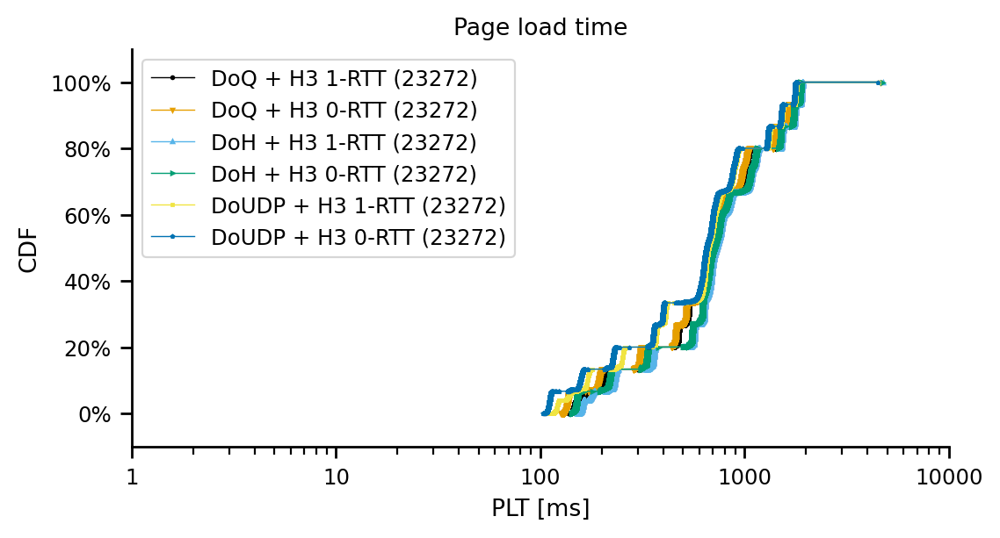

In [1290]:
df_plt = df_dns_and_h3
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.experiment_description == experiment)]
        if len(df_tmp['full_plt']) == 0:
            continue
        print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['full_plt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Page load time')

ax.set_xlabel('PLT [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    7765.000000
mean      339.078963
std       154.410126
min       136.805885
10%       148.117813
20%       171.597364
25%       204.307329
30%       207.136980
40%       216.529054
50%       332.585376
60%       386.045627
70%       473.836436
75%       476.386252
80%       505.058063
90%       531.658445
100%     4651.746547
max      4651.746547
Name: full_plt, dtype: float64
count    7765.000000
mean      322.966896
std       155.187714
min       126.299651
10%       136.346676
20%       149.169768
25%       191.765398
30%       194.484453
40%       207.014951
50%       307.206183
60%       386.806352
70%       460.654229
75%       462.956687
80%       495.065060
90%       518.440205
100%     4607.846547
max      4607.846547
Name: full_plt, dtype: float64
count    7765.000000
mean      389.751206
std       188.577524
min       150.321367
10%       161.686708
20%       185.078614
25%       227.927113
30%       230.624664
40%       240.485034
50%       356.569653
60%       436.

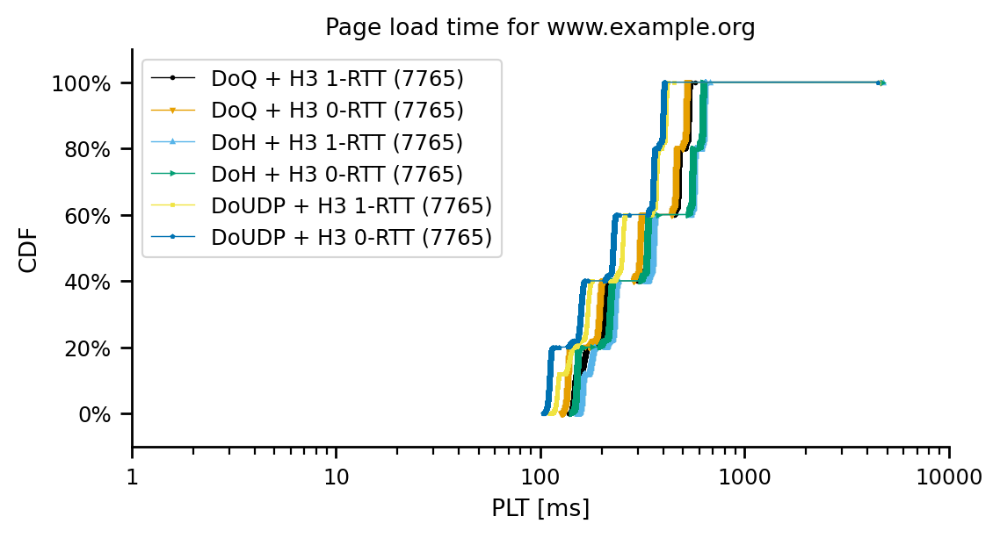

count    7757.000000
mean      833.286207
std       152.077235
min       489.688728
10%       652.333925
20%       672.186057
25%       686.587009
30%       702.109155
40%       733.068696
50%       824.403531
60%       857.761341
70%       976.926394
75%       987.462389
80%       998.746508
90%      1037.385575
100%     1084.483207
max      1084.483207
Name: full_plt, dtype: float64
count    7757.000000
mean      814.148228
std       154.500115
min       481.544257
10%       627.149642
20%       649.668112
25%       669.899634
30%       686.009275
40%       719.776004
50%       798.471396
60%       834.038258
70%       961.539559
75%       972.358088
80%       983.763293
90%      1022.285797
100%     1070.538044
max      1070.538044
Name: full_plt, dtype: float64
count    7757.000000
mean      883.942991
std       187.287916
min       503.114977
10%       666.413037
20%       688.942539
25%       707.802913
30%       725.588388
40%       756.979745
50%       848.750501
60%       893.

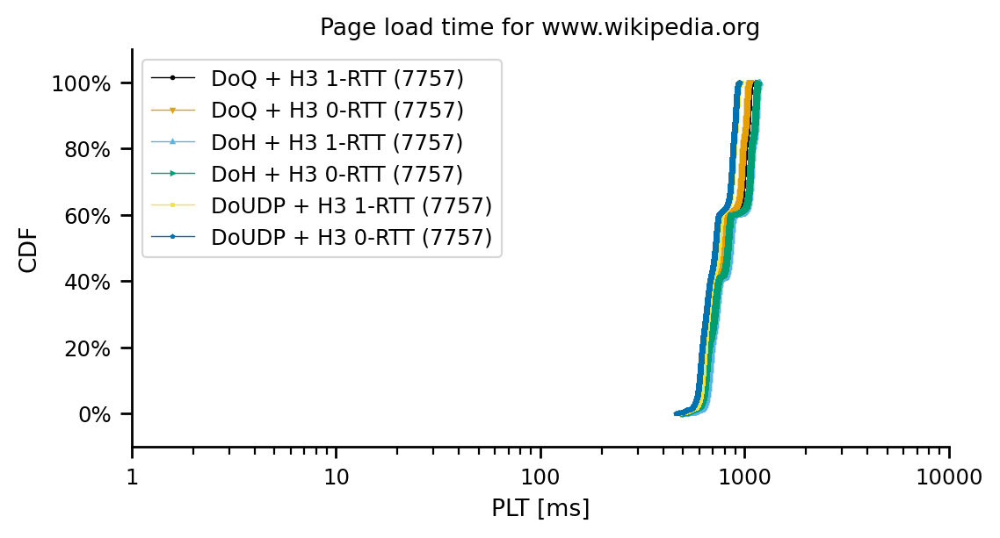

count    7750.000000
mean     1276.590743
std       481.232344
min       641.560480
10%       676.521909
20%       724.060568
25%       740.363499
30%       747.649892
40%      1208.993755
50%      1429.824060
60%      1551.424234
70%      1655.848055
75%      1664.052011
80%      1758.541348
90%      1870.957279
100%     1907.695308
max      1907.695308
Name: full_plt, dtype: float64
count    7750.000000
mean     1253.571956
std       476.640836
min       628.148656
10%       658.829117
20%       708.362530
25%       723.314165
30%       730.559063
40%      1227.946801
50%      1402.581527
60%      1521.026488
70%      1631.669778
75%      1639.387738
80%      1721.527373
90%      1842.852463
100%     1900.527336
max      1900.527336
Name: full_plt, dtype: float64
count    7750.000000
mean     1327.268304
std       501.320875
min       655.805828
10%       690.415849
20%       747.333519
25%       763.671226
30%       771.129974
40%      1272.964209
50%      1520.607812
60%      1645.

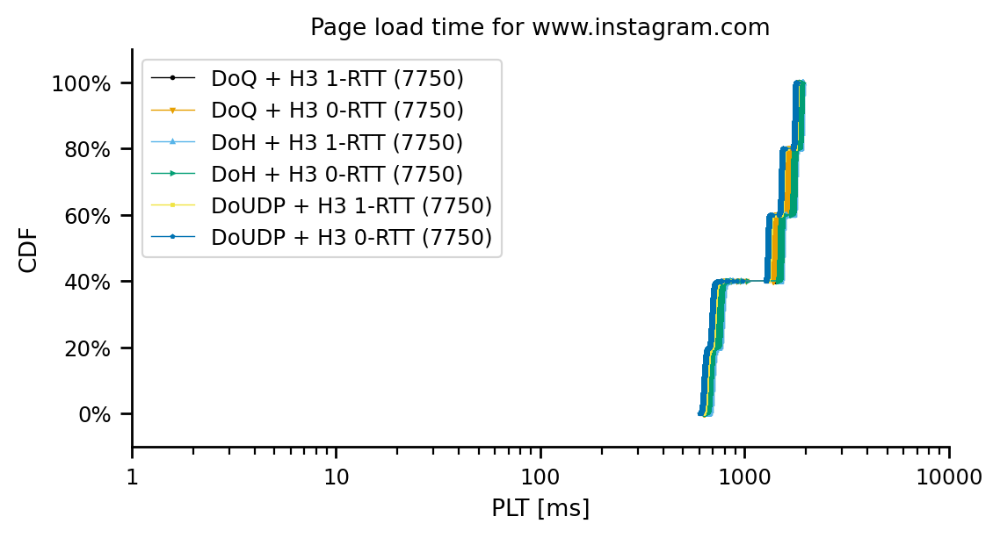

In [1291]:
df_plt = df_dns_and_h3
for website in df_plt['website'].unique():
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=True
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
            if len(df_tmp['full_plt']) == 0:
                continue
            print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['full_plt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Page load time for '+website)

    ax.set_xlabel('PLT [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,10000)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

dsl
count    3830.000000
mean      330.958352
std         6.714938
min       298.076906
10%       318.911673
20%       328.356444
25%       329.655056
30%       330.464607
40%       331.715860
50%       332.680103
60%       333.578897
70%       334.527118
75%       335.119940
80%       335.718031
90%       337.288882
100%      344.586510
max       344.586510
Name: full_plt, dtype: float64
count    3830.000000
mean      306.178430
std         6.040569
min       285.207273
10%       300.416431
20%       304.157540
25%       305.010754
30%       305.551491
40%       306.506047
50%       307.331516
60%       308.195519
70%       309.175816
75%       309.669412
80%       310.287397
90%       311.633267
100%      352.742222
max       352.742222
Name: full_plt, dtype: float64
count    3830.000000
mean      355.041583
std         6.674085
min       323.515540
10%       343.084765
20%       352.604080
25%       353.759413
30%       354.656185
40%       355.793688
50%       356.725618
60%       

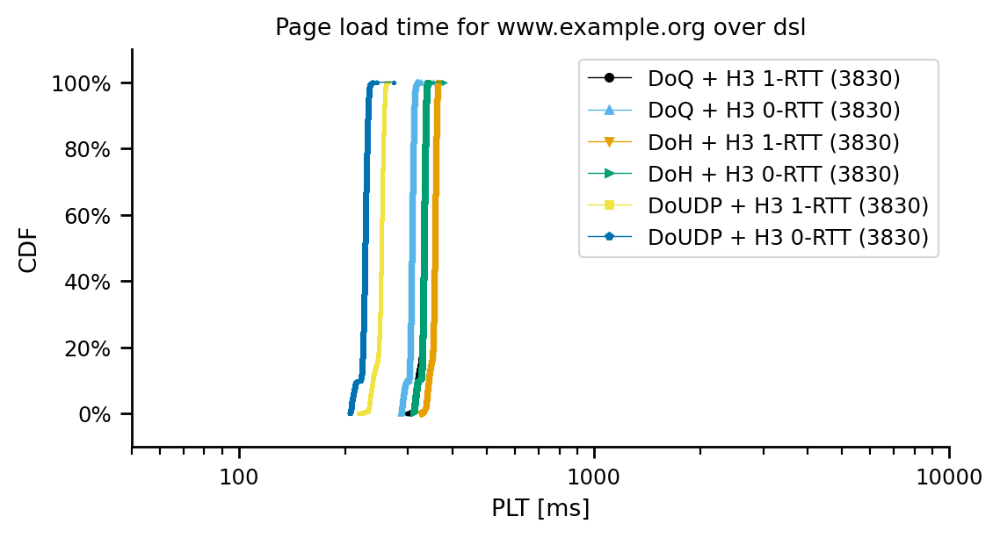

count    3831.000000
mean      818.052945
std        31.581076
min       642.617776
10%       786.014665
20%       803.574677
25%       809.087283
30%       813.417961
40%       819.776138
50%       825.107502
60%       829.896369
70%       834.582347
75%       837.052018
80%       839.520700
90%       845.969494
100%     1087.780496
max      1087.780496
Name: full_plt, dtype: float64
count    3831.000000
mean      791.965553
std        30.812839
min       638.013022
10%       762.142529
20%       778.092739
25%       782.830729
30%       787.025043
40%       793.163326
50%       798.925008
60%       803.580855
70%       807.933660
75%       810.403926
80%       813.078615
90%       819.053644
100%      862.230394
max       862.230394
Name: full_plt, dtype: float64
count    3831.000000
mean      842.126724
std        31.553272
min       667.945980
10%       810.105825
20%       827.749661
25%       833.361772
30%       837.485470
40%       843.727151
50%       849.083338
60%       854.

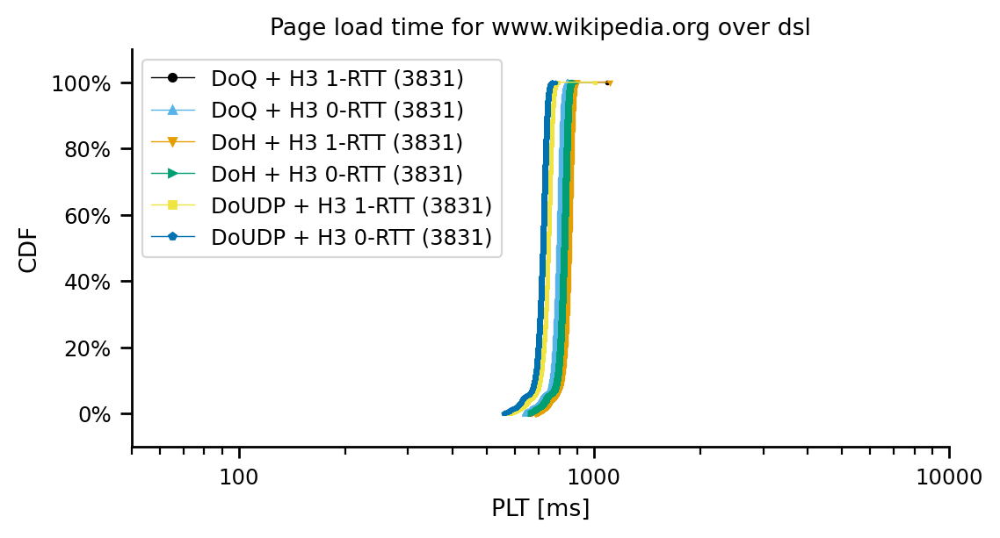

count    3827.000000
mean     1870.018950
std        11.233442
min      1830.802915
10%      1854.368376
20%      1860.482483
25%      1862.752189
30%      1864.885536
40%      1868.359416
50%      1870.960145
60%      1873.573711
70%      1876.277678
75%      1877.702002
80%      1879.439190
90%      1883.561957
100%     1954.207149
max      1954.207149
Name: full_plt, dtype: float64
count    3827.000000
mean     1841.397053
std        11.258418
min      1806.032769
10%      1825.557539
20%      1831.666454
25%      1834.079061
30%      1836.382450
40%      1839.857152
50%      1842.544205
60%      1845.008994
70%      1847.722719
75%      1849.336670
80%      1851.020807
90%      1855.096678
100%     1921.097102
max      1921.097102
Name: full_plt, dtype: float64
count    3827.000000
mean     1894.114023
std        11.210636
min      1856.783662
10%      1878.419279
20%      1884.532458
25%      1886.873364
30%      1889.091593
40%      1892.450049
50%      1895.099906
60%      1897.

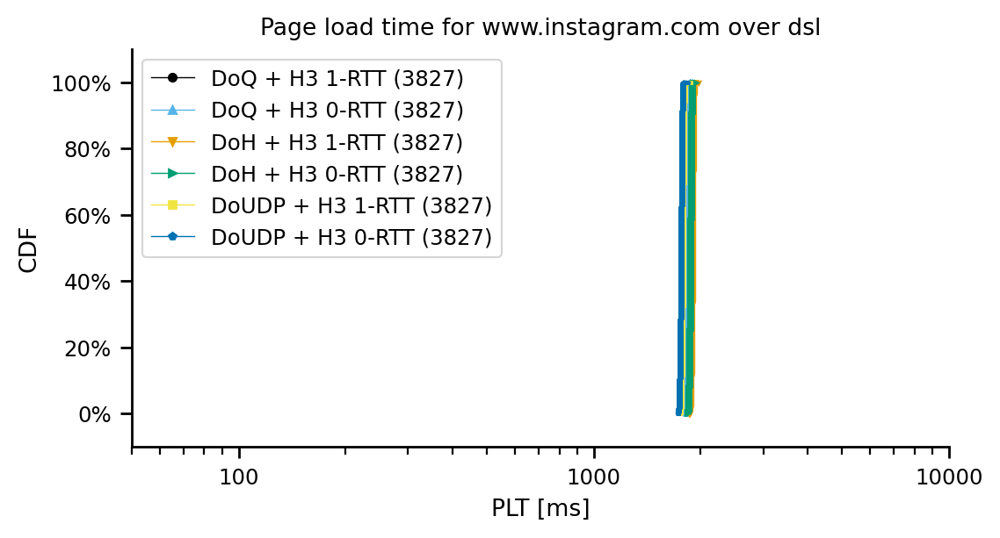

cable
count    3830.000000
mean      205.615666
std         6.287365
min       178.723326
10%       194.661134
20%       203.323666
25%       204.181847
30%       204.890675
40%       206.055613
50%       206.987075
60%       207.959778
70%       208.919906
75%       209.385980
80%       210.038951
90%       211.529910
100%      238.685357
max       238.685357
Name: full_plt, dtype: float64
count    3830.000000
mean      193.149818
std         5.955748
min       171.174946
10%       187.650657
20%       191.094341
25%       191.850742
30%       192.486549
40%       193.549027
50%       194.373953
60%       195.198677
70%       196.157349
75%       196.709753
80%       197.246380
90%       198.668402
100%      207.109985
max       207.109985
Name: full_plt, dtype: float64
count    3830.000000
mean      229.106614
std         6.283906
min       201.829417
10%       218.267363
20%       226.830578
25%       227.727085
30%       228.381759
40%       229.478965
50%       230.507414
60%     

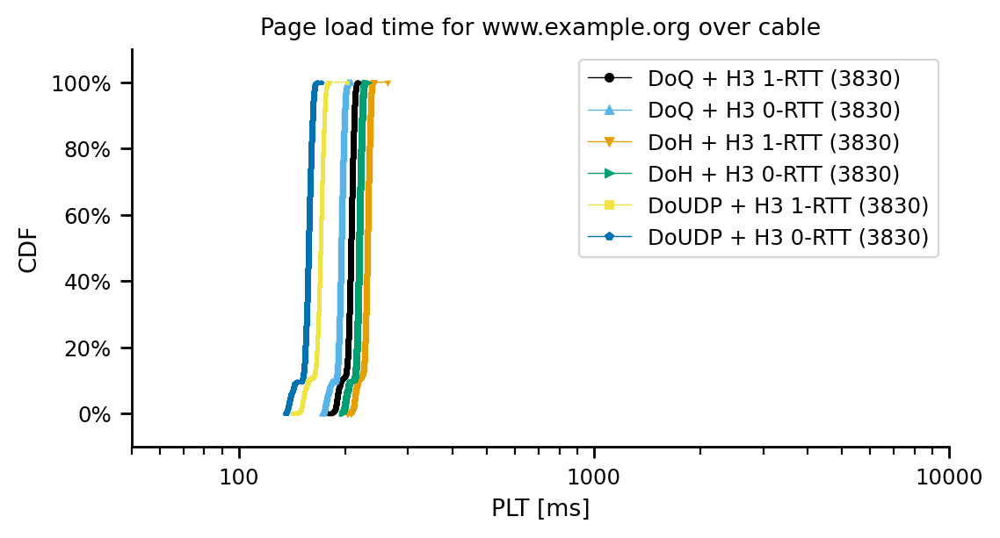

count    3829.000000
mean      695.879100
std        33.592677
min       537.102580
10%       662.079979
20%       679.670845
25%       684.845652
30%       689.798496
40%       697.384873
50%       703.407793
60%       709.097282
70%       714.244319
75%       717.045034
80%       719.899743
90%       726.338244
100%      822.293583
max       822.293583
Name: full_plt, dtype: float64
count    3829.000000
mean      681.394535
std        31.724335
min       519.054141
10%       648.050392
20%       665.334744
25%       669.913099
30%       674.267850
40%       681.149245
50%       686.956833
60%       692.566960
70%       698.255158
75%       701.491313
80%       704.958379
90%       712.405248
100%      739.964317
max       739.964317
Name: full_plt, dtype: float64
count    3829.000000
mean      719.366869
std        33.547347
min       562.805383
10%       685.582058
20%       702.921934
25%       708.572942
30%       713.514629
40%       720.952345
50%       726.995911
60%       732.

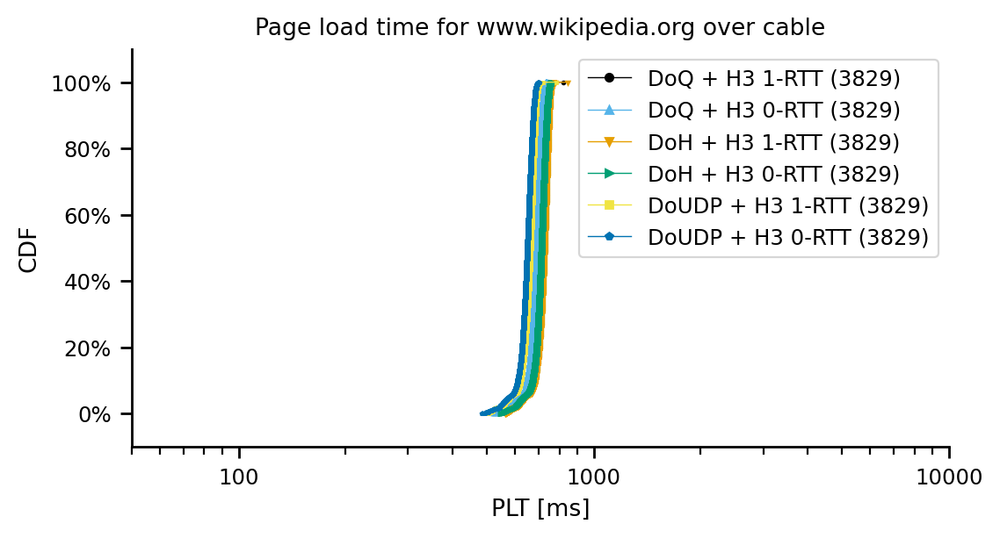

count    3827.000000
mean      748.978564
std        13.347867
min       715.329081
10%       734.748505
20%       738.627136
25%       740.523302
30%       742.006664
40%       745.035599
50%       747.707583
60%       750.648424
70%       753.813781
75%       755.592811
80%       757.905079
90%       764.067910
100%      932.641566
max       932.641566
Name: full_plt, dtype: float64
count    3827.000000
mean      732.049560
std        14.374422
min       699.266574
10%       718.132056
20%       721.618184
25%       723.333621
30%       724.709854
40%       727.959220
50%       730.788334
60%       733.308713
70%       736.525951
75%       738.421979
80%       740.622572
90%       746.700364
100%     1014.191301
max      1014.191301
Name: full_plt, dtype: float64
count    3827.000000
mean      772.479041
std        13.358641
min       738.565316
10%       758.061774
20%       762.176182
25%       763.952952
30%       765.362996
40%       768.527795
50%       771.205803
60%       774.

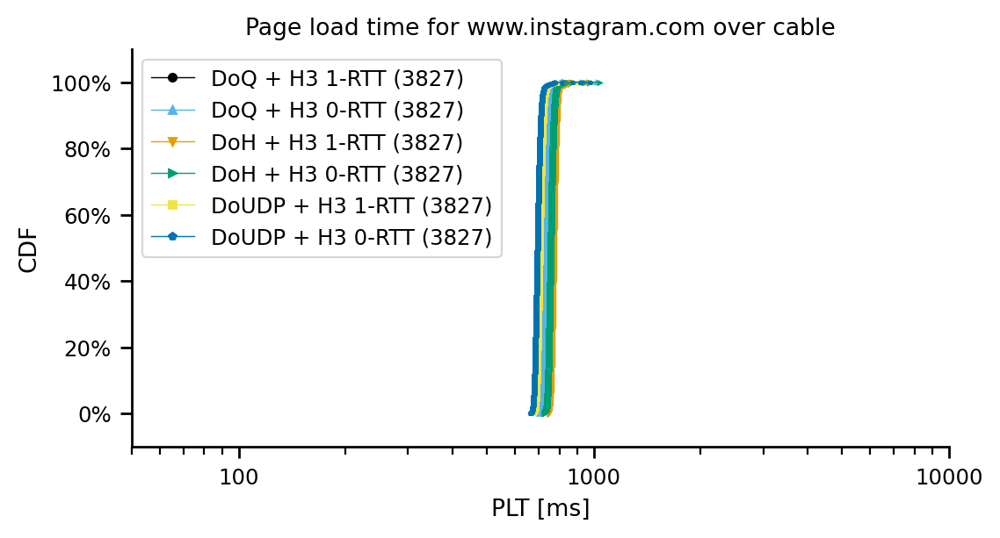

fiber
count    3833.000000
mean      154.306062
std        74.332689
min       135.220040
10%       143.657392
20%       145.306014
25%       145.831657
30%       146.297780
40%       147.198132
50%       148.131888
60%       151.511017
70%       161.676708
75%       162.741877
80%       163.851173
90%       166.247498
100%     4719.548886
max      4719.548886
Name: full_plt, dtype: float64
count    3833.000000
mean      136.091791
std         2.322019
min       126.299651
10%       133.075805
20%       134.466034
25%       134.870595
30%       135.199047
40%       135.857925
50%       136.382219
60%       136.836751
70%       137.342835
75%       137.602306
80%       137.890586
90%       138.557335
100%      166.053557
max       166.053557
Name: full_plt, dtype: float64
count    3833.000000
mean      168.146040
std        74.334237
min       149.135837
10%       157.715707
20%       159.221583
25%       159.684084
30%       160.073167
40%       160.850843
50%       161.706016
60%     

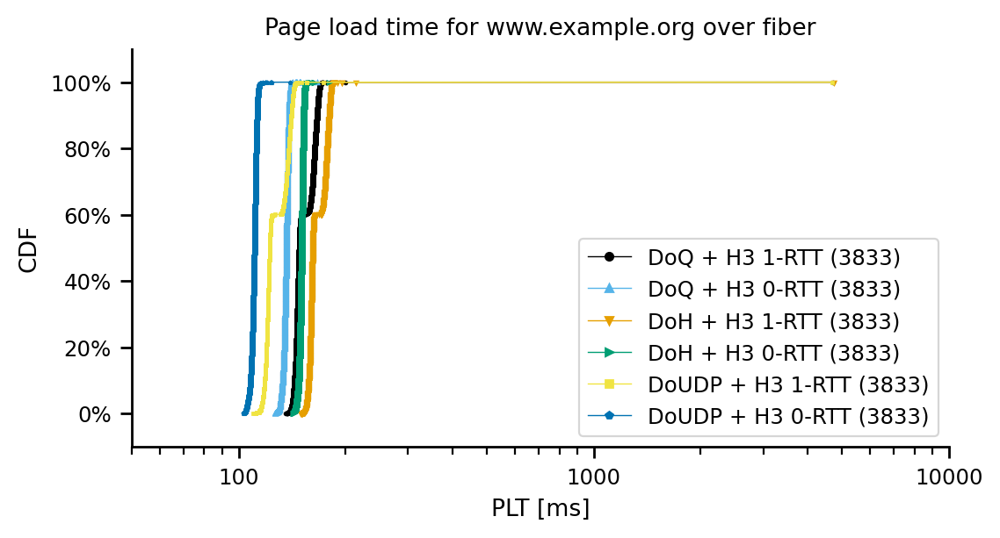

count    3829.000000
mean      648.426339
std        32.598649
min       489.688728
10%       618.144896
20%       635.585219
25%       640.916941
30%       644.695364
40%       650.663764
50%       655.727449
60%       660.403289
70%       665.073040
75%       667.683562
80%       670.121194
90%       676.423240
100%      704.209561
max       704.209561
Name: full_plt, dtype: float64
count    3829.000000
mean      624.618060
std        28.179601
min       476.835601
10%       595.963310
20%       611.989962
25%       616.426513
30%       620.016007
40%       625.462026
50%       630.023134
60%       634.131267
70%       638.645083
75%       641.297036
80%       643.582318
90%       650.537698
100%      684.005465
max       684.005465
Name: full_plt, dtype: float64
count    3829.000000
mean      662.279402
std        32.540892
min       503.114977
10%       631.621602
20%       649.794652
25%       654.801876
30%       658.336147
40%       664.635458
50%       669.803094
60%       674.

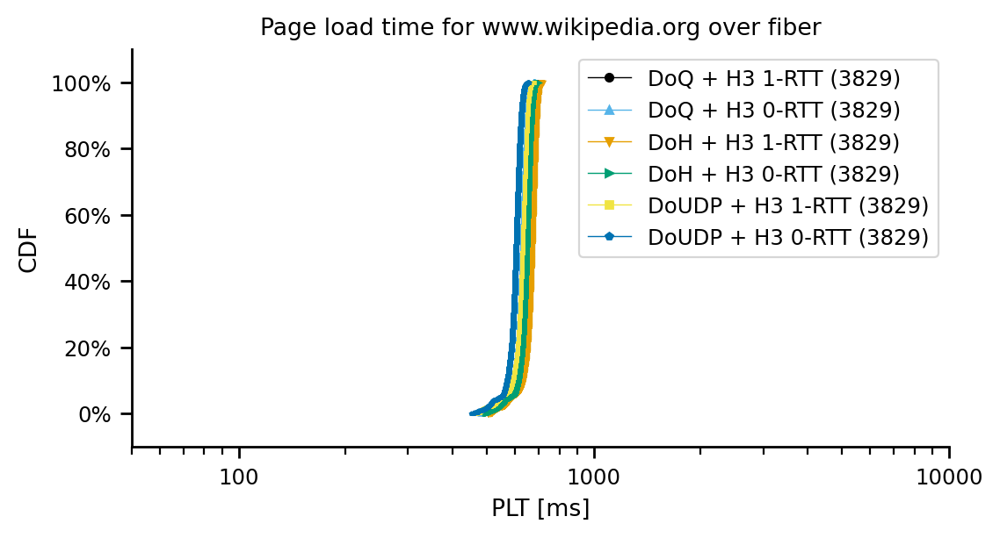

count    3827.000000
mean      677.849821
std        12.875285
min       641.560480
10%       663.863034
20%       668.633946
25%       670.218135
30%       671.660246
40%       674.371777
50%       676.897514
60%       679.590160
70%       682.591476
75%       684.274938
80%       686.528840
90%       691.695340
100%      864.728896
max       864.728896
Name: full_plt, dtype: float64
count    3827.000000
mean      660.382432
std        12.418857
min       628.148656
10%       646.813350
20%       651.147917
25%       652.715965
30%       654.102587
40%       656.555602
50%       659.283485
60%       661.995067
70%       665.266343
75%       667.278343
80%       669.277367
90%       674.475152
100%      861.128896
max       861.128896
Name: full_plt, dtype: float64
count    3827.000000
mean      691.703995
std        12.801386
min       655.805828
10%       677.918301
20%       682.468379
25%       684.135094
30%       685.598960
40%       688.173225
50%       690.676442
60%       693.

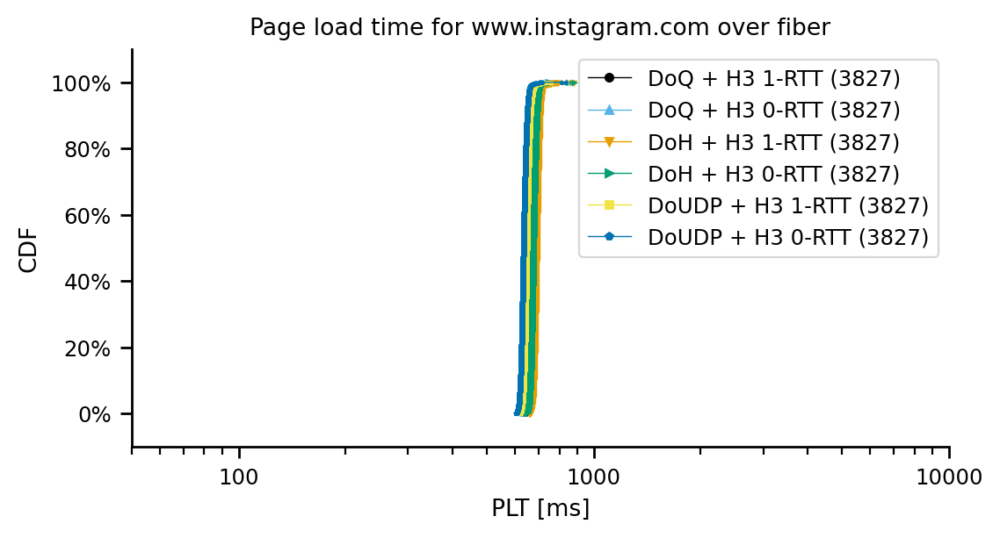

4g
count    3831.000000
mean      473.954393
std        67.784276
min       447.259753
10%       466.449008
20%       470.697846
25%       471.436046
30%       472.150916
40%       473.152312
50%       474.010126
60%       474.871265
70%       475.901637
75%       476.492314
80%       477.137040
90%       478.534471
100%     4651.746547
max      4651.746547
Name: full_plt, dtype: float64
count    3831.000000
mean      460.751157
std        67.274362
min       437.902548
10%       454.470362
20%       457.532354
25%       458.293373
30%       458.930511
40%       459.953749
50%       460.754162
60%       461.683497
70%       462.702186
75%       463.218035
80%       463.802005
90%       465.155469
100%     4607.846547
max      4607.846547
Name: full_plt, dtype: float64
count    3831.000000
mean      564.829521
std        67.760538
min       537.495409
10%       557.620549
20%       561.612401
25%       562.438014
30%       563.039377
40%       564.061864
50%       564.887008
60%       5

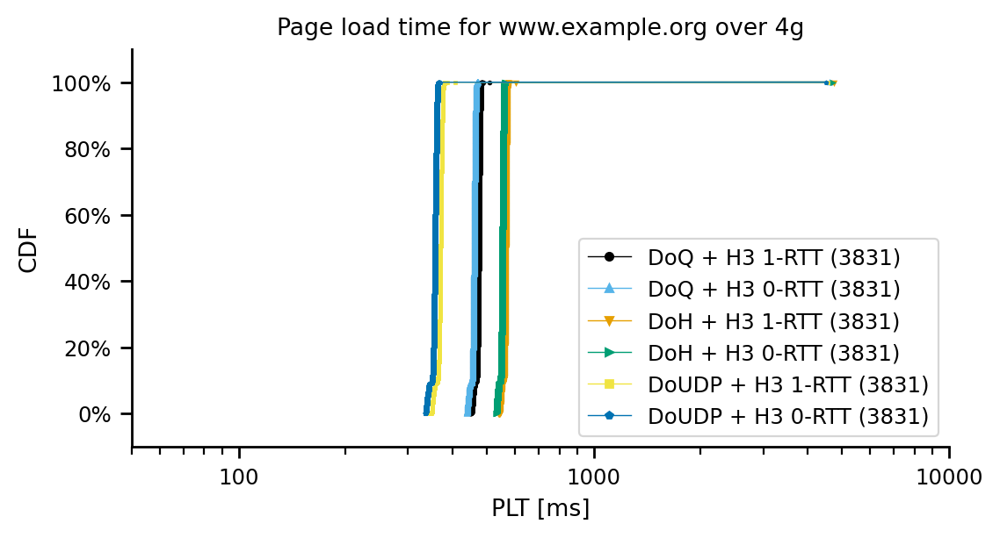

count    3829.000000
mean      972.757885
std        30.056812
min       811.667758
10%       941.071127
20%       959.237987
25%       964.417053
30%       968.377934
40%       974.611361
50%       980.360904
60%       984.641993
70%       988.814341
75%       990.748839
80%       993.214738
90%       998.789144
100%     1039.573242
max      1039.573242
Name: full_plt, dtype: float64
count    3829.000000
mean      958.001996
std        29.019505
min       795.080434
10%       927.156159
20%       944.457591
25%       948.973041
30%       953.410989
40%       959.556781
50%       965.007256
60%       969.491930
70%       973.450983
75%       975.761047
80%       977.945312
90%       983.577626
100%     1025.739919
max      1025.739919
Name: full_plt, dtype: float64
count    3829.000000
mean     1063.654697
std        30.022273
min       902.773703
10%      1032.096220
20%      1050.007783
25%      1055.264255
30%      1059.210598
40%      1065.363788
50%      1071.219346
60%      1075.

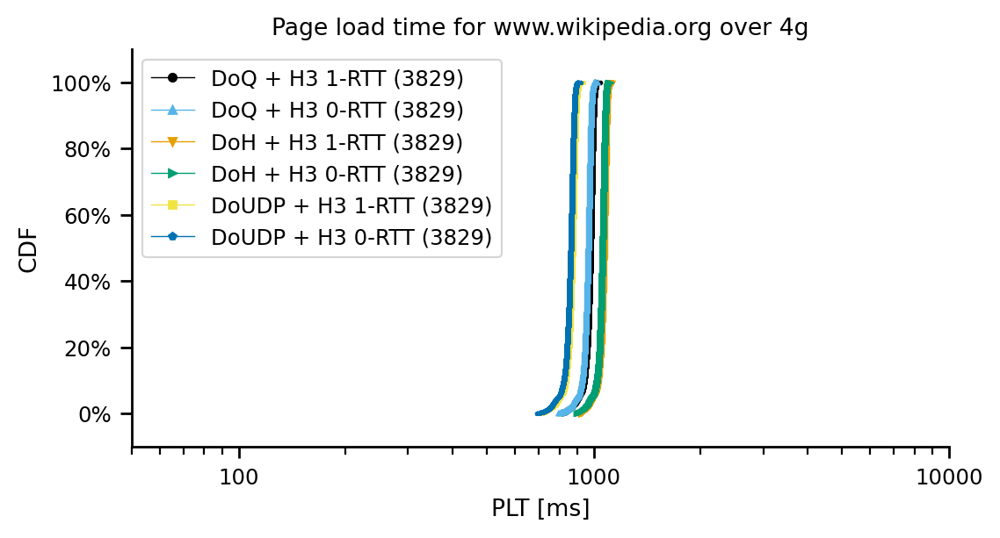

count    3827.000000
mean     1430.182642
std        12.703067
min      1389.860440
10%      1414.823269
20%      1419.657253
25%      1421.461283
30%      1423.082860
40%      1426.251264
50%      1429.716722
60%      1432.818118
70%      1436.162308
75%      1438.223582
80%      1440.390652
90%      1446.433197
100%     1516.388444
max      1516.388444
Name: full_plt, dtype: float64
count    3827.000000
mean     1402.813084
std        11.004603
min      1368.190884
10%      1389.366854
20%      1393.628449
25%      1395.650872
30%      1397.134240
40%      1399.891271
50%      1402.390303
60%      1404.895596
70%      1407.929237
75%      1409.564571
80%      1411.346368
90%      1416.523237
100%     1487.249447
max      1487.249447
Name: full_plt, dtype: float64
count    3827.000000
mean     1521.068371
std        12.710082
min      1482.778769
10%      1505.651676
20%      1510.523416
25%      1512.272990
30%      1513.867983
40%      1517.190345
50%      1520.564258
60%      1523.

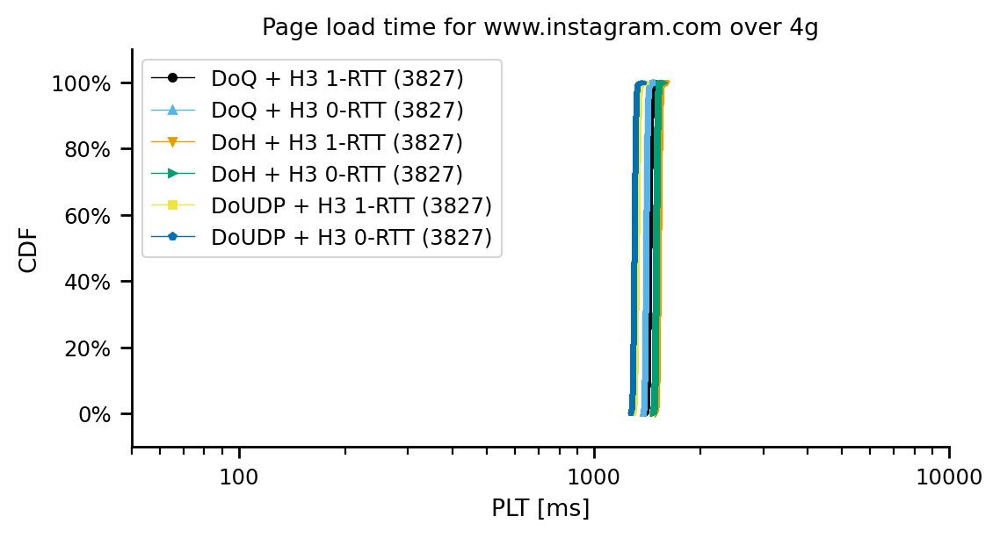

4g-medium
count    3830.000000
mean      531.699972
std        69.950093
min       504.143171
10%       524.322141
20%       528.465907
25%       529.244619
30%       529.923772
40%       530.936228
50%       531.737583
60%       532.579102
70%       533.667605
75%       534.205307
80%       534.800205
90%       536.117399
100%     4843.458232
max      4843.458232
Name: full_plt, dtype: float64
count    3830.000000
mean      518.342975
std        56.862841
min       494.715613
10%       512.667608
20%       515.442853
25%       516.186398
30%       516.761936
40%       517.636933
50%       518.497527
60%       519.382229
70%       520.420683
75%       520.909537
80%       521.553854
90%       522.864511
100%     4017.658232
max      4017.658232
Name: full_plt, dtype: float64
count    3830.000000
mean      632.693611
std        69.953403
min       604.995481
10%       625.611667
20%       629.446106
25%       630.287897
30%       630.917748
40%       631.876524
50%       632.706966
60% 

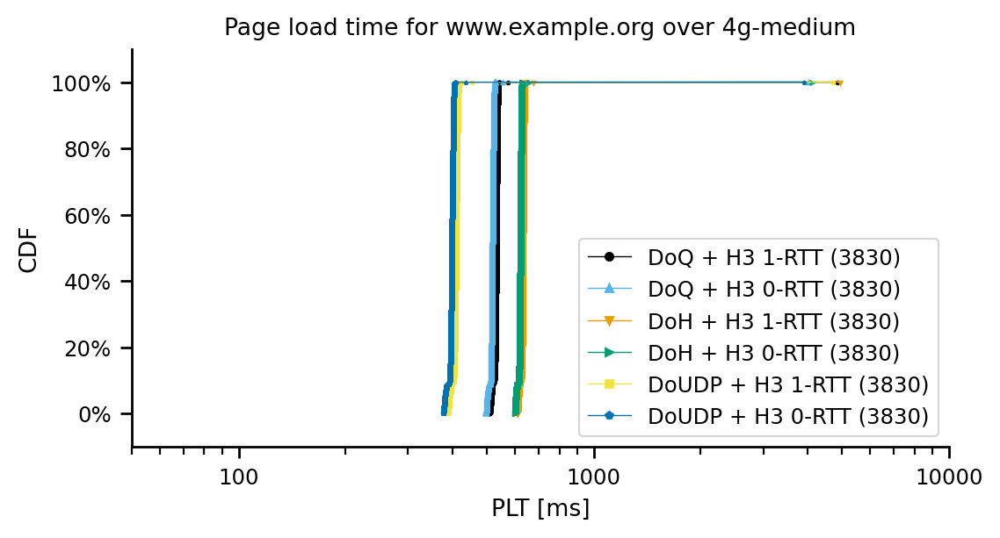

count    3829.000000
mean     1030.263457
std        31.929017
min       865.206574
10%       998.068181
20%      1017.687635
25%      1023.017285
30%      1026.912985
40%      1033.102887
50%      1038.376603
60%      1042.342916
70%      1046.436656
75%      1048.490925
80%      1050.739779
90%      1057.839511
100%     1084.483207
max      1084.483207
Name: full_plt, dtype: float64
count    3829.000000
mean     1016.333423
std        29.481188
min       836.533495
10%       986.309666
20%      1003.390620
25%      1009.094348
30%      1012.870409
40%      1018.736152
50%      1023.002990
60%      1027.080196
70%      1030.976027
75%      1033.130339
80%      1035.458636
90%      1041.430308
100%     1070.538044
max      1070.538044
Name: full_plt, dtype: float64
count    3829.000000
mean     1131.268446
std        31.887793
min       967.546796
10%      1098.791373
20%      1118.419045
25%      1123.724419
30%      1127.898068
40%      1134.032553
50%      1139.344594
60%      1143.

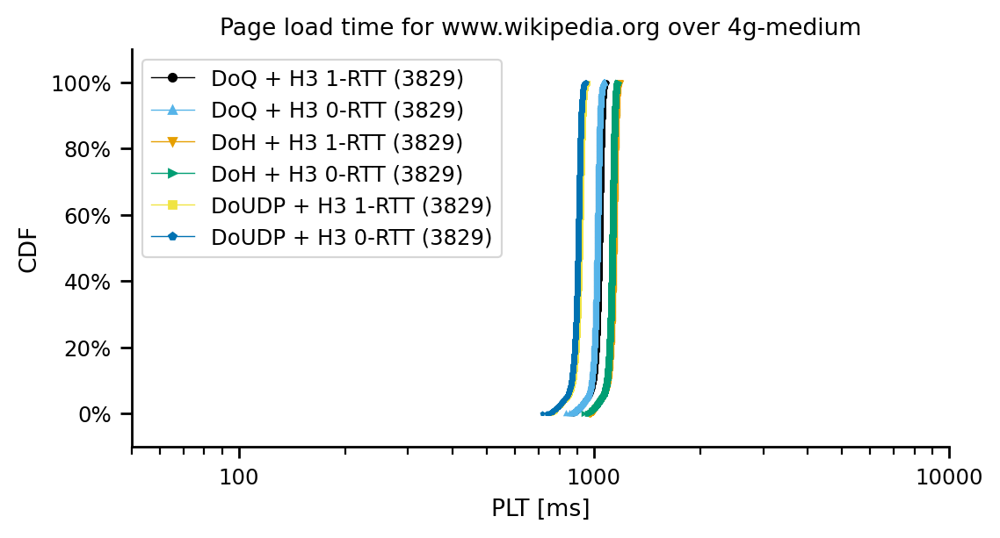

count    3827.000000
mean     1657.149746
std        65.089197
min      1616.652874
10%      1640.700246
20%      1646.038809
25%      1647.959511
30%      1649.918364
40%      1653.104300
50%      1656.154622
60%      1659.174405
70%      1662.184073
75%      1664.170173
80%      1666.066821
90%      1671.699807
100%     5610.916039
max      5610.916039
Name: full_plt, dtype: float64
count    3827.000000
mean     1631.225811
std        11.926608
min      1591.423345
10%      1615.894419
20%      1621.355595
25%      1623.359029
30%      1625.144515
40%      1628.267609
50%      1631.193149
60%      1634.312672
70%      1637.625074
75%      1639.277024
80%      1641.351046
90%      1646.586822
100%     1700.401024
max      1700.401024
Name: full_plt, dtype: float64
count    3827.000000
mean     1758.145062
std        65.082366
min      1717.783047
10%      1741.756956
20%      1746.910227
25%      1748.975711
30%      1750.985145
40%      1754.126951
50%      1757.174645
60%      1760.

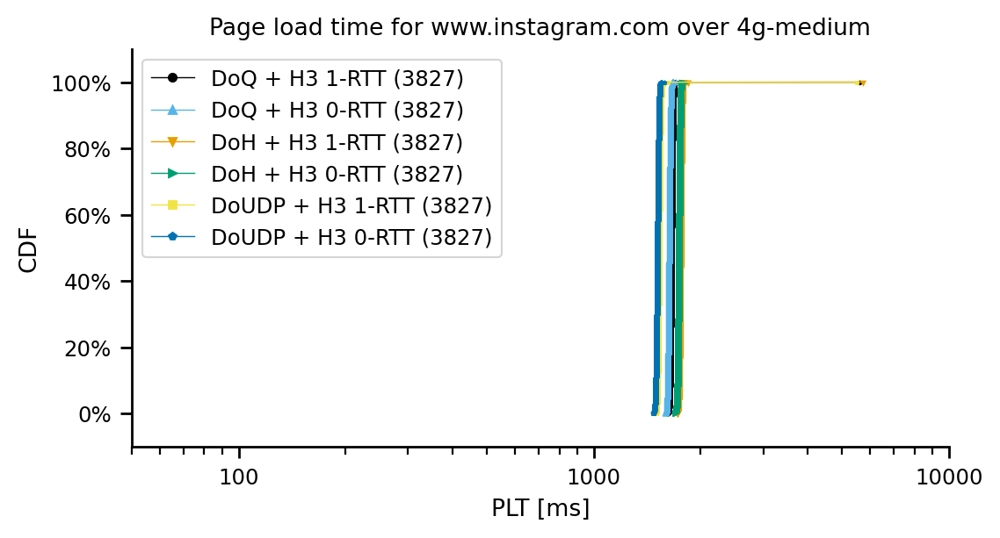

dsl


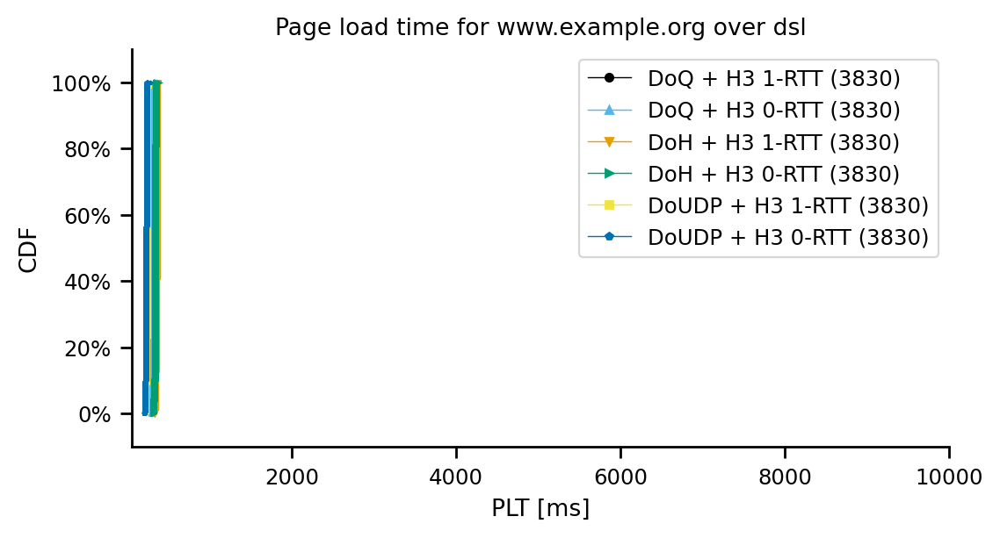

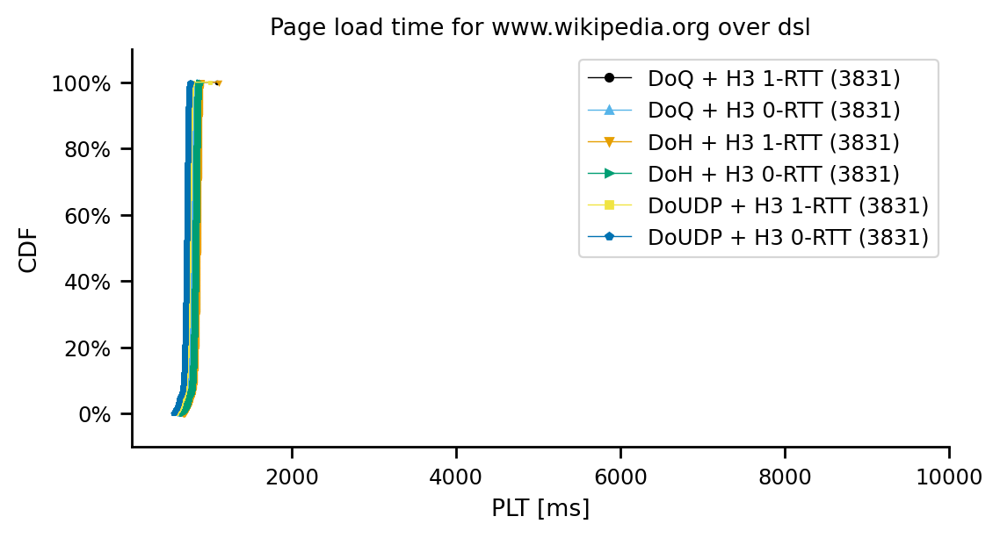

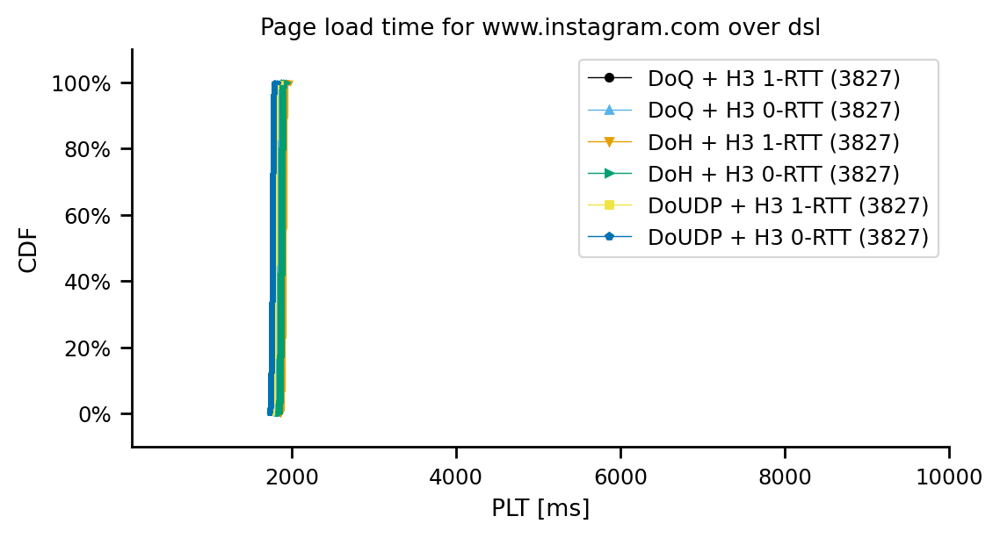

cable


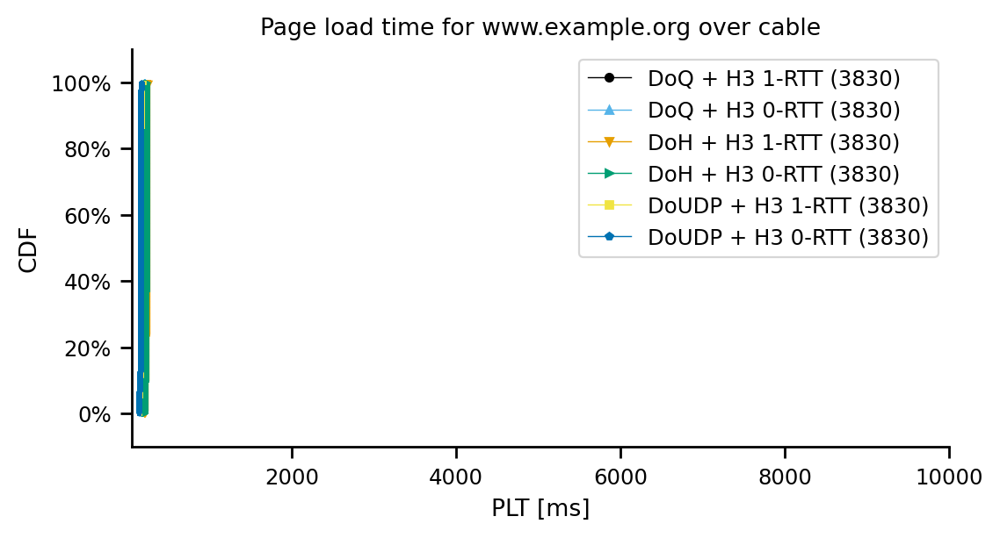

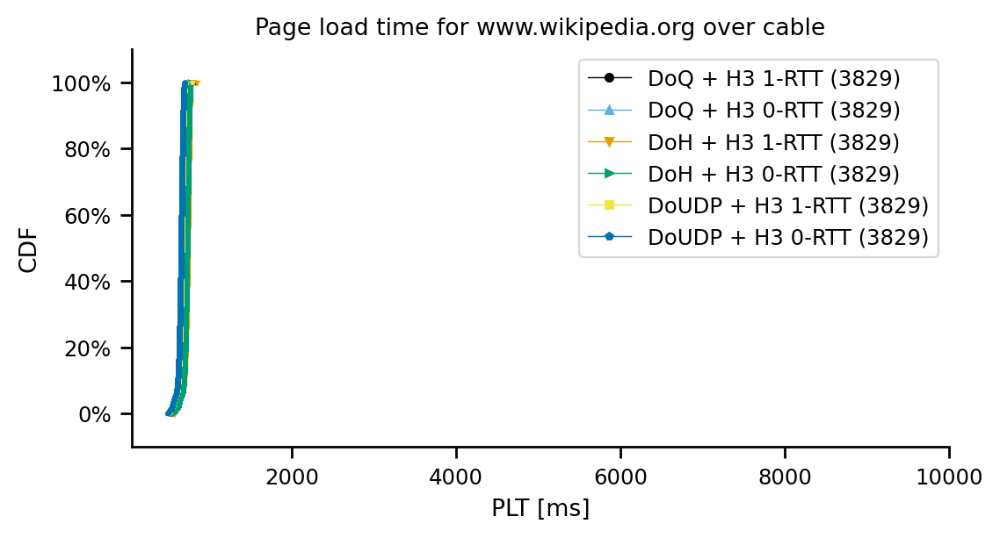

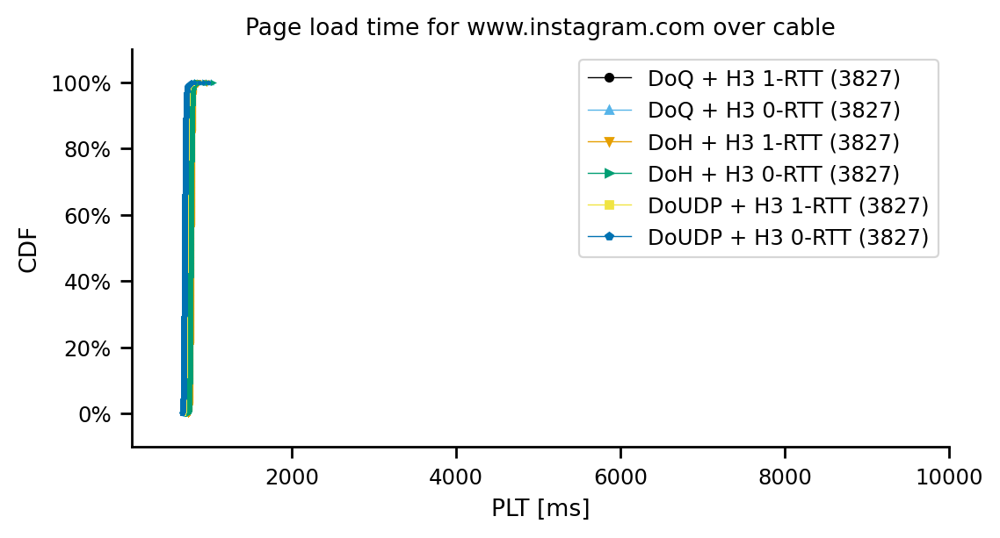

fiber


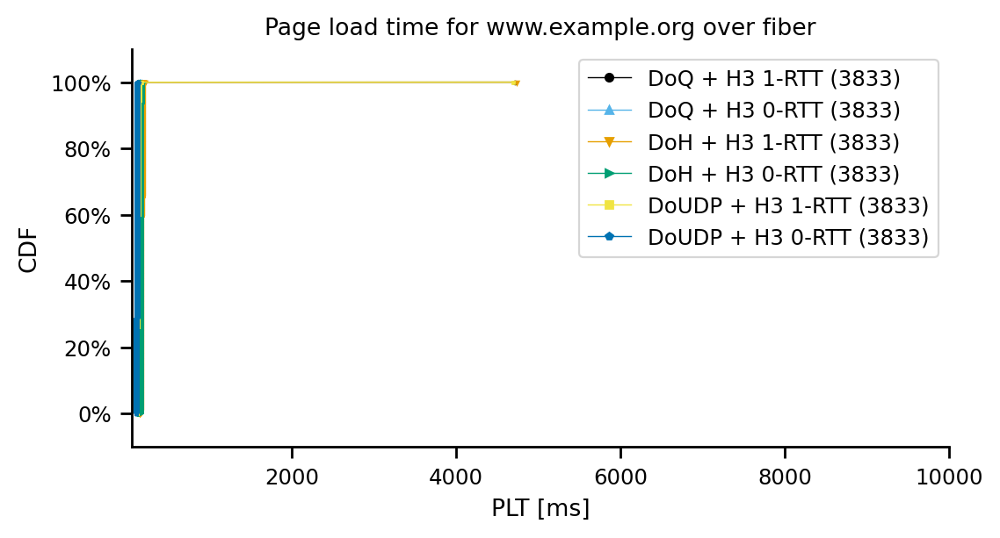

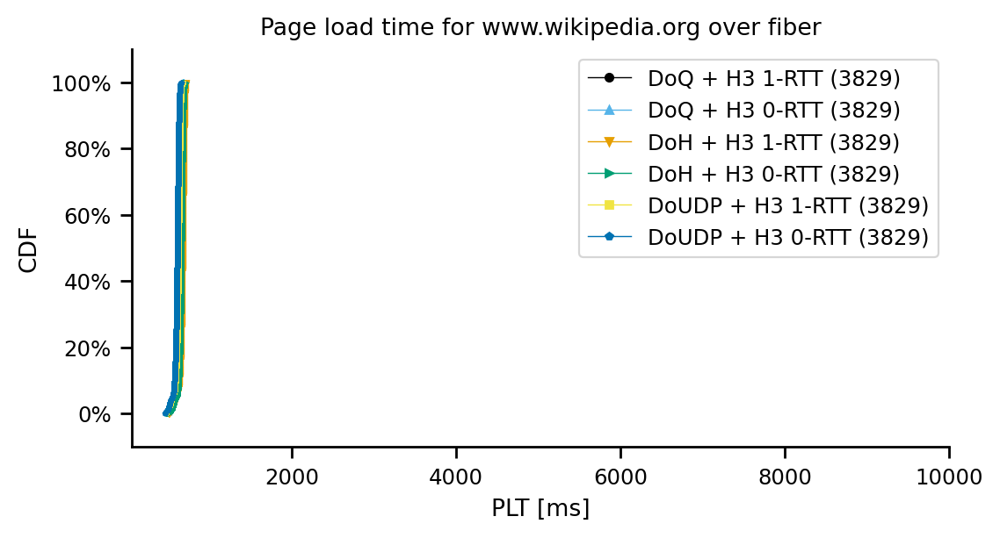

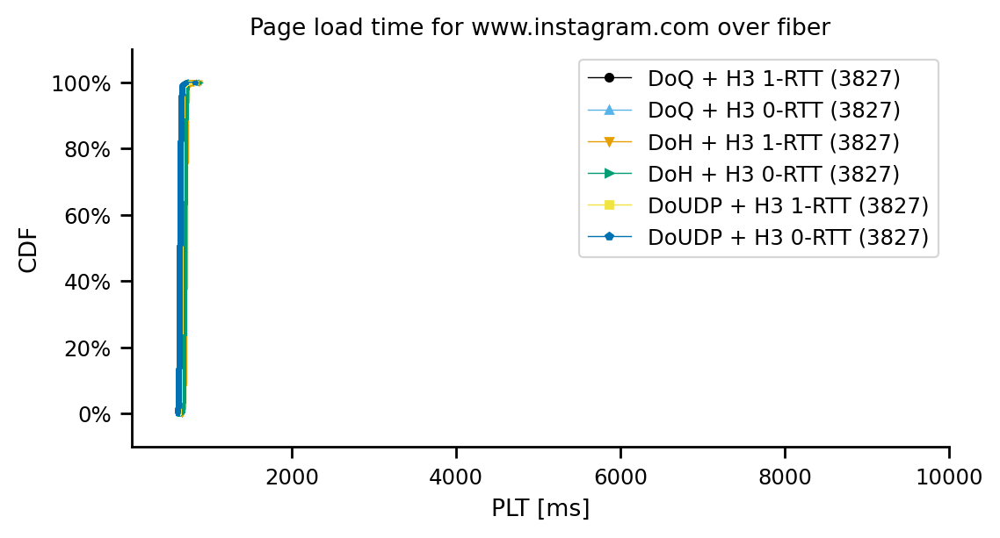

4g


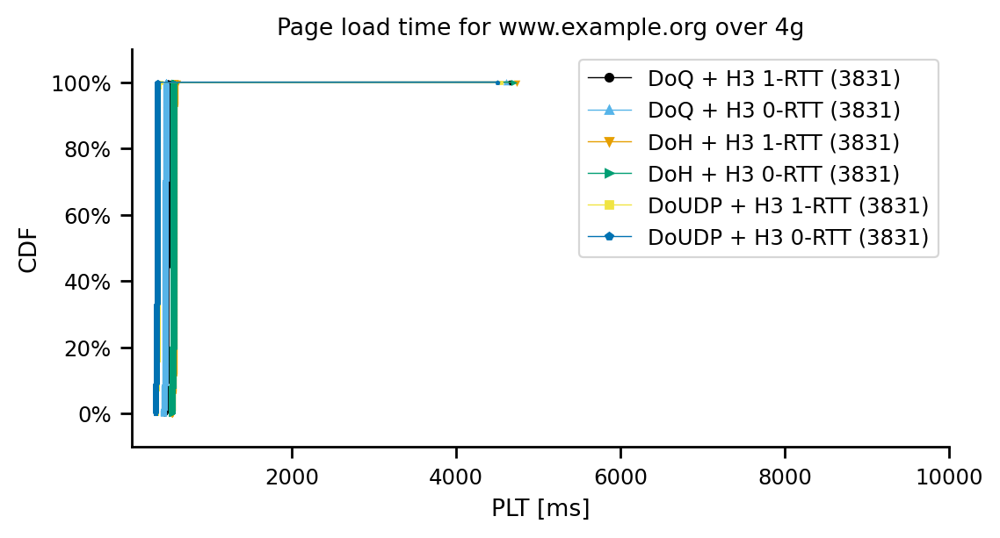

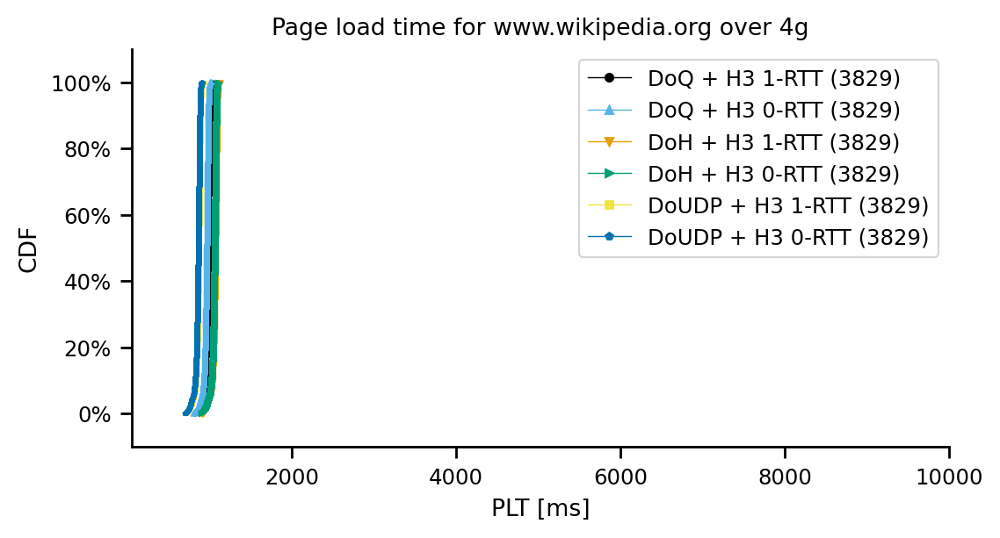

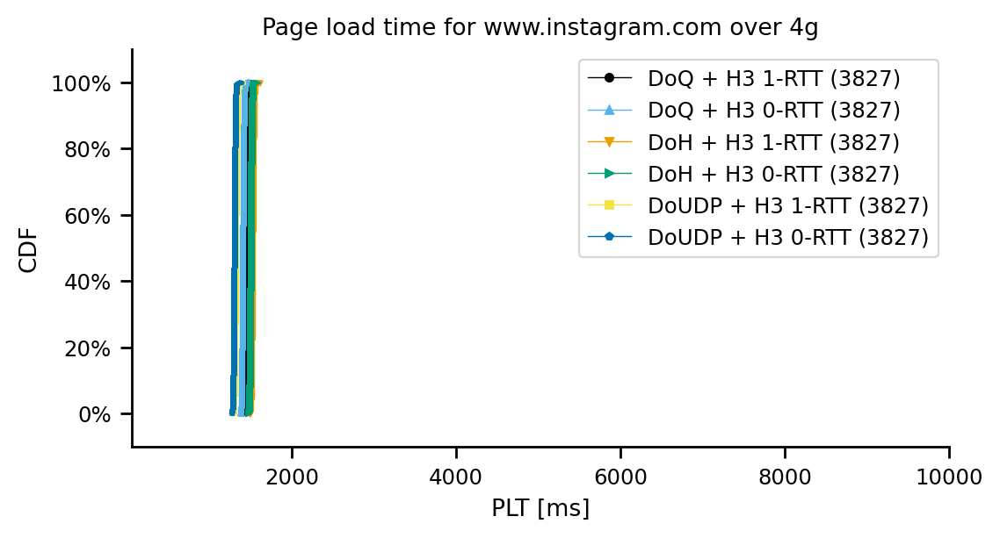

4g-medium


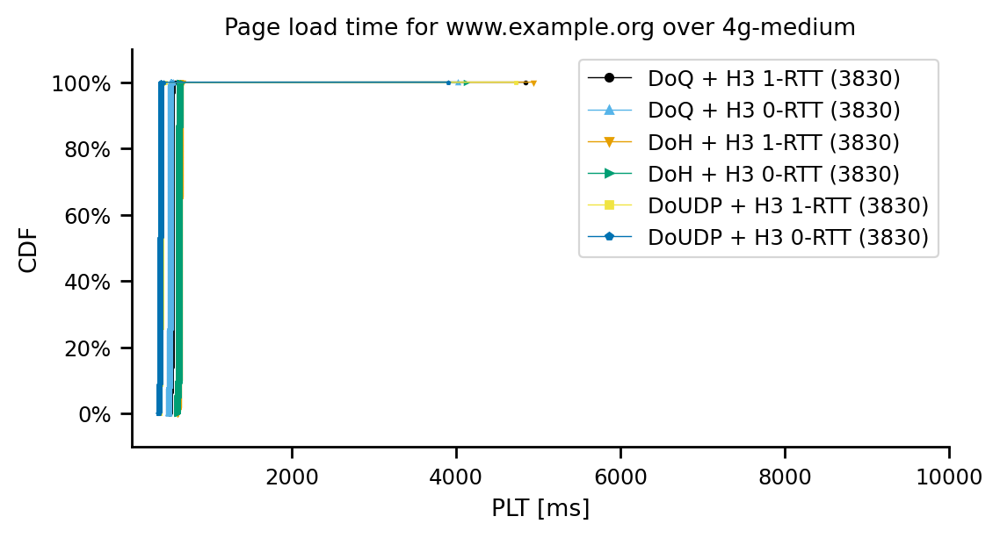

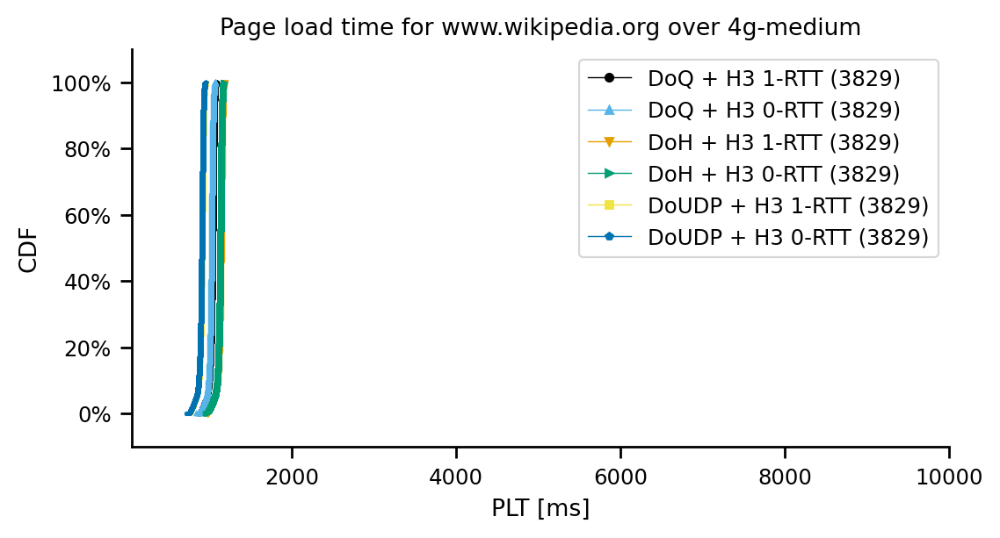

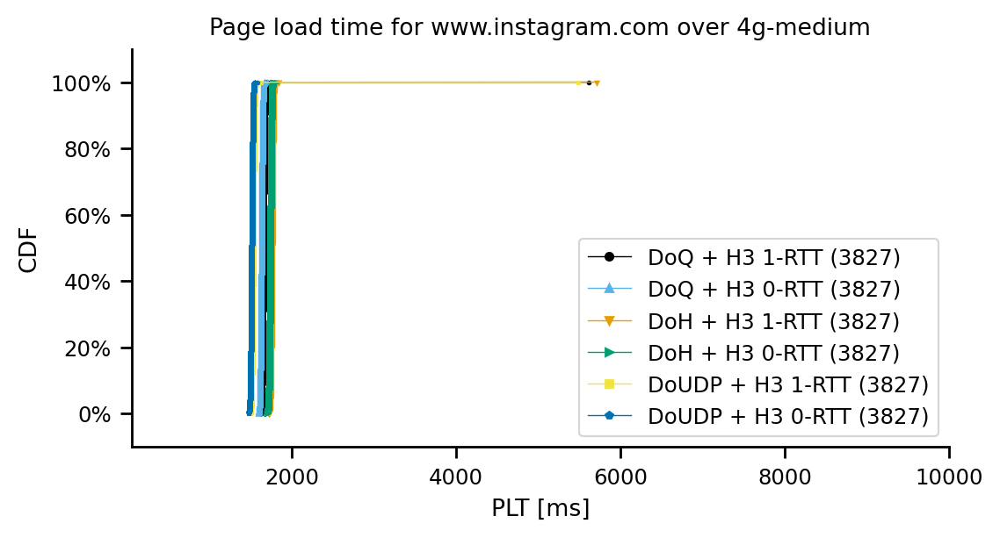

In [72]:
for log in [True, False]:
    for access_technology in df_dns_and_h3.experiment_type.unique():
        print(access_technology)
        df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
        for website in df_plt['website'].unique():
            fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
            line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
            color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
            colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
            markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))

            lnwidth = 0.5
            mrksize = 1
            #log=True
            for experiment in line_order:
                    df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                    if len(df_tmp['full_plt']) == 0:
                        continue
                    if log:
                        print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                    dfplt = make_cdf(df_tmp['full_plt'])
                    dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

            ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

            ax.spines['right'].set_color('none')
            ax.spines['top'].set_color('none')
            ax.yaxis.set_ticks_position('left')
            ax.xaxis.set_ticks_position('bottom')
            ax.spines['bottom'].set_position(('axes', -0.0))
            ax.spines['left'].set_position(('axes', -0.0))
            if log:
                ax.set_xscale('log')


            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
            ax.tick_params(axis='x', which='minor', labelsize=6)
            ax.xaxis.set_tick_params(labelbottom=True, which='both')


            ax.set_title('Page load time for '+website+' over '+access_technology)

            ax.set_xlabel('PLT [ms]')

            ax.set_ylabel("CDF")
            ax.set_ylim(-0.1,1.1)
            ax.set_xlim(50,10000)


            ax.legend(markerscale=3)

            if log:
                fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'-log.pdf', format='pdf', bbox_inches='tight')
            else:
                fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'.pdf', format='pdf', bbox_inches='tight')
            plt.show()

fiber
DoQ + H3 1-RTT
count    3833.000000
mean      154.306062
std        74.332689
min       135.220040
10%       143.657392
20%       145.306014
25%       145.831657
30%       146.297780
40%       147.198132
50%       148.131888
60%       151.511017
70%       161.676708
75%       162.741877
80%       163.851173
90%       166.247498
max      4719.548886
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3833.000000
mean      136.091791
std         2.322019
min       126.299651
10%       133.075805
20%       134.466034
25%       134.870595
30%       135.199047
40%       135.857925
50%       136.382219
60%       136.836751
70%       137.342835
75%       137.602306
80%       137.890586
90%       138.557335
max       166.053557
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3833.000000
mean      168.146040
std        74.334237
min       149.135837
10%       157.715707
20%       159.221583
25%       159.684084
30%       160.073167
40%       160.850843
50%       161.706016
60%  

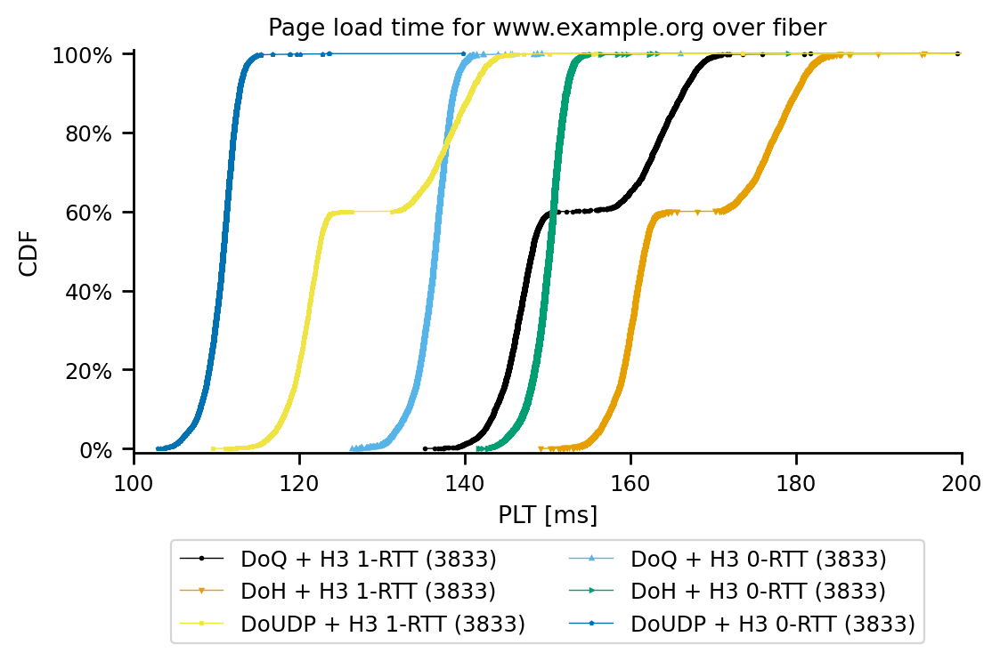

cable
DoQ + H3 1-RTT
count    3830.000000
mean      205.615666
std         6.287365
min       178.723326
10%       194.661134
20%       203.323666
25%       204.181847
30%       204.890675
40%       206.055613
50%       206.987075
60%       207.959778
70%       208.919906
75%       209.385980
80%       210.038951
90%       211.529910
max       238.685357
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3830.000000
mean      193.149818
std         5.955748
min       171.174946
10%       187.650657
20%       191.094341
25%       191.850742
30%       192.486549
40%       193.549027
50%       194.373953
60%       195.198677
70%       196.157349
75%       196.709753
80%       197.246380
90%       198.668402
max       207.109985
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3830.000000
mean      229.106614
std         6.283906
min       201.829417
10%       218.267363
20%       226.830578
25%       227.727085
30%       228.381759
40%       229.478965
50%       230.507414
60%  

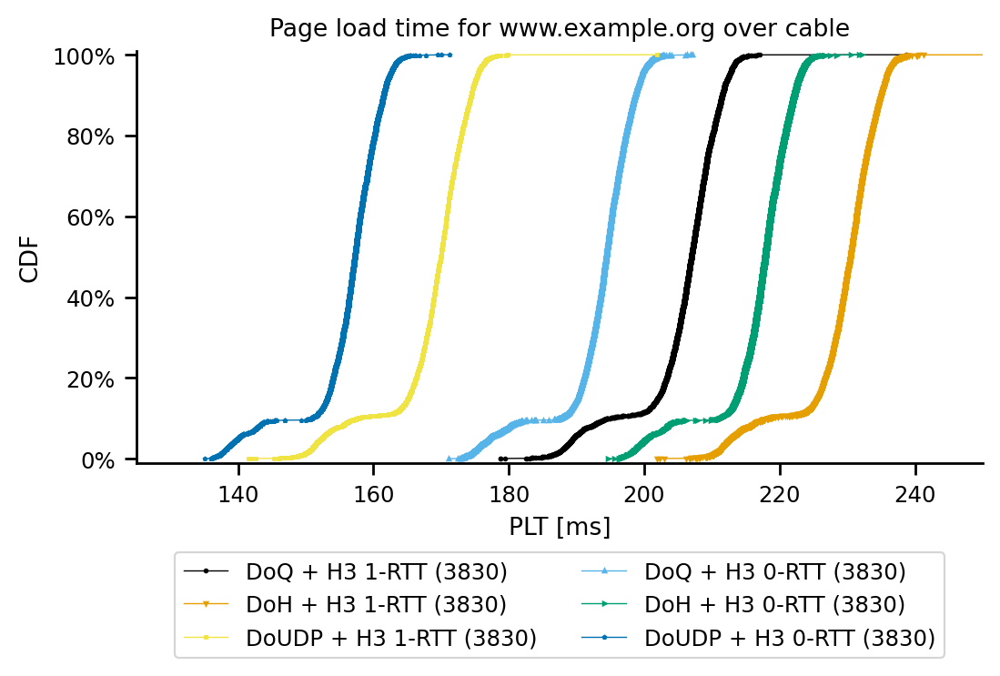

dsl
DoQ + H3 1-RTT
count    3830.000000
mean      330.958352
std         6.714938
min       298.076906
10%       318.911673
20%       328.356444
25%       329.655056
30%       330.464607
40%       331.715860
50%       332.680103
60%       333.578897
70%       334.527118
75%       335.119940
80%       335.718031
90%       337.288882
max       344.586510
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3830.000000
mean      306.178430
std         6.040569
min       285.207273
10%       300.416431
20%       304.157540
25%       305.010754
30%       305.551491
40%       306.506047
50%       307.331516
60%       308.195519
70%       309.175816
75%       309.669412
80%       310.287397
90%       311.633267
max       352.742222
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3830.000000
mean      355.041583
std         6.674085
min       323.515540
10%       343.084765
20%       352.604080
25%       353.759413
30%       354.656185
40%       355.793688
50%       356.725618
60%    

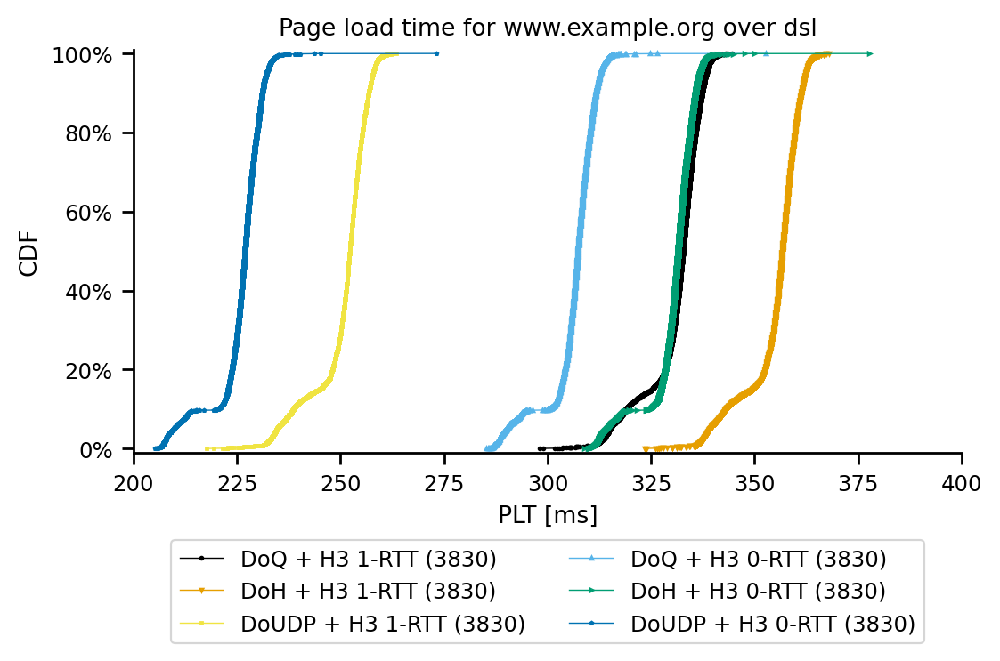

4g
DoQ + H3 1-RTT
count    3831.000000
mean      473.954393
std        67.784276
min       447.259753
10%       466.449008
20%       470.697846
25%       471.436046
30%       472.150916
40%       473.152312
50%       474.010126
60%       474.871265
70%       475.901637
75%       476.492314
80%       477.137040
90%       478.534471
max      4651.746547
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3831.000000
mean      460.751157
std        67.274362
min       437.902548
10%       454.470362
20%       457.532354
25%       458.293373
30%       458.930511
40%       459.953749
50%       460.754162
60%       461.683497
70%       462.702186
75%       463.218035
80%       463.802005
90%       465.155469
max      4607.846547
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3831.000000
mean      564.829521
std        67.760538
min       537.495409
10%       557.620549
20%       561.612401
25%       562.438014
30%       563.039377
40%       564.061864
50%       564.887008
60%     

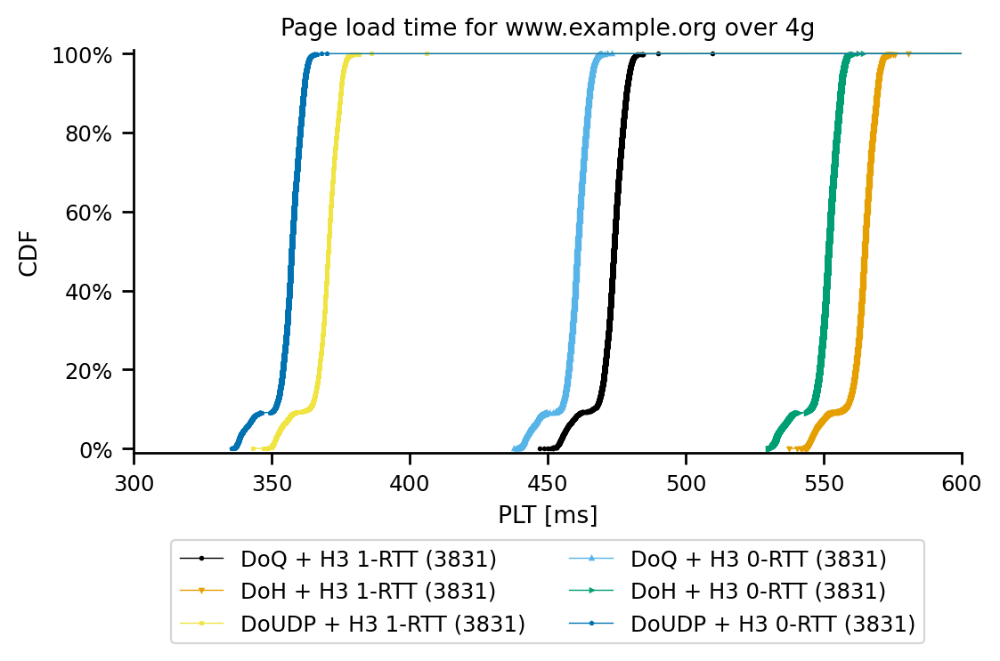

4g-medium
DoQ + H3 1-RTT
count    3830.000000
mean      531.699972
std        69.950093
min       504.143171
10%       524.322141
20%       528.465907
25%       529.244619
30%       529.923772
40%       530.936228
50%       531.737583
60%       532.579102
70%       533.667605
75%       534.205307
80%       534.800205
90%       536.117399
max      4843.458232
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3830.000000
mean      518.342975
std        56.862841
min       494.715613
10%       512.667608
20%       515.442853
25%       516.186398
30%       516.761936
40%       517.636933
50%       518.497527
60%       519.382229
70%       520.420683
75%       520.909537
80%       521.553854
90%       522.864511
max      4017.658232
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3830.000000
mean      632.693611
std        69.953403
min       604.995481
10%       625.611667
20%       629.446106
25%       630.287897
30%       630.917748
40%       631.876524
50%       632.706966
6

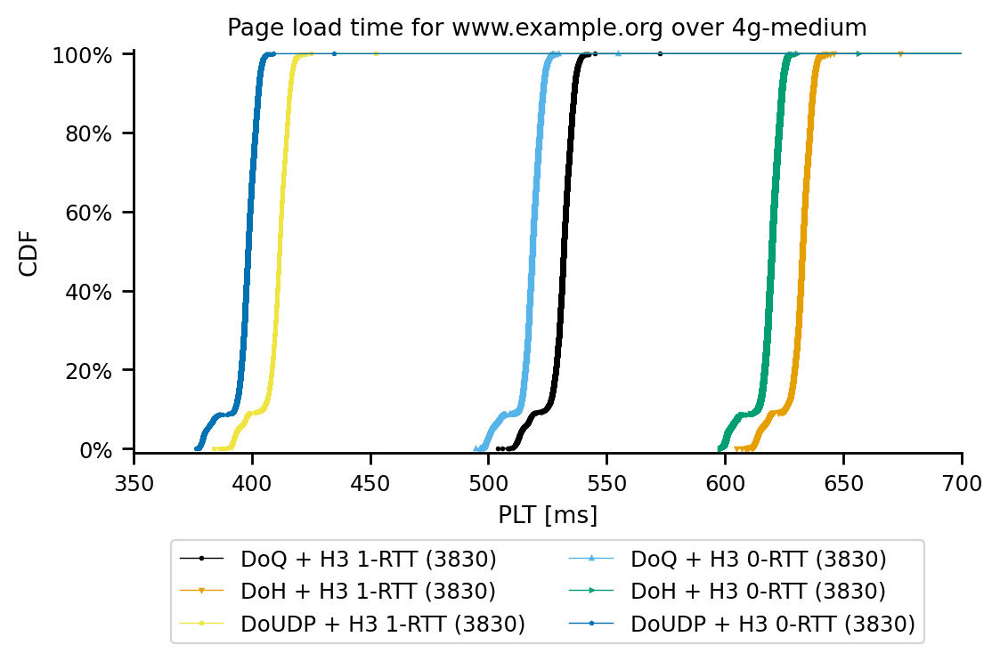

In [262]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    value_ranges = {'fiber':[100,200], 'cable':[125,250], 'dsl':[200,400], '4g':[300,600], '4g-medium':[350,700]}
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.example.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                print(experiment)
                print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+access_technology)

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.01,1.01)
        #ax.set_xlim(1,700)
        ax.set_xlim(*value_ranges[access_technology])
        
        handles, labels = plt.gca().get_legend_handles_labels()
        order = [0,2,4,1,3,5]
        plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], loc='lower center',bbox_to_anchor=(0.5,-0.5),ncol=2)


        #ax.legend(loc='lower center',bbox_to_anchor=(0.5,-0.5),ncol=2)

        if log:
            fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'-log.pdf', format='pdf', bbox_inches='tight')
        else:
            fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber
DoQ + H3 1-RTT
count    3829.000000
mean      648.426339
std        32.598649
min       489.688728
10%       618.144896
20%       635.585219
25%       640.916941
30%       644.695364
40%       650.663764
50%       655.727449
60%       660.403289
70%       665.073040
75%       667.683562
80%       670.121194
90%       676.423240
max       704.209561
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3829.000000
mean      624.618060
std        28.179601
min       476.835601
10%       595.963310
20%       611.989962
25%       616.426513
30%       620.016007
40%       625.462026
50%       630.023134
60%       634.131267
70%       638.645083
75%       641.297036
80%       643.582318
90%       650.537698
max       684.005465
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3829.000000
mean      662.279402
std        32.540892
min       503.114977
10%       631.621602
20%       649.794652
25%       654.801876
30%       658.336147
40%       664.635458
50%       669.803094
60%  

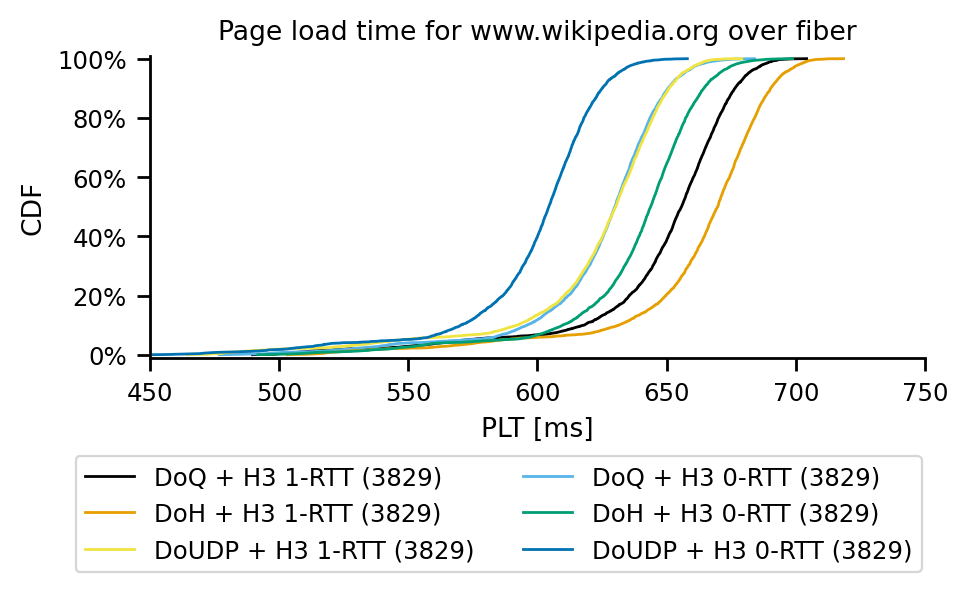

cable
DoQ + H3 1-RTT
count    3829.000000
mean      695.879100
std        33.592677
min       537.102580
10%       662.079979
20%       679.670845
25%       684.845652
30%       689.798496
40%       697.384873
50%       703.407793
60%       709.097282
70%       714.244319
75%       717.045034
80%       719.899743
90%       726.338244
max       822.293583
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3829.000000
mean      681.394535
std        31.724335
min       519.054141
10%       648.050392
20%       665.334744
25%       669.913099
30%       674.267850
40%       681.149245
50%       686.956833
60%       692.566960
70%       698.255158
75%       701.491313
80%       704.958379
90%       712.405248
max       739.964317
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3829.000000
mean      719.366869
std        33.547347
min       562.805383
10%       685.582058
20%       702.921934
25%       708.572942
30%       713.514629
40%       720.952345
50%       726.995911
60%  

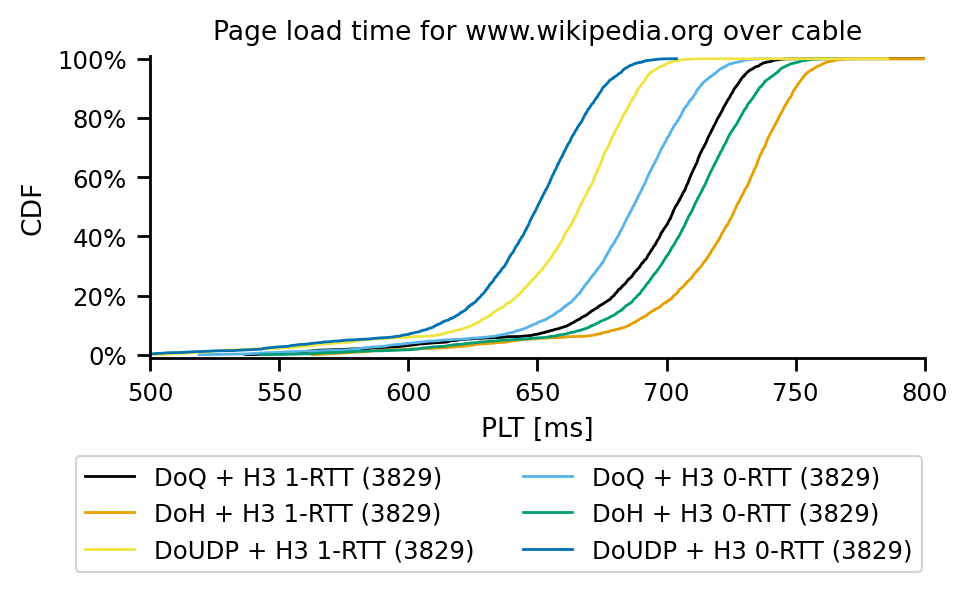

dsl
DoQ + H3 1-RTT
count    3831.000000
mean      818.052945
std        31.581076
min       642.617776
10%       786.014665
20%       803.574677
25%       809.087283
30%       813.417961
40%       819.776138
50%       825.107502
60%       829.896369
70%       834.582347
75%       837.052018
80%       839.520700
90%       845.969494
max      1087.780496
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3831.000000
mean      791.965553
std        30.812839
min       638.013022
10%       762.142529
20%       778.092739
25%       782.830729
30%       787.025043
40%       793.163326
50%       798.925008
60%       803.580855
70%       807.933660
75%       810.403926
80%       813.078615
90%       819.053644
max       862.230394
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3831.000000
mean      842.126724
std        31.553272
min       667.945980
10%       810.105825
20%       827.749661
25%       833.361772
30%       837.485470
40%       843.727151
50%       849.083338
60%    

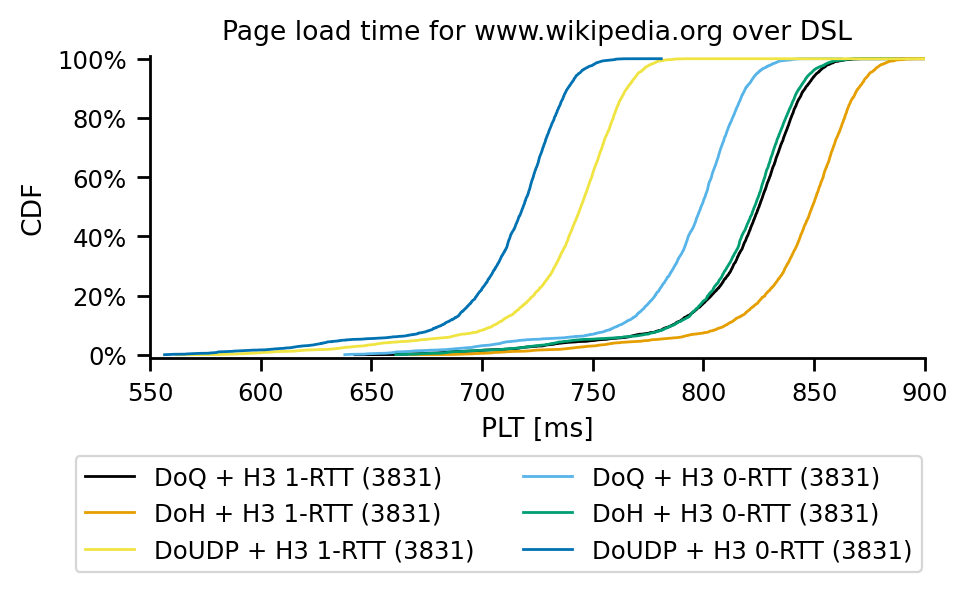

4g
DoQ + H3 1-RTT
count    3829.000000
mean      972.757885
std        30.056812
min       811.667758
10%       941.071127
20%       959.237987
25%       964.417053
30%       968.377934
40%       974.611361
50%       980.360904
60%       984.641993
70%       988.814341
75%       990.748839
80%       993.214738
90%       998.789144
max      1039.573242
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3829.000000
mean      958.001996
std        29.019505
min       795.080434
10%       927.156159
20%       944.457591
25%       948.973041
30%       953.410989
40%       959.556781
50%       965.007256
60%       969.491930
70%       973.450983
75%       975.761047
80%       977.945312
90%       983.577626
max      1025.739919
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3829.000000
mean     1063.654697
std        30.022273
min       902.773703
10%      1032.096220
20%      1050.007783
25%      1055.264255
30%      1059.210598
40%      1065.363788
50%      1071.219346
60%     

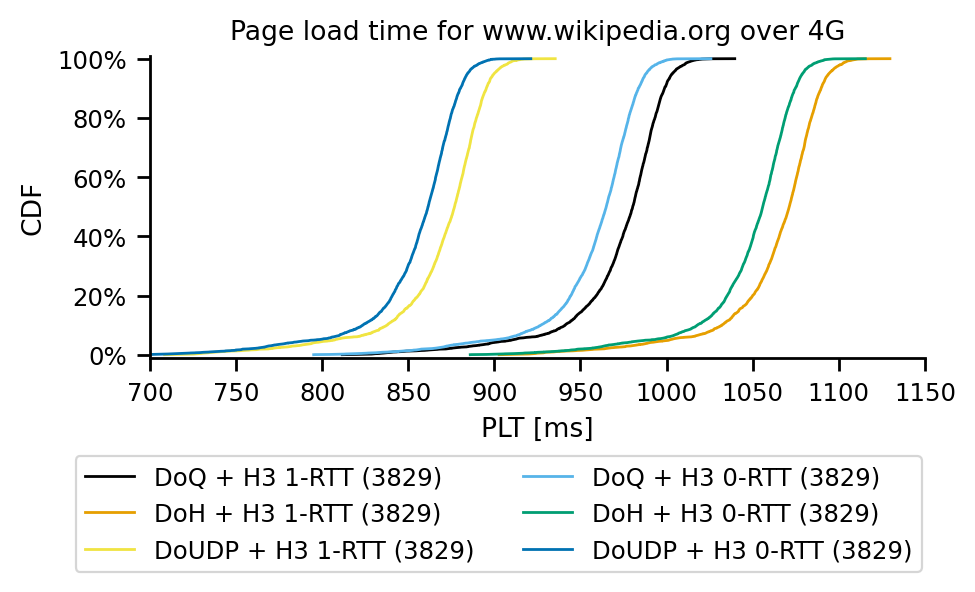

4g-medium
DoQ + H3 1-RTT
count    3829.000000
mean     1030.263457
std        31.929017
min       865.206574
10%       998.068181
20%      1017.687635
25%      1023.017285
30%      1026.912985
40%      1033.102887
50%      1038.376603
60%      1042.342916
70%      1046.436656
75%      1048.490925
80%      1050.739779
90%      1057.839511
max      1084.483207
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3829.000000
mean     1016.333423
std        29.481188
min       836.533495
10%       986.309666
20%      1003.390620
25%      1009.094348
30%      1012.870409
40%      1018.736152
50%      1023.002990
60%      1027.080196
70%      1030.976027
75%      1033.130339
80%      1035.458636
90%      1041.430308
max      1070.538044
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3829.000000
mean     1131.268446
std        31.887793
min       967.546796
10%      1098.791373
20%      1118.419045
25%      1123.724419
30%      1127.898068
40%      1134.032553
50%      1139.344594
6

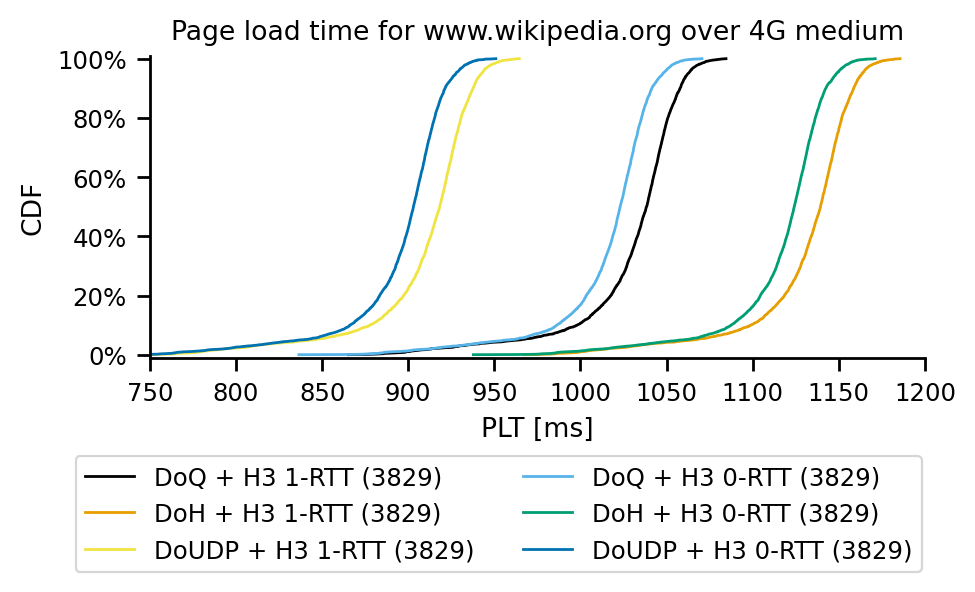

In [368]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    value_ranges = {'fiber':[450,750], 'cable':[500,800], 'dsl':[550,900], '4g':[700,1150], '4g-medium':[750,1200]}
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.wikipedia.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 1
        mrksize = 0
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                print(experiment)
                print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+map_techs_to_proper_name[access_technology])

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.01,1.01)
        #ax.set_xlim(1,2000)
        ax.set_xlim(*value_ranges[access_technology])

        handles, labels = plt.gca().get_legend_handles_labels()
        order = [0,2,4,1,3,5]
        plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], loc='lower center',bbox_to_anchor=(0.45,-0.75),ncol=2)
        #ax.legend()

        if log:
            fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'-log.pdf', format='pdf', bbox_inches='tight')
        else:
            fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'.pdf', format='pdf', bbox_inches='tight')
        plt.show()

fiber


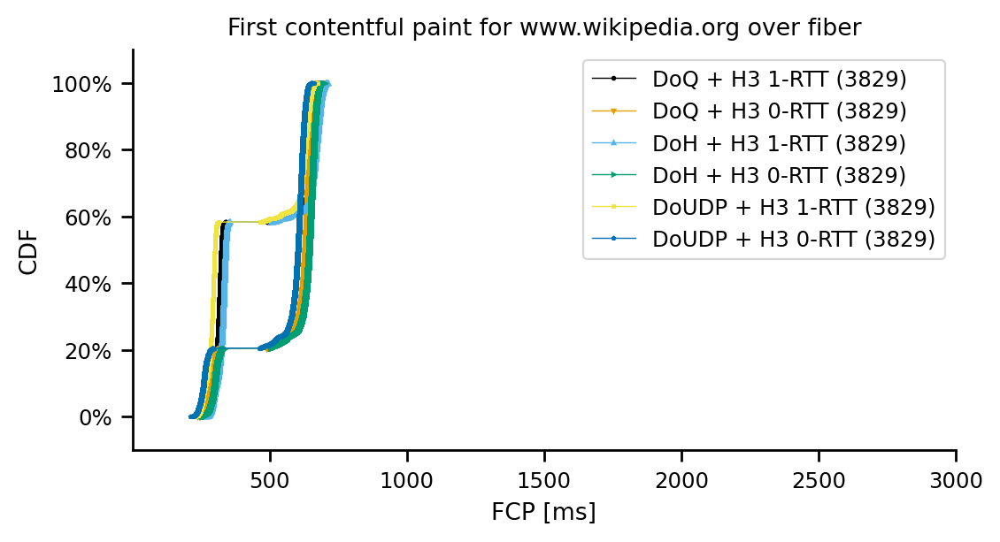

cable


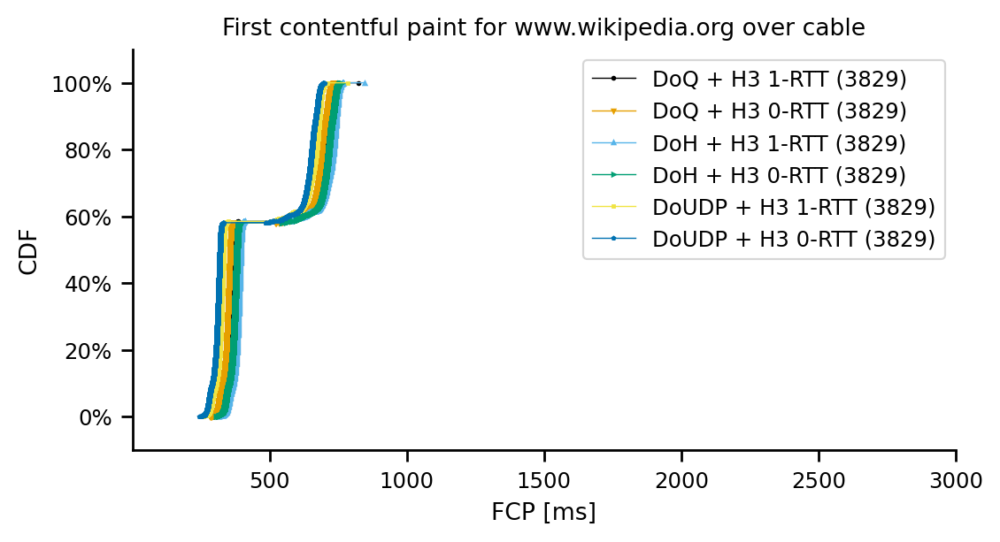

dsl


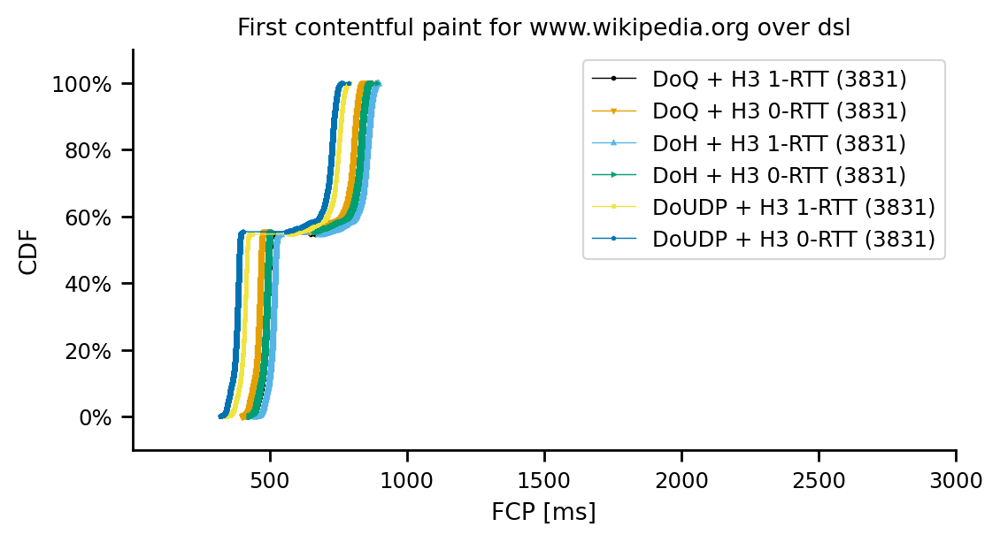

4g


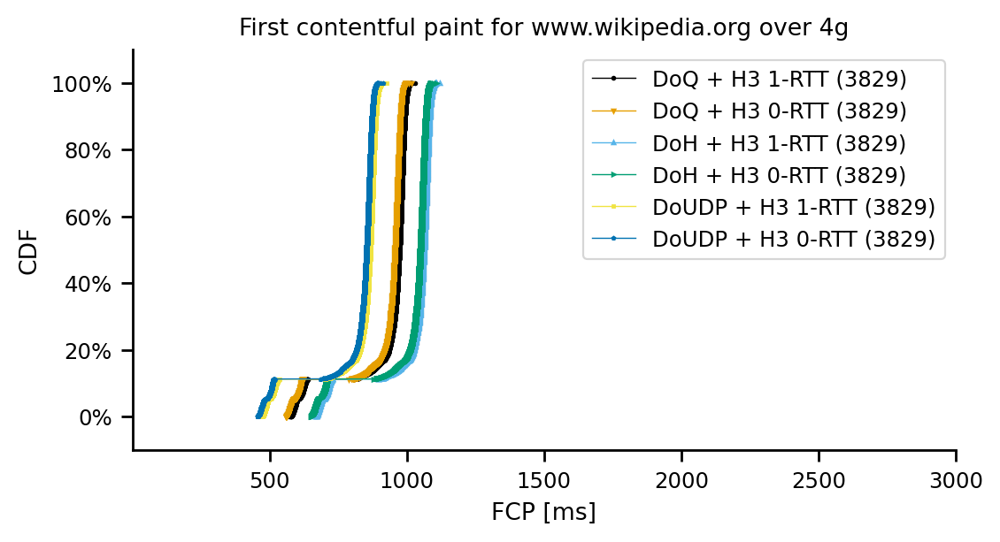

4g-medium


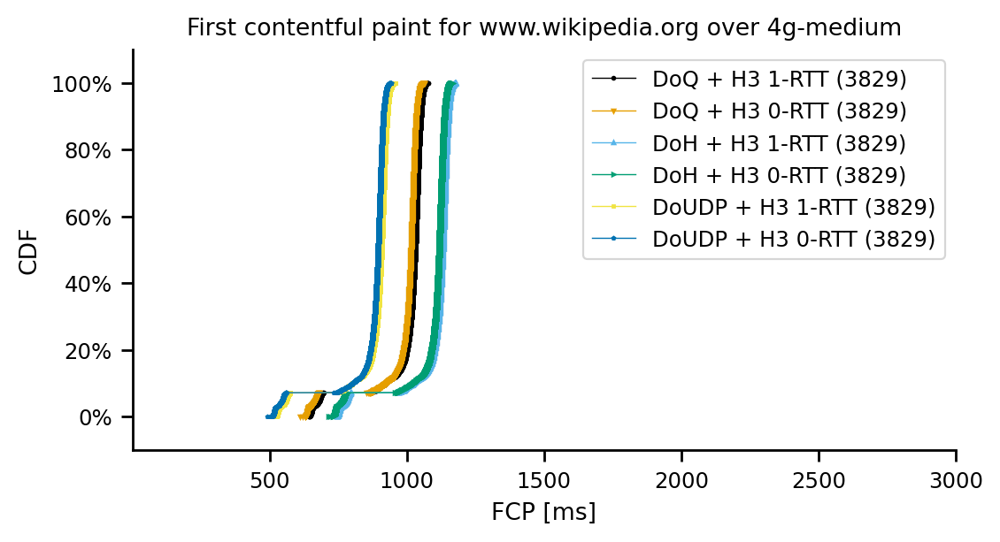

In [32]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_fcp', 'experiment_description', 'website']].copy()
    for website in ['www.wikipedia.org']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_fcp']) == 0:
                    continue
                #print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_fcp'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('First contentful paint for '+website+' over '+access_technology)

        ax.set_xlabel('FCP [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1,3000)


        ax.legend()

        if log:
            fig.savefig('figures/cdf-fcp-absolute-'+website+'-'+access_technology+'-log.pdf', format='pdf', bbox_inches='tight')
        else:
            fig.savefig('figures/cdf-fcp-absolute-'+website+'-'+access_technology+'.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [1104]:
df_dns_and_h3.dtypes

msm_id                         object
connectEnd                    float64
connectStart                  float64
domComplete                   float64
domContentLoadedEventEnd      float64
domContentLoadedEventStart    float64
domInteractive                float64
domainLookupEnd               float64
domainLookupStart             float64
duration                      float64
encodedBodySize                 int64
decodedBodySize                 int64
transferSize                    int64
fetchStart                    float64
loadEventEnd                  float64
loadEventStart                float64
requestStart                  float64
responseEnd                   float64
responseStart                 float64
secureConnectionStart         float64
startTime                     float64
firstPaint                    float64
firstContentfulPaint          float64
nextHopProtocol                object
redirectStart                 float64
redirectEnd                   float64
redirectCoun

In [33]:
df_dns_and_h3.timestamp = pd.to_datetime(df_dns_and_h3.timestamp, format="%Y-%m-%d_%H_%M_%S")

<AxesSubplot:xlabel='timestamp'>

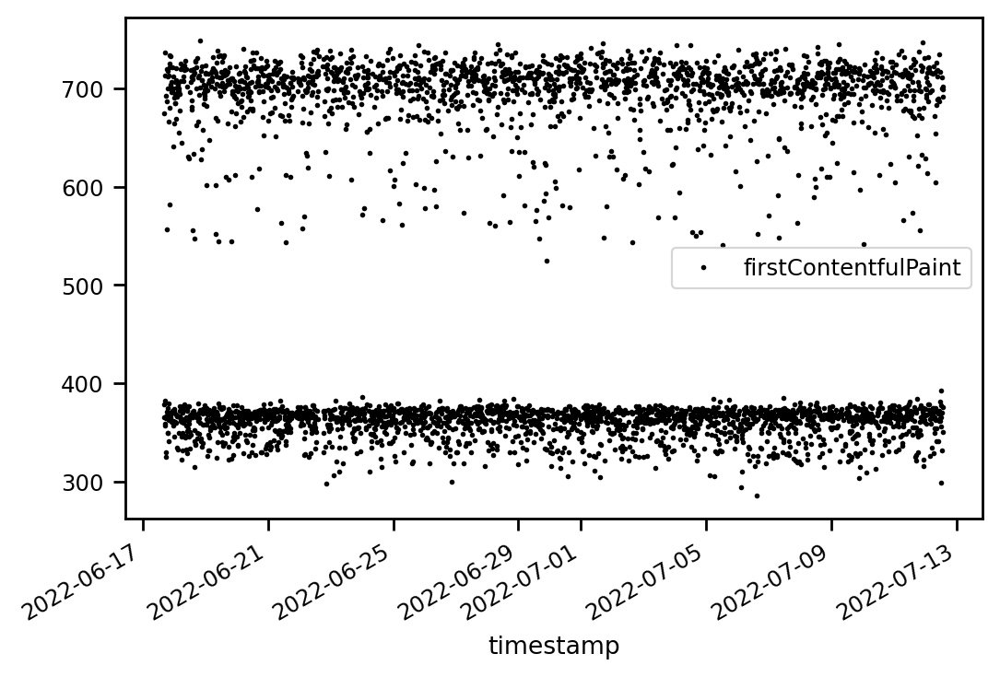

In [34]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

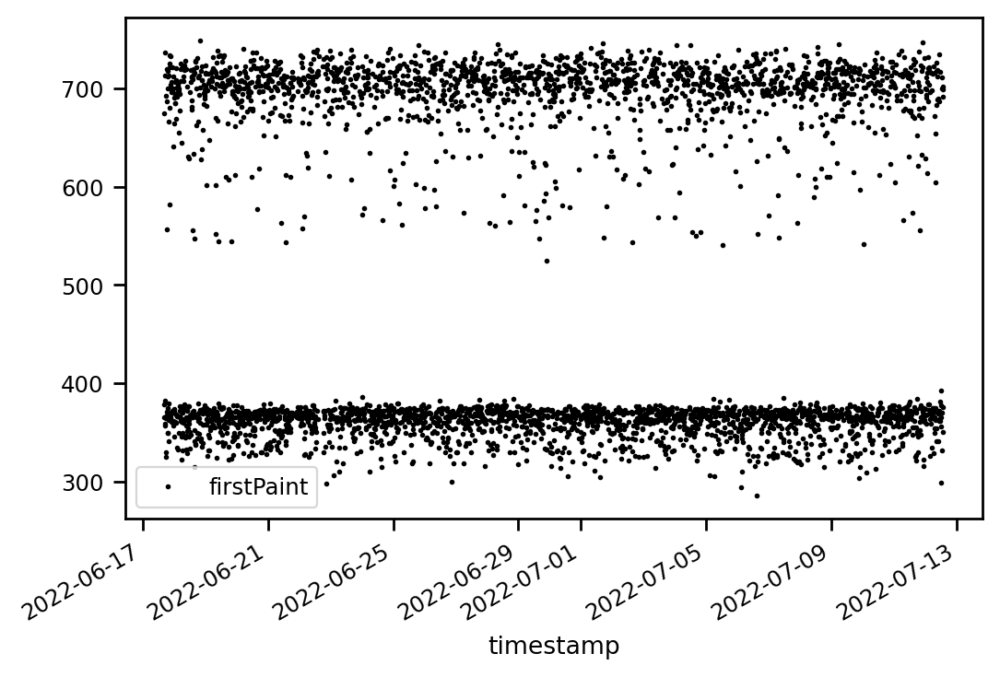

In [35]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstPaint', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

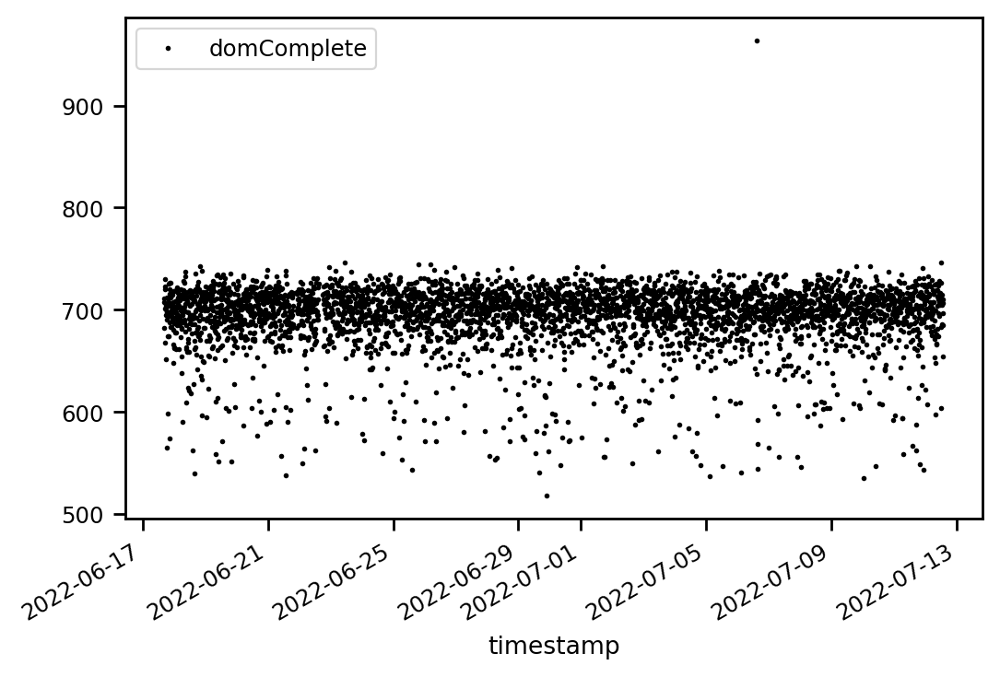

In [36]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='domComplete', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

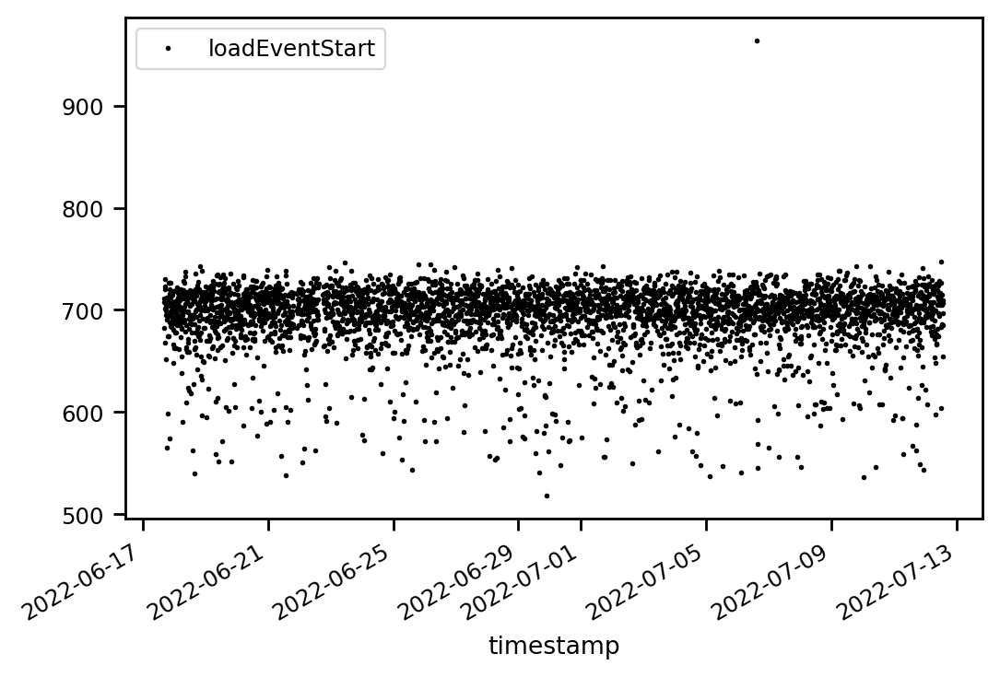

In [37]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

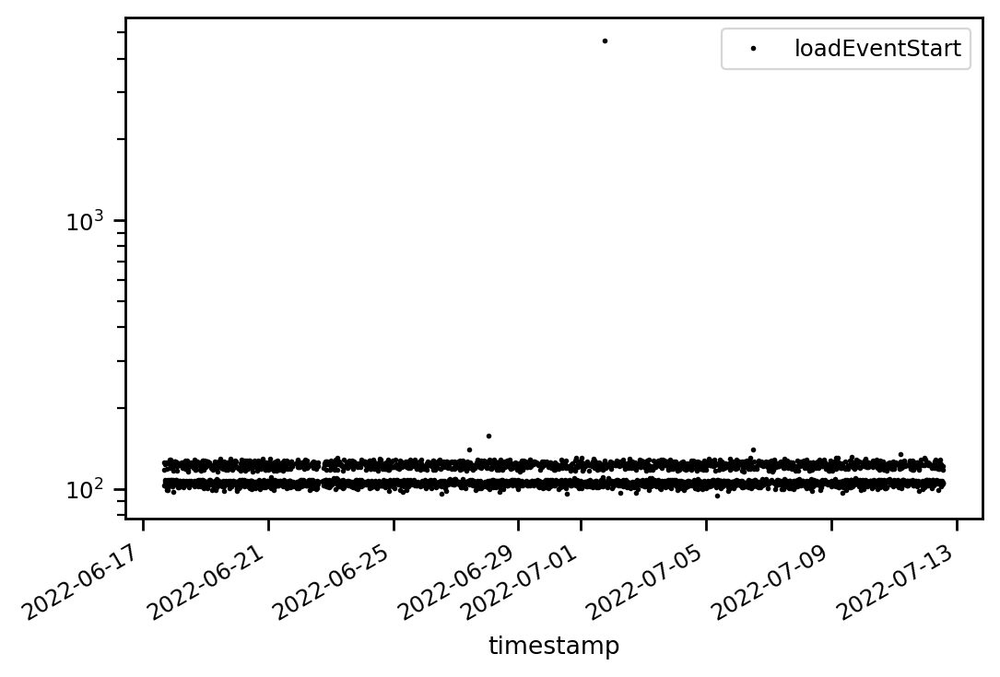

In [39]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.example.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".",logy=True)

<AxesSubplot:xlabel='timestamp'>

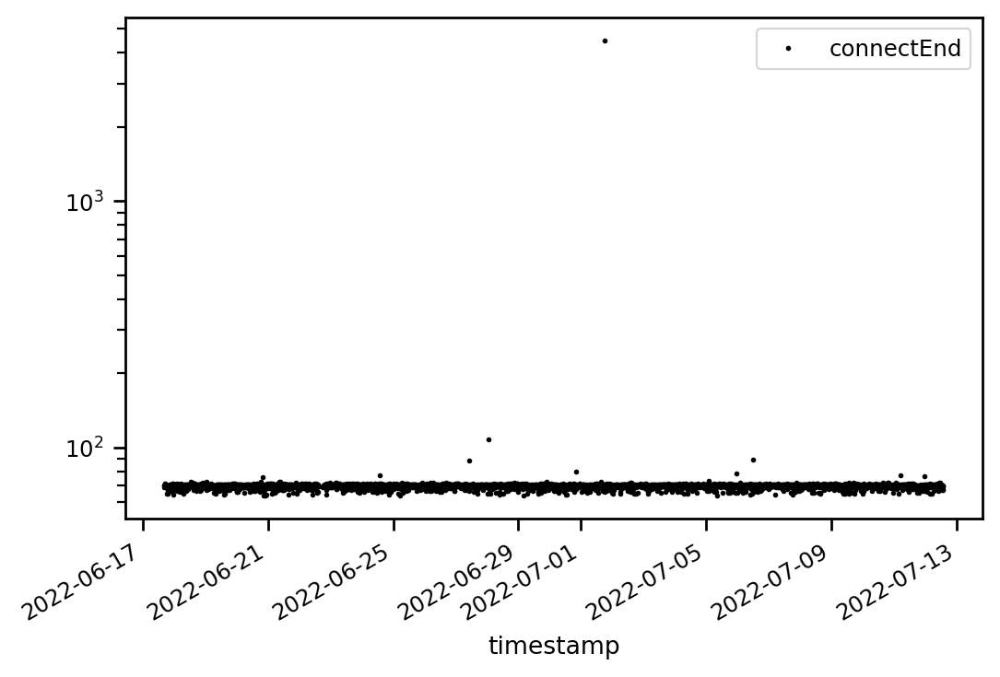

In [41]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.example.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='connectEnd', linewidth=0, markersize=2, color='C0', marker=".", logy=True)

<AxesSubplot:xlabel='timestamp'>

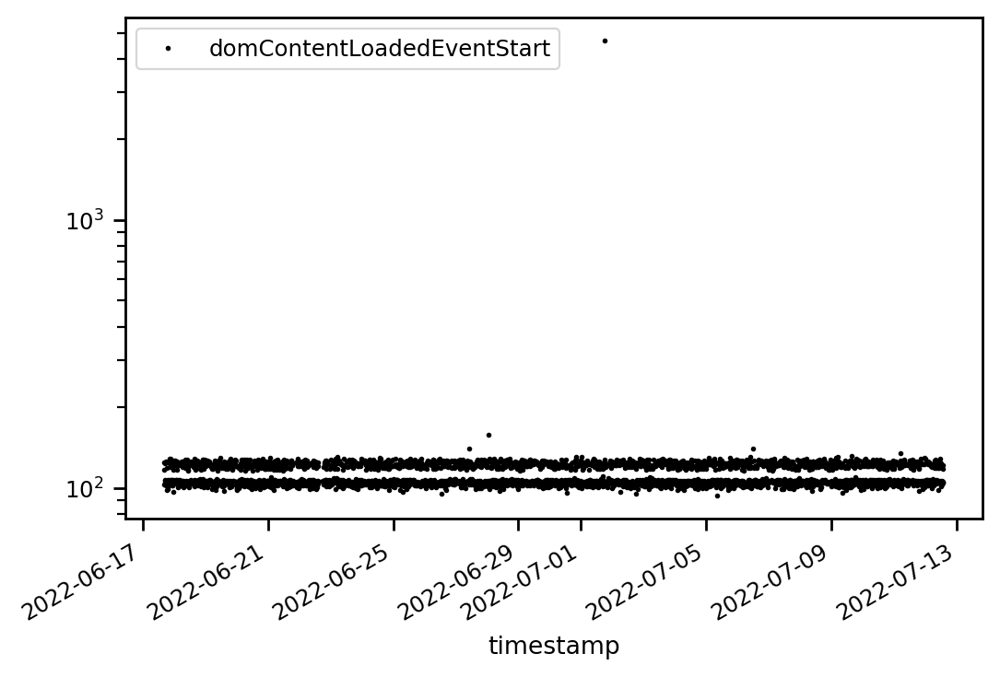

In [43]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.example.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='domContentLoadedEventStart', linewidth=0, markersize=2, color='C0', marker=".", logy=True)

<AxesSubplot:xlabel='timestamp'>

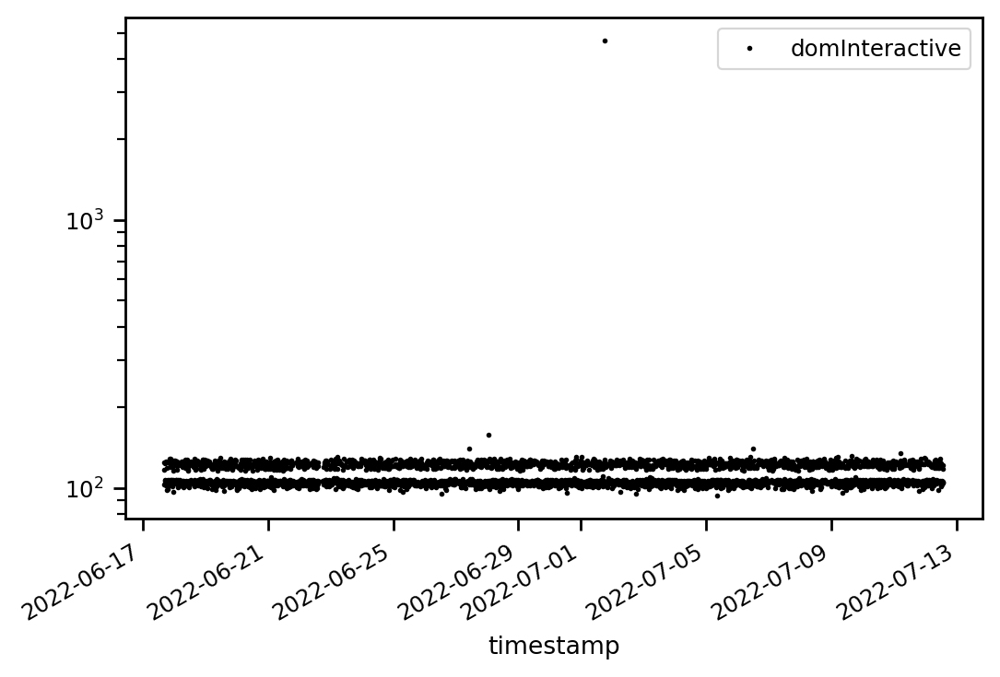

In [45]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.example.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='domInteractive', linewidth=0, markersize=2, color='C0', marker=".", logy=True)

<AxesSubplot:xlabel='timestamp'>

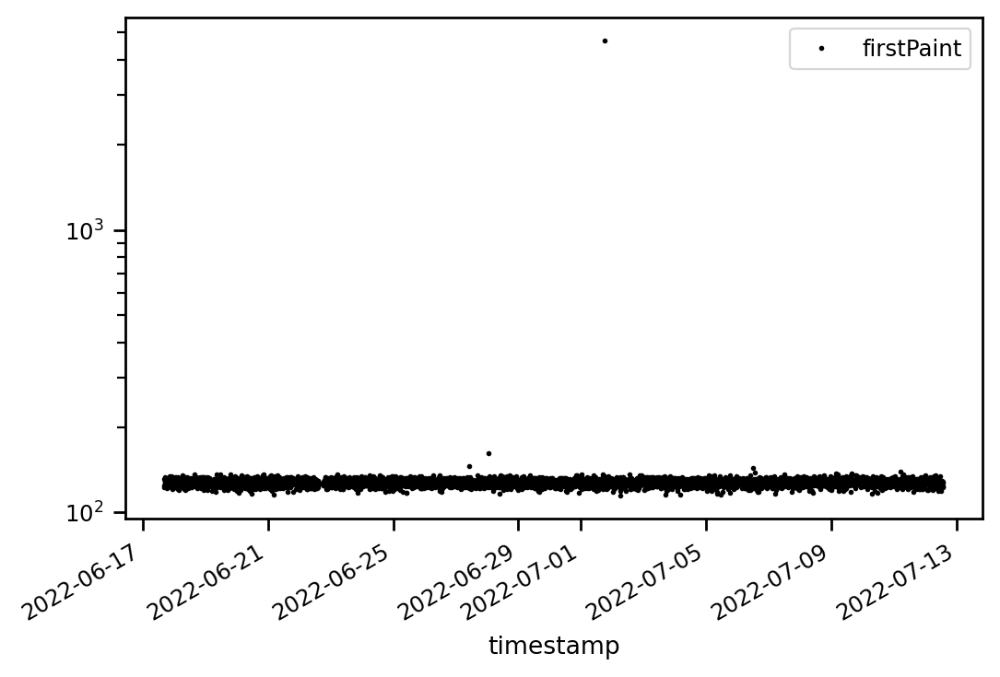

In [46]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.example.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstPaint', linewidth=0, markersize=2, color='C0', marker=".", logy=True)

<AxesSubplot:xlabel='timestamp'>

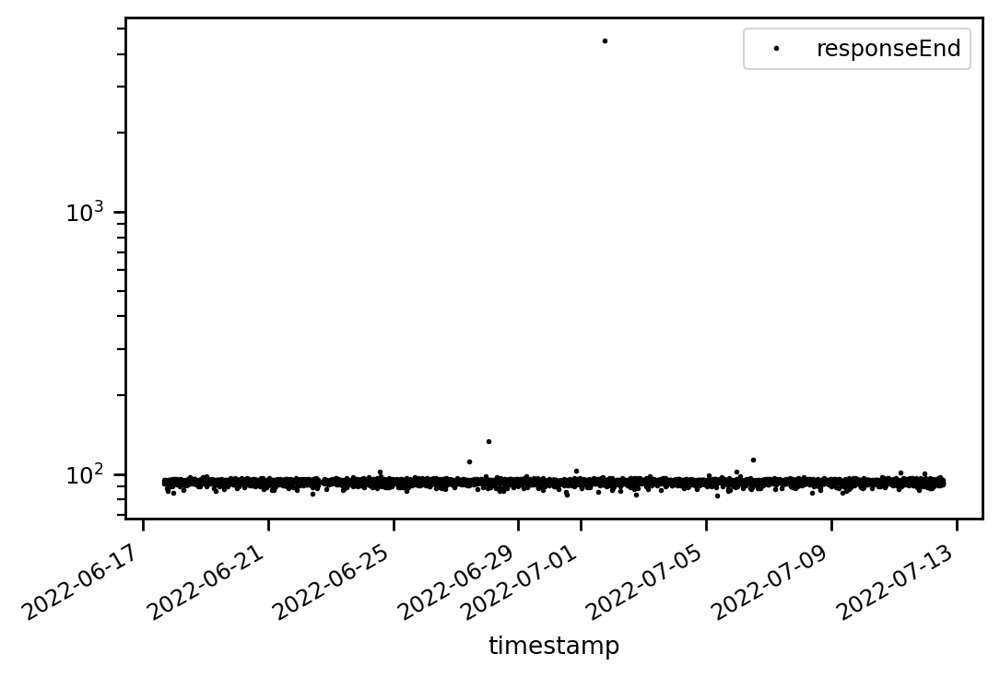

In [47]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.example.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='responseEnd', linewidth=0, markersize=2, color='C0', marker=".", logy=True)

fiber
DoQ + H3 1-RTT
count    3827.000000
mean      677.849821
std        12.875285
min       641.560480
10%       663.863034
20%       668.633946
25%       670.218135
30%       671.660246
40%       674.371777
50%       676.897514
60%       679.590160
70%       682.591476
75%       684.274938
80%       686.528840
90%       691.695340
100%      864.728896
max       864.728896
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3827.000000
mean      660.382432
std        12.418857
min       628.148656
10%       646.813350
20%       651.147917
25%       652.715965
30%       654.102587
40%       656.555602
50%       659.283485
60%       661.995067
70%       665.266343
75%       667.278343
80%       669.277367
90%       674.475152
100%      861.128896
max       861.128896
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3827.000000
mean      691.703995
std        12.801386
min       655.805828
10%       677.918301
20%       682.468379
25%       684.135094
30%       685.598960
40%  

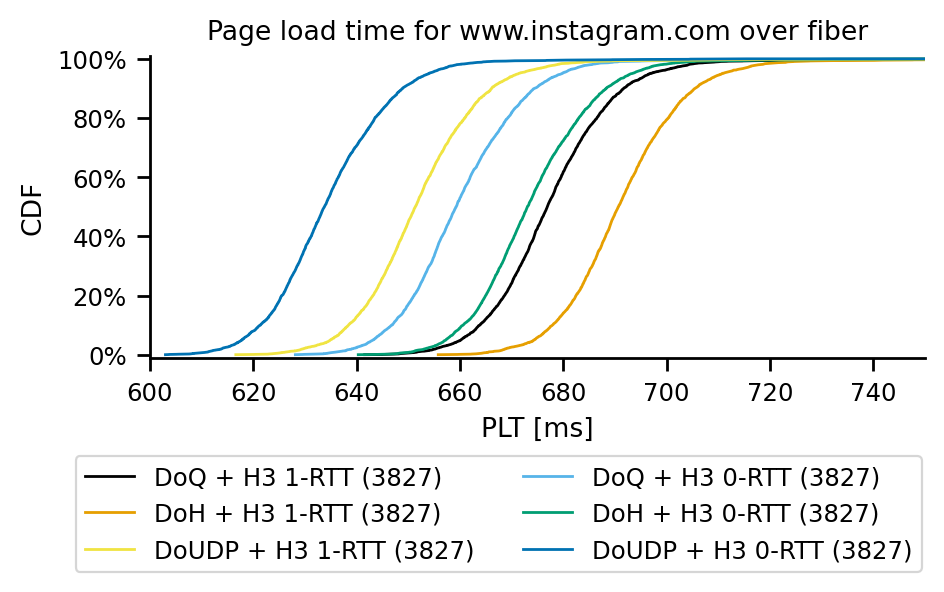

cable
DoQ + H3 1-RTT
count    3827.000000
mean      748.978564
std        13.347867
min       715.329081
10%       734.748505
20%       738.627136
25%       740.523302
30%       742.006664
40%       745.035599
50%       747.707583
60%       750.648424
70%       753.813781
75%       755.592811
80%       757.905079
90%       764.067910
100%      932.641566
max       932.641566
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3827.000000
mean      732.049560
std        14.374422
min       699.266574
10%       718.132056
20%       721.618184
25%       723.333621
30%       724.709854
40%       727.959220
50%       730.788334
60%       733.308713
70%       736.525951
75%       738.421979
80%       740.622572
90%       746.700364
100%     1014.191301
max      1014.191301
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3827.000000
mean      772.479041
std        13.358641
min       738.565316
10%       758.061774
20%       762.176182
25%       763.952952
30%       765.362996
40%  

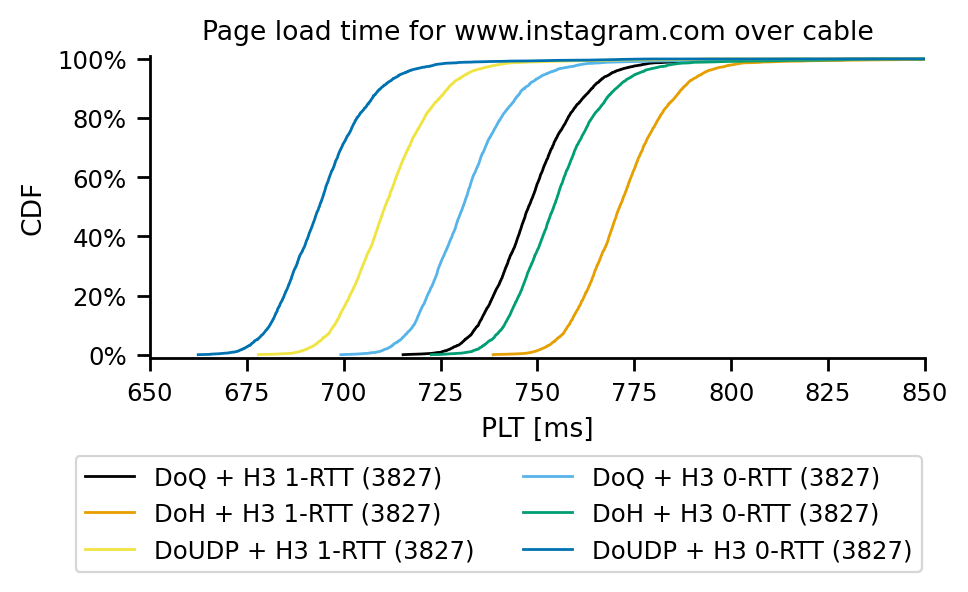

dsl
DoQ + H3 1-RTT
count    3827.000000
mean     1870.018950
std        11.233442
min      1830.802915
10%      1854.368376
20%      1860.482483
25%      1862.752189
30%      1864.885536
40%      1868.359416
50%      1870.960145
60%      1873.573711
70%      1876.277678
75%      1877.702002
80%      1879.439190
90%      1883.561957
100%     1954.207149
max      1954.207149
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3827.000000
mean     1841.397053
std        11.258418
min      1806.032769
10%      1825.557539
20%      1831.666454
25%      1834.079061
30%      1836.382450
40%      1839.857152
50%      1842.544205
60%      1845.008994
70%      1847.722719
75%      1849.336670
80%      1851.020807
90%      1855.096678
100%     1921.097102
max      1921.097102
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3827.000000
mean     1894.114023
std        11.210636
min      1856.783662
10%      1878.419279
20%      1884.532458
25%      1886.873364
30%      1889.091593
40%    

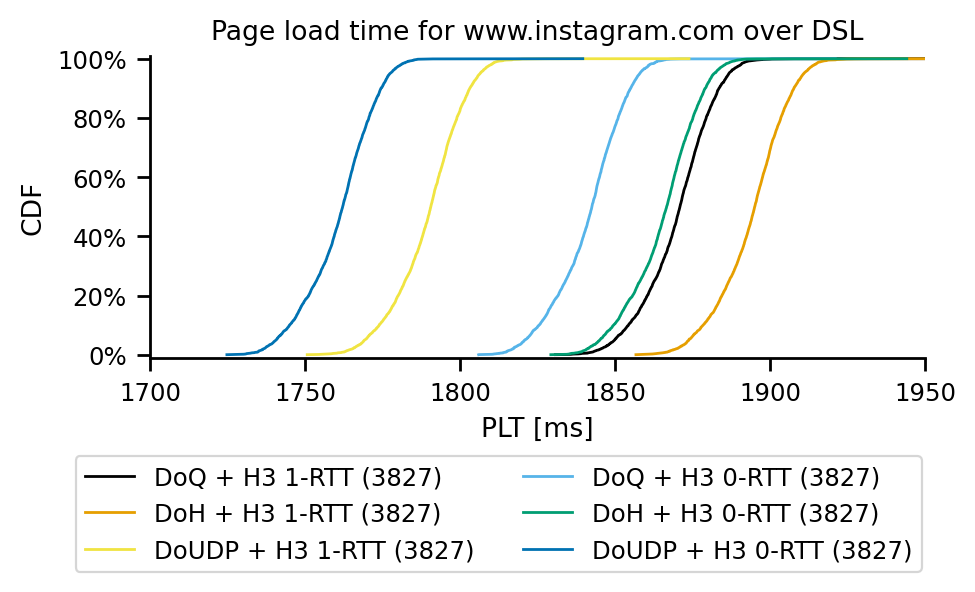

4g
DoQ + H3 1-RTT
count    3827.000000
mean     1430.182642
std        12.703067
min      1389.860440
10%      1414.823269
20%      1419.657253
25%      1421.461283
30%      1423.082860
40%      1426.251264
50%      1429.716722
60%      1432.818118
70%      1436.162308
75%      1438.223582
80%      1440.390652
90%      1446.433197
100%     1516.388444
max      1516.388444
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3827.000000
mean     1402.813084
std        11.004603
min      1368.190884
10%      1389.366854
20%      1393.628449
25%      1395.650872
30%      1397.134240
40%      1399.891271
50%      1402.390303
60%      1404.895596
70%      1407.929237
75%      1409.564571
80%      1411.346368
90%      1416.523237
100%     1487.249447
max      1487.249447
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3827.000000
mean     1521.068371
std        12.710082
min      1482.778769
10%      1505.651676
20%      1510.523416
25%      1512.272990
30%      1513.867983
40%     

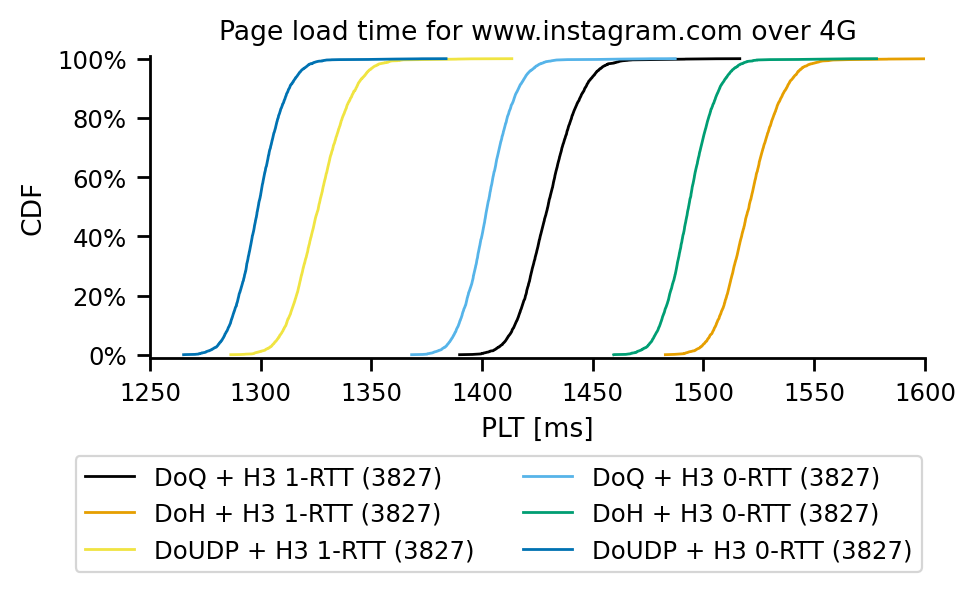

4g-medium
DoQ + H3 1-RTT
count    3827.000000
mean     1657.149746
std        65.089197
min      1616.652874
10%      1640.700246
20%      1646.038809
25%      1647.959511
30%      1649.918364
40%      1653.104300
50%      1656.154622
60%      1659.174405
70%      1662.184073
75%      1664.170173
80%      1666.066821
90%      1671.699807
100%     5610.916039
max      5610.916039
Name: full_plt, dtype: float64
DoQ + H3 0-RTT
count    3827.000000
mean     1631.225811
std        11.926608
min      1591.423345
10%      1615.894419
20%      1621.355595
25%      1623.359029
30%      1625.144515
40%      1628.267609
50%      1631.193149
60%      1634.312672
70%      1637.625074
75%      1639.277024
80%      1641.351046
90%      1646.586822
100%     1700.401024
max      1700.401024
Name: full_plt, dtype: float64
DoH + H3 1-RTT
count    3827.000000
mean     1758.145062
std        65.082366
min      1717.783047
10%      1741.756956
20%      1746.910227
25%      1748.975711
30%      1750.985145
4

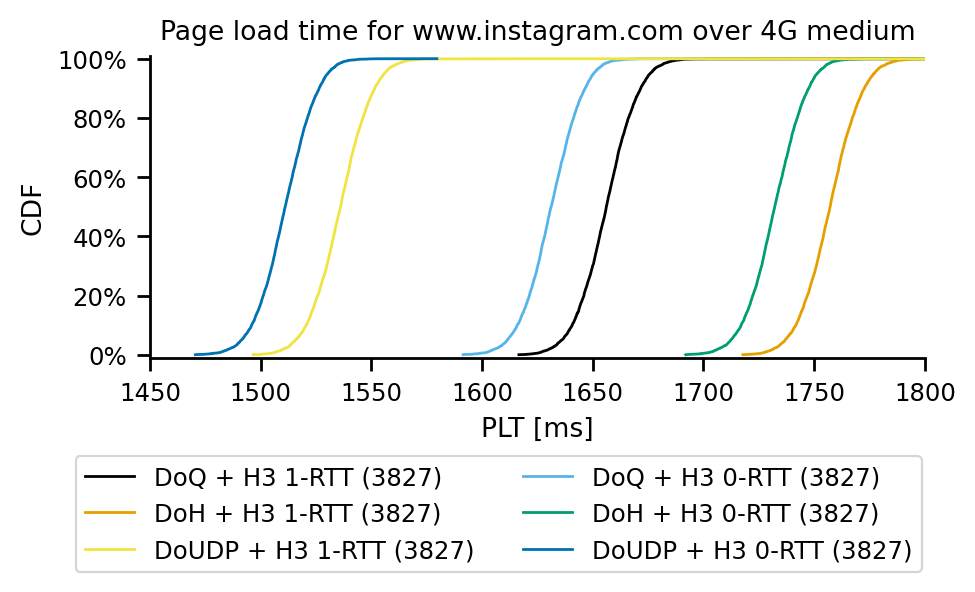

In [370]:
for access_technology in ['fiber', 'cable', 'dsl', '4g', '4g-medium']:
    print(access_technology)
    value_ranges = {'fiber':[600,750], 'cable':[650,850], 'dsl':[1700,1950], '4g':[1250,1600], '4g-medium':[1450,1800]}
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_plt', 'experiment_description', 'website']].copy()
    for website in ['www.instagram.com']:
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 1
        mrksize = 0
        log=False
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_plt']) == 0:
                    continue
                print(experiment)
                print(df_tmp['full_plt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_plt'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('Page load time for '+website+' over '+map_techs_to_proper_name[access_technology])

        ax.set_xlabel('PLT [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.01,1.01)
        #ax.set_xlim(500,3000)
        ax.set_xlim(*value_ranges[access_technology])

        handles, labels = plt.gca().get_legend_handles_labels()
        order = [0,2,4,1,3,5]
        plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order], loc='lower center',bbox_to_anchor=(0.45,-0.75),ncol=2)
        #ax.legend()

        if log:
            fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'-log.pdf', format='pdf', bbox_inches='tight')
        else:
            fig.savefig('figures/cdf-plt-absolute-'+website+'-'+access_technology+'.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [1111]:
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].loadEventStart.describe())
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].elapsed.describe())
#df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt < 250)].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

In [1112]:
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].loadEventStart.describe())
#print(df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].elapsed.describe())
#df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.full_plt >= 250)].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

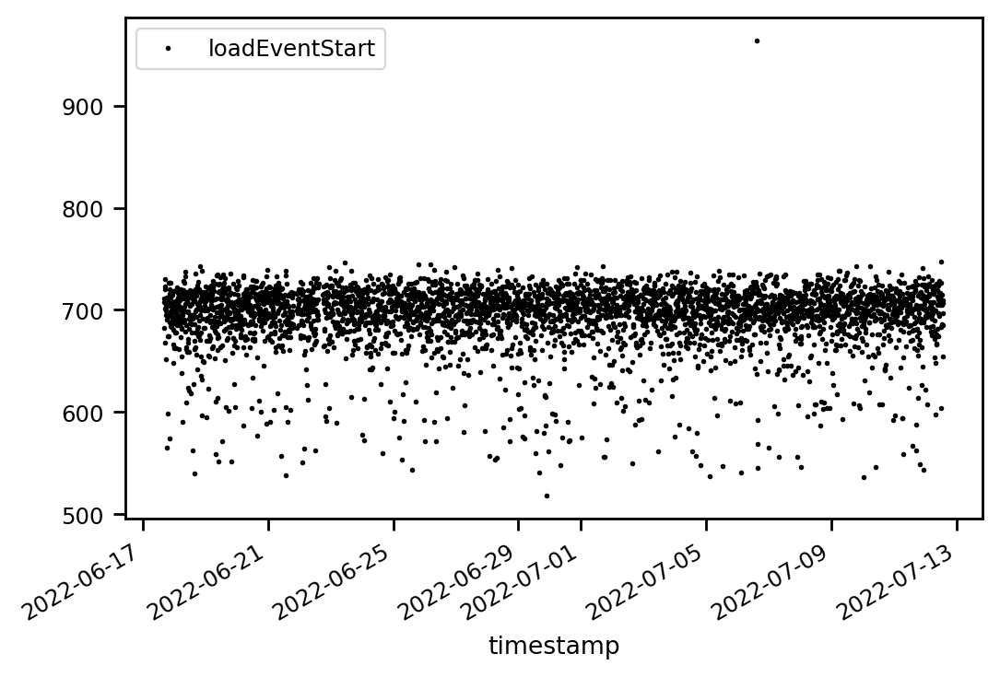

In [49]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

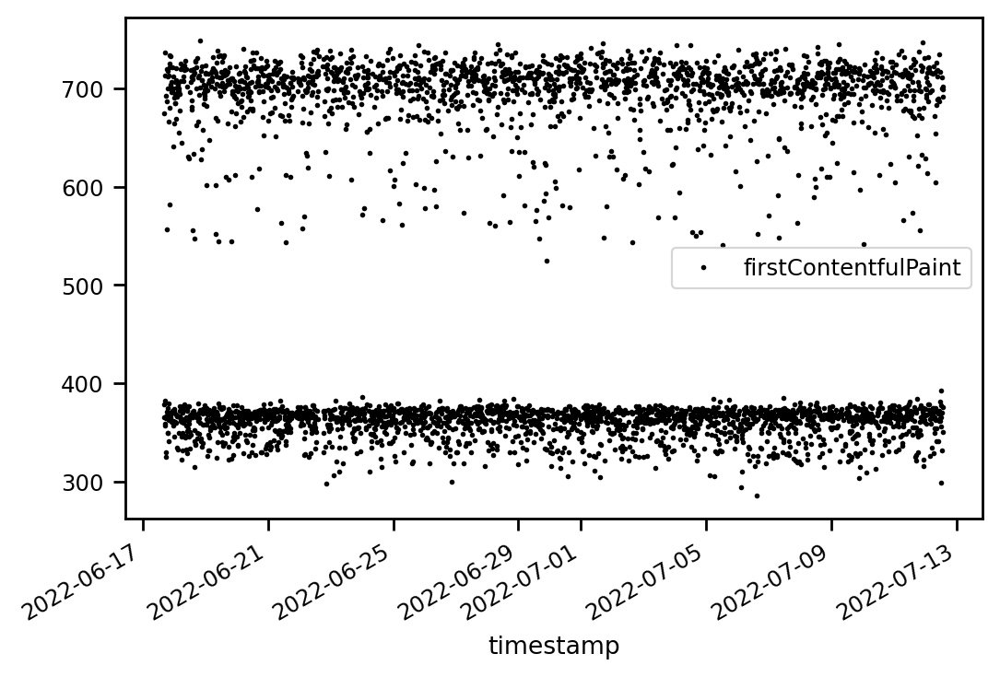

In [50]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'dsl') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1115]:
#dsl_msms=['ea7f2f67-49aa-4b24-bbdb-2f579e93ae2d',
#          '0db34220-adc4-47ca-98ef-b477b4546c70',
#          '1a594a4d-7229-4b33-996a-86ac8ee8e87f',
#          'a5bdf51b-6cf3-4b39-af48-7b3588b8fa32',
#          '72f14b6a-778c-4aaa-ae6b-081b55eb1a3e',
#          'd5c12acb-6c08-4aed-a30d-fe5177353e9a']
#dsl_msms = ['40226da6-4e2e-41da-be00-ea3d8568b8ac',
#           '0996f426-0b60-40bc-844b-59642efb5e88', 
#           '834c4ab5-fffe-438b-9eba-ec294fca29e1']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(dsl_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

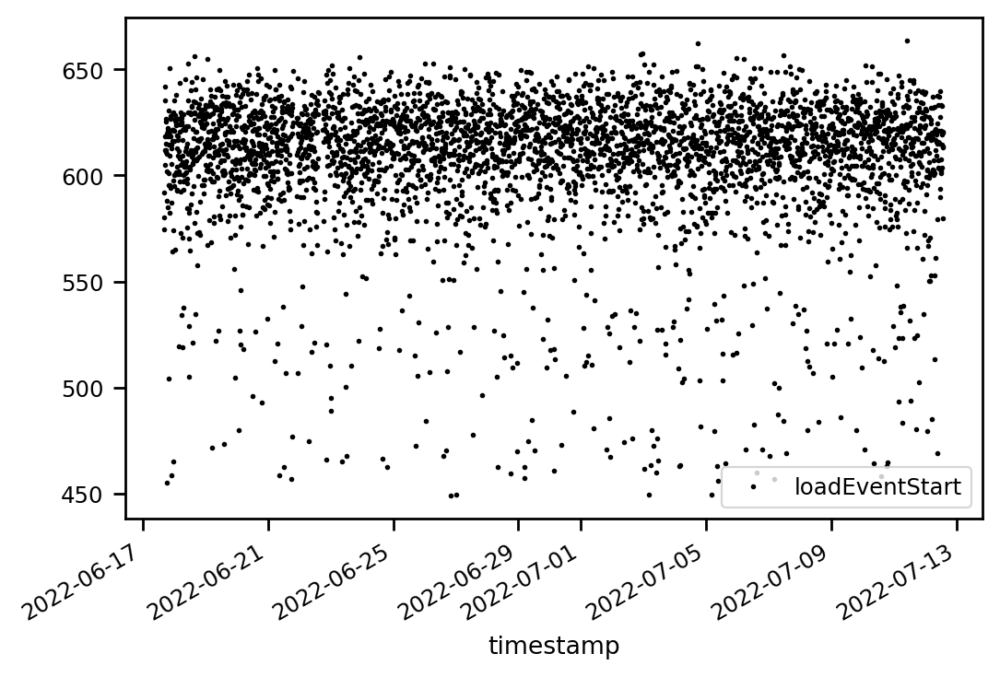

In [51]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

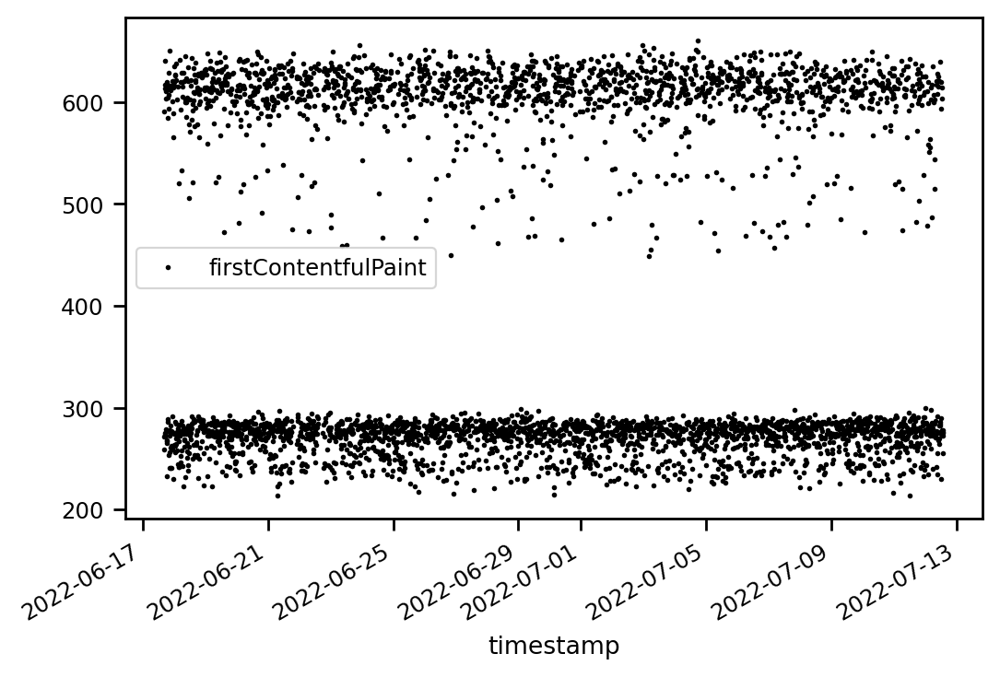

In [52]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'fiber') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1118]:
#fiber_msms=['097f5c5a-70d2-4d49-9403-a8bcce09aac9', 
#           '91f26e10-53cc-4c85-8e4c-401f37fbcb5b',
#           '11893d09-c545-48eb-84cd-69336faf5ea1',
#           '25cab733-fee7-4e82-af9c-8993f827f499',
#           '6f4abddc-4822-4cfe-8019-ad1058cb8177',
#           '52ad18c8-2f93-45fc-b6e0-ea6c6a589478']
#fiber_msms=['80ffb3af-c2c9-4567-ba4a-7bcca408dff4',
#           'b6131e76-734f-4ded-b907-006d00d19e6b',
#           '8831ce97-936c-46b7-94bb-0199d9a53f00',
#           '9e1ed825-d333-4bd9-9053-584d7079c31a']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(fiber_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

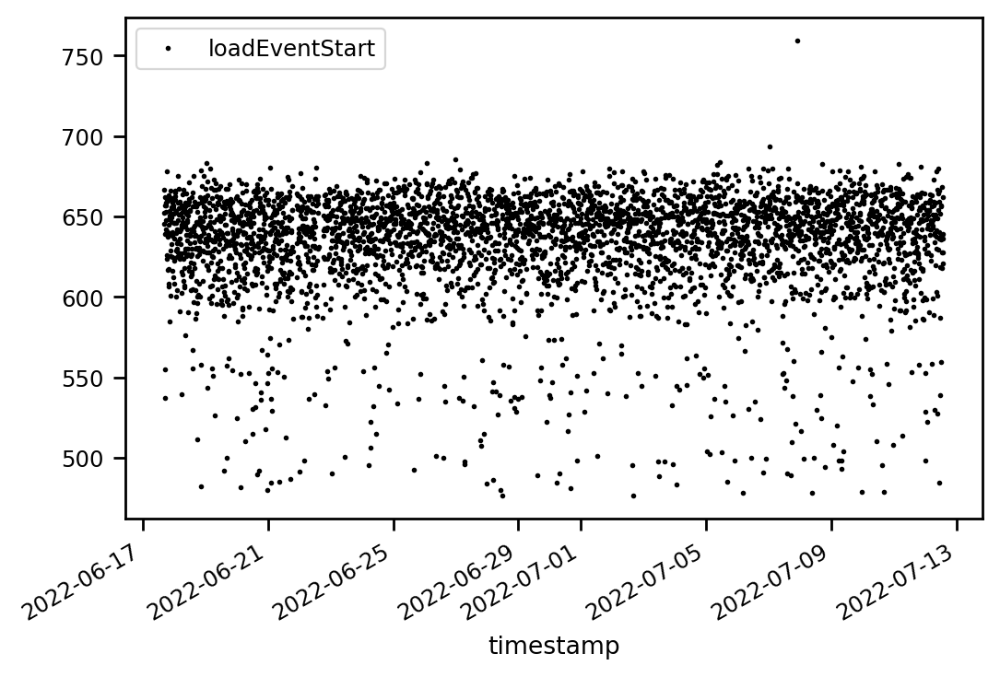

In [53]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'cable') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

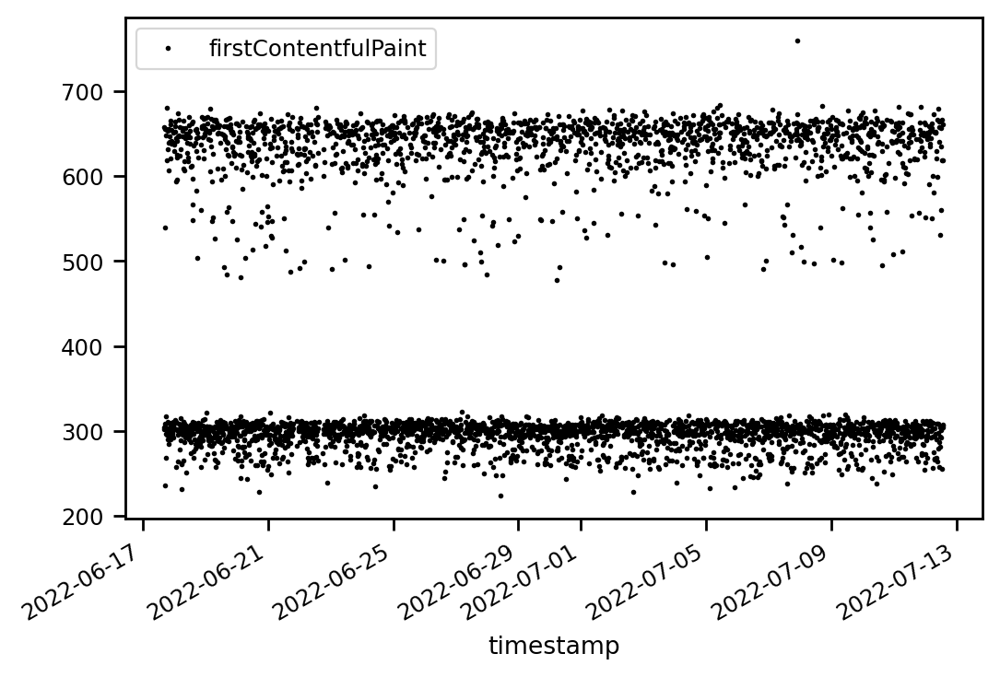

In [54]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == 'cable') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1121]:
#cable_msms=['25043c95-126c-4a50-91f2-3a248f2840a1', 
#           '1a674496-67b0-4f9b-953e-8753f95b0dc5',
#           '39485fb3-aba4-4530-9069-c1aa2194c36d',
#           'c0d8523a-aa0a-4df5-9889-5aa0c4db4b40',
#           '37b9ac16-7359-4fa5-9e15-22a7bd8fa85a',
#           '7e3fafbf-e74b-4365-9de0-553a276057ce']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(cable_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

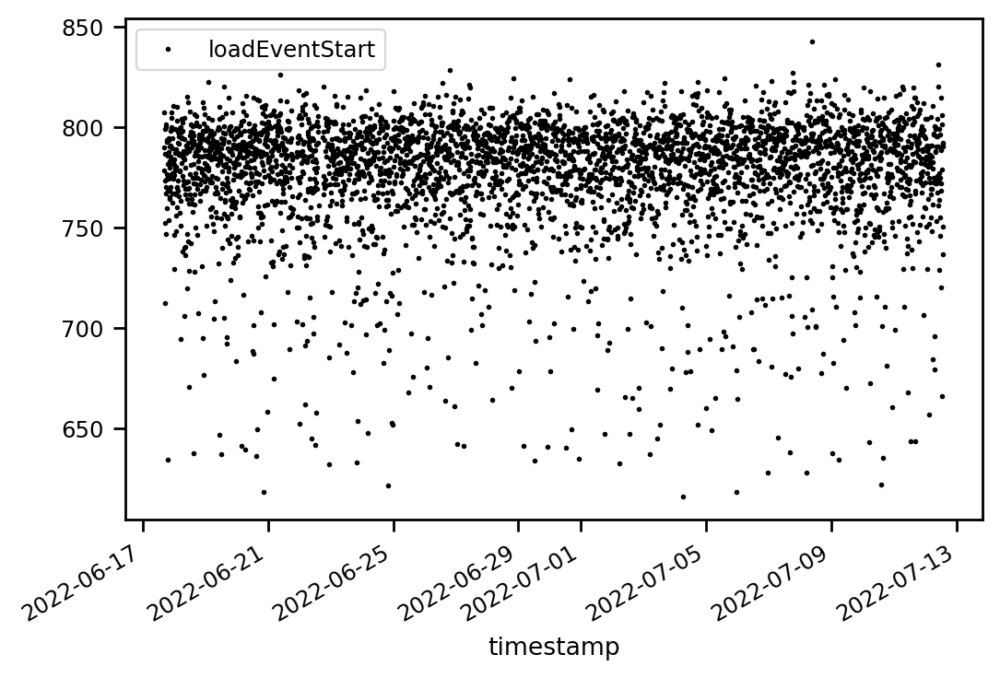

In [55]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

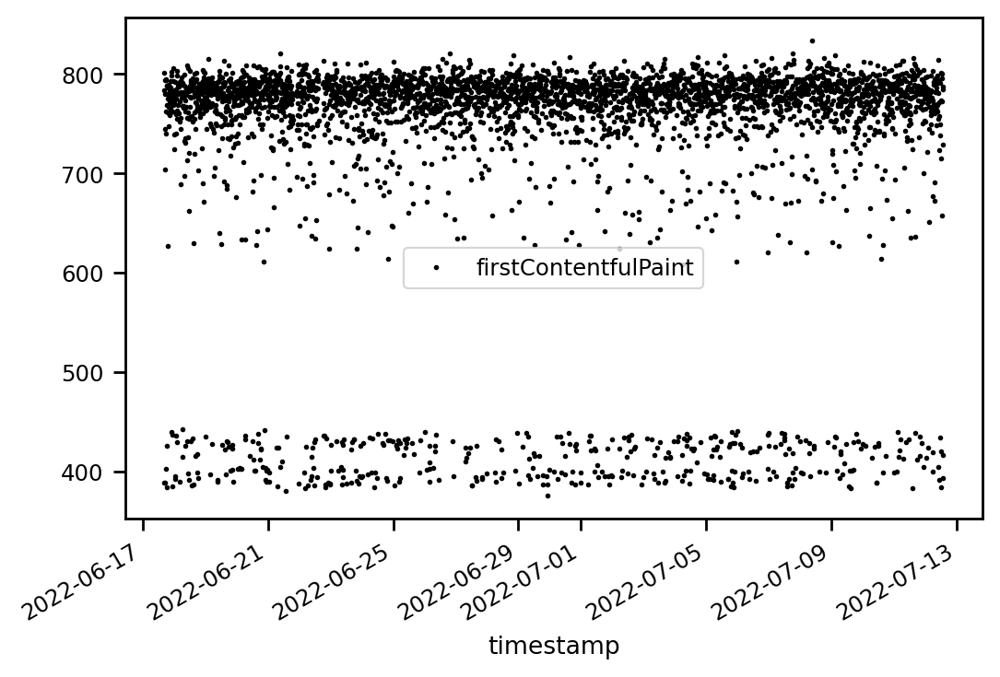

In [56]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

In [1124]:
#lte_msms=['76f85d7f-927c-47fd-a72a-f2f9bb36e393', 
#           '494500df-6fa3-4ec1-8d0e-d86479dbfcc2',
#           'd66574f5-2ef4-479c-9a53-d1e520c40e3b',
#           '6462d64e-715f-41f8-8bf1-cbaae877b8ee',
#           'c628eb84-a78a-401e-b29b-08f358592902',
#           'cb5fe4a3-1fe7-4443-aa45-b598ba2ba0e3']
#df_dns_and_h3[(df_dns_and_h3.msm_id.isin(lte_msms)) & (df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT')][['msm_id', 'loadEventStart']]

<AxesSubplot:xlabel='timestamp'>

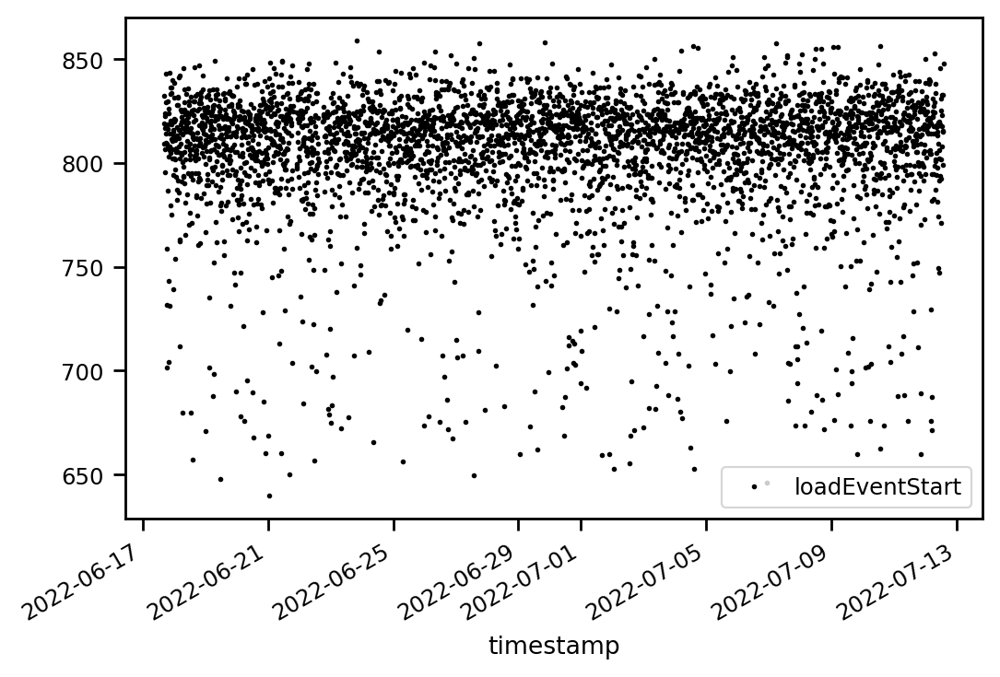

In [57]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g-medium') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='loadEventStart', linewidth=0, markersize=2, color='C0', marker=".")

<AxesSubplot:xlabel='timestamp'>

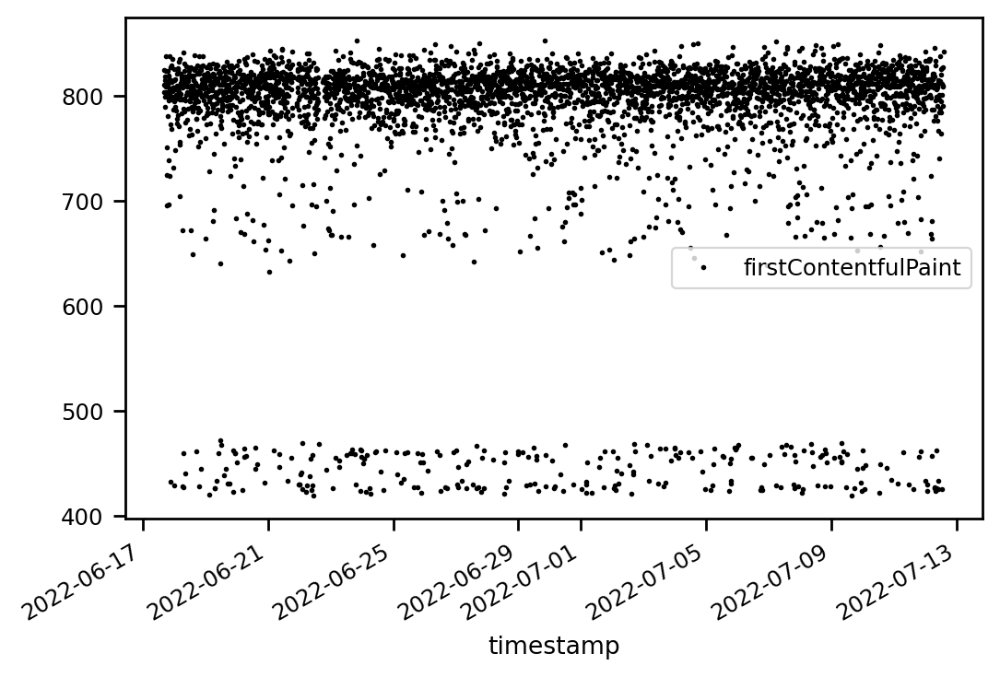

In [58]:
df_dns_and_h3[(df_dns_and_h3.website == 'www.wikipedia.org') & (df_dns_and_h3.experiment_type == '4g-medium') & (df_dns_and_h3.experiment_description == 'DoQ + H3 1-RTT')].set_index('timestamp').plot(y='firstContentfulPaint', linewidth=0, markersize=2, color='C0', marker=".")

dsl
count    1552.000000
mean      338.224750
std         4.547307
min       315.009953
10%       332.919398
20%       335.384143
25%       336.183300
30%       336.721523
40%       337.794466
50%       338.665283
60%       339.497828
70%       340.614006
75%       341.206183
80%       341.880049
90%       343.408784
100%      349.587349
max       349.587349
Name: full_fcp, dtype: float64
count    1552.000000
mean      313.426748
std         3.531560
min       302.413616
10%       309.236535
20%       310.660525
25%       311.232660
30%       311.599324
40%       312.431888
50%       313.241550
60%       314.213299
70%       315.204623
75%       315.707465
80%       316.230777
90%       317.689505
100%      358.942222
max       358.942222
Name: full_fcp, dtype: float64
count    1552.000000
mean      362.346467
std         4.483881
min       340.697799
10%       357.316616
20%       359.439926
25%       360.343412
30%       360.910460
40%       361.823661
50%       362.675207
60%       

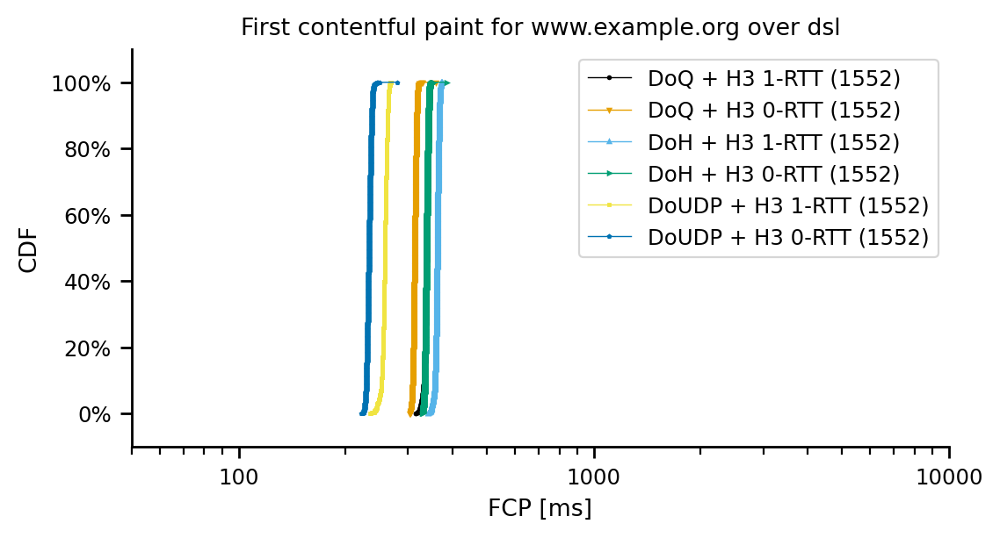

count    1553.000000
mean      635.061665
std       169.002717
min       423.954330
10%       473.381592
20%       484.610062
25%       487.649672
30%       489.629416
40%       494.062368
50%       498.472496
60%       788.397798
70%       820.515723
75%       826.118395
80%       831.823577
90%       842.186140
100%      873.117532
max       873.117532
Name: full_fcp, dtype: float64
count    1553.000000
mean      604.307576
std       170.000942
min       401.459834
10%       444.196088
20%       457.146458
25%       459.996266
30%       462.374678
40%       466.510566
50%       470.278809
60%       756.096598
70%       794.903260
75%       801.567358
80%       807.580622
90%       815.661784
100%      848.906181
max       848.906181
Name: full_fcp, dtype: float64
count    1553.000000
mean      659.117520
std       168.989921
min       447.024765
10%       497.639013
20%       508.550956
25%       511.534529
30%       513.969866
40%       518.249532
50%       522.576600
60%       813.

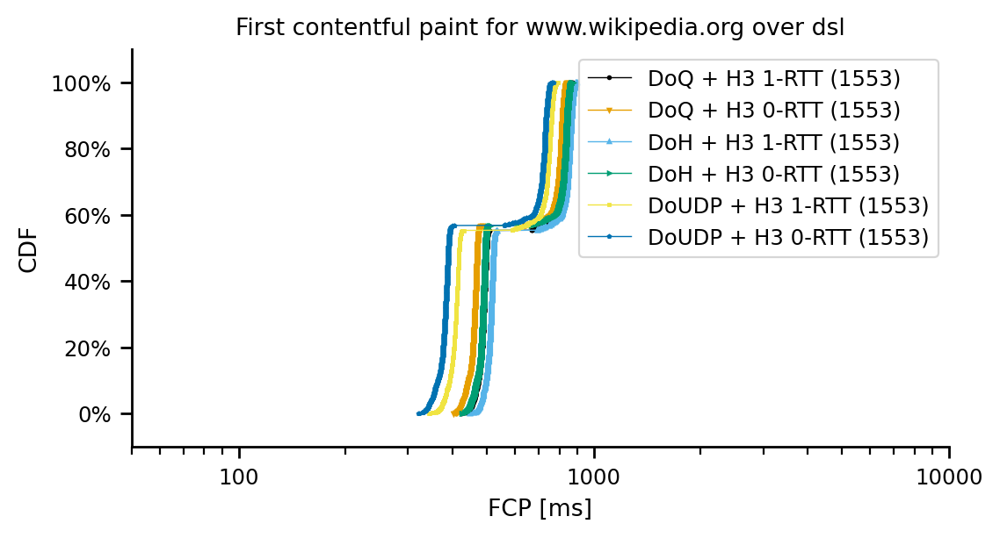

count    1550.000000
mean      344.673669
std         7.103348
min       318.625133
10%       336.096557
20%       338.507634
25%       339.588702
30%       340.455522
40%       342.615564
50%       344.509367
60%       346.325385
70%       348.518833
75%       349.883552
80%       351.466982
90%       354.498105
100%      363.777705
max       363.777705
Name: full_fcp, dtype: float64
count    1550.000000
mean      317.666637
std         6.263446
min       303.178012
10%       309.502146
20%       311.499090
25%       312.619485
30%       313.812872
40%       315.823220
50%       317.415203
60%       319.206691
70%       321.214173
75%       322.317852
80%       323.419657
90%       326.278605
100%      337.658106
max       337.658106
Name: full_fcp, dtype: float64
count    1550.000000
mean      368.767523
std         7.084519
min       341.927661
10%       360.382880
20%       362.629431
25%       363.674922
30%       364.692425
40%       366.809614
50%       368.548445
60%       370.

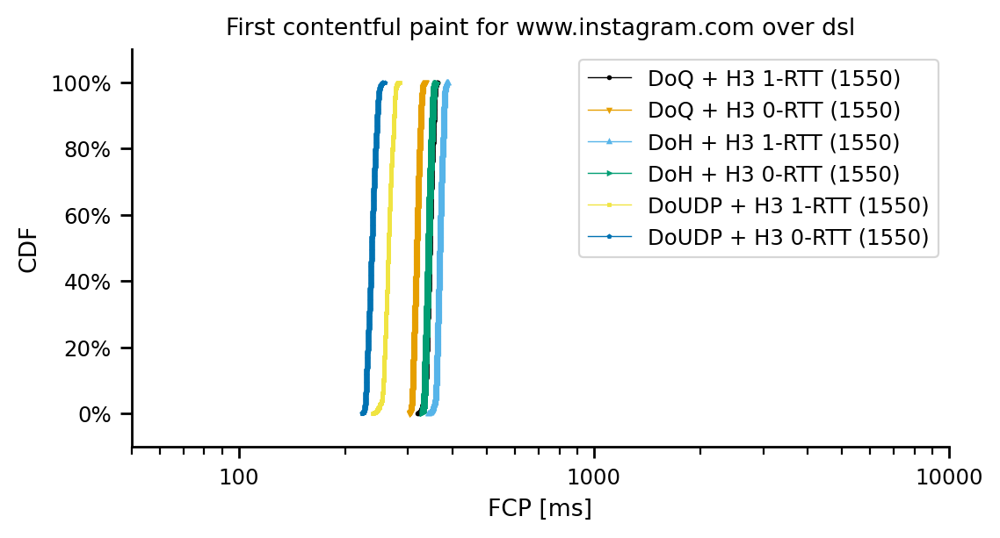

cable
count    1552.000000
mean      213.137072
std         3.561865
min       198.451888
10%       208.556729
20%       210.266808
25%       210.851787
30%       211.324058
40%       212.274315
50%       213.197186
60%       214.095688
70%       215.071372
75%       215.636591
80%       216.214187
90%       217.637923
100%      224.242056
max       224.242056
Name: full_fcp, dtype: float64
count    1552.000000
mean      200.493644
std         3.314838
min       190.731725
10%       196.083605
20%       197.539608
25%       198.173463
30%       198.673116
40%       199.648278
50%       200.481940
60%       201.305009
70%       202.264741
75%       202.839137
80%       203.492396
90%       204.852428
100%      214.172400
max       214.172400
Name: full_fcp, dtype: float64
count    1552.000000
mean      236.624428
std         3.546467
min       220.638841
10%       232.033699
20%       233.780811
25%       234.336930
30%       234.765930
40%       235.814603
50%       236.610714
60%     

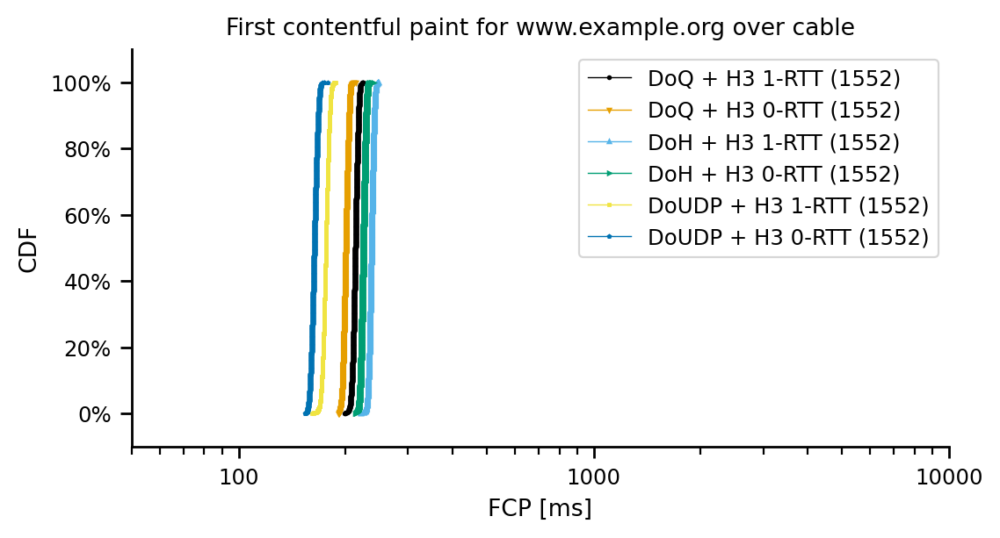

count    1551.000000
mean      496.158311
std       167.655754
min       291.171079
10%       347.280243
20%       357.927263
25%       360.574355
30%       363.181648
40%       366.907495
50%       371.417279
60%       564.512298
70%       686.379444
75%       698.013642
80%       708.500952
90%       720.063536
100%      743.325647
max       743.325647
Name: full_fcp, dtype: float64
count    1551.000000
mean      485.369723
std       170.056720
min       280.689855
10%       328.209016
20%       342.304899
25%       345.017832
30%       347.330124
40%       352.077462
50%       356.317997
60%       605.323198
70%       676.987599
75%       684.962260
80%       690.908919
90%       704.385937
100%      736.449467
max       736.449467
Name: full_fcp, dtype: float64
count    1551.000000
mean      519.641133
std       167.654299
min       315.621767
10%       370.647292
20%       381.419316
25%       384.186336
30%       386.433746
40%       390.416766
50%       394.757732
60%       587.

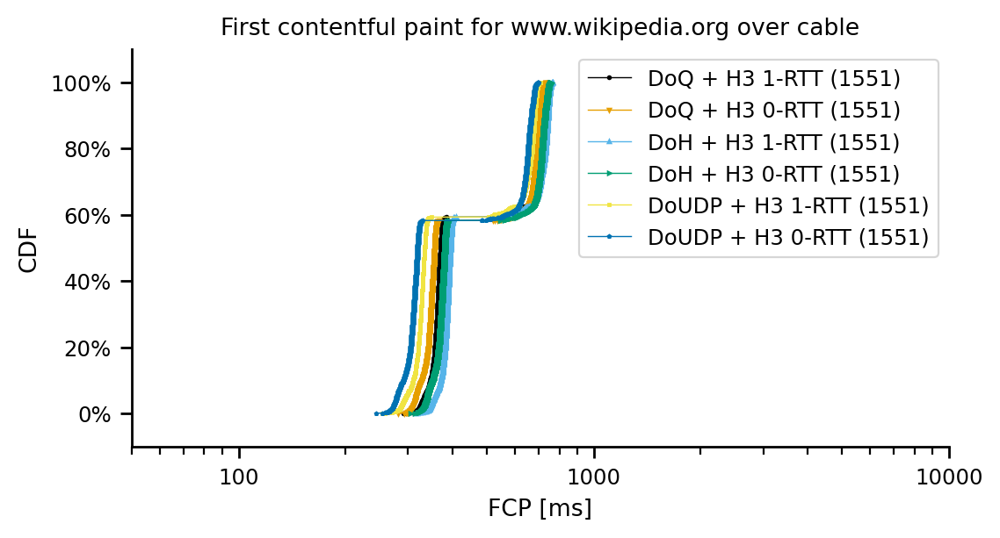

count    1550.000000
mean      220.062856
std         6.107845
min       200.932216
10%       211.986001
20%       214.091797
25%       215.237803
30%       216.371332
40%       218.302554
50%       220.252143
60%       222.049142
70%       223.957541
75%       224.906605
80%       225.933677
90%       228.093967
100%      240.180120
max       240.180120
Name: full_fcp, dtype: float64
count    1550.000000
mean      204.731049
std         5.967877
min       189.833253
10%       196.943806
20%       199.059782
25%       200.116078
30%       201.082660
40%       202.850003
50%       204.575330
60%       206.137917
70%       208.114977
75%       209.288339
80%       210.587363
90%       212.690815
100%      239.186912
max       239.186912
Name: full_fcp, dtype: float64
count    1550.000000
mean      243.565517
std         6.032826
min       224.493485
10%       235.495402
20%       237.633330
25%       238.793176
30%       239.906300
40%       241.747873
50%       243.799033
60%       245.

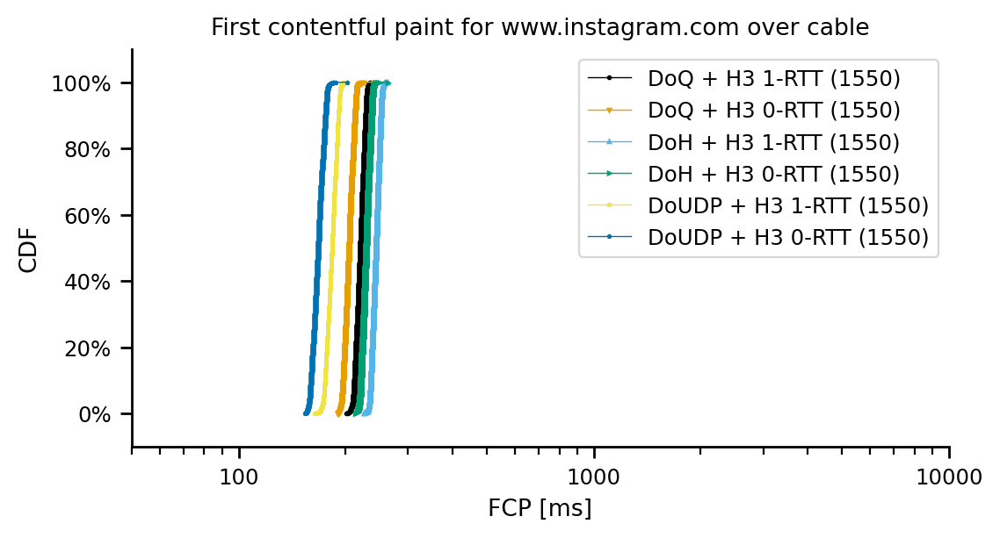

fiber
count    1555.000000
mean      168.351024
std         3.643166
min       154.896037
10%       163.630336
20%       165.244341
25%       165.884248
30%       166.507591
40%       167.473544
50%       168.390622
60%       169.208269
70%       170.280839
75%       170.973802
80%       171.592271
90%       173.128549
100%      187.103324
max       187.103324
Name: full_fcp, dtype: float64
count    1555.000000
mean      157.578677
std         3.692123
min       145.282997
10%       152.895930
20%       154.584219
25%       155.092508
30%       155.609800
40%       156.491500
50%       157.413097
60%       158.310072
70%       159.508489
75%       160.168914
80%       160.830350
90%       162.422020
100%      174.697158
max       174.697158
Name: full_fcp, dtype: float64
count    1555.000000
mean      182.203908
std         3.545598
min       169.989280
10%       177.791369
20%       179.186321
25%       179.783046
30%       180.399125
40%       181.376917
50%       182.159145
60%     

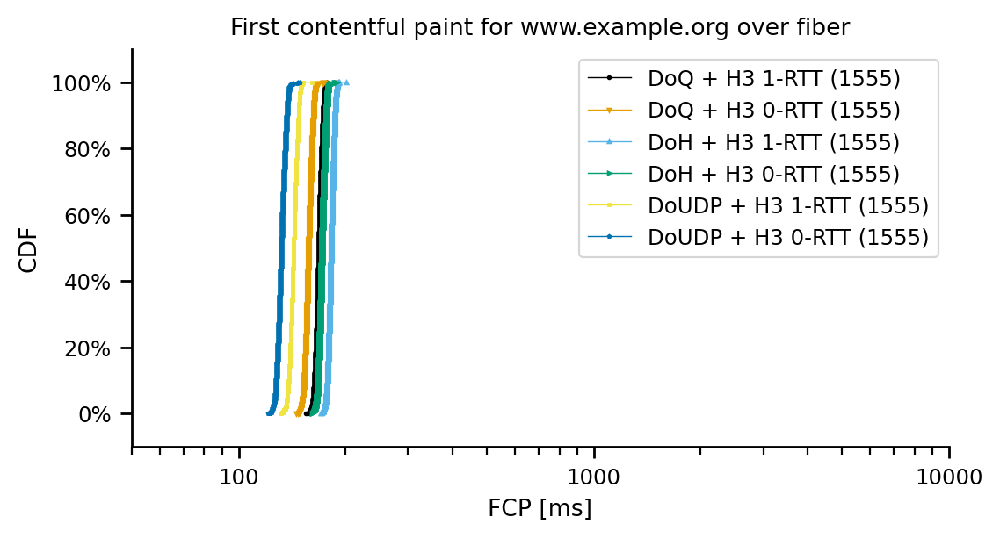

count    1551.000000
mean      453.248235
std       168.932300
min       255.395751
10%       294.480453
20%       309.581074
25%       313.282293
30%       316.037310
40%       320.920025
50%       325.403988
60%       578.702444
70%       644.171349
75%       651.365694
80%       656.333148
90%       668.705164
100%      696.981802
max       696.981802
Name: full_fcp, dtype: float64
count    1551.000000
mean      557.227281
std       142.580293
min       235.329212
10%       284.718211
20%       307.170376
25%       578.300348
30%       605.899266
40%       621.216140
50%       628.693107
60%       633.924431
70%       639.781414
75%       642.472783
80%       644.986209
90%       652.670862
100%      686.648593
max       686.648593
Name: full_fcp, dtype: float64
count    1551.000000
mean      467.092628
std       168.911673
min       268.157634
10%       308.142572
20%       323.787227
25%       327.153480
30%       330.051060
40%       334.553921
50%       339.445212
60%       592.

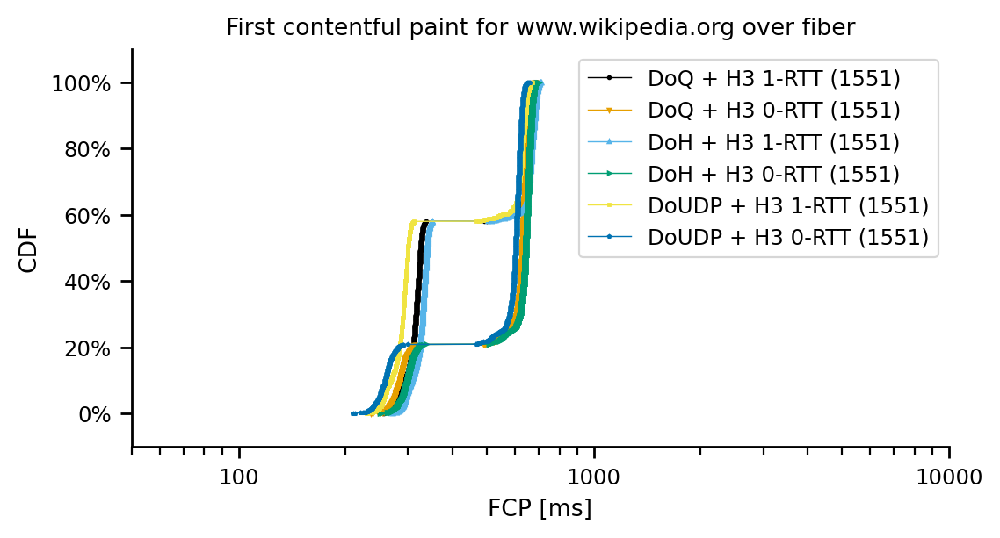

count    1550.000000
mean      173.996587
std         6.139143
min       156.353694
10%       166.586978
20%       168.515203
25%       169.298590
30%       170.250884
40%       171.804121
50%       173.561885
60%       175.540732
70%       177.385758
75%       178.276099
80%       179.755385
90%       182.384895
100%      193.017943
max       193.017943
Name: full_fcp, dtype: float64
count    1550.000000
mean      153.116910
std         2.939339
min       143.897697
10%       149.811389
20%       151.178016
25%       151.557394
30%       151.857847
40%       152.531239
50%       153.141726
60%       153.634764
70%       154.236051
75%       154.591081
80%       154.977571
90%       156.055818
100%      183.899056
max       183.899056
Name: full_fcp, dtype: float64
count    1550.000000
mean      187.887759
std         6.049172
min       170.629300
10%       180.476729
20%       182.388892
25%       183.328460
30%       183.980147
40%       185.691886
50%       187.663976
60%       189.

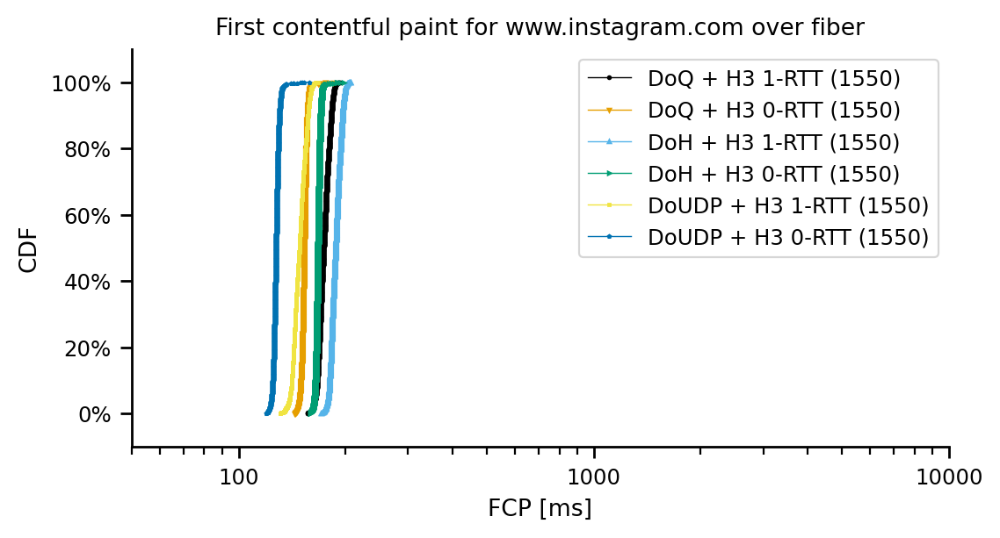

4g
count    1553.000000
mean      482.795117
std       106.041753
min       466.580855
10%       475.784034
20%       477.269483
25%       477.752268
30%       478.230815
40%       479.132352
50%       480.018569
60%       480.889559
70%       481.977135
75%       482.546357
80%       483.196920
90%       484.687107
100%     4656.746547
max      4656.746547
Name: full_fcp, dtype: float64
count    1553.000000
mean      469.401749
std       105.560103
min       455.796580
10%       462.346363
20%       463.851378
25%       464.366719
30%       464.983901
40%       465.873861
50%       466.670352
60%       467.528464
70%       468.572973
75%       469.082090
80%       469.626910
90%       471.021249
100%     4624.646547
max      4624.646547
Name: full_fcp, dtype: float64
count    1553.000000
mean      573.681898
std       106.002592
min       558.127530
10%       566.719402
20%       568.185328
25%       568.743200
30%       569.163358
40%       570.024168
50%       570.891654
60%       5

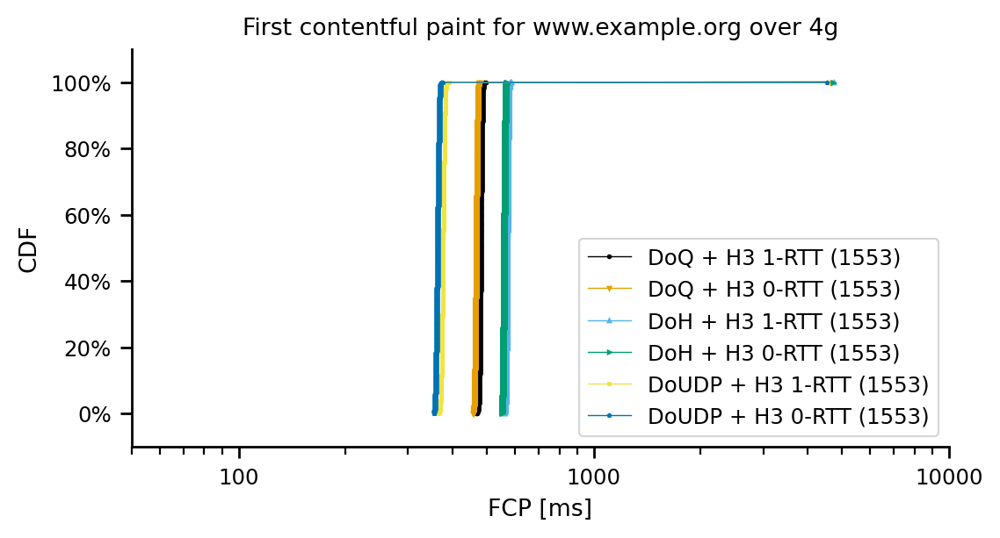

count    1551.000000
mean      926.141429
std       117.592084
min       576.774705
10%       629.321239
20%       932.598526
25%       945.886711
30%       954.822762
40%       964.900693
50%       972.134466
60%       976.987974
70%       981.632917
75%       983.677320
80%       986.044120
90%       991.664076
100%     1018.733567
max      1018.733567
Name: full_fcp, dtype: float64
count    1551.000000
mean      912.303389
std       116.320361
min       561.367164
10%       614.477825
20%       919.645532
25%       932.895703
30%       940.132722
40%       950.038035
50%       956.642005
60%       962.206711
70%       966.650388
75%       968.658687
80%       970.979671
90%       976.861503
100%      996.722915
max       996.722915
Name: full_fcp, dtype: float64
count    1551.000000
mean     1017.043798
std       117.570567
min       667.918395
10%       719.892057
20%      1023.500911
25%      1036.763329
30%      1045.642689
40%      1055.698509
50%      1062.958386
60%      1067.

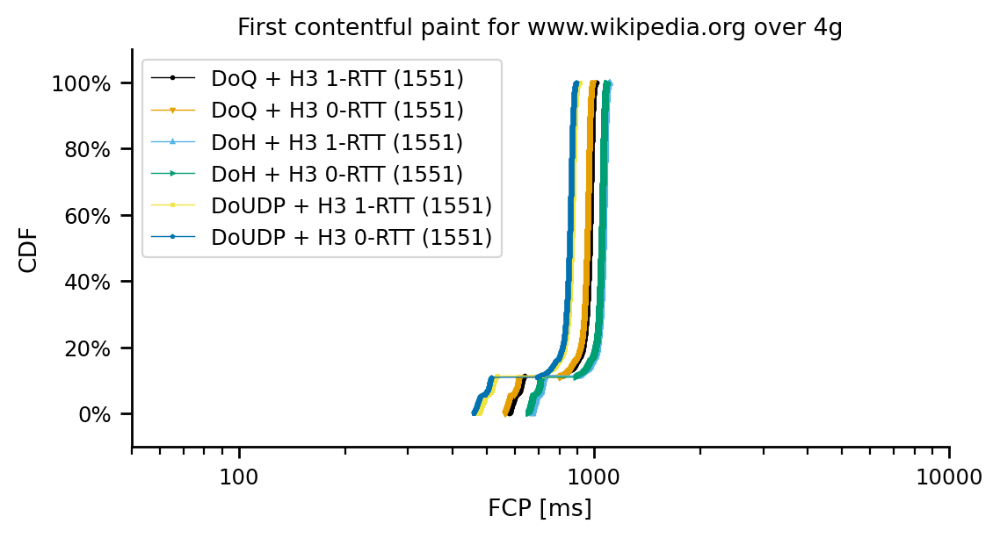

count    1550.000000
mean      486.636605
std         6.475003
min       469.475065
10%       478.323937
20%       480.670744
25%       481.672236
30%       482.602120
40%       484.292157
50%       486.292371
60%       488.113776
70%       490.032921
75%       491.267137
80%       492.937429
90%       495.717818
100%      505.686547
max       505.686547
Name: full_fcp, dtype: float64
count    1550.000000
mean      470.785766
std         6.134360
min       457.808759
10%       462.759269
20%       464.960875
25%       465.997145
30%       467.095426
40%       468.971808
50%       470.432629
60%       472.123175
70%       474.226684
75%       475.416479
80%       476.811427
90%       479.175926
100%      490.746991
max       490.746991
Name: full_fcp, dtype: float64
count    1550.000000
mean      577.523990
std         6.444515
min       558.900049
10%       569.339227
20%       571.609392
25%       572.556958
30%       573.450423
40%       575.291605
50%       577.068196
60%       579.

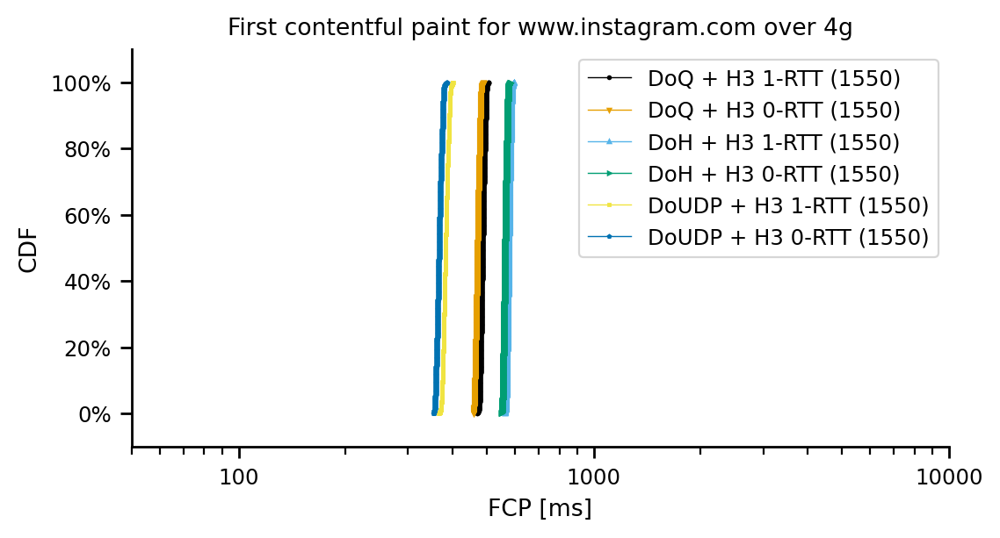

4g-medium
count    1553.000000
mean      537.814963
std         3.562244
min       521.510362
10%       533.424685
20%       535.078200
25%       535.640930
30%       536.087436
40%       537.043076
50%       537.761451
60%       538.608824
70%       539.642306
75%       540.210988
80%       540.841355
90%       542.110630
100%      579.115298
max       579.115298
Name: full_fcp, dtype: float64
count    1553.000000
mean      524.536212
std         3.285605
min       512.133328
10%       520.366823
20%       521.726418
25%       522.307358
30%       522.798422
40%       523.679353
50%       524.469446
60%       525.421967
70%       526.472281
75%       526.958823
80%       527.418035
90%       528.895692
100%      534.513368
max       534.513368
Name: full_fcp, dtype: float64
count    1553.000000
mean      638.840258
std         3.549650
min       624.595481
10%       634.624682
20%       636.067782
25%       636.590061
30%       637.209976
40%       638.018172
50%       638.713526
60% 

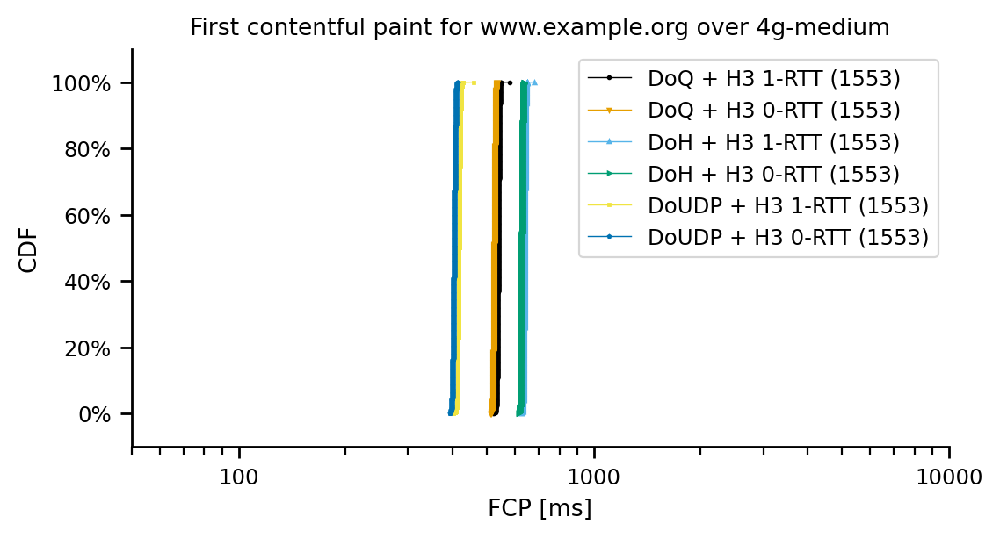

count    1551.000000
mean      998.953213
std        95.802449
min       644.061682
10%       925.211592
20%      1002.729674
25%      1010.325641
30%      1016.028883
40%      1023.733877
50%      1029.500265
60%      1034.536068
70%      1039.019507
75%      1041.045774
80%      1043.254263
90%      1050.581573
100%     1077.683207
max      1077.683207
Name: full_fcp, dtype: float64
count    1551.000000
mean      984.578745
std        94.109524
min       628.975042
10%       916.075713
20%       988.305337
25%       996.109505
30%      1002.219926
40%      1009.763520
50%      1014.966779
60%      1019.199679
70%      1023.084420
75%      1025.312702
80%      1028.055787
90%      1033.843729
100%     1063.538044
max      1063.538044
Name: full_fcp, dtype: float64
count    1551.000000
mean     1099.985997
std        95.769984
min       745.064357
10%      1026.032589
20%      1103.670868
25%      1111.380900
30%      1117.164040
40%      1124.730058
50%      1130.702351
60%      1135.

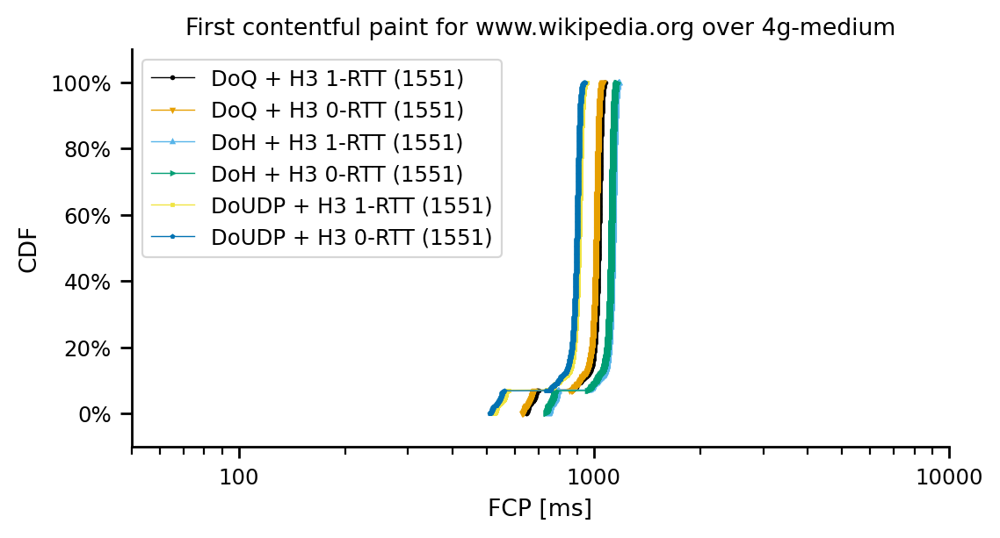

count    1550.000000
mean      544.498642
std         6.805897
min       525.982888
10%       536.457849
20%       538.407771
25%       539.193178
30%       540.105032
40%       542.048642
50%       543.909192
60%       545.849111
70%       547.860946
75%       549.308471
80%       550.762732
90%       553.650907
100%      622.401568
max       622.401568
Name: full_fcp, dtype: float64
count    1550.000000
mean      528.676771
std         6.198596
min       511.087502
10%       520.859571
20%       522.817500
25%       523.744726
30%       524.510963
40%       526.381746
50%       528.233816
60%       530.032378
70%       531.833217
75%       533.232872
80%       534.751314
90%       537.804065
100%      546.334688
max       546.334688
Name: full_fcp, dtype: float64
count    1550.000000
mean      645.511378
std         6.764258
min       626.609696
10%       637.593341
20%       639.373868
25%       640.259548
30%       641.128947
40%       643.116609
50%       644.914658
60%       646.

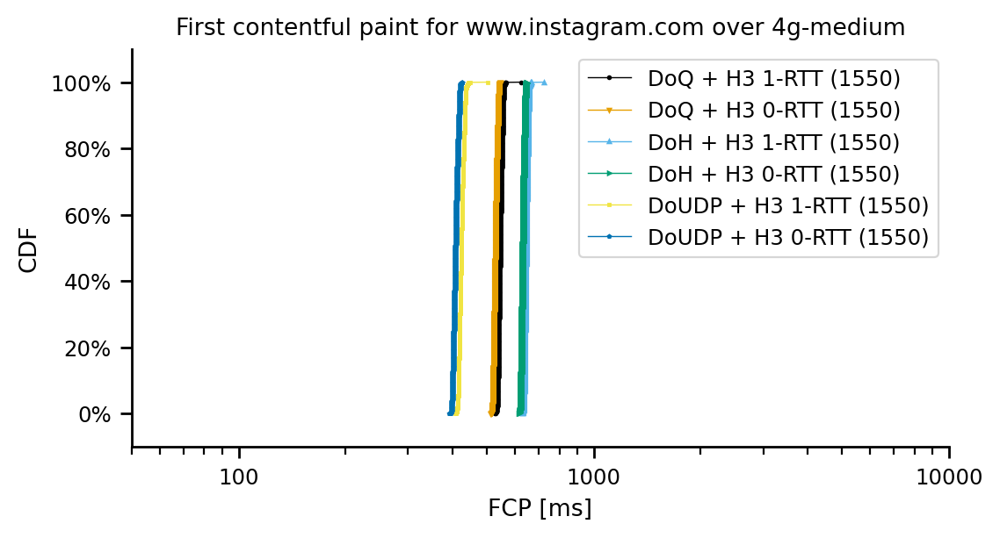

In [1319]:
for access_technology in df_dns_and_h3.experiment_type.unique():
    print(access_technology)
    df_plt = df_dns_and_h3[df_dns_and_h3.experiment_type == access_technology][['full_fcp', 'experiment_description', 'website']].copy()
    for website in df_plt['website'].unique():
        fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
        line_order = ['DoQ + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 1-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
        colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
        markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

        lnwidth = 0.5
        mrksize = 1
        log=True
        for experiment in line_order:
                df_tmp = df_plt[(df_plt.experiment_description == experiment) & (df_plt.website == website)]
                if len(df_tmp['full_fcp']) == 0:
                    continue
                print(df_tmp['full_fcp'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['full_fcp'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        if log:
            ax.set_xscale('log')


        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.tick_params(axis='x', which='minor', labelsize=6)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')


        ax.set_title('First contentful paint for '+website+' over '+access_technology)

        ax.set_xlabel('FCP [ms]')

        ax.set_ylabel("CDF")
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(50,10000)


        ax.legend()

        #if log:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
        #else:
        #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [59]:
df_dns_and_h3.experiment_description.unique()

array(['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoUDP + H3 1-RTT',
       'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 0-RTT'],
      dtype=object)

In [60]:
df_diff_plt_udp = pd.DataFrame(columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_udp = df_website[df_website['experiment_description'] == 'DoUDP + H3 1-RTT'].copy()
        median_udp = df_udp['full_plt'].median()
        if median_udp is not np.nan:
            next_df_row = []
            for protocol in ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_plt'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_udp/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_plt_udp.columns)
            df_diff_plt_udp = df_diff_plt_udp.append(next_df_series, ignore_index=True)
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.848996,31.899055,41.432480,dsl,www.example.org
1,7.294833,10.811116,14.031047,dsl,www.wikipedia.org
2,2.900573,4.487518,5.835651,dsl,www.instagram.com
3,14.362139,21.783214,35.621675,cable,www.example.org
4,3.082894,5.551481,9.091050,cable,www.wikipedia.org
5,2.831296,5.212052,8.518553,cable,www.instagram.com
6,11.486109,21.090916,32.187133,fiber,www.example.org
7,-0.053223,4.024505,6.257463,fiber,www.wikipedia.org
8,1.211728,3.915794,6.031104,fiber,www.instagram.com
9,24.352207,27.929838,52.456455,4g,www.example.org


In [61]:
df_diff_plt_quic = pd.DataFrame(columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_baseline = df_website[df_website['experiment_description'] == 'DoQ + H3 0-RTT'].copy()
        median_baseline = df_baseline['full_plt'].median()
        if median_baseline is not np.nan:
            next_df_row = []
            for protocol in ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_plt'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_baseline/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_plt_quic.columns)
            df_diff_plt_quic = df_diff_plt_quic.append(next_df_series, ignore_index=True)
df_diff_plt_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.931208,8.247962,16.071929,dsl,www.example.org
1,-6.798867,3.277215,6.278228,dsl,www.wikipedia.org
2,-2.818811,1.542212,2.852344,dsl,www.instagram.com
3,-12.558474,6.489101,18.589662,cable,www.example.org
4,-2.990694,2.394759,5.828471,cable,www.wikipedia.org
5,-2.753341,2.315205,5.530667,cable,www.instagram.com
6,-10.302727,8.615250,18.568254,fiber,www.example.org
7,0.053252,4.079900,6.314048,fiber,www.wikipedia.org
8,-1.197221,2.671693,4.761678,fiber,www.instagram.com
9,-19.583253,2.877014,22.600522,4g,www.example.org


In [62]:
df_diff_fcp_udp = pd.DataFrame(columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_udp = df_website[df_website['experiment_description'] == 'DoUDP + H3 1-RTT'].copy()
        median_udp = df_udp['full_fcp'].median()
        if median_udp is not np.nan:
            next_df_row = []
            for protocol in ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_fcp'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_udp/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_fcp_udp.columns)
            df_diff_fcp_udp = df_diff_fcp_udp.append(next_df_series, ignore_index=True)
df_diff_fcp_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.327948,31.145891,40.467792,dsl,www.example.org
1,12.519831,19.236920,24.965509,dsl,www.wikipedia.org
2,20.146526,30.435308,39.557497,dsl,www.instagram.com
3,13.857970,21.073900,34.387375,cable,www.example.org
4,6.671441,11.149926,18.132760,cable,www.wikipedia.org
5,11.763375,20.206243,33.016398,cable,www.instagram.com
6,10.262438,17.842748,27.530151,fiber,www.example.org
7,109.490105,8.496463,13.090461,fiber,www.wikipedia.org
8,3.437928,17.159320,26.601871,fiber,www.instagram.com
9,24.001271,27.499820,51.614518,4g,www.example.org


In [63]:
df_diff_fcp_quic = pd.DataFrame(columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'experiment_type', 'website'])
for access_technology in df_dns_and_h3['experiment_type'].unique():
    df_access_tech = df_dns_and_h3[df_dns_and_h3['experiment_type'] == access_technology].copy()
    for website in df_access_tech['website'].unique():
        df_website = df_access_tech[df_access_tech['website'] == website].copy()
        df_baseline = df_website[df_website['experiment_description'] == 'DoQ + H3 0-RTT'].copy()
        median_baseline = df_baseline['full_fcp'].median()
        if median_baseline is not np.nan:
            next_df_row = []
            for protocol in ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']:
                df_protocol = df_website[df_website['experiment_description'] == protocol].copy()
                median_protocol = df_protocol['full_fcp'].median()
                #minimize floating point errors I guess?
                increase = (median_protocol/(median_baseline/100))-100
                if increase is np.nan:
                    increase = 0
                next_df_row.append(increase)
            next_df_row.append(access_technology)
            next_df_row.append(website)
            next_df_series = pd.Series(next_df_row, index = df_diff_fcp_quic.columns)
            df_diff_fcp_quic = df_diff_fcp_quic.append(next_df_series, ignore_index=True)
df_diff_fcp_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.578759,8.092070,15.775297,dsl,www.example.org
1,-11.126778,5.969693,11.060875,dsl,www.wikipedia.org
2,-16.768297,8.563528,16.156082,dsl,www.instagram.com
3,-12.171278,6.337659,18.030714,cable,www.example.org
4,-6.254196,4.198392,10.744505,cable,www.wikipedia.org
5,-10.525251,7.554235,19.016089,cable,www.instagram.com
6,-9.307284,6.874789,15.660558,fiber,www.example.org
7,-52.265048,-48.209266,-46.016323,fiber,www.wikipedia.org
8,-3.323663,13.265340,22.394052,fiber,www.instagram.com
9,-19.355665,2.821382,22.268520,4g,www.example.org


DoQ + H3 0-RTT
count    15.000000
mean      9.910808
std       8.417728
min      -0.053223
10%       1.859555
20%       2.886717
25%       2.991733
30%       3.615584
40%       6.011976
50%       7.294833
60%      10.589694
70%      11.469797
75%      12.924124
80%      15.859511
90%      23.350923
100%     25.958158
max      25.958158
Name: DoQ + H3 0-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean     13.758468
std       9.955089
min       3.915794
10%       4.209710
20%       5.067145
25%       5.381766
30%       6.002560
40%       7.811169
50%      10.811116
60%      12.309896
70%      19.488478
75%      21.437065
80%      23.012539
90%      28.676667
100%     31.899055
max      31.899055
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     22.696382
std      16.657287
min       5.835651
10%       6.121648
20%       8.066335
25%       8.804801
30%      10.079049
40%      14.246620
50%      14.657176
60%      22.924773
70%      30.564526
75%    

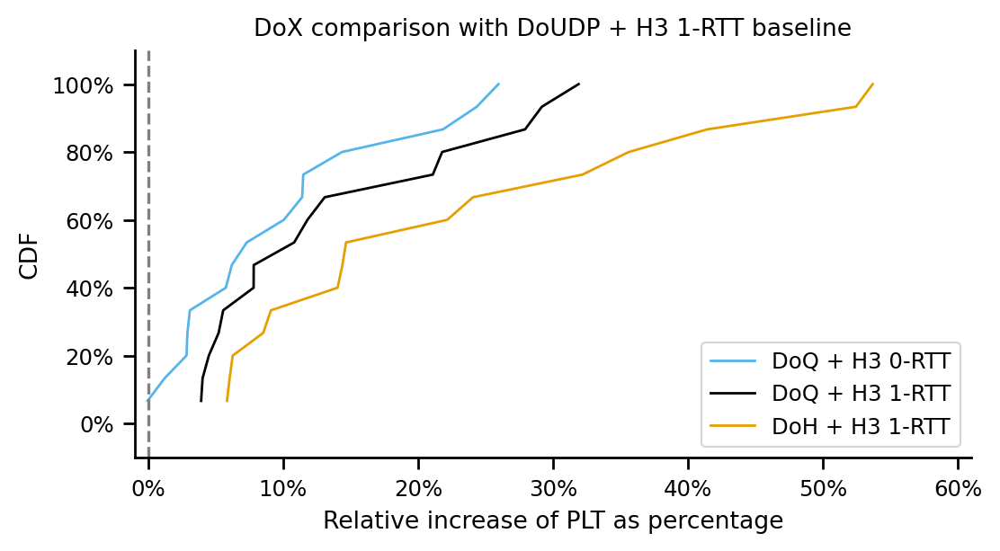

In [78]:
df_tmp = df_diff_plt_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP + H3 1-RTT baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-1, 61)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoUDP + H3 1-RTT
count    15.000000
mean     -8.541245
std       6.671286
min     -20.608556
10%     -18.922435
20%     -13.633021
25%     -11.430600
30%     -10.289593
40%      -9.572396
50%      -6.798867
60%      -5.670640
70%      -3.479372
75%      -2.904752
80%      -2.805717
90%      -1.819669
100%      0.053252
max       0.053252
Name: DoUDP + H3 1-RTT, dtype: float64
DoQ + H3 1-RTT
count    15.000000
mean      3.442434
std       2.395351
min       1.502793
10%       1.535040
20%       1.581274
25%       1.769800
30%       2.021889
40%       2.362937
50%       2.553543
60%       2.753821
70%       3.197175
75%       3.678558
80%       4.561740
90%       7.544418
100%      8.615250
max       8.615250
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    15.000000
mean     11.196773
std       6.654228
min       2.852344
10%       5.069274
20%       5.768910
25%       6.053349
30%       6.285392
40%       7.159583
50%       8.426610
60%      11.152834
70%      15.132055
75%

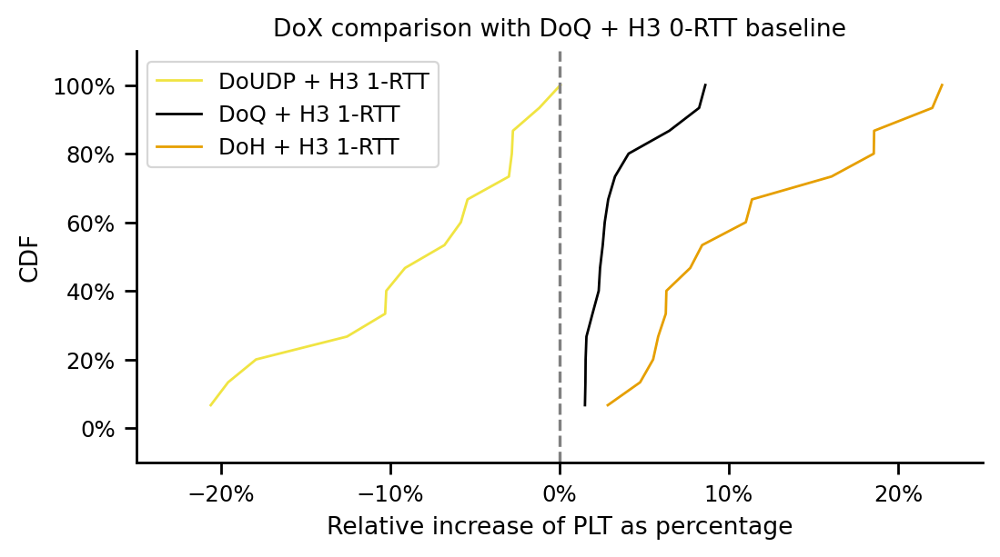

In [179]:
df_tmp = df_diff_plt_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoQ + H3 0-RTT baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-25, 25)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoUDP + H3 1-RTT
count    10.000000
mean    -14.748635
std       5.708655
min     -20.365844
10%     -19.823736
20%     -19.403520
25%     -19.143359
30%     -18.837060
40%     -17.993104
50%     -17.177080
60%     -14.941936
70%     -11.639969
75%     -10.839675
80%     -10.170298
90%      -8.665766
100%     -3.216672
max      -3.216672
Name: DoUDP + H3 1-RTT, dtype: float64
DoQ + H3 1-RTT
count    10.000000
mean      6.269901
std       3.428255
min       2.534372
10%       2.827716
20%       2.946068
25%       3.068458
30%       3.250169
40%       5.153928
50%       6.658022
60%       7.249463
70%       7.799071
75%       8.003026
80%       8.200243
90%       9.015703
100%     13.334157
max      13.334157
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    10.000000
mean     19.622007
std       2.999749
min      15.720451
10%      15.775234
20%      16.043673
25%      16.587186
30%      17.447452
40%      18.712324
50%      20.478012
60%      21.905219
70%      22.162092
75%

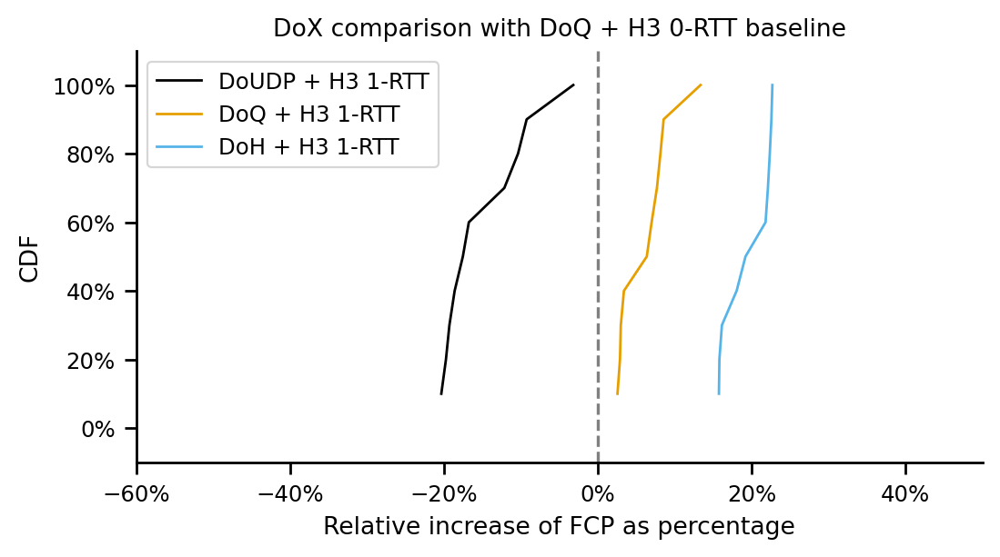

In [1326]:
df_tmp = df_diff_fcp_quic[df_diff_fcp_quic.website != 'www.wikipedia.org']
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoQ + H3 0-RTT baseline')

ax.set_xlabel('Relative increase of FCP as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-60, 50)
ax.legend()


if log:
    fig.savefig('figures/fcp-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/fcp-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1327]:
df_diff_fcp_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.566599,8.116335,15.781321,dsl,www.example.org
1,-11.105124,5.995100,11.120593,dsl,www.wikipedia.org
2,-16.787562,8.535875,16.109261,dsl,www.instagram.com
3,-12.173498,6.342340,18.020962,cable,www.example.org
4,-6.185944,4.237586,10.788042,cable,www.wikipedia.org
5,-10.395067,7.663101,19.173233,cable,www.instagram.com
6,-9.271221,6.973705,15.720451,fiber,www.example.org
7,-52.306082,-48.241203,-46.007804,fiber,www.wikipedia.org
8,-3.216672,13.334157,22.542680,fiber,www.instagram.com
9,-19.313524,2.860310,22.332960,4g,www.example.org


DoQ + H3 0-RTT
count    10.000000
mean     17.753049
std       7.525497
min       3.323580
10%       9.529108
20%      11.324521
25%      12.165961
30%      13.182894
40%      17.648945
50%      20.742196
60%      21.945925
70%      23.210769
75%      23.677315
80%      24.075518
90%      24.725831
100%     25.574258
max      25.574258
Name: DoQ + H3 0-RTT, dtype: float64
DoQ + H3 1-RTT
count    10.000000
mean     24.944081
std       5.317530
min      17.100909
10%      17.824529
20%      19.703463
25%      20.385394
30%      20.803532
40%      24.658758
50%      27.262272
60%      27.820890
70%      28.458041
75%      28.650085
80%      29.091875
90%      30.504644
100%     31.155979
max      31.155979
Name: DoQ + H3 1-RTT, dtype: float64
DoH + H3 1-RTT
count    10.000000
mean     40.898945
std      10.397046
min      26.615485
10%      27.452474
20%      31.907909
25%      33.343805
30%      33.965323
40%      37.471991
50%      39.993959
60%      44.575868
70%      51.015230
75%    

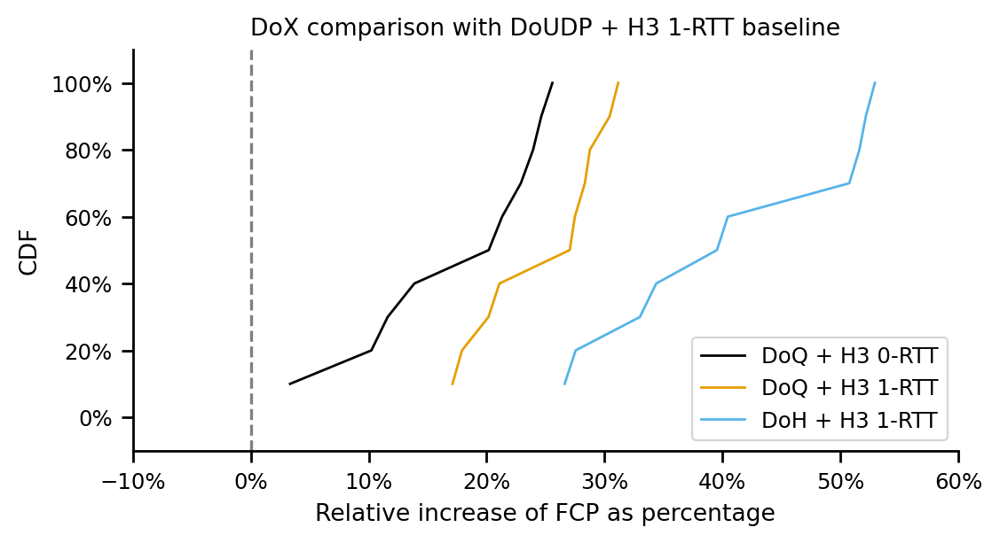

In [1328]:
df_tmp = df_diff_fcp_udp[df_diff_fcp_udp.website != 'www.wikipedia.org']
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP + H3 1-RTT baseline')

ax.set_xlabel('Relative increase of FCP as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-10, 60)
ax.legend()


if log:
    fig.savefig('figures/fcp-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/fcp-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1329]:
df_diff_fcp_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.310050,31.155979,40.454379,dsl,www.example.org
1,12.492423,19.236457,25.002248,dsl,www.wikipedia.org
2,20.174342,30.432273,39.533540,dsl,www.instagram.com
3,13.860849,21.082291,34.379669,cable,www.example.org
4,6.593835,11.110841,18.093223,cable,www.wikipedia.org
5,11.600999,20.153095,32.998518,cable,www.instagram.com
6,10.218611,17.904931,27.545473,fiber,www.example.org
7,109.670342,8.522846,13.205621,fiber,www.wikipedia.org
8,3.323580,17.100909,26.615485,fiber,www.instagram.com
9,23.936508,27.481475,51.615198,4g,www.example.org


In [139]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

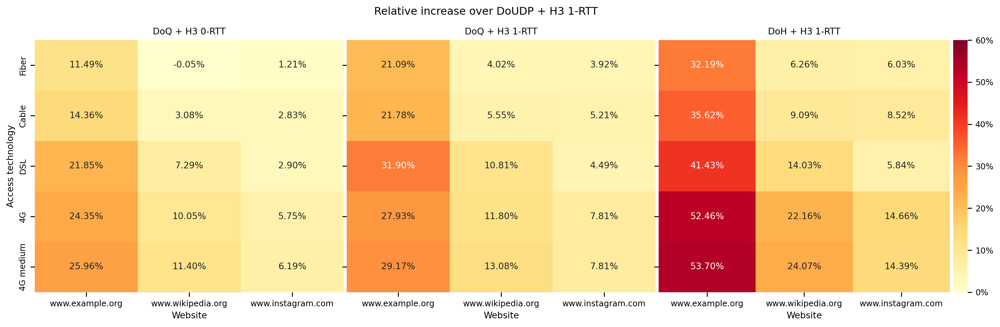

In [242]:
index_order=['fiber', 'cable', 'dsl', '4g', '4g-medium']
fig, axs = plt.subplots(1, 3, sharex='all', figsize=(18,5), sharey='all')
divider = make_axes_locatable(axs.flat[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
ax_hm1 = sns.heatmap(df_diff_plt_udp[['DoQ + H3 0-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoQ + H3 0-RTT')[['www.example.org', 'www.wikipedia.org', 'www.instagram.com']].reindex(index=index_order), ax=axs.flat[0], cbar_ax=cax, cmap="YlOrRd", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=0, vmax=60)
ax_hm2 = sns.heatmap(df_diff_plt_udp[['DoQ + H3 1-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoQ + H3 1-RTT')[['www.example.org', 'www.wikipedia.org', 'www.instagram.com']].reindex(index=index_order), ax=axs.flat[1], cbar_ax=cax, cmap="YlOrRd", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=0, vmax=60)
ax_hm3 = sns.heatmap(df_diff_plt_udp[['DoH + H3 1-RTT', 'experiment_type', 'website']].pivot(index='experiment_type', columns='website', values='DoH + H3 1-RTT')[['www.example.org', 'www.wikipedia.org', 'www.instagram.com']].reindex(index=index_order), ax=axs.flat[2], cbar_ax=cax, cmap="YlOrRd", annot=True, fmt='.2f', cbar_kws={'format': '%.0f%%'}, vmin=0, vmax=60)
axs.flat[0].set_title('DoQ + H3 0-RTT')
axs.flat[1].set_title('DoQ + H3 1-RTT')
axs.flat[2].set_title('DoH + H3 1-RTT')
fig.suptitle('Relative increase over DoUDP + H3 1-RTT')
ax_hm1.set_yticklabels(labels=ax_hm1.get_yticklabels(), va='center')
for t in ax_hm1.texts: t.set_text(t.get_text() + "%")
for t in ax_hm2.texts: t.set_text(t.get_text() + "%")
for t in ax_hm3.texts: t.set_text(t.get_text() + "%")
for ax in axs.flat:
    ax.set_ylabel('')
    ax.set_xlabel('Website')
axs.flat[0].set_ylabel('Access technology')
axs.flat[0].set_yticklabels(['Fiber', 'Cable', 'DSL', '4G', '4G medium'])
plt.subplots_adjust(wspace=0.01)
plt.savefig("figures/plt-doudp-baseline-heatmap.pdf", bbox_inches='tight')
plt.show()

In [151]:
from statistics import geometric_mean

In [156]:
df_diff_plt_quic

,DoUDP + H3 1-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,-17.931208,8.247962,16.071929,dsl,www.example.org
1,-6.798867,3.277215,6.278228,dsl,www.wikipedia.org
2,-2.818811,1.542212,2.852344,dsl,www.instagram.com
3,-12.558474,6.489101,18.589662,cable,www.example.org
4,-2.990694,2.394759,5.828471,cable,www.wikipedia.org
5,-2.753341,2.315205,5.530667,cable,www.instagram.com
6,-10.302727,8.615250,18.568254,fiber,www.example.org
7,0.053252,4.079900,6.314048,fiber,www.wikipedia.org
8,-1.197221,2.671693,4.761678,fiber,www.instagram.com
9,-19.583253,2.877014,22.600522,4g,www.example.org


In [157]:
geometric_mean(df_diff_plt_quic['DoQ + H3 1-RTT'].values.tolist())

2.869846221966978

In [168]:
df_dns_and_h3.sort_values(['msm_id', 'experiment_description']).head(6)

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,website,elapsed,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,connect_duration,secure_connect_duration
210928,00014eb5-7dad-4ded-8447-4246c29dd4fc,143.1,47.2,262.9,262.8,262.8,262.8,47.2,47.1,262.9,...,www.example.org,286.992509,DoH,549.892509,555.292509,555.292509,H3 0-RTT,DoH + H3 0-RTT,95.9,95.5
210925,00014eb5-7dad-4ded-8447-4246c29dd4fc,147.7,46.3,275.9,275.9,275.9,275.9,46.3,46.3,275.9,...,www.example.org,286.992509,DoH,562.892509,568.892509,568.892509,H3 1-RTT,DoH + H3 1-RTT,101.4,101.0
210927,00014eb5-7dad-4ded-8447-4246c29dd4fc,143.1,47.2,262.9,262.8,262.8,262.8,47.2,47.1,262.9,...,www.example.org,195.534265,DoQ,458.434265,463.834265,463.834265,H3 0-RTT,DoQ + H3 0-RTT,95.9,95.5
210924,00014eb5-7dad-4ded-8447-4246c29dd4fc,147.7,46.3,275.9,275.9,275.9,275.9,46.3,46.3,275.9,...,www.example.org,195.534265,DoQ,471.434265,477.434265,477.434265,H3 1-RTT,DoQ + H3 1-RTT,101.4,101.0
210929,00014eb5-7dad-4ded-8447-4246c29dd4fc,143.1,47.2,262.9,262.8,262.8,262.8,47.2,47.1,262.9,...,www.example.org,92.622478,DoUDP,355.522478,360.922478,360.922478,H3 0-RTT,DoUDP + H3 0-RTT,95.9,95.5
210926,00014eb5-7dad-4ded-8447-4246c29dd4fc,147.7,46.3,275.9,275.9,275.9,275.9,46.3,46.3,275.9,...,www.example.org,92.622478,DoUDP,368.522478,374.522478,374.522478,H3 1-RTT,DoUDP + H3 1-RTT,101.4,101.0


In [173]:
def relative_diff(series):
    baseline = series.values[5]
    protocol = series.values[2]
    return (protocol/(baseline/100))-100
df_doq_h3_0rtt_vs_doudp = df_dns_and_h3.sort_values(['msm_id', 'experiment_description']).groupby(['msm_id','website', 'experiment_type'], as_index=False).agg({'full_plt':(lambda x: relative_diff(x))})

In [175]:
df_doq_h3_0rtt_vs_doudp[df_doq_h3_0rtt_vs_doudp.full_plt < 0]

,msm_id,website,experiment_type,full_plt
10,000b1474-ede6-413b-a424-e3b98548e1ab,www.wikipedia.org,cable,-1.517626
18,001472ba-e67d-41f5-88e3-cbeec43da10d,www.wikipedia.org,dsl,-4.681619
29,001d7e94-93e3-46b4-9338-bd2c54cd47a4,www.wikipedia.org,fiber,-20.748763
32,0024c26d-fca8-4880-9ba5-cf4d6ac70ff4,www.wikipedia.org,fiber,-3.995814
38,0028a96c-aba8-4883-9902-f83bffa8f9bf,www.wikipedia.org,fiber,-2.727626
...,...,...,...,...
57385,ffcd97b3-9305-46dc-9011-f67c70eb1e44,www.instagram.com,fiber,-0.452816
57392,ffd4e762-1adf-4b24-a31f-9b4d12991b8f,www.instagram.com,fiber,-2.108440
57402,ffdc9654-139c-4d0f-89cc-1551346c5a40,www.wikipedia.org,fiber,-4.154707
57411,ffe5c2cb-c693-487a-ac26-8af2ee90f5e5,www.example.org,fiber,-2.177320


In [1331]:
df_diff_plt_udp

,DoQ + H3 0-RTT,DoQ + H3 1-RTT,DoH + H3 1-RTT,experiment_type,website
0,21.827841,31.893036,41.403905,dsl,www.example.org
1,7.283769,10.783852,14.039343,dsl,www.wikipedia.org
2,2.919463,4.488775,5.838109,dsl,www.instagram.com
3,14.341713,21.782585,35.592490,cable,www.example.org
4,3.177555,5.541306,9.071641,cable,www.wikipedia.org
5,2.814855,5.219532,8.524726,cable,www.instagram.com
6,11.491486,21.114406,32.209591,fiber,www.example.org
7,-0.031678,4.053431,6.262358,fiber,www.wikipedia.org
8,1.186823,3.903154,6.038253,fiber,www.instagram.com
9,24.375520,27.934624,52.474746,4g,www.example.org


In [81]:
df_udp_baseline_medians = df_dns_and_h3[df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT'].groupby(['website','experiment_type'], as_index=False).agg(full_plt_udp_med=('full_plt', 'median'), full_fcp_udp_med=('full_fcp', 'median'))

In [82]:
df_diff_all_data_udp_baseline_medians = pd.merge(df_dns_and_h3[df_dns_and_h3.experiment_description != 'DoUDP + H3 1-RTT'], df_udp_baseline_medians, on=['website', 'experiment_type'])
df_diff_all_data_udp_baseline_medians['relative_increase_plt'] = (df_diff_all_data_udp_baseline_medians['full_plt']/(df_diff_all_data_udp_baseline_medians['full_plt_udp_med']/100))-100
df_diff_all_data_udp_baseline_medians['relative_increase_fcp'] = (df_diff_all_data_udp_baseline_medians['full_fcp']/(df_diff_all_data_udp_baseline_medians['full_fcp_udp_med']/100))-100
df_diff_all_data_udp_baseline_medians

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,full_plt_udp_med,full_fcp_udp_med,relative_increase_plt,relative_increase_fcp
0,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoQ,317.497970,321.397970,321.397970,H3 1-RTT,DoQ + H3 1-RTT,252.223264,258.300485,25.879733,24.427939
1,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoH,341.212289,345.112289,345.112289,H3 1-RTT,DoH + H3 1-RTT,252.223264,258.300485,35.281847,33.608843
2,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoQ,305.797970,311.497970,311.497970,H3 0-RTT,DoQ + H3 0-RTT,252.223264,258.300485,21.240985,20.595194
3,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoH,329.512289,335.212289,335.212289,H3 0-RTT,DoH + H3 0-RTT,252.223264,258.300485,30.643099,29.776097
4,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoUDP,225.047707,230.747707,230.747707,H3 0-RTT,DoUDP + H3 0-RTT,252.223264,258.300485,-10.774405,-10.666948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287175,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,163.5,46.8,1440.2,1134.0,1134.0,1134.0,46.8,46.7,1441.0,...,DoQ,1666.409069,548.209069,548.209069,H3 1-RTT,DoQ + H3 1-RTT,1536.121603,423.899297,8.481585,29.325307
287176,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,163.5,46.8,1440.2,1134.0,1134.0,1134.0,46.8,46.7,1441.0,...,DoH,1767.351368,649.151368,649.151368,H3 1-RTT,DoH + H3 1-RTT,1536.121603,423.899297,15.052829,53.138109
287177,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,157.8,47.1,1408.6,1105.7,1105.7,1105.7,47.1,47.1,1409.6,...,DoQ,1634.809069,520.509069,520.509069,H3 0-RTT,DoQ + H3 0-RTT,1536.121603,423.899297,6.424457,22.790737
287178,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,157.8,47.1,1408.6,1105.7,1105.7,1105.7,47.1,47.1,1409.6,...,DoH,1735.751368,621.451368,621.451368,H3 0-RTT,DoH + H3 0-RTT,1536.121603,423.899297,12.995701,46.603538


In [83]:
df_diff_all_data_udp_baseline_medians.experiment_type.unique()

array(['dsl', 'cable', 'fiber', '4g', '4g-medium'], dtype=object)

In [84]:
df_diff_all_data_udp_baseline_medians.website.unique()

array(['www.example.org', 'www.wikipedia.org', 'www.instagram.com'],
      dtype=object)

In [85]:
df_diff_all_data_udp_baseline_medians.experiment_description.unique()

array(['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT',
       'DoH + H3 0-RTT', 'DoUDP + H3 0-RTT'], dtype=object)

www.example.org
fiber
DoQ + H3 0-RTT
count    3833.000000
mean       11.248698
std         1.898142
min         3.244080
10%         8.783270
20%         9.919717
25%        10.250427
30%        10.518921
40%        11.057523
50%        11.486109
60%        11.857668
70%        12.271368
75%        12.483474
80%        12.719129
90%        13.264165
max        35.741045
Name: relative_increase_plt, dtype: float64
www.example.org
fiber
DoQ + H3 1-RTT
count    3833.000000
mean       26.138016
std        60.763509
min        10.536082
10%        17.433224
20%        18.780895
25%        19.210584
30%        19.591618
40%        20.327614
50%        21.090916
60%        23.853197
70%        32.163175
75%        33.033901
80%        33.940699
90%        35.899583
max      3758.011301
Name: relative_increase_plt, dtype: float64
www.example.org
fiber
DoH + H3 1-RTT
count    3833.000000
mean       37.451553
std        60.764775
min        21.911598
10%        28.925241
20%        30.156225
25%

www.wikipedia.org
dsl
DoQ + H3 1-RTT
count    3831.000000
mean        9.863696
std         4.241307
min       -13.697073
10%         5.560987
20%         7.919279
25%         8.659616
30%         9.241222
40%        10.095119
50%        10.811116
60%        11.454256
70%        12.083578
75%        12.415252
80%        12.746794
90%        13.612861
max        46.087837
Name: relative_increase_plt, dtype: float64
www.wikipedia.org
dsl
DoH + H3 1-RTT
count    3831.000000
mean       13.096780
std         4.237573
min       -10.295520
10%         8.796405
20%        11.165955
25%        11.919656
30%        12.473465
40%        13.311716
50%        14.031047
60%        14.699571
70%        15.301907
75%        15.652141
80%        15.996921
90%        16.834320
max        49.317969
Name: relative_increase_plt, dtype: float64
www.wikipedia.org
4g
DoQ + H3 0-RTT
count    3829.000000
mean        9.247600
std         3.309295
min        -9.331474
10%         5.730035
20%         7.703038
25% 

www.instagram.com
4g-medium
DoQ + H3 1-RTT
count    3827.000000
mean        7.878813
std         4.237242
min         5.242506
10%         6.807966
20%         7.155502
25%         7.280537
30%         7.408057
40%         7.615458
50%         7.814031
60%         8.010616
70%         8.206542
75%         8.335835
80%         8.459305
90%         8.826007
max       265.265095
Name: relative_increase_plt, dtype: float64
www.instagram.com
4g-medium
DoH + H3 1-RTT
count    3827.000000
mean       14.453508
std         4.236798
min        11.825981
10%        13.386658
20%        13.722131
25%        13.856592
30%        13.987405
40%        14.191933
50%        14.390335
60%        14.583381
70%        14.787723
75%        14.905748
80%        15.045862
90%        15.393661
max       271.810262
Name: relative_increase_plt, dtype: float64


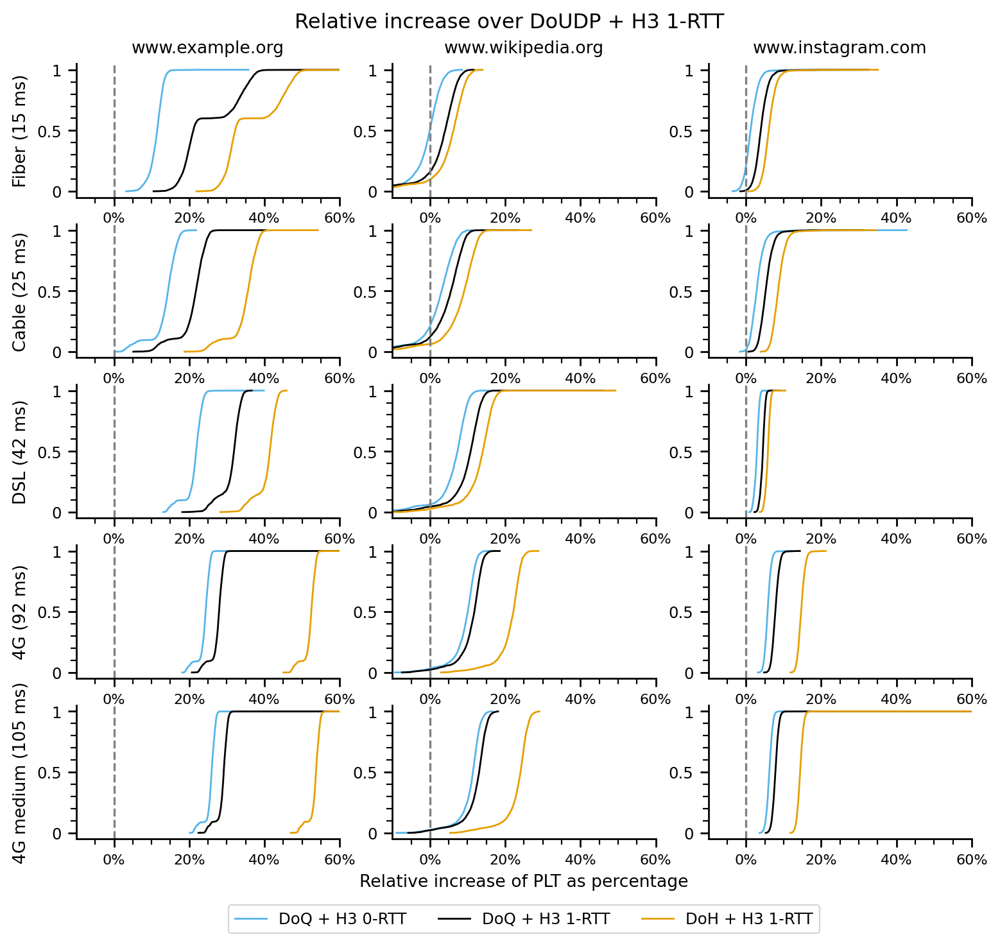

In [373]:
metrics_for_single_cdf = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(9,8))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            distribution = df_diff_all_data_udp_baseline_medians[(df_diff_all_data_udp_baseline_medians['website'] == website) & (df_diff_all_data_udp_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_udp_baseline_medians['experiment_description'] == metric)]['relative_increase_plt']
            s_plot = make_cdf(distribution)
            print(website)
            print(tech)
            print(metric)
            print(distribution.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,.25,.75]))
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')
        
        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of PLT as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.6), ncol=3)
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.05,1.05)
        ax.set_xlim(-10, 60)
fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.savefig("figures/plt-doudp-baseline-grid.pdf", bbox_inches='tight')
plt.show()

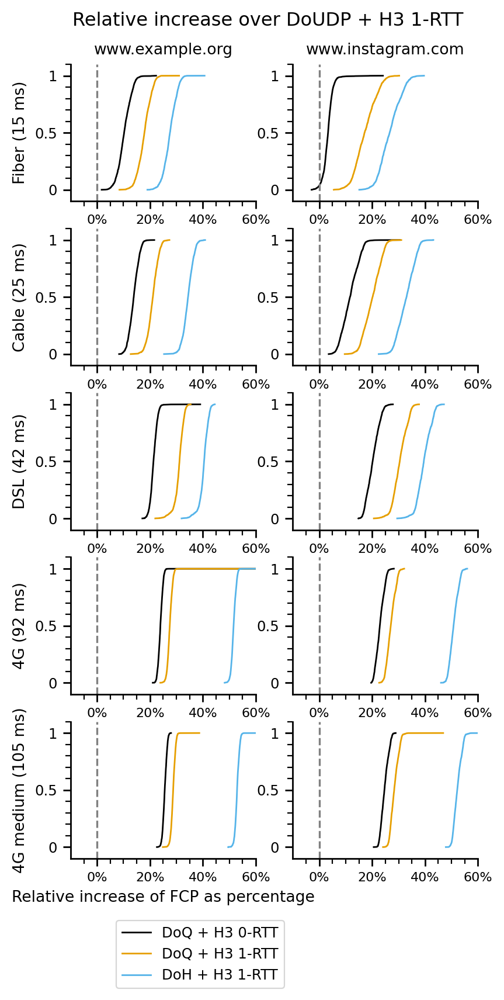

In [1338]:
metrics_for_single_cdf = ['DoQ + H3 0-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.instagram.com']#'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(4.5,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_udp_baseline_medians[(df_diff_all_data_udp_baseline_medians['website'] == website) & (df_diff_all_data_udp_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_udp_baseline_medians['experiment_description'] == metric)]['relative_increase_fcp'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == 0:
                ax.set_xlabel('Relative increase of FCP as percentage')
            if i == math.floor(len(website_columns)/2):
                ax.legend(loc='center', bbox_to_anchor=(-0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-10, 60)
fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.savefig("figures/fcp-doudp-baseline-grid.pdf", bbox_inches='tight')
plt.show()

In [88]:
df_quic_baseline_medians = df_dns_and_h3[df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT'].groupby(['website','experiment_type'], as_index=False).agg(full_plt_udp_med=('full_plt', 'median'), full_fcp_udp_med=('full_fcp', 'median'))

In [89]:
df_diff_all_data_quic_baseline_medians = pd.merge(df_dns_and_h3[df_dns_and_h3.experiment_description != 'DoQ + H3 0-RTT'], df_quic_baseline_medians, on=['website', 'experiment_type'])
df_diff_all_data_quic_baseline_medians['relative_increase_plt'] = (df_diff_all_data_quic_baseline_medians['full_plt']/(df_diff_all_data_quic_baseline_medians['full_plt_udp_med']/100))-100
df_diff_all_data_quic_baseline_medians['relative_increase_fcp'] = (df_diff_all_data_quic_baseline_medians['full_fcp']/(df_diff_all_data_quic_baseline_medians['full_fcp_udp_med']/100))-100
df_diff_all_data_quic_baseline_medians

,msm_id,connectEnd,connectStart,domComplete,domContentLoadedEventEnd,domContentLoadedEventStart,domInteractive,domainLookupEnd,domainLookupStart,duration,...,transport_protocol,full_plt,full_fp,full_fcp,h3_description,experiment_description,full_plt_udp_med,full_fcp_udp_med,relative_increase_plt,relative_increase_fcp
0,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoQ,317.497970,321.397970,321.397970,H3 1-RTT,DoQ + H3 1-RTT,307.331516,313.390678,3.307976,2.555051
1,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoH,341.212289,345.112289,345.112289,H3 1-RTT,DoH + H3 1-RTT,307.331516,313.390678,11.024178,10.122066
2,4e1d3bd9-a631-401d-a64e-17db3cac488f,112.5,47.2,192.6,192.5,192.5,192.5,47.2,47.2,192.6,...,DoUDP,236.747707,240.647707,240.647707,H3 1-RTT,DoUDP + H3 1-RTT,307.331516,313.390678,-22.966668,-23.211594
3,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoH,329.512289,335.212289,335.212289,H3 0-RTT,DoH + H3 0-RTT,307.331516,313.390678,7.217214,6.963070
4,4e1d3bd9-a631-401d-a64e-17db3cac488f,105.7,46.6,180.9,180.9,180.9,180.9,46.6,46.5,180.9,...,DoUDP,225.047707,230.747707,230.747707,H3 0-RTT,DoUDP + H3 0-RTT,307.331516,313.390678,-26.773632,-26.370590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287175,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,163.5,46.8,1440.2,1134.0,1134.0,1134.0,46.8,46.7,1441.0,...,DoQ,1666.409069,548.209069,548.209069,H3 1-RTT,DoQ + H3 1-RTT,1631.193149,528.025161,2.158906,3.822528
287176,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,163.5,46.8,1440.2,1134.0,1134.0,1134.0,46.8,46.7,1441.0,...,DoH,1767.351368,649.151368,649.151368,H3 1-RTT,DoH + H3 1-RTT,1631.193149,528.025161,8.347155,22.939476
287177,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,163.5,46.8,1440.2,1134.0,1134.0,1134.0,46.8,46.7,1441.0,...,DoUDP,1546.271196,428.071196,428.071196,H3 1-RTT,DoUDP + H3 1-RTT,1631.193149,528.025161,-5.206125,-18.929773
287178,97dc42c1-a6f1-4ccc-924a-a8be6d6bc457,157.8,47.1,1408.6,1105.7,1105.7,1105.7,47.1,47.1,1409.6,...,DoH,1735.751368,621.451368,621.451368,H3 0-RTT,DoH + H3 0-RTT,1631.193149,528.025161,6.409923,17.693514


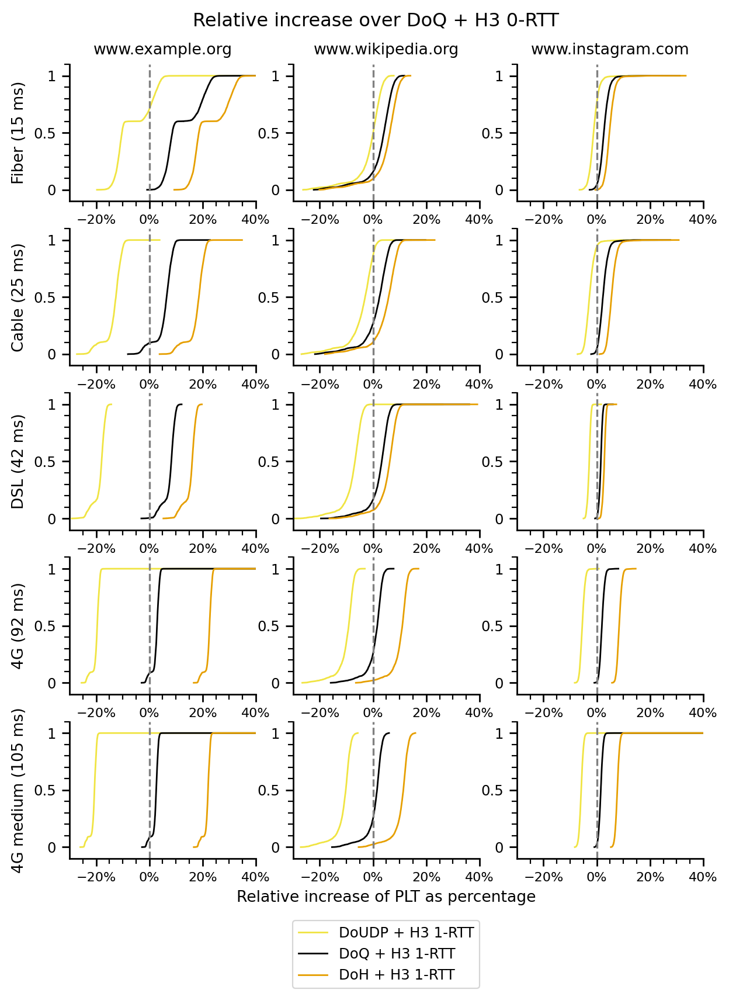

In [136]:
metrics_for_single_cdf = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
color_order = ['DoQ + H3 1-RTT', 'DoH + H3 1-RTT', 'DoQ + H3 0-RTT', 'DoH + H3 0-RTT', 'DoUDP + H3 1-RTT', 'DoUDP + H3 0-RTT']
colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_quic_baseline_medians[(df_diff_all_data_quic_baseline_medians['website'] == website) & (df_diff_all_data_quic_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_quic_baseline_medians['experiment_description'] == metric)]['relative_increase_plt'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of PLT as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-30, 40)
fig.suptitle('Relative increase over DoQ + H3 0-RTT', y=0.93)
plt.savefig("figures/plt-doq-baseline-grid.pdf", bbox_inches='tight')
plt.show()

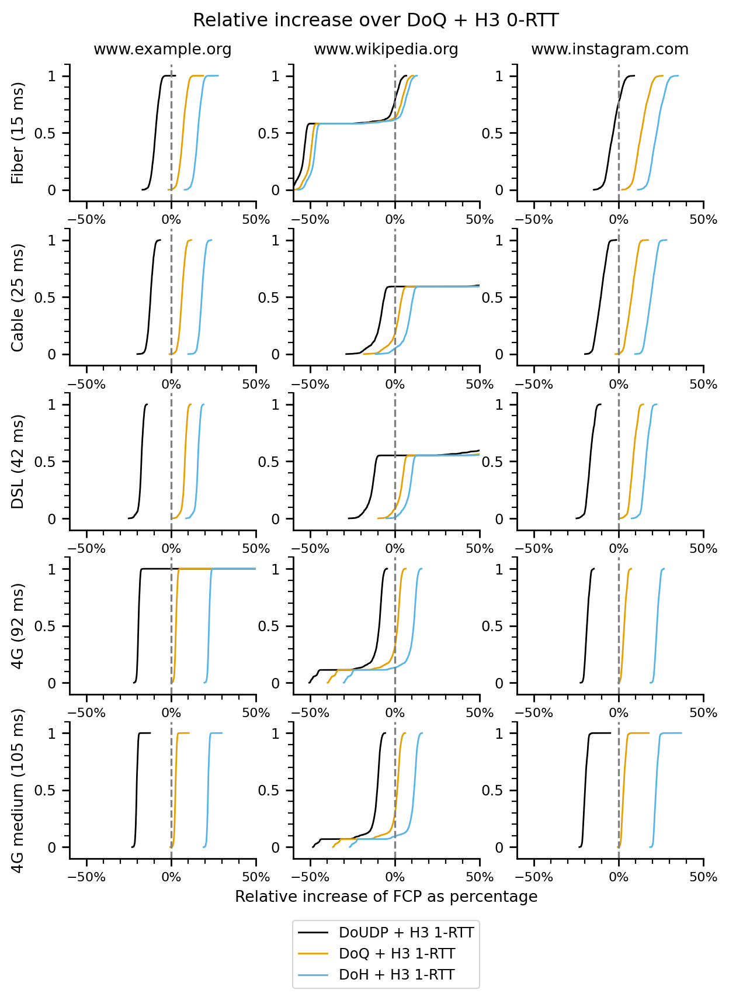

In [1342]:
metrics_for_single_cdf = ['DoUDP + H3 1-RTT', 'DoQ + H3 1-RTT', 'DoH + H3 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(metrics_for_single_cdf, ['o','v','^','>','s','p','h','d','<','.']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_diff_all_data_quic_baseline_medians[(df_diff_all_data_quic_baseline_medians['website'] == website) & (df_diff_all_data_quic_baseline_medians['experiment_type'] == tech) & (df_diff_all_data_quic_baseline_medians['experiment_description'] == metric)]['relative_increase_fcp'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Relative increase of FCP as percentage')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(-60, 50)
fig.suptitle('Relative increase over DoQ + H3 0-RTT', y=0.93)
plt.savefig("figures/fcp-doq-baseline-grid.pdf", bbox_inches='tight')
plt.show()

DoQ+0rtt -> 1-rtt handshake
DoUDP+1-rtt -> 1-rtt handshake
-> compare their relative increase in PLT from 4g to 4g medium for www.example.org (inflight should always be below BDP)

In [91]:
df_exchange_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'exchange'].copy()
df_exchange_durations = pd.merge(df_exchange_durations, measurements, on='msm_id')

In [92]:
df_exchange_durations.experiment_type.unique()

array(['dsl', 'cable', 'fiber', '4g', '4g-medium'], dtype=object)

In [93]:
df_exchange_durations['rtt'] = 0
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'dsl', 42.35979, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'cable', 25.17665, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == 'fiber', 14.767147, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == '4g', 91.85231065904635, df_exchange_durations['rtt'])
df_exchange_durations['rtt'] = np.where(df_exchange_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_exchange_durations['rtt'])

In [94]:
df_exchange_durations['duration_in_rtt'] = df_exchange_durations['duration'] / df_exchange_durations['rtt']

In [95]:
df_exchange_durations['handshake_round_trips'] = 0
df_exchange_durations['handshake_round_trips'] = np.where(df_exchange_durations['transport_protocol'] == 'DoQ', 1, df_exchange_durations['handshake_round_trips'])
df_exchange_durations['handshake_round_trips'] = np.where(df_exchange_durations['transport_protocol'] == 'DoH', 2, df_exchange_durations['handshake_round_trips'])

In [96]:
df_exchange_durations['theoretical_handshake_duration'] = df_exchange_durations['handshake_round_trips'] * df_exchange_durations['rtt']

In [97]:
df_exchange_durations['theoretical_exchange_without_handshake'] = df_exchange_durations['duration'] - df_exchange_durations['theoretical_handshake_duration']

In [98]:
df_exchange_durations['theoretical_query_in_rtt'] = df_exchange_durations['theoretical_exchange_without_handshake'] / df_exchange_durations['rtt']

In [99]:
df_exchange_durations['theoretical_processing_delay'] = df_exchange_durations['theoretical_exchange_without_handshake'] - df_exchange_durations['rtt']

In [100]:
df_exchange_durations.transport_protocol.unique()

array(['DoQ', 'DoH', 'DoUDP'], dtype=object)

DoQ
count    57436.000000
mean         2.502751
std          0.324596
min          2.075440
10%          2.133147
20%          2.149773
25%          2.154670
30%          2.156567
40%          2.290938
50%          2.498708
60%          2.560190
70%          2.778774
75%          2.812583
80%          2.893331
90%          2.936139
100%         2.997770
max          2.997770
Name: duration_in_rtt, dtype: float64
DoH
count    57436.000000
mean         3.381835
std          0.229685
min          3.054285
10%          3.122798
20%          3.124485
25%          3.125294
30%          3.126237
40%          3.216880
50%          3.434569
60%          3.495060
70%          3.508292
75%          3.511198
80%          3.547955
90%          3.713241
100%         3.894583
max          3.894583
Name: duration_in_rtt, dtype: float64
DoUDP
count    57436.000000
mean         1.027957
std          0.016802
min          1.003819
10%          1.008455
20%          1.008829
25%          1.009014
30%     

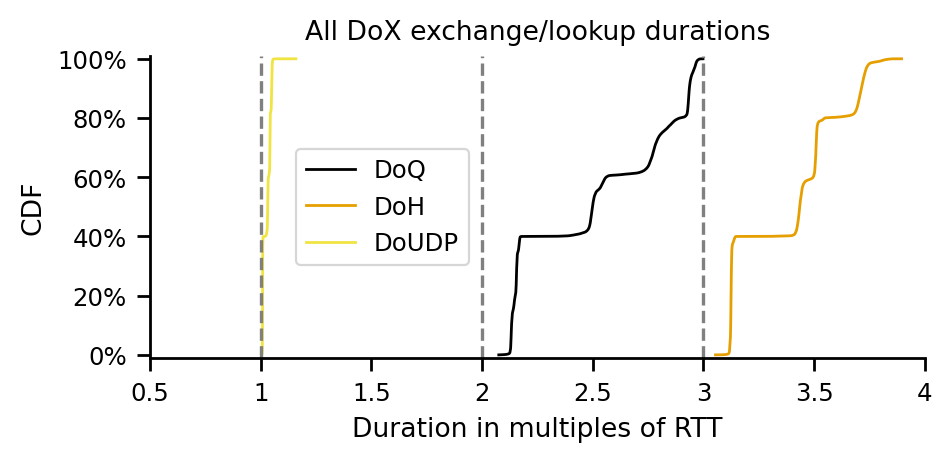

In [363]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
line_order = ['DoQ', 'DoH', 'DoUDP']
color_order =['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('All DoX exchange/lookup durations')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.01,1.01)
ax.set_xlim(0.5, 4)
ax.legend(loc='center', markerscale=6, bbox_to_anchor=(.3,.5))


if log:
    fig.savefig('figures/exchange-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/exchange-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    11489.000000
mean         2.776249
std          0.073218
min          2.359756
10%          2.725140
20%          2.752356
25%          2.758260
30%          2.763172
40%          2.771366
50%          2.778760
60%          2.787633
70%          2.801246
75%          2.812545
80%          2.827749
90%          2.855238
100%         2.942663
max          2.942663
Name: duration_in_rtt, dtype: float64
DoH
count    11489.000000
mean         3.714078
std          0.037746
min          3.340739
10%          3.685213
20%          3.695344
25%          3.698755
30%          3.701688
40%          3.707759
50%          3.713241
60%          3.718801
70%          3.724818
75%          3.728087
80%          3.731886
90%          3.744446
100%         3.894583
max          3.894583
Name: duration_in_rtt, dtype: float64
DoUDP
count    11489.000000
mean         1.049137
std          0.004098
min          1.018970
10%          1.044746
20%          1.048157
25%          1.048552
30%     

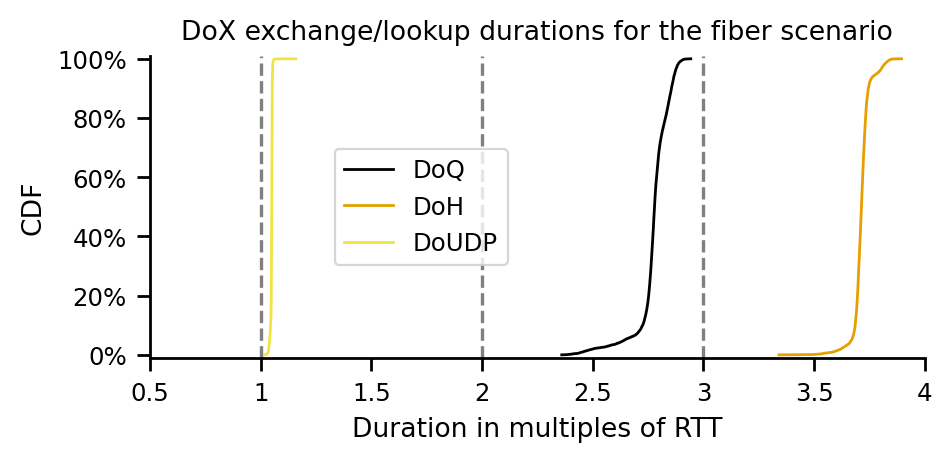

DoQ
count    11486.000000
mean         2.503528
std          0.032878
min          2.285045
10%          2.478231
20%          2.488003
25%          2.490290
30%          2.492213
40%          2.495739
50%          2.499480
60%          2.503894
70%          2.511132
75%          2.520665
80%          2.534152
90%          2.547332
100%         2.609337
max          2.609337
Name: duration_in_rtt, dtype: float64
DoH
count    11486.000000
mean         3.436657
std          0.020979
min          3.191677
10%          3.419583
20%          3.425093
25%          3.427118
30%          3.428805
40%          3.431824
50%          3.434658
60%          3.437473
70%          3.440876
75%          3.442852
80%          3.445070
90%          3.454592
100%         3.532558
max          3.532558
Name: duration_in_rtt, dtype: float64
DoUDP
count    11486.000000
mean         1.031332
std          0.002264
min          1.015337
10%          1.028898
20%          1.030670
25%          1.030907
30%     

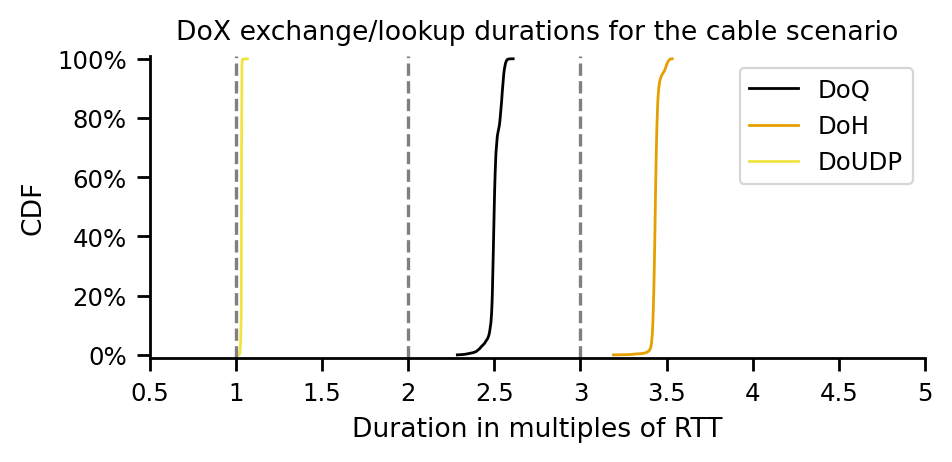

DoQ
count    11488.000000
mean         2.940316
std          0.016553
min          2.815790
10%          2.927257
20%          2.930125
25%          2.931207
30%          2.932169
40%          2.933989
50%          2.936137
60%          2.939266
70%          2.944700
75%          2.949448
80%          2.955286
90%          2.964300
100%         2.997770
max          2.997770
Name: duration_in_rtt, dtype: float64
DoH
count    11488.000000
mean         3.508874
std          0.010940
min          3.391257
10%          3.501526
20%          3.504439
25%          3.505308
30%          3.506023
40%          3.507201
50%          3.508229
60%          3.509248
70%          3.510398
75%          3.511120
80%          3.511953
90%          3.515650
100%         3.560724
max          3.560724
Name: duration_in_rtt, dtype: float64
DoUDP
count    11488.000000
mean         1.041764
std          0.001365
min          1.030898
10%          1.040424
20%          1.041378
25%          1.041501
30%     

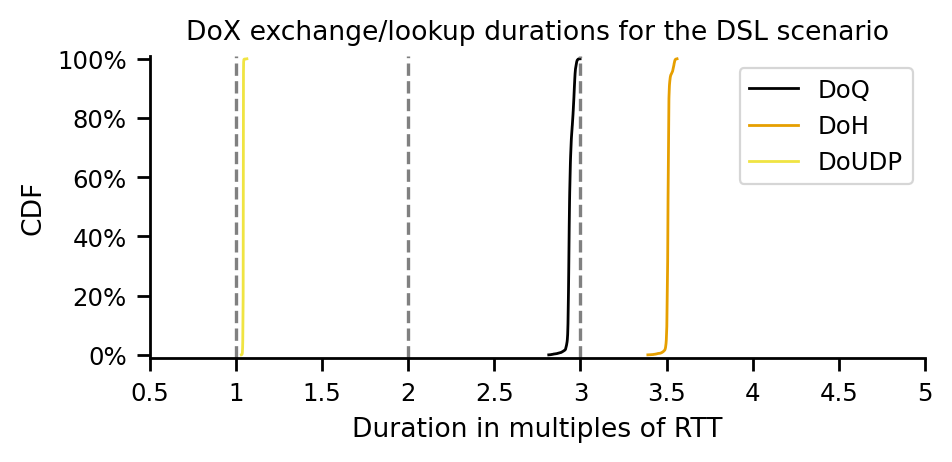

DoQ
count    11487.000000
mean         2.135175
std          0.007811
min          2.075440
10%          2.128756
20%          2.130164
25%          2.130711
30%          2.131201
40%          2.132166
50%          2.133217
60%          2.134554
70%          2.137320
75%          2.140556
80%          2.143022
90%          2.146398
100%         2.158172
max          2.158172
Name: duration_in_rtt, dtype: float64
DoH
count    11487.000000
mean         3.124653
std          0.005400
min          3.054285
10%          3.120198
20%          3.122088
25%          3.122539
30%          3.122938
40%          3.123673
50%          3.124330
60%          3.125045
70%          3.125833
75%          3.126279
80%          3.126843
90%          3.128770
100%         3.149543
max          3.149543
Name: duration_in_rtt, dtype: float64
DoUDP
count    11487.000000
mean         1.008449
std          0.000567
min          1.003819
10%          1.007911
20%          1.008256
25%          1.008317
30%     

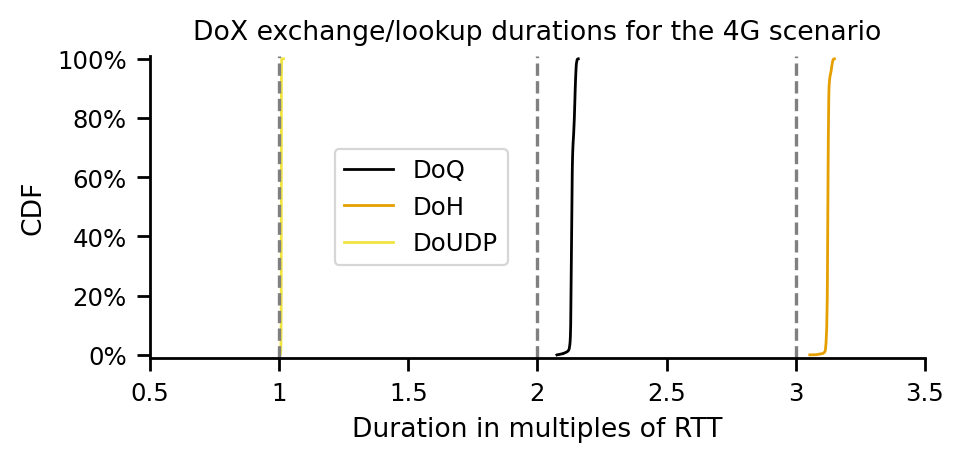

DoQ
count    11486.000000
mean         2.158374
std          0.006761
min          2.106072
10%          2.153138
20%          2.154238
25%          2.154649
30%          2.155035
40%          2.155753
50%          2.156564
60%          2.157574
70%          2.159485
75%          2.162960
80%          2.165477
90%          2.168328
100%         2.187094
max          2.187094
Name: duration_in_rtt, dtype: float64
DoH
count    11486.000000
mean         3.124824
std          0.004567
min          3.082529
10%          3.120432
20%          3.122617
25%          3.123078
30%          3.123448
40%          3.124063
50%          3.124618
60%          3.125197
70%          3.125836
75%          3.126195
80%          3.126642
90%          3.128304
100%         3.147391
max          3.147391
Name: duration_in_rtt, dtype: float64
DoUDP
count    11486.000000
mean         1.009094
std          0.000555
min          1.005500
10%          1.008596
20%          1.008888
25%          1.008948
30%     

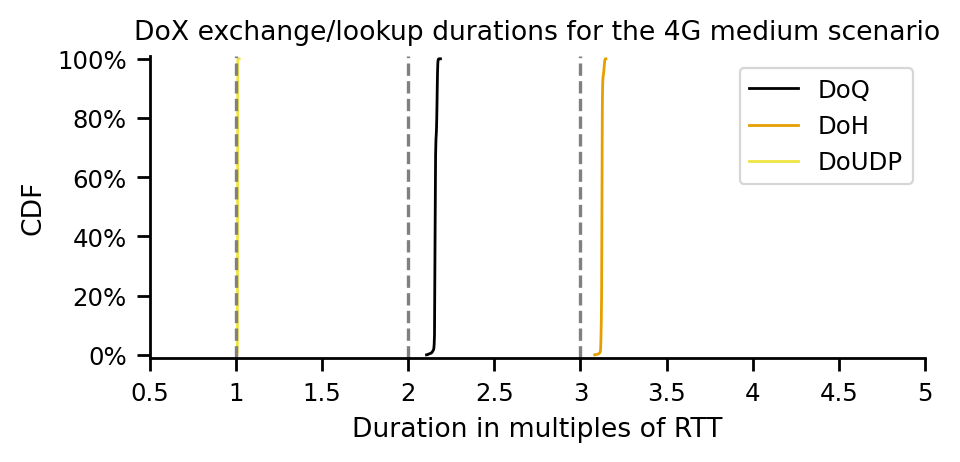

In [362]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    color_order =['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    colors = dict(zip(color_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(color_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX exchange/lookup durations for the '+map_techs_to_proper_name[tech]+' scenario')

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.01,1.01)
    if tech == 'fiber':
        ax.set_xlim(0.5, 4)
        ax.legend(loc='center', markerscale=6, bbox_to_anchor=(.35,.5))
    elif tech == '4g':
        ax.set_xlim(0.5, 3.5)
        ax.legend(loc='center', markerscale=6, bbox_to_anchor=(.35,.5))
    else:
        ax.set_xlim(0.5, 5)
        ax.legend(markerscale=6)


    if log:
        fig.savefig('figures/exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean       74.246205
std        36.853353
min        20.126469
10%        26.237204
20%        32.403407
25%        37.497809
30%        37.727937
40%        54.889432
50%        82.012011
60%        84.165823
70%       104.104585
75%       104.853216
80%       106.223983
90%       120.827845
100%      122.720046
max       122.720046
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    2637.000000
mean       69.217892
std        36.197057
min        19.802929
10%        25.289890
20%        32.191607
25%        35.901952
30%        36.094340
40%        46.987233
50%        63.867489
60%        65.561456
70%       103.240401
75%       103.449306
80%       105.296293
90%       117.545524
100%      119.303357
max       119.303357
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    2637.000000
mean       56.709539
std        35.966550
min        15.102344
10%        15.499897
20%        25.562019
25%        25.939564
30%

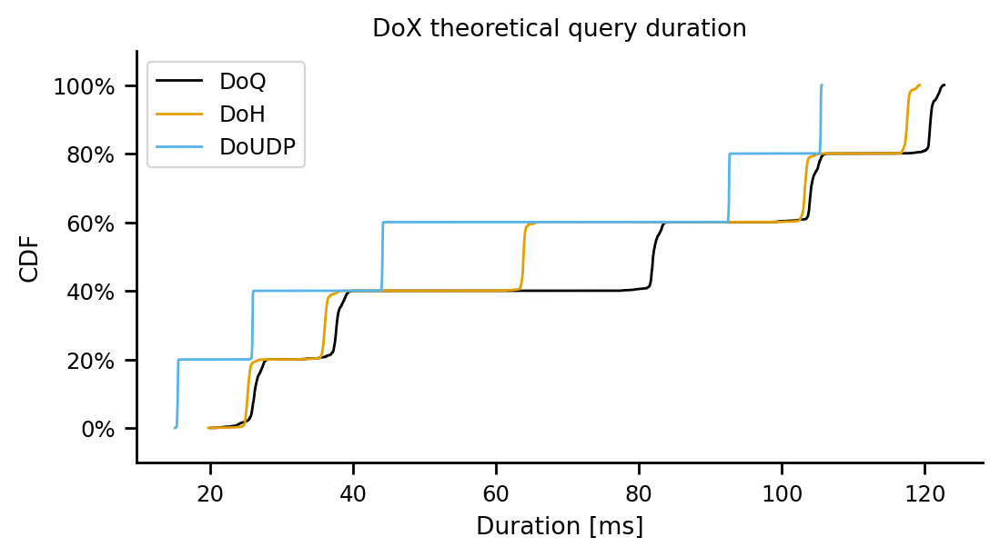

In [910]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

#plt.axvline(x=1, color='gray', linestyle='--')
#plt.axvline(x=2, color='gray', linestyle='--')
#plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical query duration')

ax.set_xlabel('Duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/theoretical-query-duration-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/theoretical-query-duration.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean      26.161146
std        1.099327
min       20.126469
10%       25.186001
20%       25.798536
25%       25.894268
30%       25.962901
40%       26.115199
50%       26.235304
60%       26.371786
70%       26.579708
75%       26.722754
80%       26.975762
90%       27.390106
100%      28.167663
max       28.167663
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean      25.300131
std        0.543556
min       19.802929
10%       24.926887
20%       25.032373
25%       25.092689
30%       25.138148
40%       25.224186
50%       25.288543
60%       25.370346
70%       25.451802
75%       25.495794
80%       25.557524
90%       25.727595
100%      27.262194
max       27.262194
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean      15.487247
std        0.060221
min       15.102344
10%       15.403224
20%       15.447869
25%       15.467397
30%       15.475049
40%       15.486717
50% 

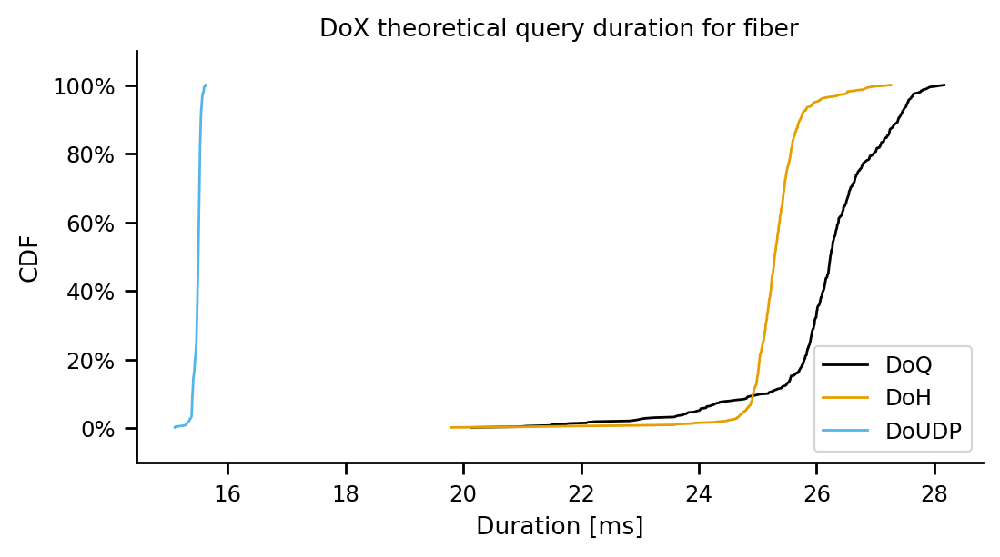

DoQ
count    528.000000
mean      37.788267
std        0.921538
min       32.319567
10%       37.126626
20%       37.415059
25%       37.497777
30%       37.546393
40%       37.647492
50%       37.727584
60%       37.847261
70%       38.023909
75%       38.170492
80%       38.452618
90%       38.928572
100%      39.924213
max       39.924213
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    528.000000
mean      36.136555
std        0.577704
min       32.078845
10%       35.718859
20%       35.844726
25%       35.901941
30%       35.943096
40%       36.021610
50%       36.093206
60%       36.164437
70%       36.255926
75%       36.305960
80%       36.361646
90%       36.563367
100%      38.394460
max       38.394460
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    528.000000
mean      25.954620
std        0.060919
min       25.555721
10%       25.874407
20%       25.925407
25%       25.939418
30%       25.947156
40%       25.958097
50% 

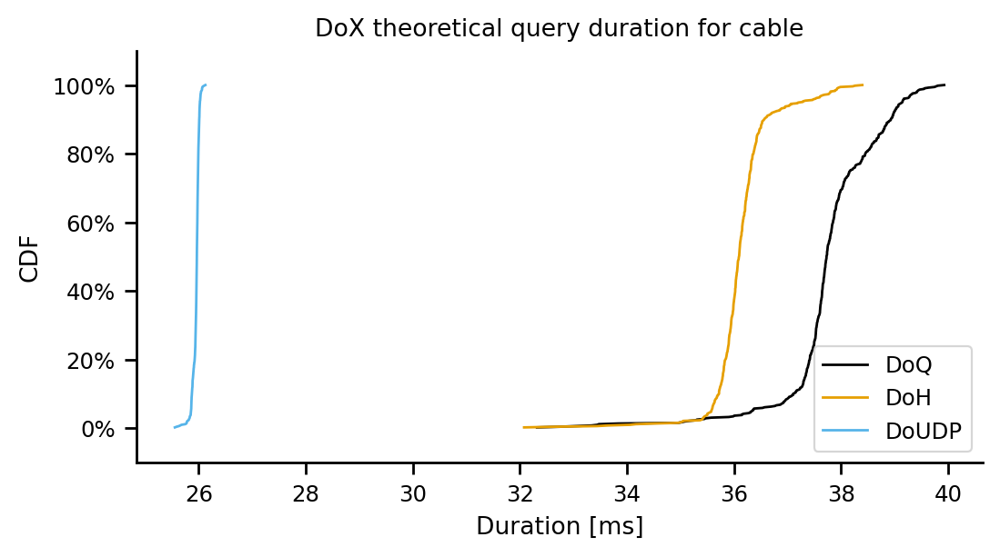

DoQ
count    528.000000
mean      82.115496
std        0.811952
min       77.337260
10%       81.601684
20%       81.750460
25%       81.786765
30%       81.842389
40%       81.932054
50%       82.013497
60%       82.143427
70%       82.348175
75%       82.484416
80%       82.674620
90%       83.180806
100%      84.293913
max       84.293913
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    528.000000
mean      63.878098
std        0.461262
min       59.876393
10%       63.554513
20%       63.714937
25%       63.754704
30%       63.785908
40%       63.825323
50%       63.867685
60%       63.912870
70%       63.960998
75%       63.992760
80%       64.041350
90%       64.185106
100%      65.563098
max       65.563098
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    528.000000
mean      44.123522
std        0.060520
min       43.835630
10%       44.041360
20%       44.095106
25%       44.106339
30%       44.112789
40%       44.120476
50% 

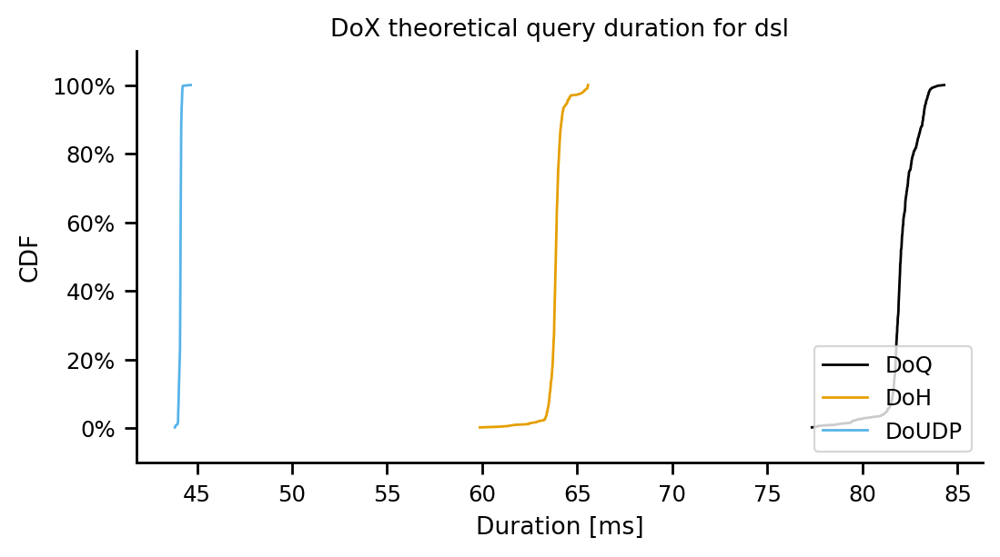

DoQ
count    527.000000
mean     104.249586
std        0.935384
min       98.657293
10%      103.687782
20%      103.835017
25%      103.874193
30%      103.921278
40%      104.007817
50%      104.106409
60%      104.287845
70%      104.581528
75%      104.864247
80%      105.075139
90%      105.333000
100%     106.255834
max      106.255834
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean     103.260457
std        0.524603
min       98.819174
10%      102.799184
20%      103.036598
25%      103.081125
30%      103.121131
40%      103.187063
50%      103.241003
60%      103.315741
70%      103.404495
75%      103.450938
80%      103.491207
90%      103.651374
100%     105.299720
max      105.299720
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean      92.616329
std        0.051577
min       92.224833
10%       92.540857
20%       92.585549
25%       92.599603
30%       92.606225
40%       92.618466
50% 

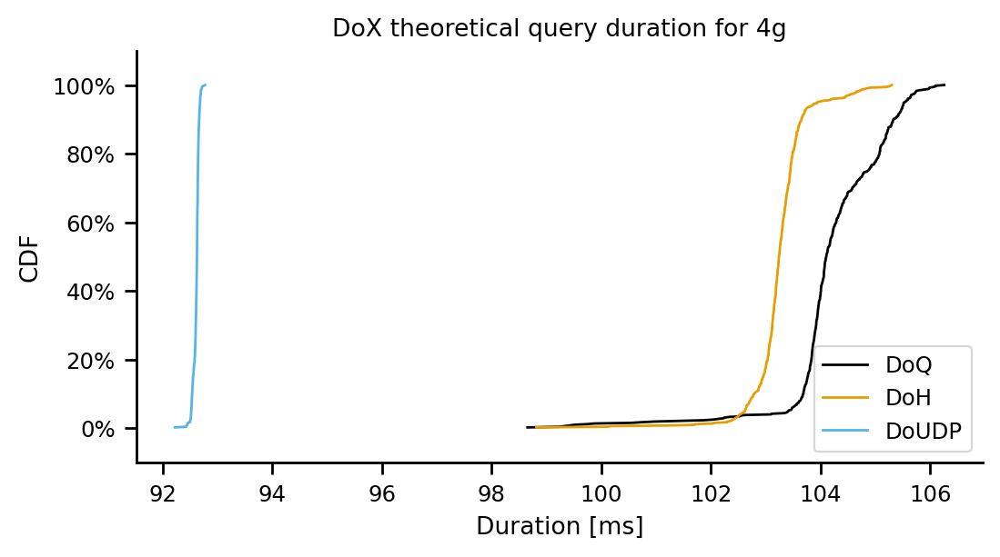

DoQ
count    527.000000
mean     120.970779
std        0.728062
min      115.930403
10%      120.487935
20%      120.603456
25%      120.644491
30%      120.678193
40%      120.746471
50%      120.827851
60%      120.920751
70%      121.044188
75%      121.210515
80%      121.579799
90%      122.056283
100%     122.720046
max      122.720046
Name: theoretical_exchange_without_handshake, dtype: float64
DoH
count    527.000000
mean     117.587123
std        0.487503
min      114.042488
10%      117.114507
20%      117.323465
25%      117.373661
30%      117.404101
40%      117.482785
50%      117.545616
60%      117.608396
70%      117.661988
75%      117.728757
80%      117.778430
90%      117.989140
100%     119.303357
max      119.303357
Name: theoretical_exchange_without_handshake, dtype: float64
DoUDP
count    527.000000
mean     105.448220
std        0.048134
min      105.267555
10%      105.373362
20%      105.418888
25%      105.427062
30%      105.432055
40%      105.443333
50% 

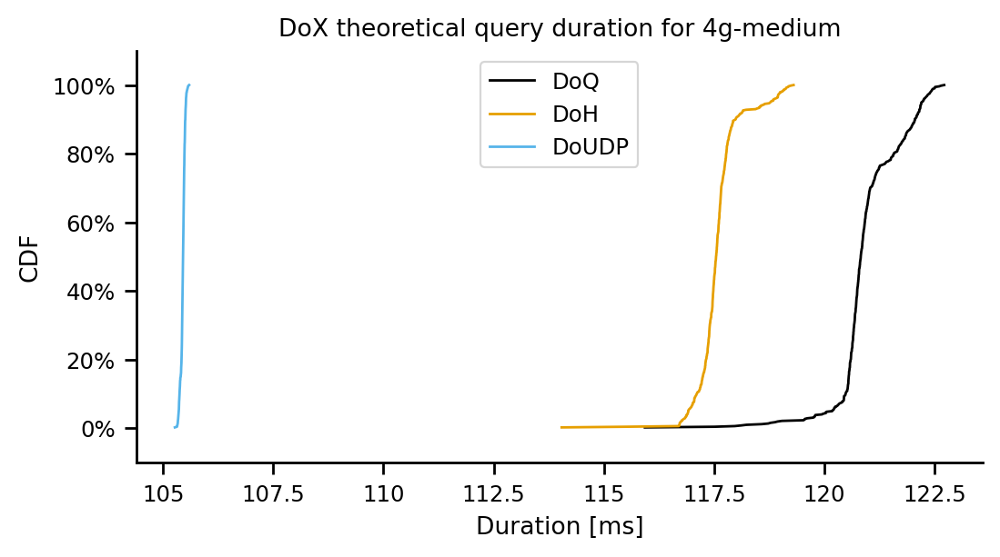

In [911]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_exchange_without_handshake'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical query duration for '+tech)

    ax.set_xlabel('Duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    #ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/theoretical-query-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/theoretical-query-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean        1.500879
std         0.323765
min         1.074086
10%         1.133285
20%         1.149367
25%         1.154519
30%         1.156224
40%         1.290372
50%         1.497996
60%         1.562106
70%         1.776642
75%         1.810300
80%         1.880039
90%         1.936110
100%        1.989951
max         1.989951
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    2637.000000
mean        1.381263
std         0.229283
min         1.075849
10%         1.122683
20%         1.124495
25%         1.125362
30%         1.126363
40%         1.283108
50%         1.433373
60%         1.494317
70%         1.507754
75%         1.510691
80%         1.547144
90%         1.712455
100%        1.846138
max         1.846138
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    2637.000000
mean        1.027737
std         0.016716
min         1.004056
10%         1.008337
20%         1.008715
25%         1.008908
30%         1.009111
40%       

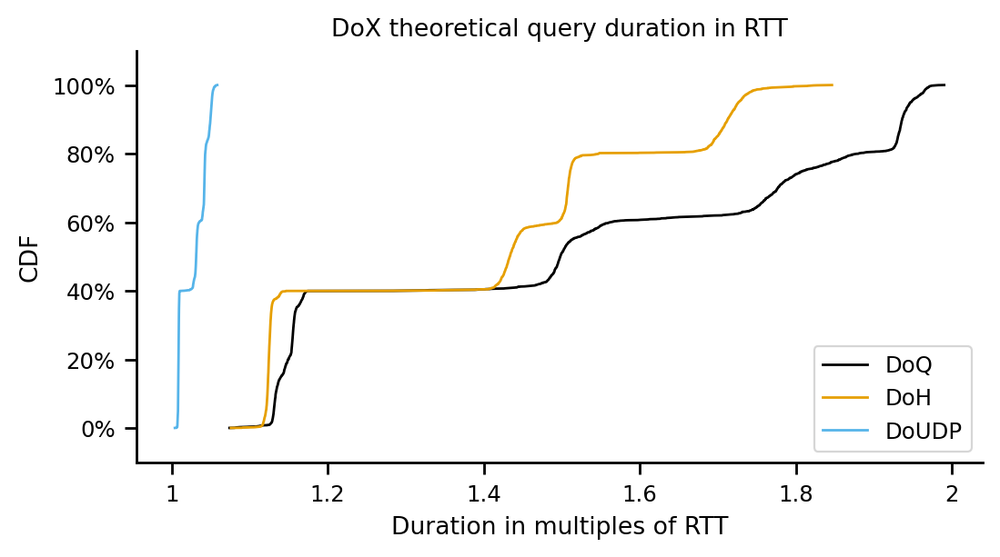

In [912]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

#plt.axvline(x=1, color='gray', linestyle='--')
#plt.axvline(x=2, color='gray', linestyle='--')
#plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical query duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/theoretical-query-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/theoretical-query-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       1.771578
std        0.074444
min        1.362922
10%        1.705543
20%        1.747022
25%        1.753505
30%        1.758153
40%        1.768466
50%        1.776599
60%        1.785842
70%        1.799922
75%        1.809608
80%        1.826742
90%        1.854800
100%       1.907455
max        1.907455
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.713271
std        0.036808
min        1.341013
10%        1.687996
20%        1.695139
25%        1.699224
30%        1.702302
40%        1.708129
50%        1.712487
60%        1.718026
70%        1.723542
75%        1.726521
80%        1.730702
90%        1.742218
100%       1.846138
max        1.846138
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1

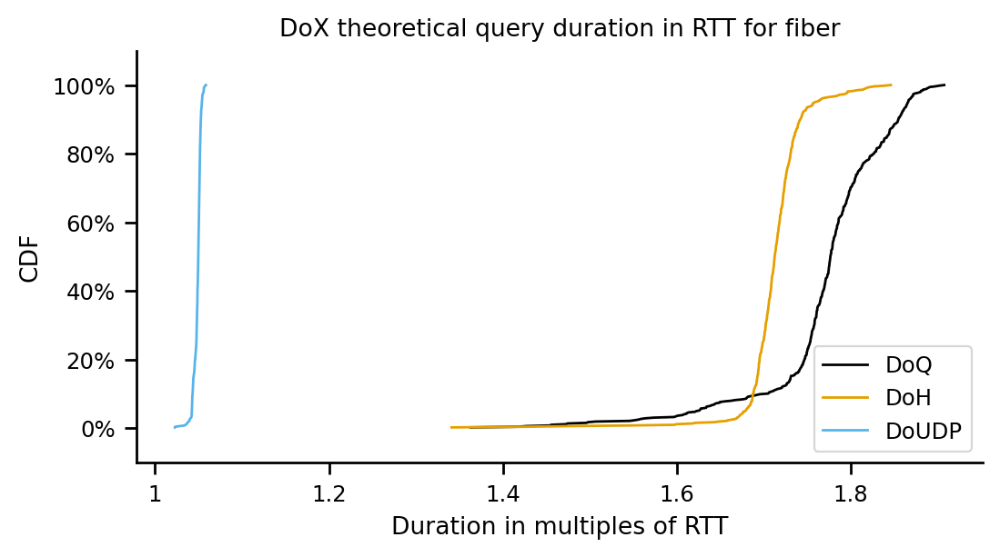

DoQ
count    528.000000
mean       1.500925
std        0.036603
min        1.283712
10%        1.474645
20%        1.486102
25%        1.489387
30%        1.491318
40%        1.495334
50%        1.498515
60%        1.503268
70%        1.510285
75%        1.516107
80%        1.527313
90%        1.546217
100%       1.585764
max        1.585764
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    528.000000
mean       1.435320
std        0.022946
min        1.274151
10%        1.418730
20%        1.423729
25%        1.426002
30%        1.427636
40%        1.430755
50%        1.433598
60%        1.436428
70%        1.440062
75%        1.442049
80%        1.444261
90%        1.452273
100%       1.525003
max        1.525003
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1

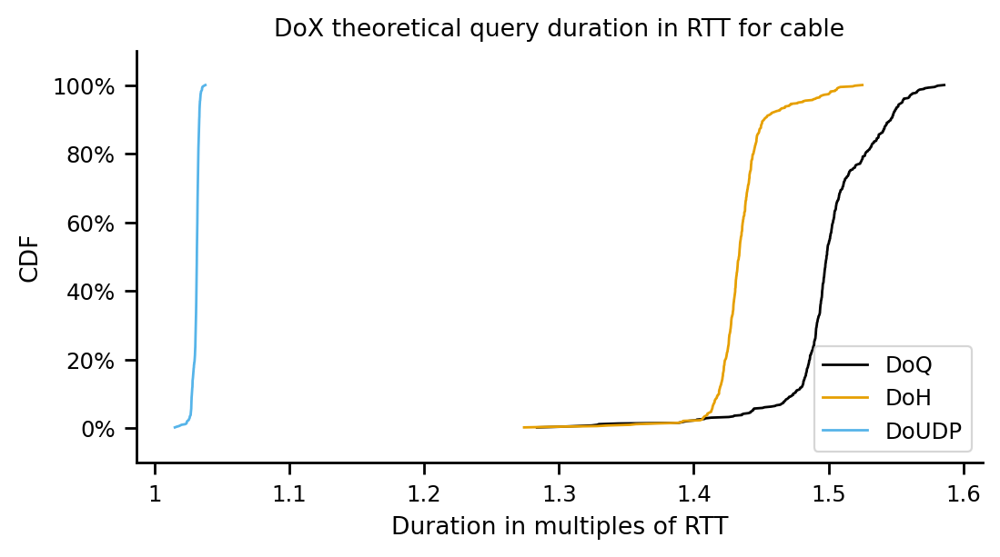

DoQ
count    528.000000
mean       1.938525
std        0.019168
min        1.825723
10%        1.926395
20%        1.929907
25%        1.930764
30%        1.932077
40%        1.934194
50%        1.936117
60%        1.939184
70%        1.944018
75%        1.947234
80%        1.951724
90%        1.963674
100%       1.989951
max        1.989951
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    528.000000
mean       1.507989
std        0.010889
min        1.413520
10%        1.500350
20%        1.504137
25%        1.505076
30%        1.505813
40%        1.506743
50%        1.507743
60%        1.508810
70%        1.509946
75%        1.510696
80%        1.511843
90%        1.515237
100%       1.547767
max        1.547767
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1

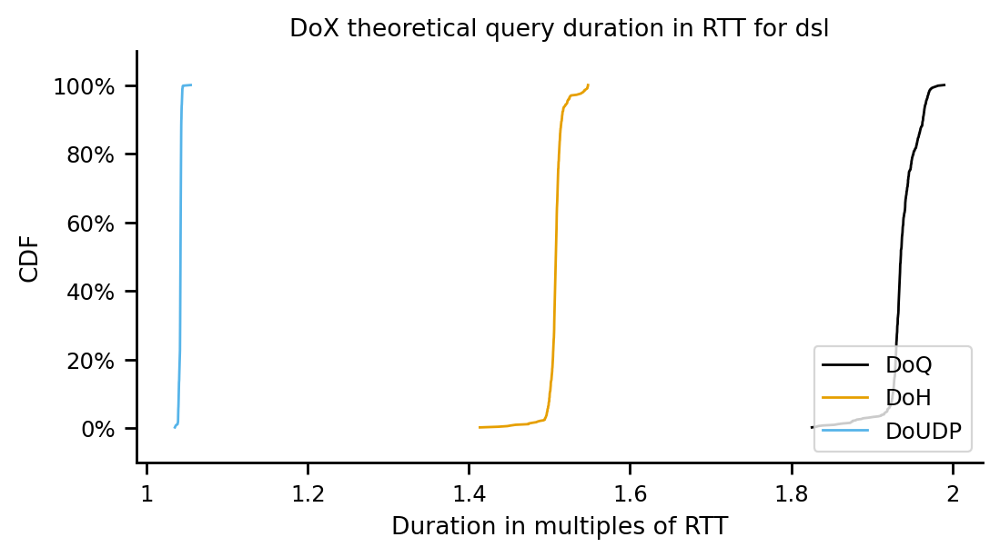

DoQ
count    527.000000
mean       1.134970
std        0.010184
min        1.074086
10%        1.128853
20%        1.130456
25%        1.130883
30%        1.131395
40%        1.132338
50%        1.133411
60%        1.135386
70%        1.138584
75%        1.141662
80%        1.143957
90%        1.146765
100%       1.156812
max        1.156812
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.124201
std        0.005711
min        1.075849
10%        1.119179
20%        1.121764
25%        1.122249
30%        1.122684
40%        1.123402
50%        1.123989
60%        1.124803
70%        1.125769
75%        1.126275
80%        1.126713
90%        1.128457
100%       1.146403
max        1.146403
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1

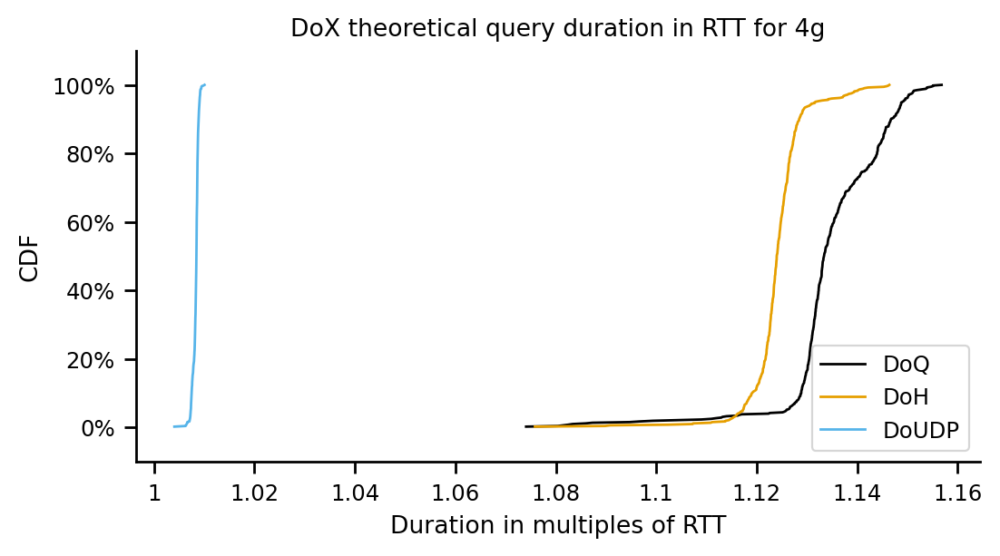

DoQ
count    527.000000
mean       1.157569
std        0.006967
min        1.109338
10%        1.152949
20%        1.154054
25%        1.154447
30%        1.154769
40%        1.155423
50%        1.156202
60%        1.157091
70%        1.158272
75%        1.159863
80%        1.163397
90%        1.167956
100%       1.174308
max        1.174308
Name: theoretical_query_in_rtt, dtype: float64
DoH
count    527.000000
mean       1.125191
std        0.004665
min        1.091272
10%        1.120669
20%        1.122668
25%        1.123148
30%        1.123440
40%        1.124193
50%        1.124794
60%        1.125395
70%        1.125907
75%        1.126546
80%        1.127022
90%        1.129038
100%       1.141614
max        1.141614
Name: theoretical_query_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1

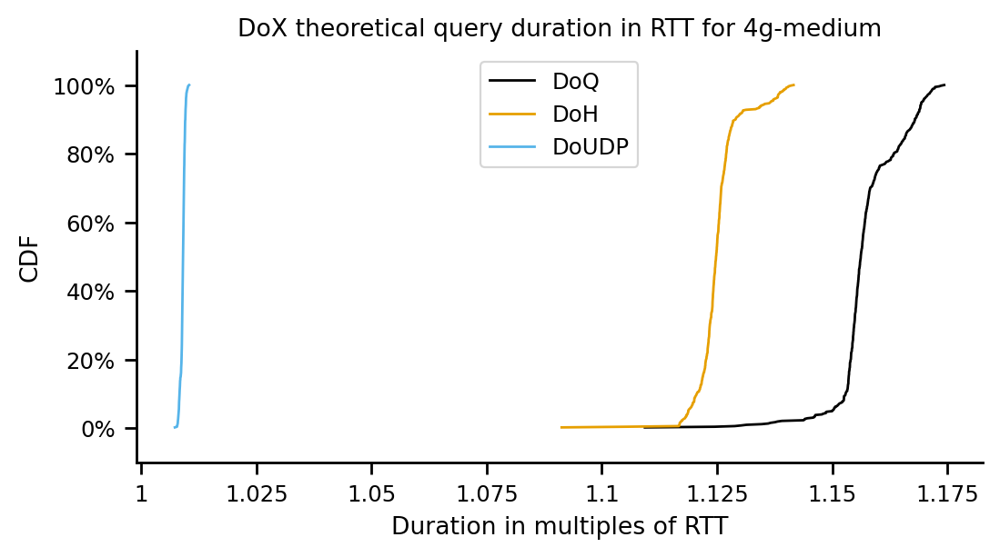

In [913]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_query_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical query duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    #ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/theoretical-query-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/theoretical-query-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ
count    2637.000000
mean       18.530855
std        10.799678
min         5.359322
10%        11.354937
20%        11.927517
25%        12.104646
30%        12.242040
40%        12.530789
50%        13.044499
60%        14.339074
70%        16.323804
75%        16.712897
80%        31.625157
90%        39.653410
100%       41.934123
max        41.934123
Name: theoretical_processing_delay, dtype: float64
DoH
count    2637.000000
mean       13.502542
std         4.136504
min         5.035782
10%        10.459973
20%        10.707580
25%        10.817557
30%        10.922836
40%        11.209335
50%        11.480346
60%        12.509193
70%        13.052874
75%        13.232838
80%        16.973125
90%        21.507856
100%       23.203308
max        23.203308
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    2637.000000
mean        0.994190
std         0.396595
min         0.335197
10%         0.700701
20%         0.741806
25%         0.754479
30%         0.765579
40

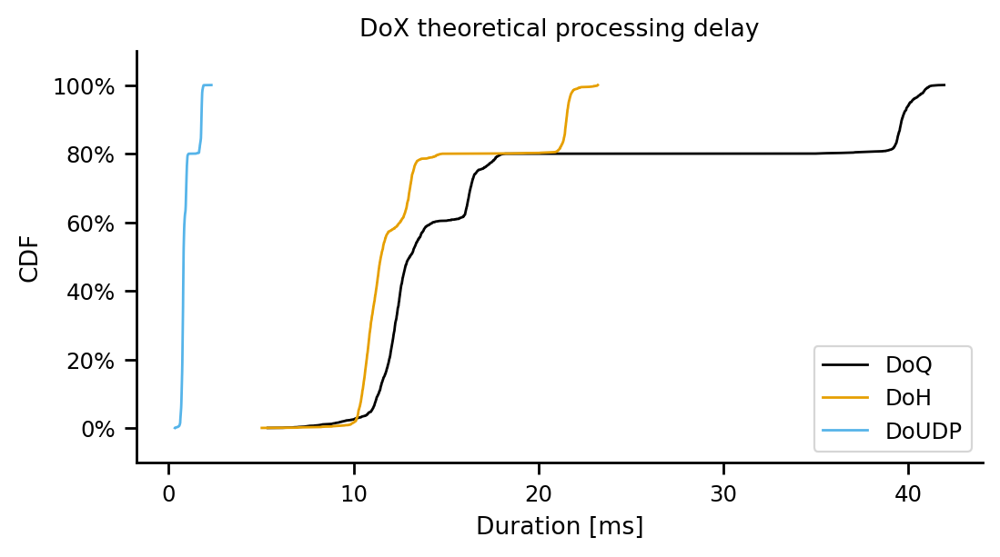

In [914]:
df_tmp = df_exchange_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)



ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX theoretical processing delay')

ax.set_xlabel('Duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
#ax.set_xlim(0, 5)
ax.legend()


if log:
    fig.savefig('figures/processing-delay-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/processing-delay.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean      11.393999
std        1.099327
min        5.359322
10%       10.418854
20%       11.031389
25%       11.127121
30%       11.195754
40%       11.348052
50%       11.468157
60%       11.604639
70%       11.812561
75%       11.955607
80%       12.208615
90%       12.622959
100%      13.400516
max       13.400516
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      10.532984
std        0.543556
min        5.035782
10%       10.159740
20%       10.265226
25%       10.325542
30%       10.371001
40%       10.457039
50%       10.521396
60%       10.603199
70%       10.684655
75%       10.728647
80%       10.790377
90%       10.960448
100%      12.495047
max       12.495047
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.720100
std        0.060221
min        0.335197
10%        0.636077
20%        0.680722
25%        0.700250
30%        0.707902
40%        0.719570
50%        0.732663
60% 

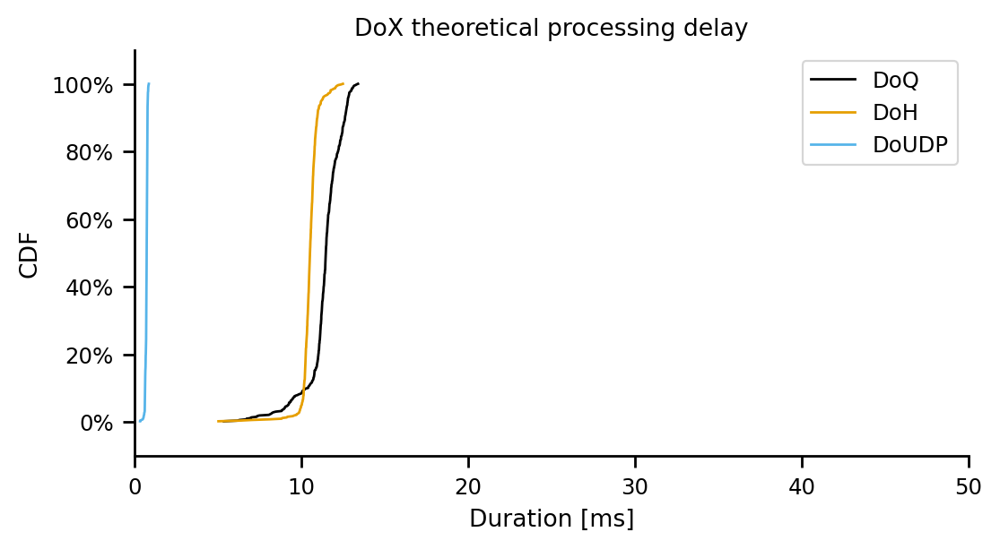

DoQ
count    528.000000
mean      12.611617
std        0.921538
min        7.142917
10%       11.949976
20%       12.238409
25%       12.321127
30%       12.369743
40%       12.470842
50%       12.550935
60%       12.670611
70%       12.847259
75%       12.993842
80%       13.275968
90%       13.751922
100%      14.747563
max       14.747563
Name: theoretical_processing_delay, dtype: float64
DoH
count    528.000000
mean      10.959905
std        0.577704
min        6.902195
10%       10.542209
20%       10.668076
25%       10.725291
30%       10.766446
40%       10.844960
50%       10.916556
60%       10.987787
70%       11.079276
75%       11.129310
80%       11.184996
90%       11.386717
100%      13.217810
max       13.217810
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    528.000000
mean       0.777970
std        0.060919
min        0.379071
10%        0.697757
20%        0.748757
25%        0.762768
30%        0.770506
40%        0.781447
50%        0.789340
60% 

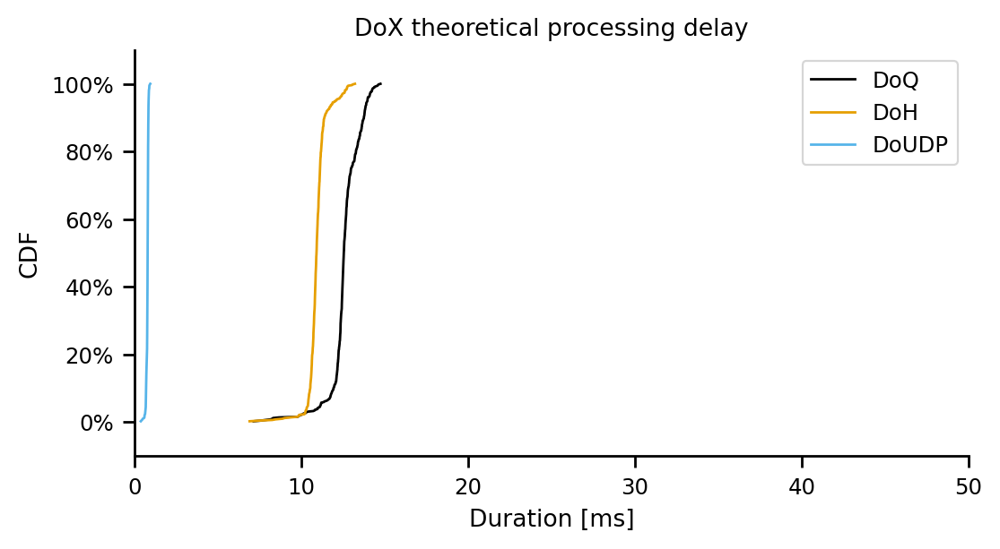

DoQ
count    528.000000
mean      39.755706
std        0.811952
min       34.977470
10%       39.241894
20%       39.390670
25%       39.426975
30%       39.482599
40%       39.572264
50%       39.653708
60%       39.783637
70%       39.988385
75%       40.124626
80%       40.314830
90%       40.821016
100%      41.934123
max       41.934123
Name: theoretical_processing_delay, dtype: float64
DoH
count    528.000000
mean      21.518308
std        0.461262
min       17.516603
10%       21.194723
20%       21.355147
25%       21.394914
30%       21.426118
40%       21.465533
50%       21.507895
60%       21.553080
70%       21.601208
75%       21.632970
80%       21.681560
90%       21.825316
100%      23.203308
max       23.203308
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    528.000000
mean       1.763732
std        0.060520
min        1.475840
10%        1.681571
20%        1.735316
25%        1.746549
30%        1.752999
40%        1.760686
50%        1.770404
60% 

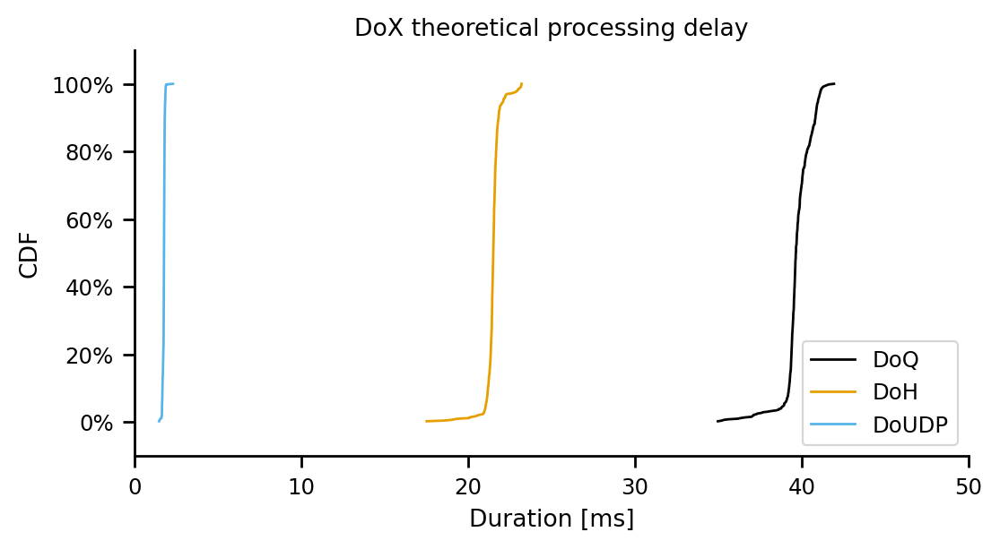

DoQ
count    527.000000
mean      12.397275
std        0.935384
min        6.804983
10%       11.835471
20%       11.982706
25%       12.021882
30%       12.068967
40%       12.155507
50%       12.254099
60%       12.435534
70%       12.729218
75%       13.011937
80%       13.222828
90%       13.480690
100%      14.403524
max       14.403524
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      11.408146
std        0.524603
min        6.966863
10%       10.946873
20%       11.184287
25%       11.228815
30%       11.268820
40%       11.334753
50%       11.388692
60%       11.463430
70%       11.552185
75%       11.598627
80%       11.638897
90%       11.799064
100%      13.447409
max       13.447409
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.764019
std        0.051577
min        0.372522
10%        0.688547
20%        0.733238
25%        0.747292
30%        0.753914
40%        0.766155
50%        0.775199
60% 

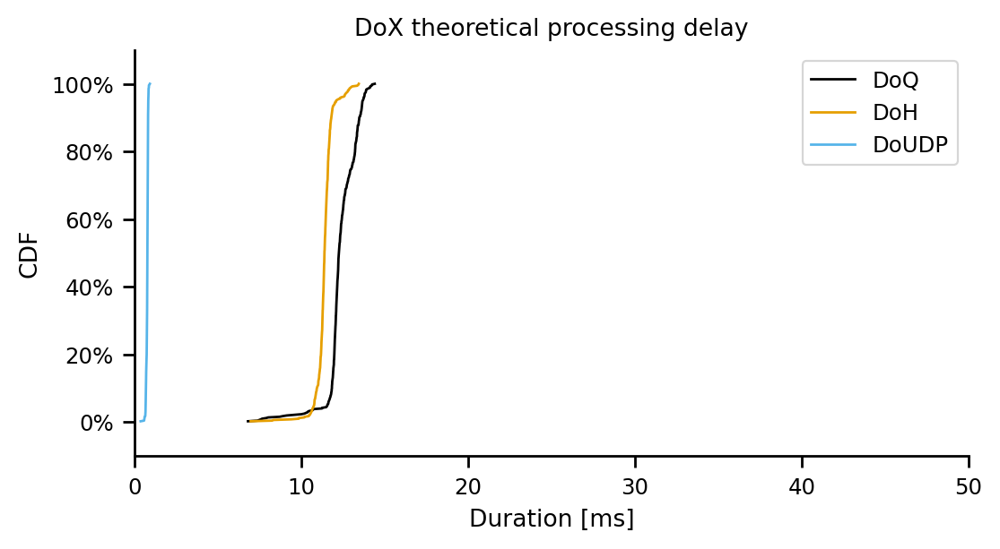

DoQ
count    527.000000
mean      16.466637
std        0.728062
min       11.426261
10%       15.983792
20%       16.099314
25%       16.140348
30%       16.174051
40%       16.242328
50%       16.323709
60%       16.416609
70%       16.540046
75%       16.706372
80%       17.075656
90%       17.552140
100%      18.215904
max       18.215904
Name: theoretical_processing_delay, dtype: float64
DoH
count    527.000000
mean      13.082980
std        0.487503
min        9.538345
10%       12.610365
20%       12.819322
25%       12.869519
30%       12.899959
40%       12.978643
50%       13.041473
60%       13.104254
70%       13.157846
75%       13.224614
80%       13.274287
90%       13.484997
100%      14.799214
max       14.799214
Name: theoretical_processing_delay, dtype: float64
DoUDP
count    527.000000
mean       0.944077
std        0.048134
min        0.763412
10%        0.869219
20%        0.914746
25%        0.922919
30%        0.927913
40%        0.939191
50%        0.948631
60% 

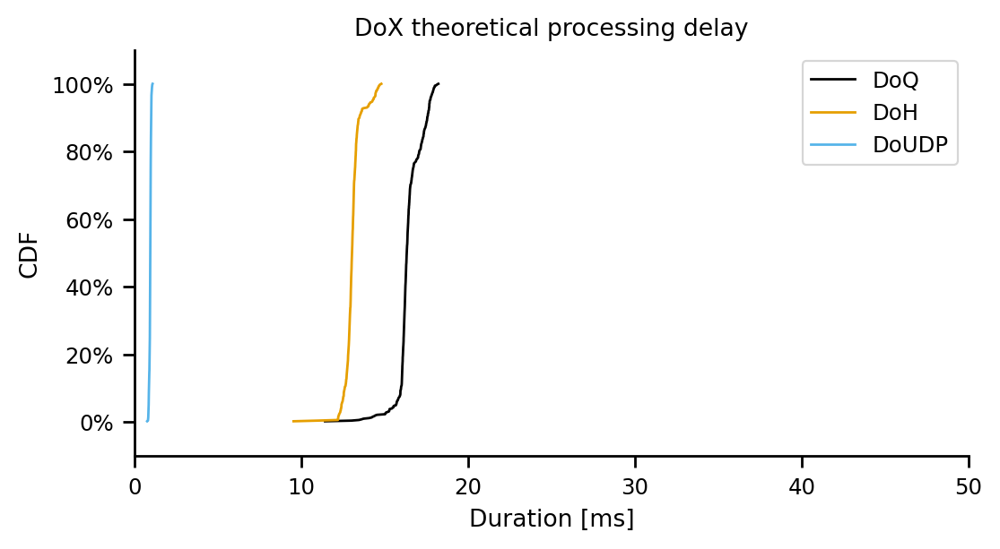

In [915]:
df_tmp = df_exchange_durations
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoH', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['theoretical_processing_delay'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    #plt.axvline(x=1, color='gray', linestyle='--')
    #plt.axvline(x=2, color='gray', linestyle='--')
    #plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoX theoretical processing delay')

    ax.set_xlabel('Duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 50)
    ax.legend()


    if log:
        fig.savefig('figures/processing-delay-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/processing-delay-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [106]:
median_doq_0rtt_4g = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.experiment_type == '4g')].full_plt.median()
median_doq_0rtt_4g_med = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoQ + H3 0-RTT') & (df_dns_and_h3.experiment_type == '4g-medium')].full_plt.median()
print(str((median_doq_0rtt_4g_med/(median_doq_0rtt_4g/100))-100)+"%")

6.013109268284666%


In [107]:
median_doudp_1rtt_4g = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT') & (df_dns_and_h3.experiment_type == '4g')].full_plt.median()
median_doudp_1rtt_4g_med = df_dns_and_h3[(df_dns_and_h3.experiment_description == 'DoUDP + H3 1-RTT') & (df_dns_and_h3.experiment_type == '4g-medium')].full_plt.median()
print(str((median_doudp_1rtt_4g_med/(median_doudp_1rtt_4g/100))-100)+"%")

4.723904303381403%


In [108]:
df_handshake_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'handshake'].copy()
df_handshake_durations = pd.merge(df_handshake_durations, measurements, on='msm_id')
df_handshake_durations['rtt'] = 0
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'dsl', 42.35979, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'cable', 25.17665, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == 'fiber', 14.767147, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == '4g', 91.85231065904635, df_handshake_durations['rtt'])
df_handshake_durations['rtt'] = np.where(df_handshake_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_handshake_durations['rtt'])
df_handshake_durations['duration_in_rtt'] = df_handshake_durations['duration'] / df_handshake_durations['rtt']

In [192]:
df_query_durations = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'query'].copy()
df_query_durations = pd.merge(df_query_durations, measurements, on='msm_id')
df_query_durations['rtt'] = 0
df_query_durations['rtt'] = np.where(df_query_durations['experiment_type'] == 'dsl', 42.35979, df_query_durations['rtt'])
df_query_durations['rtt'] = np.where(df_query_durations['experiment_type'] == 'cable', 25.17665, df_query_durations['rtt'])
df_query_durations['rtt'] = np.where(df_query_durations['experiment_type'] == 'fiber', 14.767147, df_query_durations['rtt'])
df_query_durations['rtt'] = np.where(df_query_durations['experiment_type'] == '4g', 91.85231065904635, df_query_durations['rtt'])
df_query_durations['rtt'] = np.where(df_query_durations['experiment_type'] == '4g-medium', 104.5041425140391, df_query_durations['rtt'])
df_query_durations['duration_in_rtt'] = df_query_durations['duration'] / df_query_durations['rtt']

DoQ
count    2637.000000
mean        1.376283
std         0.225765
min         1.055043
10%         1.114798
20%         1.119619
25%         1.121158
30%         1.122994
40%         1.225375
50%         1.426826
60%         1.479061
70%         1.549919
75%         1.554307
80%         1.577357
90%         1.671234
100%        1.803969
max         1.803969
Name: duration_in_rtt, dtype: float64


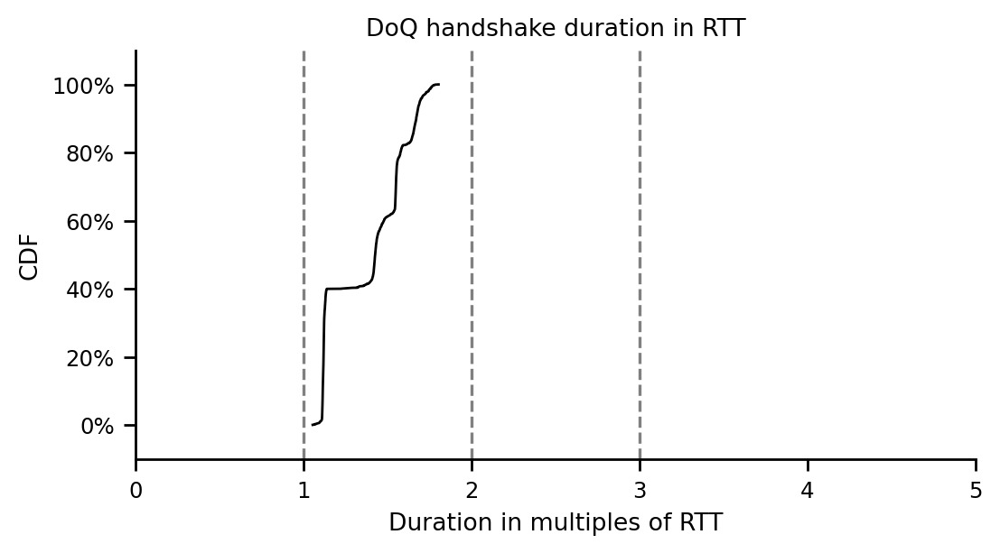

In [919]:
df_tmp = df_handshake_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(proto)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=3, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoQ handshake duration in RTT')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0, 5)


if log:
    fig.savefig('figures/handshake-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/handshake-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    527.000000
mean       1.662454
std        0.073046
min        1.288553
10%        1.589256
20%        1.644587
25%        1.650449
30%        1.655977
40%        1.662520
50%        1.671265
60%        1.678234
70%        1.687948
75%        1.692547
80%        1.705062
90%        1.744318
100%       1.803969
max        1.803969
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.048764
std        0.004078
min        1.022699
10%        1.043074
20%        1.046097
25%        1.047419
30%        1.047938
40%        1.048728
50%        1.049614
60%        1.050323
70%        1.050888
75%        1.051176
80%        1.051515
90%        1.052592
100%       1.058359
max        1.058359
Name: duration_in_rtt, dtype: float64


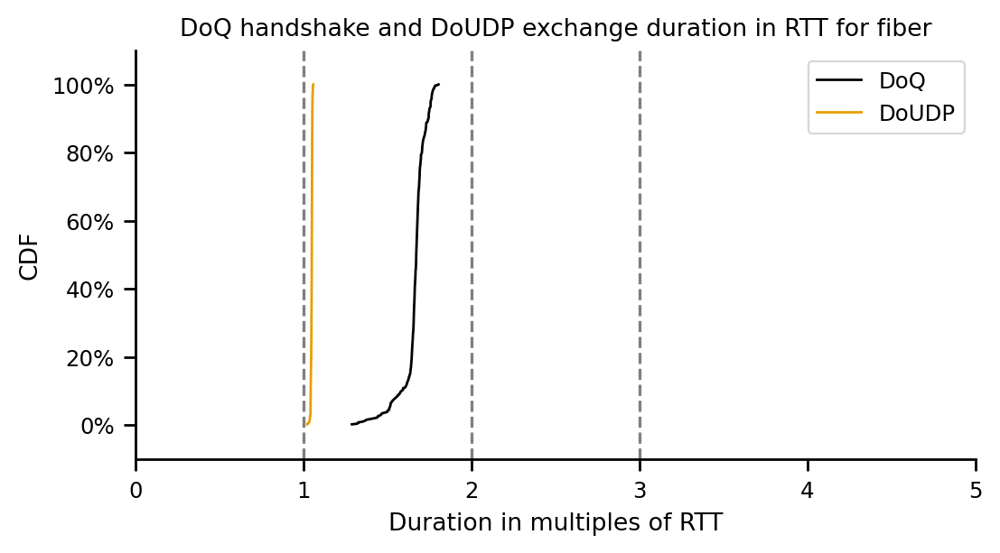

DoQ
count    528.000000
mean       1.427204
std        0.034331
min        1.223631
10%        1.403055
20%        1.415836
25%        1.418588
30%        1.420129
40%        1.423885
50%        1.427341
60%        1.431065
70%        1.436151
75%        1.439987
80%        1.445973
90%        1.465922
100%       1.505890
max        1.505890
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.030900
std        0.002420
min        1.015056
10%        1.027714
20%        1.029740
25%        1.030297
30%        1.030604
40%        1.031039
50%        1.031352
60%        1.031713
70%        1.032001
75%        1.032186
80%        1.032428
90%        1.033141
100%       1.037678
max        1.037678
Name: duration_in_rtt, dtype: float64


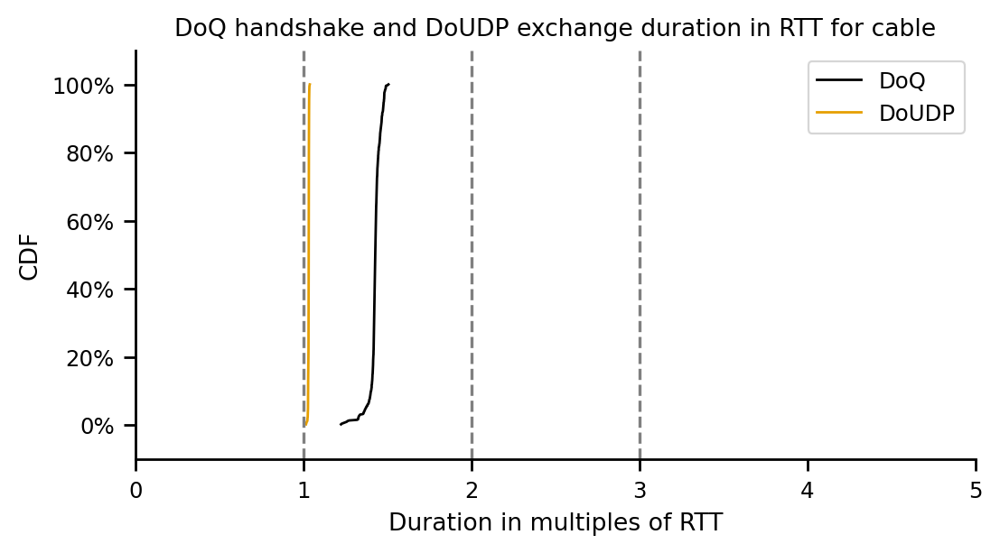

DoQ
count    528.000000
mean       1.552960
std        0.018005
min        1.444715
10%        1.544357
20%        1.546938
25%        1.547563
30%        1.548638
40%        1.549747
50%        1.551231
60%        1.553126
70%        1.554816
75%        1.557248
80%        1.560581
90%        1.577056
100%       1.590375
max        1.590375
Name: duration_in_rtt, dtype: float64
DoUDP
count    528.000000
mean       1.041637
std        0.001429
min        1.034841
10%        1.039697
20%        1.040966
25%        1.041231
30%        1.041384
40%        1.041565
50%        1.041794
60%        1.042007
70%        1.042229
75%        1.042368
80%        1.042504
90%        1.042962
100%       1.054495
max        1.054495
Name: duration_in_rtt, dtype: float64


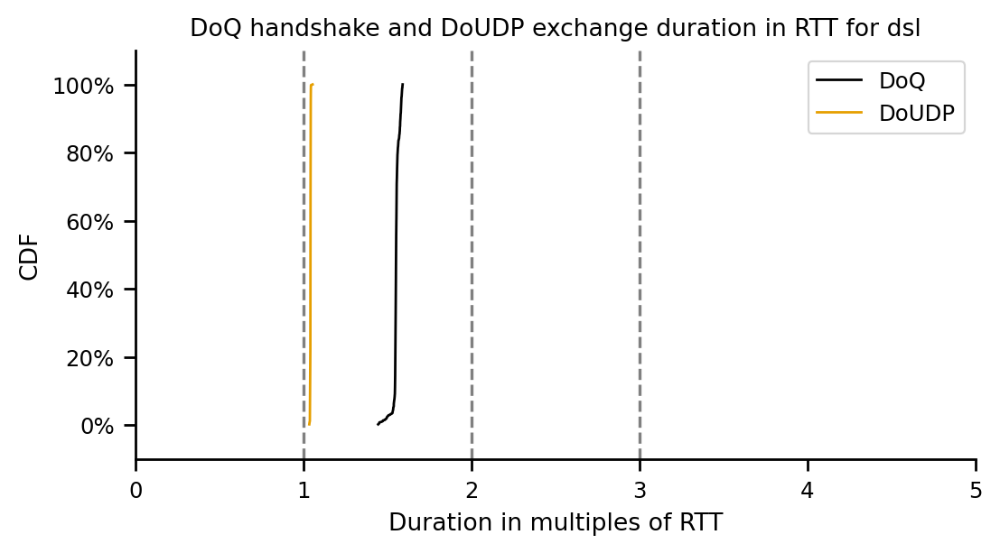

DoQ
count    527.000000
mean       1.116343
std        0.009602
min        1.055043
10%        1.111274
20%        1.112655
25%        1.113073
30%        1.113602
40%        1.114346
50%        1.115190
60%        1.116235
70%        1.117807
75%        1.119498
80%        1.123123
90%        1.128407
100%       1.136753
max        1.136753
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.008318
std        0.000562
min        1.004056
10%        1.007496
20%        1.007983
25%        1.008136
30%        1.008208
40%        1.008341
50%        1.008440
60%        1.008501
70%        1.008597
75%        1.008628
80%        1.008689
90%        1.008869
100%       1.010055
max        1.010055
Name: duration_in_rtt, dtype: float64


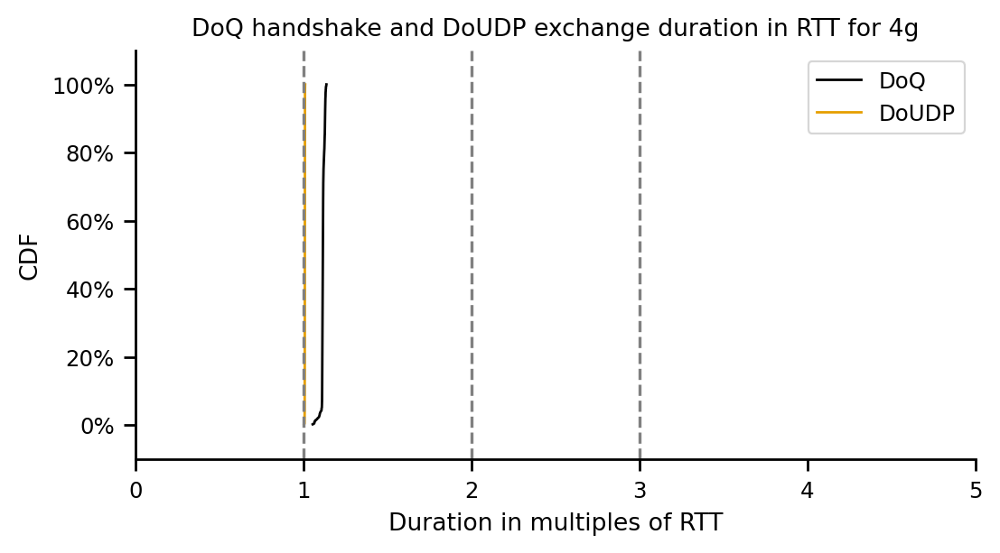

DoQ
count    527.000000
mean       1.122024
std        0.006585
min        1.076623
10%        1.117955
20%        1.119210
25%        1.119624
30%        1.119957
40%        1.120621
50%        1.121290
60%        1.122009
70%        1.122912
75%        1.123371
80%        1.124828
90%        1.131316
100%       1.139235
max        1.139235
Name: duration_in_rtt, dtype: float64
DoUDP
count    527.000000
mean       1.009034
std        0.000461
min        1.007305
10%        1.008318
20%        1.008753
25%        1.008831
30%        1.008879
40%        1.008987
50%        1.009077
60%        1.009177
70%        1.009275
75%        1.009325
80%        1.009385
90%        1.009568
100%       1.010405
max        1.010405
Name: duration_in_rtt, dtype: float64


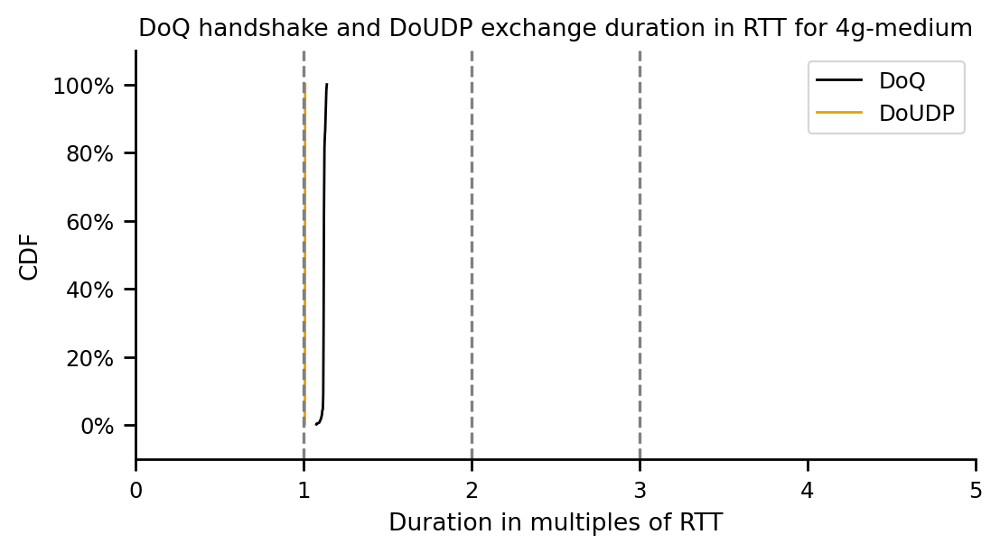

In [920]:
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['DoQ', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        if proto == "DoQ":
            df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == tech]
        if proto == "DoUDP":
            df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(proto)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=proto, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)

    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=3, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('DoQ handshake and DoUDP exchange duration in RTT for '+tech)

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0, 5)
    ax.legend()


    if log:
        fig.savefig('figures/doq-handshake-doudp-exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/doq-handshake-doudp-exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [109]:
df_tcp_pings = pd.DataFrame(columns=['duration', 'experiment_type'], )
for access_tech in ['dsl', 'cable', 'fiber', '4g', '4g-medium']:
    df_tmp = pd.read_csv('tcp_ping_'+access_tech+'.log', sep=" ", header=None, names=['len', 'ip', 'ttl', '??', 'id', 'port', 'flags', 'seq', 'cwin', 'duration', 'unit'])
    if df_tmp['unit'].nunique() > 1:
        print('error, unit that isnt miliseconds in data')
    df_tmp['experiment_type'] = access_tech
    #df_tmp.rename(columns=lambda x: x.replace('0', 'duration'), inplace=True)
    df_tmp = df_tmp[['duration', 'experiment_type']]
    df_tmp = df_tmp.apply(lambda s: s.str.replace('rtt=', ''))
    df_tmp['duration'] = pd.to_numeric(df_tmp['duration'])
    df_tcp_pings = pd.concat([df_tcp_pings, df_tmp])
df_tcp_pings
df_tcp_pings['rtt'] = 0
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'dsl', 42.35979, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'cable', 25.17665, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == 'fiber', 14.767147, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == '4g', 91.85231065904635, df_tcp_pings['rtt'])
df_tcp_pings['rtt'] = np.where(df_tcp_pings['experiment_type'] == '4g-medium', 104.5041425140391, df_tcp_pings['rtt'])
df_tcp_pings['duration_in_rtt'] = df_tcp_pings['duration'] / df_tcp_pings['rtt']
df_tcp_pings['transport_protocol'] = 'TCP ping'
df_tcp_pings

,duration,experiment_type,rtt,duration_in_rtt,transport_protocol
0,47.8,dsl,42.359790,1.128429,TCP ping
1,47.8,dsl,42.359790,1.128429,TCP ping
2,47.8,dsl,42.359790,1.128429,TCP ping
3,47.8,dsl,42.359790,1.128429,TCP ping
4,47.8,dsl,42.359790,1.128429,TCP ping
...,...,...,...,...,...
11482,111.8,4g-medium,104.504143,1.069814,TCP ping
11483,111.8,4g-medium,104.504143,1.069814,TCP ping
11484,111.9,4g-medium,104.504143,1.070771,TCP ping
11485,111.8,4g-medium,104.504143,1.069814,TCP ping


## probably some artifact/anomaly from netem like the JITTER thing since the values are very very similar/repeat themselves

In [110]:
df_tcp_pings[df_tcp_pings.duration_in_rtt > 5]

,duration,experiment_type,rtt,duration_in_rtt,transport_protocol
725,1047.8,dsl,42.359790,24.735722,TCP ping
829,1047.9,dsl,42.359790,24.738083,TCP ping
954,1047.8,dsl,42.359790,24.735722,TCP ping
1259,1047.8,dsl,42.359790,24.735722,TCP ping
1282,1047.8,dsl,42.359790,24.735722,TCP ping
...,...,...,...,...,...
10713,1111.9,4g-medium,104.504143,10.639770,TCP ping
10818,1111.8,4g-medium,104.504143,10.638813,TCP ping
10819,1111.9,4g-medium,104.504143,10.639770,TCP ping
11187,1111.9,4g-medium,104.504143,10.639770,TCP ping


In [111]:
df_tcp_pings[df_tcp_pings.duration_in_rtt > 5].rtt.value_counts()

104.504143    60
91.852311     53
25.176650     51
42.359790     47
14.767147     37
Name: rtt, dtype: int64

DoQ handshake
count    11489.000000
mean         1.667740
std          0.070672
min          1.283513
10%          1.620869
20%          1.648817
25%          1.655271
30%          1.659784
40%          1.666798
50%          1.672774
60%          1.679686
70%          1.688537
75%          1.695125
80%          1.705616
90%          1.743465
100%         1.834540
max          1.834540
Name: duration_in_rtt, dtype: float64
TCP ping
count    11452.000000
mean         1.077938
std          0.039718
min          1.069943
10%          1.069943
20%          1.069943
25%          1.069943
30%          1.069943
40%          1.069943
50%          1.069943
60%          1.069943
70%          1.076714
75%          1.076714
80%          1.076714
90%          1.076714
100%         1.354358
max          1.354358
Name: duration_in_rtt, dtype: float64
DoUDP lookup
count    11489.000000
mean         1.049137
std          0.004098
min          1.018970
10%          1.044746
20%          1.048157
25%     

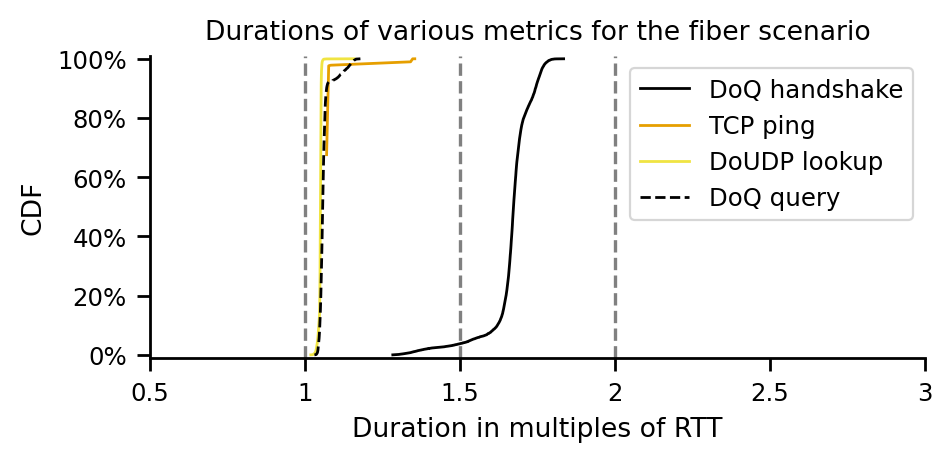

DoQ handshake
count    11486.000000
mean         1.430107
std          0.031363
min          1.204005
10%          1.407705
20%          1.417167
25%          1.419380
30%          1.421221
40%          1.424489
50%          1.428063
60%          1.431665
70%          1.436718
75%          1.440699
80%          1.448252
90%          1.472712
100%         1.542277
max          1.542277
Name: duration_in_rtt, dtype: float64
TCP ping
count    11437.000000
mean         1.261197
std          0.022512
min          1.104198
10%          1.263075
20%          1.263075
25%          1.263075
30%          1.263075
40%          1.263075
50%          1.263075
60%          1.263075
70%          1.267047
75%          1.267047
80%          1.267047
90%          1.267047
100%         1.271019
max          1.271019
Name: duration_in_rtt, dtype: float64
DoUDP lookup
count    11486.000000
mean         1.031332
std          0.002264
min          1.015337
10%          1.028898
20%          1.030670
25%     

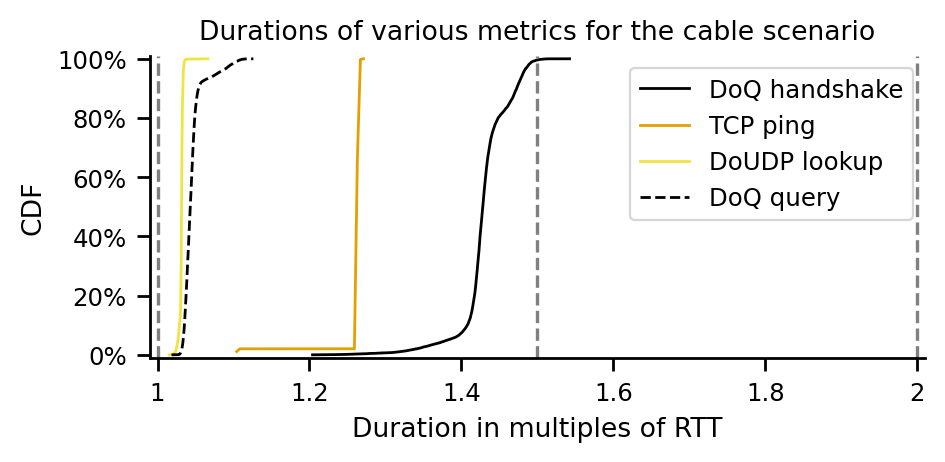

DoQ handshake
count    11488.000000
mean         1.554801
std          0.015124
min          1.433273
10%          1.545216
20%          1.547275
25%          1.548000
30%          1.548641
40%          1.549850
50%          1.551217
60%          1.552996
70%          1.555593
75%          1.557872
80%          1.562891
90%          1.578541
100%         1.607060
max          1.607060
Name: duration_in_rtt, dtype: float64
TCP ping
count    11444.000000
mean         1.127283
std          0.013293
min          1.033999
10%          1.128429
20%          1.128429
25%          1.128429
30%          1.128429
40%          1.128429
50%          1.128429
60%          1.128429
70%          1.130789
75%          1.130789
80%          1.130789
90%          1.130789
100%         1.225219
max          1.225219
Name: duration_in_rtt, dtype: float64
DoUDP lookup
count    11488.000000
mean         1.041764
std          0.001365
min          1.030898
10%          1.040424
20%          1.041378
25%     

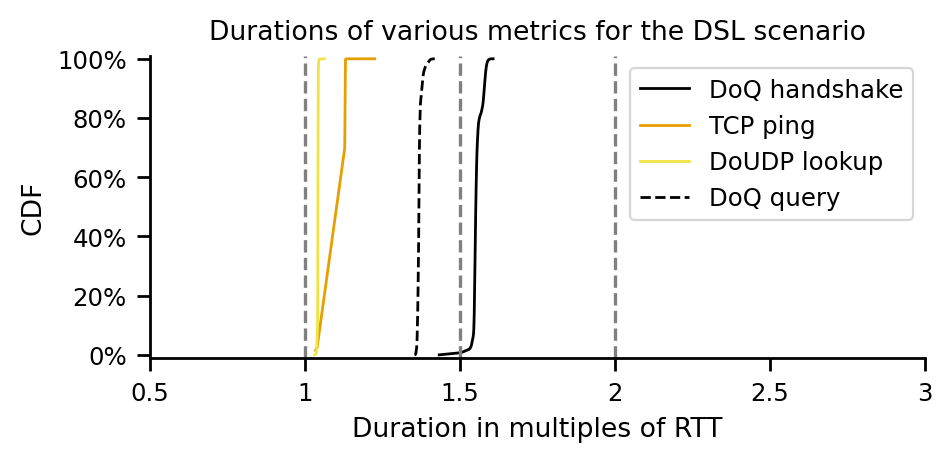

DoQ handshake
count    11487.000000
mean         1.116745
std          0.007205
min          1.057005
10%          1.111457
20%          1.112667
25%          1.113134
30%          1.113563
40%          1.114308
50%          1.115101
60%          1.116077
70%          1.117516
75%          1.118741
80%          1.121885
90%          1.127785
100%         1.138589
max          1.138589
Name: duration_in_rtt, dtype: float64
TCP ping
count    11434.000000
mean         1.044157
std          0.006037
min          1.042979
10%          1.042979
20%          1.042979
25%          1.042979
30%          1.042979
40%          1.042979
50%          1.042979
60%          1.042979
70%          1.044067
75%          1.044067
80%          1.044067
90%          1.044067
100%         1.130075
max          1.130075
Name: duration_in_rtt, dtype: float64
DoUDP lookup
count    11487.000000
mean         1.008449
std          0.000567
min          1.003819
10%          1.007911
20%          1.008256
25%     

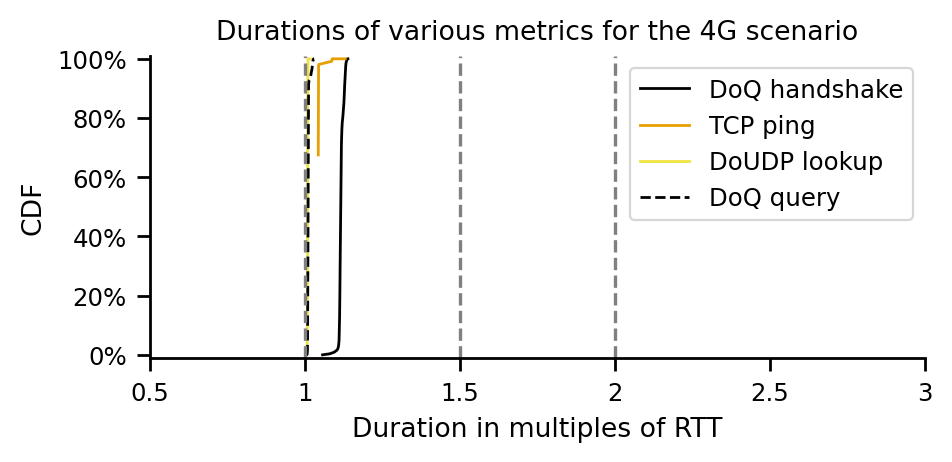

DoQ handshake
count    11486.000000
mean         1.122988
std          0.006348
min          1.071521
10%          1.118426
20%          1.119458
25%          1.119867
30%          1.120220
40%          1.120871
50%          1.121594
60%          1.122466
70%          1.123709
75%          1.124717
80%          1.127360
90%          1.132690
100%         1.152148
max          1.152148
Name: duration_in_rtt, dtype: float64
TCP ping
count    11427.000000
mean         1.069298
std          0.005538
min          1.031538
10%          1.069814
20%          1.069814
25%          1.069814
30%          1.069814
40%          1.069814
50%          1.069814
60%          1.069814
70%          1.070771
75%          1.070771
80%          1.070771
90%          1.070771
100%         1.071728
max          1.071728
Name: duration_in_rtt, dtype: float64
DoUDP lookup
count    11486.000000
mean         1.009094
std          0.000555
min          1.005500
10%          1.008596
20%          1.008888
25%     

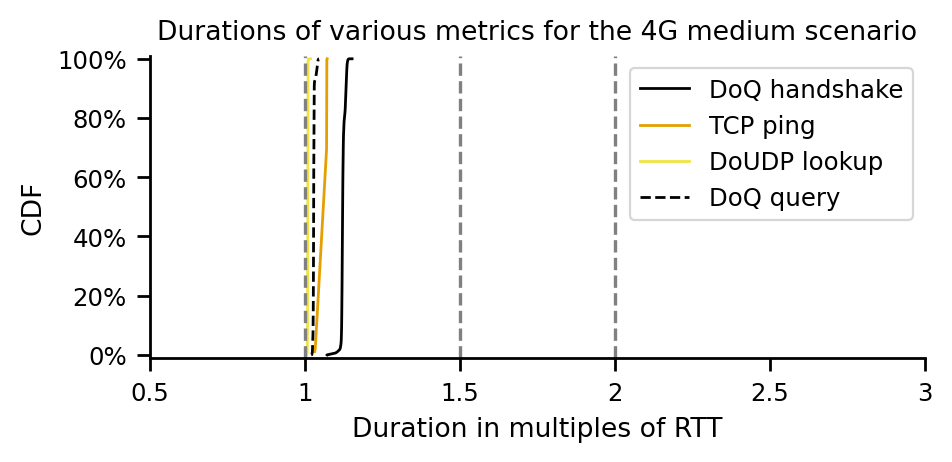

In [360]:
access_techs = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
for tech in access_techs:
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
    line_order = ['DoQ', 'TCP ping', 'DoUDP']
    colors = dict(zip(line_order, ['C0','C1','C4']))
    markers = dict(zip(line_order, ['o','v','s']))
    sample_size = dict()
    lnwidth = 1
    mrksize = 0
    log=False
    for proto in line_order:
        if proto == "DoQ":
            df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == tech]
            label = "DoQ handshake"
        if proto == "DoUDP":
            df_tmp = df_exchange_durations[df_exchange_durations.experiment_type == tech]
            label = "DoUDP lookup"
        if proto == "TCP ping":
            df_tmp = df_tcp_pings[(df_tcp_pings.experiment_type == tech) & (df_tcp_pings.duration_in_rtt <= 5)]
            label = "TCP ping"
        #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
        print(label)
        print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
        #ax.plot(cdf.xs, cdf.ps, label=col_val_,
        #            linestyle='-', linewidth=lnwidth, 
        #            markersize=mrksize, fillstyle='none', 
        #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
        #            color=colors[col_val_], marker=markers[col_val_]
        #        )
        dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
        dfplt.plot(ax=ax, label=label, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)
    
    print("DoQ query")
    df_tmp = df_query_durations[df_query_durations.experiment_type == tech]
    label="DoQ query"
    print(df_tmp[df_tmp.transport_protocol == "DoQ"]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == "DoQ"]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=label, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors["DoQ"], linestyle='dashed', linewidth=lnwidth, logx=log)



    plt.axvline(x=1, color='gray', linestyle='--')
    plt.axvline(x=2, color='gray', linestyle='--')
    plt.axvline(x=1.5, color='gray', linestyle='--')

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')

    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Durations of various metrics for the '+map_techs_to_proper_name[tech]+' scenario')

    ax.set_xlabel('Duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.01,1.01)
    if tech == 'cable':
        ax.set_xlim(0.99, 2.01)
        ax.legend()
    else:
        ax.set_xlim(0.5, 3)
        ax.legend()

    if log:
        fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-'+tech+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-'+tech+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

DoQ handshake
count    57436.000000
mean         1.378493
std          0.226944
min          1.057005
10%          1.114875
20%          1.119705
25%          1.121281
30%          1.123477
40%          1.204521
50%          1.427174
60%          1.483252
70%          1.550448
75%          1.555308
80%          1.581197
90%          1.672776
100%         1.834540
max          1.834540
Name: duration_in_rtt, dtype: float64
TCP ping
count    57194.000000
mean         1.115978
std          0.080405
min          1.031538
10%          1.042979
20%          1.044067
25%          1.069814
30%          1.069814
40%          1.069943
50%          1.070771
60%          1.104198
70%          1.128429
75%          1.130789
80%          1.263075
90%          1.263075
100%         1.354358
max          1.354358
Name: duration_in_rtt, dtype: float64
DoUDP lookup
count    57436.000000
mean         1.027957
std          0.016802
min          1.003819
10%          1.008455
20%          1.008829
25%     

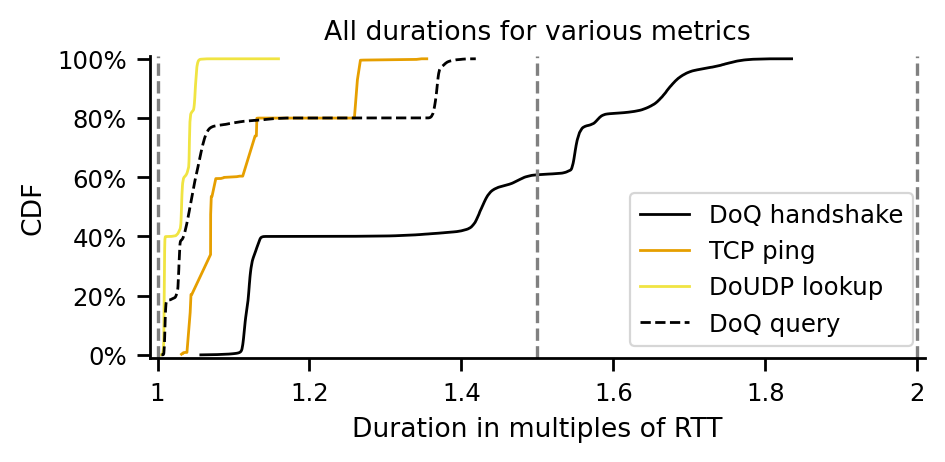

In [358]:
#df_tmp = df_handshake_durations
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
line_order = ['DoQ', 'TCP ping', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C4']))
markers = dict(zip(line_order, ['o','v','s']))
sample_size = dict()
lnwidth = 1
mrksize = 0
log=False
for proto in line_order:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    if proto == "DoQ":
        df_tmp = df_handshake_durations
        label = "DoQ handshake"
    if proto == "DoUDP":
        df_tmp = df_exchange_durations
        label = "DoUDP lookup"
    if proto == "TCP ping":
        df_tmp = df_tcp_pings[(df_tcp_pings.duration_in_rtt <= 5)]
        label = "TCP ping"
    print(label)
    print(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == proto]['duration_in_rtt'])
    dfplt.plot(ax=ax, label=label, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors[proto], linestyle='-', linewidth=lnwidth, logx=log)
    
print("DoQ query")
df_tmp = df_query_durations
label="DoQ query"
print(df_tmp[df_tmp.transport_protocol == "DoQ"]['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == "DoQ"]['duration_in_rtt'])
dfplt.plot(ax=ax, label=label, marker=markers[proto], markersize=mrksize, drawstyle="default", color=colors["DoQ"], linestyle='dashed', linewidth=lnwidth, logx=log)


plt.axvline(x=1, color='gray', linestyle='--')
plt.axvline(x=2, color='gray', linestyle='--')
plt.axvline(x=1.5, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('All durations for various metrics')

ax.set_xlabel('Duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.01,1.01)
ax.set_xlim(0.99, 2.01)
ax.legend()


if log:
    fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/doq-handshake-tcp-ping-doudp-exchange-duration-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [115]:
df_dns_and_h3['connect_duration'] = df_dns_and_h3['connectEnd'] - df_dns_and_h3['connectStart']
df_dns_and_h3['secure_connect_duration'] = df_dns_and_h3['connectEnd'] - df_dns_and_h3['secureConnectionStart']

In [116]:
df_h3_connect_times = df_dns_and_h3[['experiment_type', 'h3_description', 'connect_duration', 'secure_connect_duration', 'msm_id', 'website']].copy()
df_h3_connect_times = df_h3_connect_times.drop_duplicates()
df_h3_connect_times['rtt'] = 0
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'dsl', 42.35979, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'cable', 25.17665, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == 'fiber', 14.767147, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == '4g', 91.85231065904635, df_h3_connect_times['rtt'])
df_h3_connect_times['rtt'] = np.where(df_h3_connect_times['experiment_type'] == '4g-medium', 104.5041425140391, df_h3_connect_times['rtt'])
df_h3_connect_times['connect_in_rtt'] = df_h3_connect_times['connect_duration'] / df_h3_connect_times['rtt']
df_h3_connect_times['secure_connect_in_rtt'] = df_h3_connect_times['secure_connect_duration'] / df_h3_connect_times['rtt']

In [182]:
df_h3_connect_times['conn_diff'] = df_h3_connect_times['connect_duration'] - df_h3_connect_times['secure_connect_duration']
df_h3_connect_times['conn_diff'].describe()

count    114872.000000
mean          0.411549
std           0.100006
min           0.100000
25%           0.400000
50%           0.400000
75%           0.500000
max           0.700000
Name: conn_diff, dtype: float64

<AxesSubplot:>

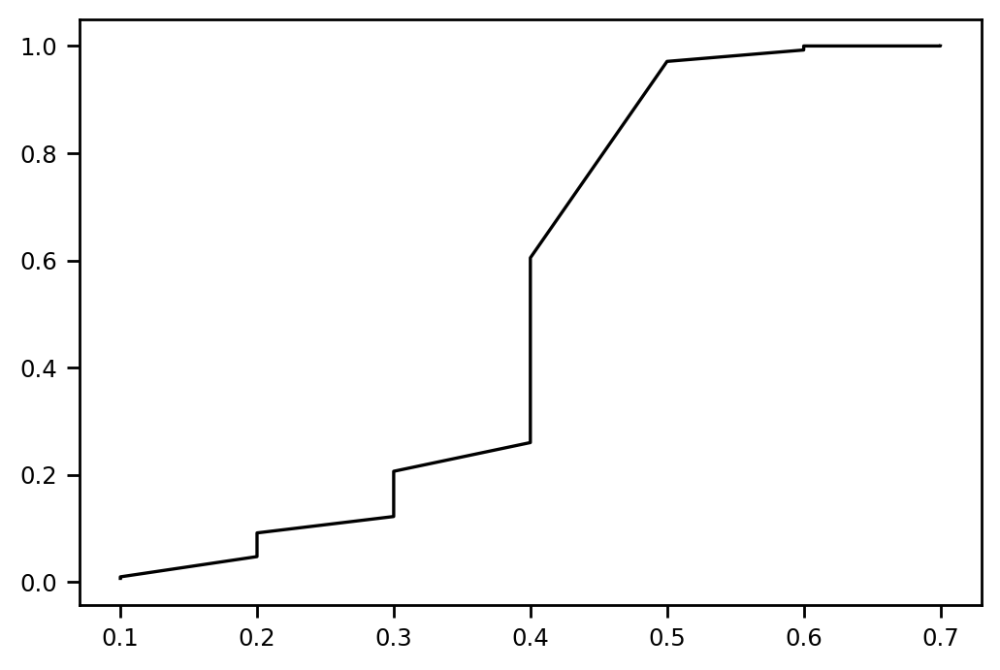

In [188]:
df_h3_connect_times['conn_diff'].value_counts(normalize=True).sort_index().cumsum().plot()

## correlation netlogs to web performance timings

In [181]:
df_h3_connect_times[df_h3_connect_times.msm_id == '09cfbcad-6f56-4834-b551-41d9755f27e4']
#initial sent to handshake finished (right before h3 get): 
#warmup   1890373046761-1890373024591 -> 22.17 ms
#0rtt     1890375892248-1890375874209 -> 18.093 ms


,experiment_type,h3_description,connect_duration,secure_connect_duration,msm_id,website,rtt,connect_in_rtt,secure_connect_in_rtt
74604,fiber,H3 1-RTT,23.4,22.9,09cfbcad-6f56-4834-b551-41d9755f27e4,www.example.org,14.767147,1.584599,1.550740
74607,fiber,H3 0-RTT,18.8,18.3,09cfbcad-6f56-4834-b551-41d9755f27e4,www.example.org,14.767147,1.273096,1.239237


count    9875.000000
mean       68.360314
std        36.248614
min        18.500000
10%        23.800000
20%        29.680000
25%        34.900000
30%        35.300000
40%        51.340000
50%        65.500000
60%        79.160000
70%       101.900000
75%       102.000000
80%       107.100000
90%       116.700000
100%      118.700000
max       118.700000
Name: connect_duration, dtype: float64
count    9875.00000
mean       62.51123
std        36.05303
min        16.50000
10%        18.20000
20%        27.16000
25%        29.20000
30%        29.40000
40%        46.86000
50%        58.90000
60%        74.18000
70%        95.80000
75%        95.90000
80%       100.04000
90%       110.60000
100%      112.50000
max       112.50000
Name: connect_duration, dtype: float64


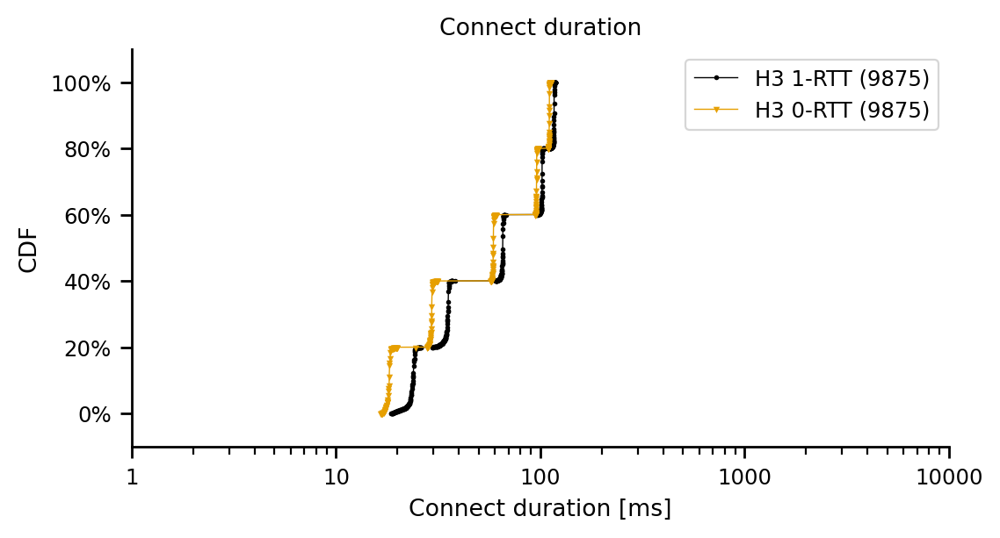

In [1190]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['connect_duration']) == 0:
            continue
        print(df_tmp['connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['connect_duration'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration')

ax.set_xlabel('Connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    9875.000000
mean        1.347695
std         0.208031
min         1.047333
10%         1.108301
20%         1.111567
25%         1.113831
30%         1.116702
40%         1.169845
50%         1.398121
60%         1.417981
70%         1.541556
75%         1.546278
80%         1.548638
90%         1.611686
100%        2.004449
max         2.004449
Name: connect_in_rtt, dtype: float64
count    9875.000000
mean        1.176172
std         0.127069
min         1.024471
10%         1.042979
20%         1.049719
25%         1.057374
30%         1.058331
40%         1.093124
50%         1.167749
60%         1.178291
70%         1.232466
75%         1.239237
80%         1.351141
90%         1.390470
100%        1.665860
max         1.665860
Name: connect_in_rtt, dtype: float64


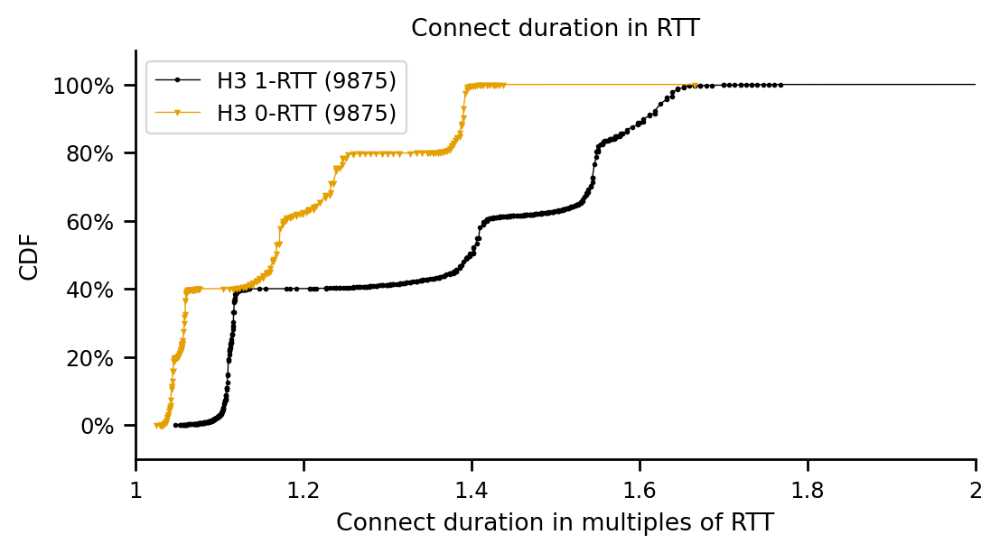

In [1191]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['connect_in_rtt']) == 0:
            continue
        print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['connect_in_rtt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration in RTT')

ax.set_xlabel('Connect duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,2)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    1975.000000
mean        1.539994
std         0.017537
min         1.418798
10%         1.522670
20%         1.534474
25%         1.536835
30%         1.539196
40%         1.543917
50%         1.546278
60%         1.546278
70%         1.548638
75%         1.548638
80%         1.548638
90%         1.550999
100%        1.600575
max         1.600575
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.388268
std         0.008033
min         1.347976
10%         1.376305
20%         1.383387
25%         1.385748
30%         1.388109
40%         1.388109
50%         1.390470
60%         1.390470
70%         1.392830
75%         1.392830
80%         1.392830
90%         1.395191
100%        1.437684
max         1.437684
Name: connect_in_rtt, dtype: float64


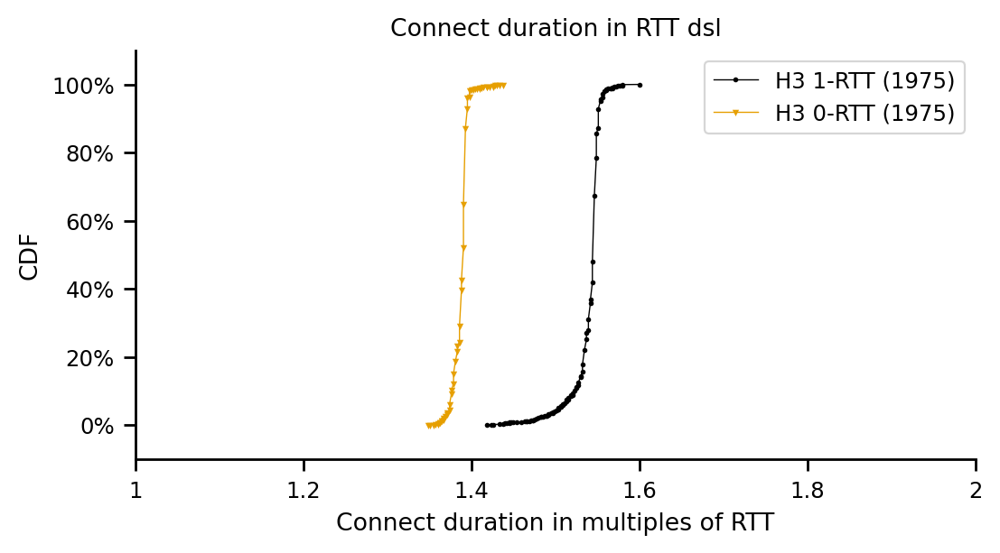

count    1975.000000
mean        1.389151
std         0.037369
min         1.179664
10%         1.342514
20%         1.378261
25%         1.386205
30%         1.390177
40%         1.394149
50%         1.402093
60%         1.406065
70%         1.410037
75%         1.410037
80%         1.410037
90%         1.414009
100%        1.517279
max         1.517279
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.164306
std         0.014210
min         1.104198
10%         1.143917
20%         1.155833
25%         1.159805
30%         1.163777
40%         1.163777
50%         1.167749
60%         1.167749
70%         1.171721
75%         1.171721
80%         1.171721
90%         1.175693
100%        1.251159
max         1.251159
Name: connect_in_rtt, dtype: float64


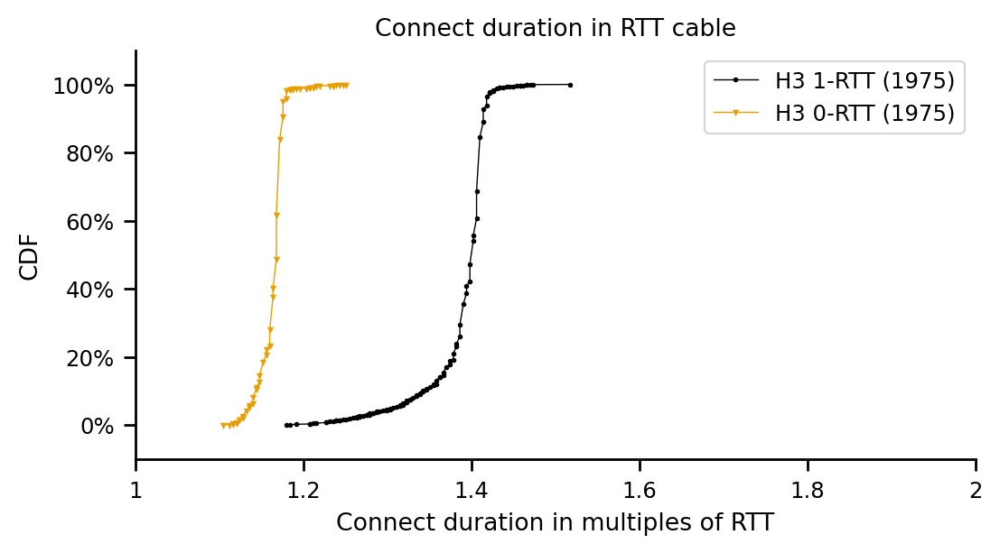

count    1975.000000
mean        1.587852
std         0.076477
min         1.252781
10%         1.503337
20%         1.564283
25%         1.577827
30%         1.584599
40%         1.598142
50%         1.611686
60%         1.618458
70%         1.625229
75%         1.632001
80%         1.632001
90%         1.645545
100%        2.004449
max         2.004449
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.227970
std         0.027433
min         1.117345
10%         1.191835
20%         1.212150
25%         1.218922
30%         1.225694
40%         1.232466
50%         1.232466
60%         1.239237
70%         1.239237
75%         1.239237
80%         1.246009
90%         1.246009
100%        1.665860
max         1.665860
Name: connect_in_rtt, dtype: float64


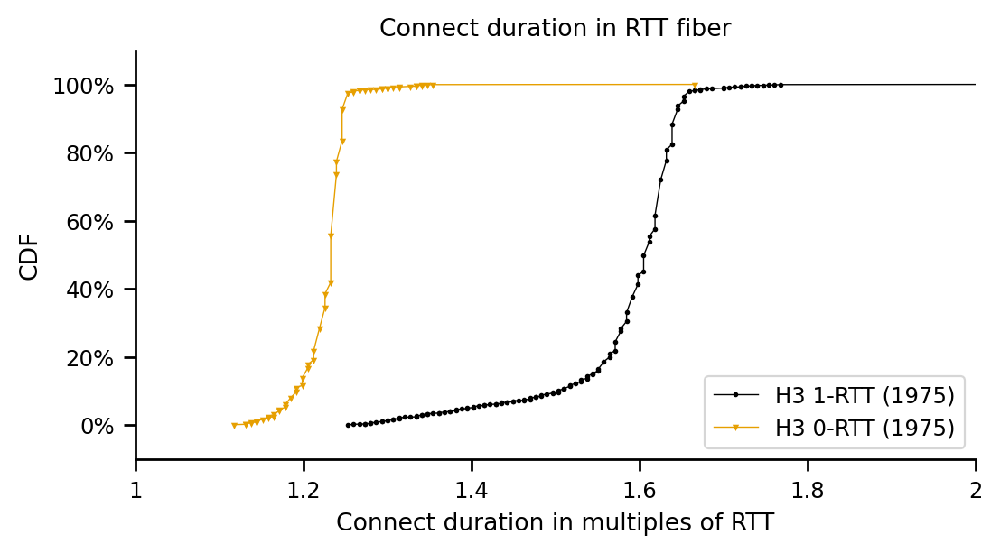

count    1975.000000
mean        1.107186
std         0.008045
min         1.047333
10%         1.100680
20%         1.105035
25%         1.106124
30%         1.107212
40%         1.108301
50%         1.109390
60%         1.109390
70%         1.110478
75%         1.110478
80%         1.110478
90%         1.111567
100%        1.155115
max         1.155115
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.042484
std         0.003474
min         1.024471
10%         1.037535
20%         1.039713
25%         1.040801
30%         1.041890
40%         1.042979
50%         1.042979
60%         1.044067
70%         1.044067
75%         1.044067
80%         1.044285
90%         1.045156
100%        1.064753
max         1.064753
Name: connect_in_rtt, dtype: float64


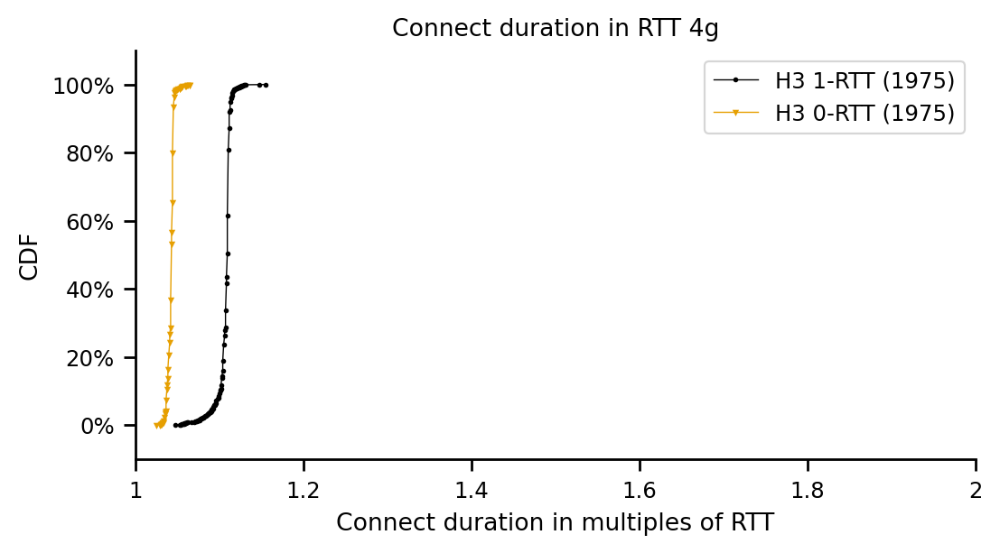

count    1975.000000
mean        1.114290
std         0.007253
min         1.063116
10%         1.108090
20%         1.112875
25%         1.113353
30%         1.114788
40%         1.115745
50%         1.116702
60%         1.116702
70%         1.117659
75%         1.117659
80%         1.117659
90%         1.118616
100%        1.135840
max         1.135840
Name: connect_in_rtt, dtype: float64
count    1975.000000
mean        1.057833
std         0.002999
min         1.043021
10%         1.053547
20%         1.056417
25%         1.056417
30%         1.057374
40%         1.058331
50%         1.058331
60%         1.059288
70%         1.059288
75%         1.059288
80%         1.059288
90%         1.060245
100%        1.076512
max         1.076512
Name: connect_in_rtt, dtype: float64


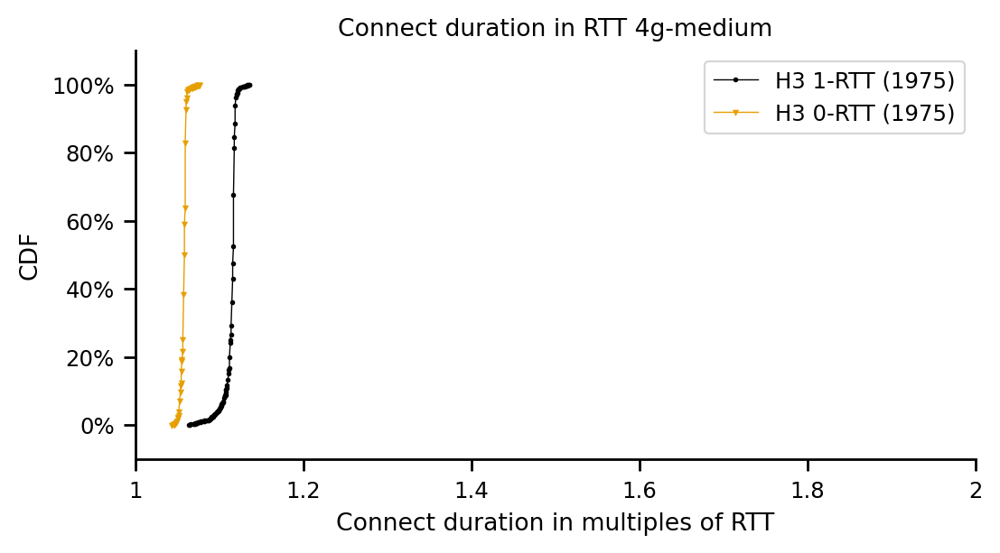

In [1182]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['connect_in_rtt']) == 0:
                continue
            print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect duration in RTT '+experiment_type)

    ax.set_xlabel('Connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

H3 1-RTT
count    11488.000000
mean         1.540004
std          0.018564
min          1.418798
10%          1.522670
20%          1.534474
25%          1.536835
30%          1.539196
40%          1.543917
50%          1.546278
60%          1.546278
70%          1.548638
75%          1.548638
80%          1.548638
90%          1.550999
100%         1.711529
max          1.711529
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    11488.000000
mean         1.388383
std          0.008045
min          1.345616
10%          1.378666
20%          1.383387
25%          1.385748
30%          1.388109
40%          1.388109
50%          1.390470
60%          1.390470
70%          1.392830
75%          1.392830
80%          1.392830
90%          1.395191
100%         1.442406
max          1.442406
Name: connect_in_rtt, dtype: float64
DoQ 1-RTT
count    11488.000000
mean         1.554801
std          0.015124
min          1.433273
10%          1.545216
20%          1.547275
25%          1.548

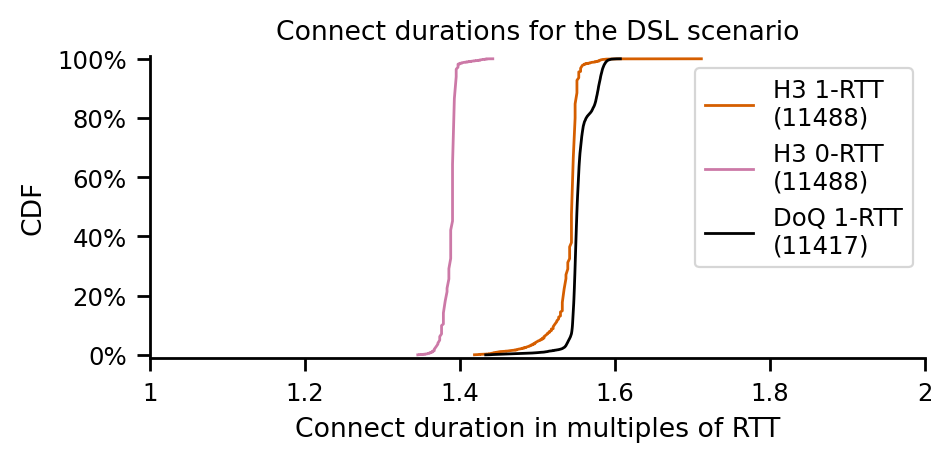

H3 1-RTT
count    11486.000000
mean         1.390109
std          0.037401
min          1.179664
10%          1.346486
20%          1.382233
25%          1.386205
30%          1.390177
40%          1.398121
50%          1.402093
60%          1.406065
70%          1.410037
75%          1.410037
80%          1.410037
90%          1.414009
100%         1.517279
max          1.517279
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    11486.000000
mean         1.164510
std          0.013870
min          1.092282
10%          1.143917
20%          1.155833
25%          1.159805
30%          1.163777
40%          1.163777
50%          1.167749
60%          1.167749
70%          1.171721
75%          1.171721
80%          1.171721
90%          1.175693
100%         1.259103
max          1.259103
Name: connect_in_rtt, dtype: float64
DoQ 1-RTT
count    11486.000000
mean         1.430107
std          0.031363
min          1.204005
10%          1.407705
20%          1.417167
25%          1.419

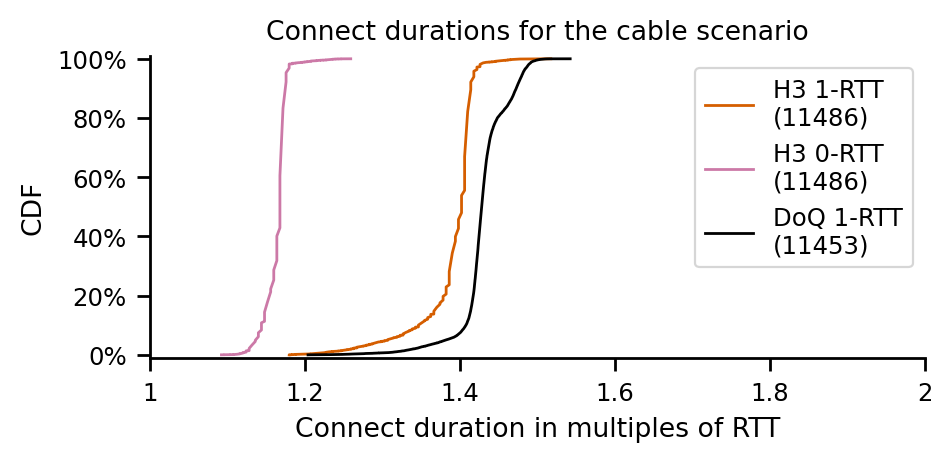

H3 1-RTT
count    11489.000000
mean         1.586426
std          0.076639
min          1.252781
10%          1.496565
20%          1.564283
25%          1.571055
30%          1.584599
40%          1.598142
50%          1.611686
60%          1.618458
70%          1.625229
75%          1.632001
80%          1.632001
90%          1.645545
100%         2.004449
max          2.004449
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    11489.000000
mean         1.228223
std          0.026872
min          1.117345
10%          1.191835
20%          1.212150
25%          1.218922
30%          1.225694
40%          1.232466
50%          1.232466
60%          1.239237
70%          1.239237
75%          1.239237
80%          1.246009
90%          1.246009
100%         1.692947
max          1.692947
Name: connect_in_rtt, dtype: float64
DoQ 1-RTT
count    11489.000000
mean         1.667740
std          0.070672
min          1.283513
10%          1.620869
20%          1.648817
25%          1.655

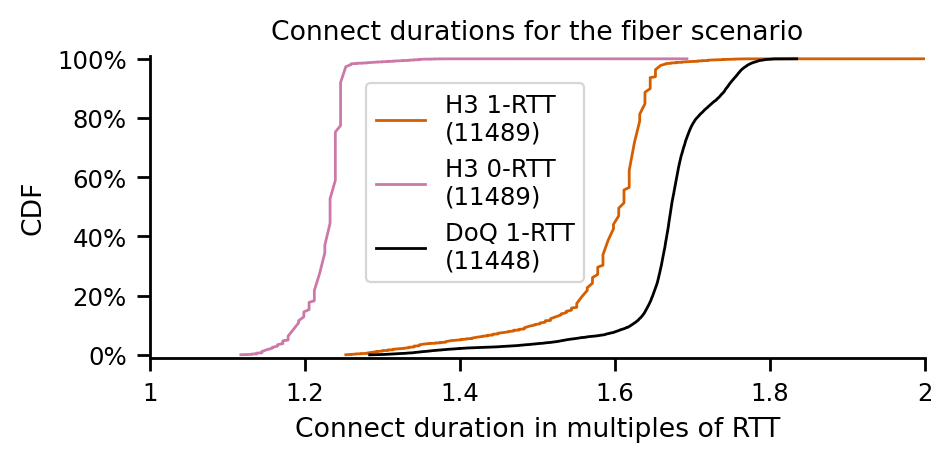

H3 1-RTT
count    11487.000000
mean         1.106876
std          0.008784
min          1.046245
10%          1.099591
20%          1.105035
25%          1.106124
30%          1.107212
40%          1.108301
50%          1.109390
60%          1.109390
70%          1.110478
75%          1.110478
80%          1.110478
90%          1.111567
100%         1.175801
max          1.175801
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    11487.000000
mean         1.042590
std          0.003713
min          1.022293
10%          1.037535
20%          1.039713
25%          1.040801
30%          1.041890
40%          1.042979
50%          1.042979
60%          1.044067
70%          1.044067
75%          1.044067
80%          1.045156
90%          1.045156
100%         1.065841
max          1.065841
Name: connect_in_rtt, dtype: float64
DoQ 1-RTT
count    11487.000000
mean         1.116745
std          0.007205
min          1.057005
10%          1.111457
20%          1.112667
25%          1.113

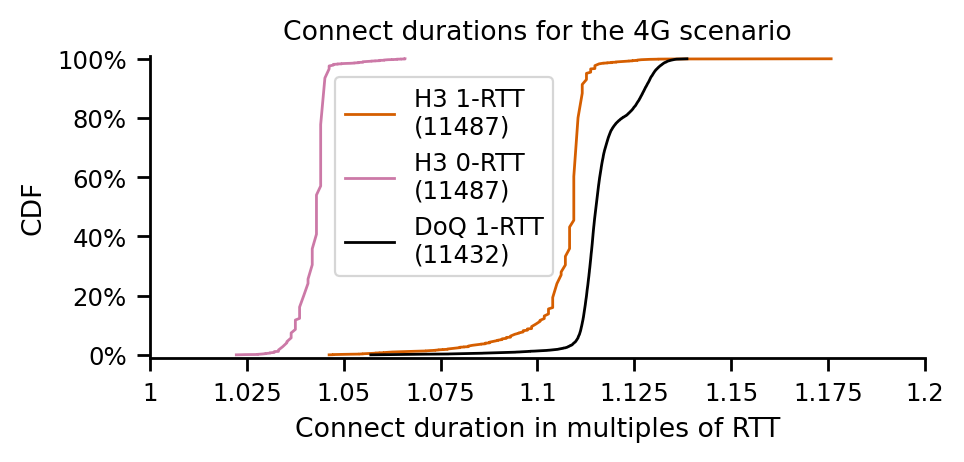

H3 1-RTT
count    11486.000000
mean         1.114292
std          0.007527
min          1.063116
10%          1.108090
20%          1.111918
25%          1.113831
30%          1.114788
40%          1.115745
50%          1.116702
60%          1.116702
70%          1.117659
75%          1.117659
80%          1.117659
90%          1.118616
100%         1.179858
max          1.179858
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    11486.000000
mean         1.057835
std          0.003189
min          1.041107
10%          1.053547
20%          1.055461
25%          1.056417
30%          1.057374
40%          1.058331
50%          1.058331
60%          1.059288
70%          1.059288
75%          1.059288
80%          1.059288
90%          1.060245
100%         1.091823
max          1.091823
Name: connect_in_rtt, dtype: float64
DoQ 1-RTT
count    11486.000000
mean         1.122988
std          0.006348
min          1.071521
10%          1.118426
20%          1.119458
25%          1.119

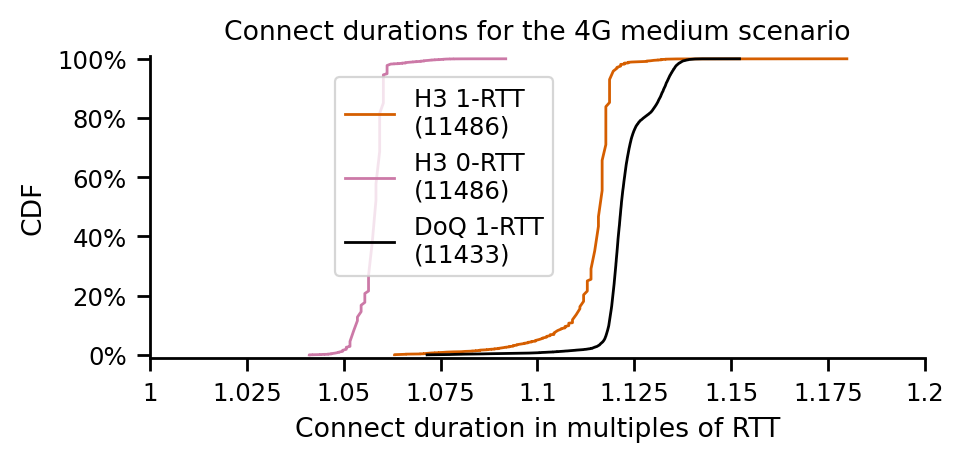

In [361]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
    line_order = ['H3 1-RTT', 'H3 0-RTT', 'DoQ 1-RTT']
    colors = dict(zip(line_order, ['C6','C7','C0']))
    markers = dict(zip(line_order, ['h','d','o']))

    lnwidth = 1
    mrksize = 0
    log=False
    for experiment in line_order:
            if 'H3' in experiment:
                df_tmp = df_plt[(df_plt.h3_description == experiment)]
                if len(df_tmp['connect_in_rtt']) == 0:
                    continue
                print(experiment)
                print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['connect_in_rtt'])
                dfplt.plot(ax=ax, label=experiment+"\n("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            else:
                df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == experiment_type]
                print(experiment)
                print(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration_in_rtt'])
                dfplt.plot(ax=ax, label=experiment+"\n("+str(len(dfplt))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect durations for the '+map_techs_to_proper_name[experiment_type]+' scenario')

    ax.set_xlabel('Connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.01,1.01)

    if experiment_type == 'fiber':
        loc = "center"
        ax.legend(loc=loc, bbox_to_anchor=(.42, .58))
        ax.set_xlim(1,2)
    elif '4g' in experiment_type:
        loc="center"
        ax.legend(loc=loc, bbox_to_anchor=(.38, .6))
        ax.set_xlim(1,1.2)
    else:
        loc="best"
        ax.legend(loc=loc)
        ax.set_xlim(1,2)

    if log:
        fig.savefig('figures/cdf-quic-h3-doq-handshakes-in-rtt-'+experiment_type+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/cdf-quic-h3-doq-handshakes-in-rtt-'+experiment_type+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

H3 1-RTT
count    11488.000000
mean        65.234227
std          0.786363
min         60.100000
10%         64.500000
20%         65.000000
25%         65.100000
30%         65.200000
40%         65.400000
50%         65.500000
60%         65.500000
70%         65.600000
75%         65.600000
80%         65.600000
90%         65.700000
100%        72.500000
max         72.500000
Name: connect_duration, dtype: float64
H3 0-RTT
count    11488.000000
mean        58.811621
std          0.340783
min         57.000000
10%         58.400000
20%         58.600000
25%         58.700000
30%         58.800000
40%         58.800000
50%         58.900000
60%         58.900000
70%         59.000000
75%         59.000000
80%         59.000000
90%         59.100000
100%        61.100000
max         61.100000
Name: connect_duration, dtype: float64
DoQ 1-RTT
count    11488.000000
mean        65.861023
std          0.640638
min         60.713128
10%         65.455010
20%         65.542245
25%         65

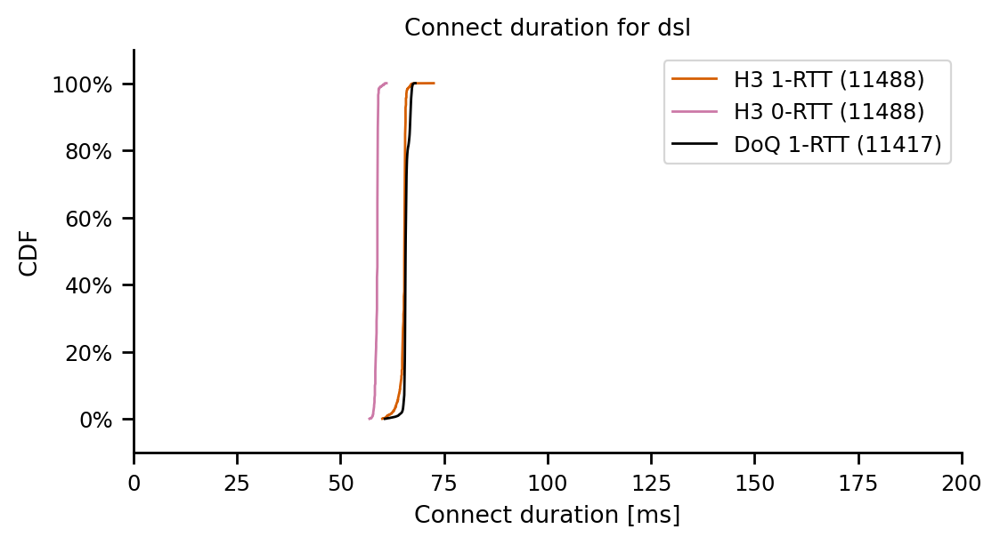

H3 1-RTT
count    11486.000000
mean        34.998294
std          0.941621
min         29.700000
10%         33.900000
20%         34.800000
25%         34.900000
30%         35.000000
40%         35.200000
50%         35.300000
60%         35.400000
70%         35.500000
75%         35.500000
80%         35.500000
90%         35.600000
100%        38.200000
max         38.200000
Name: connect_duration, dtype: float64
H3 0-RTT
count    11486.000000
mean        29.318449
std          0.349202
min         27.500000
10%         28.800000
20%         29.100000
25%         29.200000
30%         29.300000
40%         29.300000
50%         29.400000
60%         29.400000
70%         29.500000
75%         29.500000
80%         29.500000
90%         29.600000
100%        31.700000
max         31.700000
Name: connect_duration, dtype: float64
DoQ 1-RTT
count    11486.000000
mean        36.005296
std          0.789618
min         30.312817
10%         35.441300
20%         35.679511
25%         35

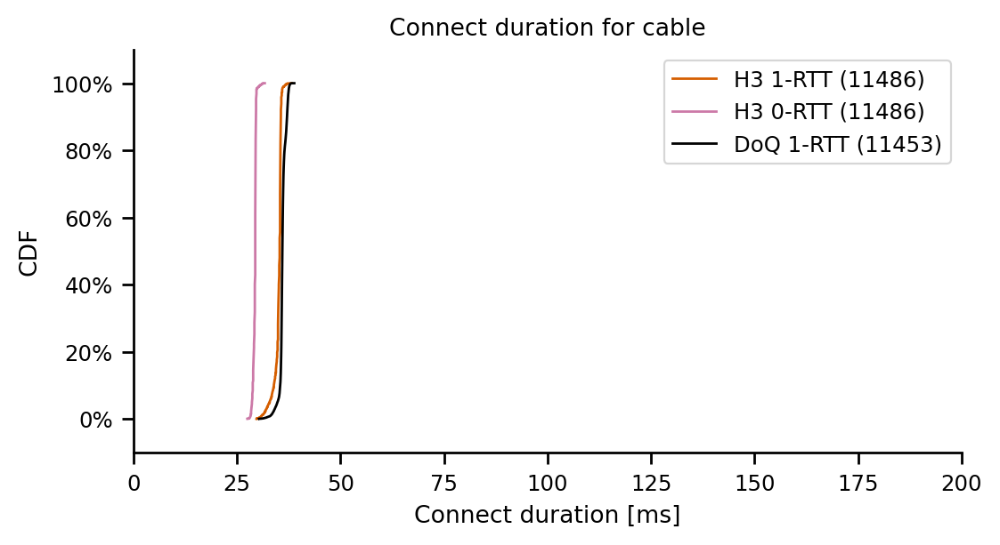

H3 1-RTT
count    11489.000000
mean        23.426982
std          1.131737
min         18.500000
10%         22.100000
20%         23.100000
25%         23.200000
30%         23.400000
40%         23.600000
50%         23.800000
60%         23.900000
70%         24.000000
75%         24.100000
80%         24.100000
90%         24.300000
100%        29.600000
max         29.600000
Name: connect_duration, dtype: float64
H3 0-RTT
count    11489.000000
mean        18.137349
std          0.396828
min         16.500000
10%         17.600000
20%         17.900000
25%         18.000000
30%         18.100000
40%         18.200000
50%         18.200000
60%         18.300000
70%         18.300000
75%         18.300000
80%         18.400000
90%         18.400000
100%        25.000000
max         25.000000
Name: connect_duration, dtype: float64
DoQ 1-RTT
count    11489.000000
mean        24.627767
std          1.043629
min         18.953818
10%         23.935609
20%         24.348323
25%         24

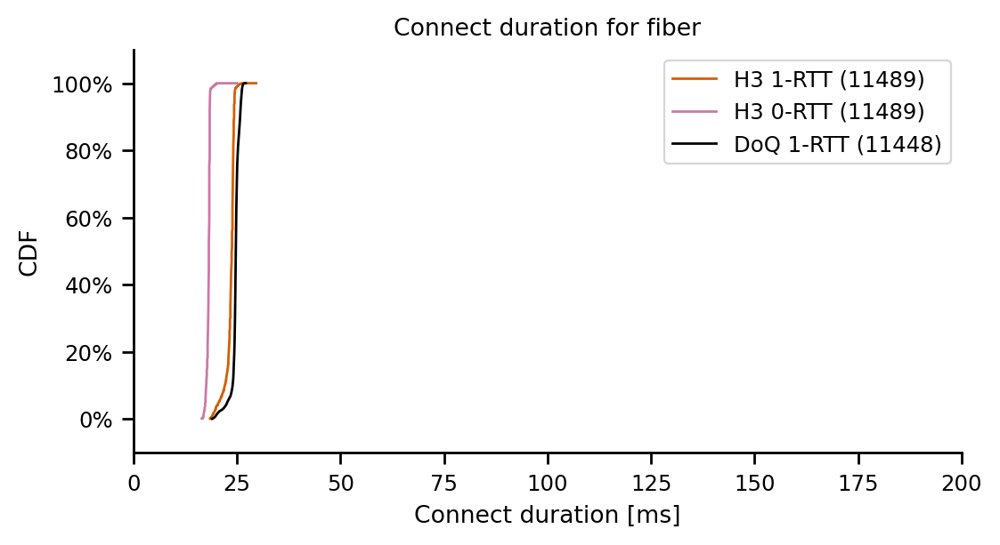

H3 1-RTT
count    11487.000000
mean       101.669130
std          0.806873
min         96.100000
10%        101.000000
20%        101.500000
25%        101.600000
30%        101.700000
40%        101.800000
50%        101.900000
60%        101.900000
70%        102.000000
75%        102.000000
80%        102.000000
90%        102.100000
100%       108.000000
max        108.000000
Name: connect_duration, dtype: float64
H3 0-RTT
count    11487.000000
mean        95.764299
std          0.341042
min         93.900000
10%         95.300000
20%         95.500000
25%         95.600000
30%         95.700000
40%         95.800000
50%         95.800000
60%         95.900000
70%         95.900000
75%         95.900000
80%         96.000000
90%         96.000000
100%        97.900000
max         97.900000
Name: connect_duration, dtype: float64
DoQ 1-RTT
count    11487.000000
mean       102.575571
std          0.661788
min         97.088394
10%        102.089856
20%        102.201058
25%        102

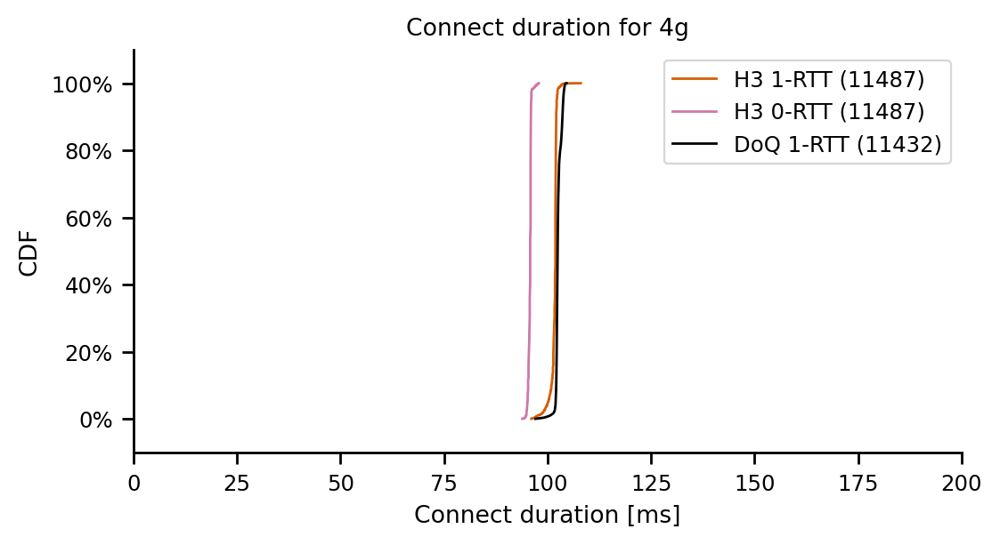

H3 1-RTT
count    11486.000000
mean       116.448119
std          0.786591
min        111.100000
10%        115.800000
20%        116.200000
25%        116.400000
30%        116.500000
40%        116.600000
50%        116.700000
60%        116.700000
70%        116.800000
75%        116.800000
80%        116.800000
90%        116.900000
100%       123.300000
max        123.300000
Name: connect_duration, dtype: float64
H3 0-RTT
count    11486.000000
mean       110.548189
std          0.333243
min        108.800000
10%        110.100000
20%        110.300000
25%        110.400000
30%        110.500000
40%        110.600000
50%        110.600000
60%        110.700000
70%        110.700000
75%        110.700000
80%        110.700000
90%        110.800000
100%       114.100000
max        114.100000
Name: connect_duration, dtype: float64
DoQ 1-RTT
count    11486.000000
mean       117.356927
std          0.663363
min        111.978338
10%        116.880184
20%        116.988020
25%        117

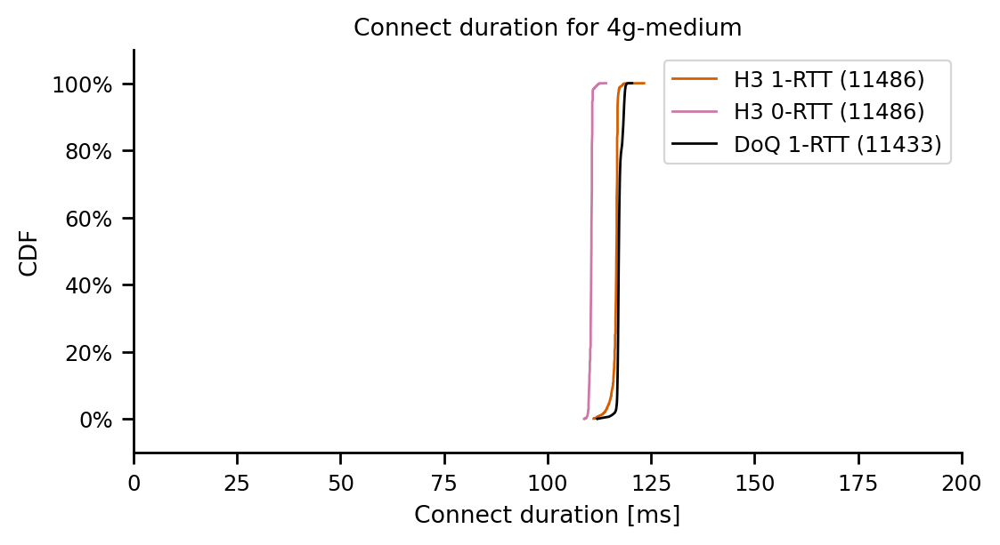

In [213]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT', 'DoQ 1-RTT']
    colors = dict(zip(line_order, ['C6','C7','C0']))
    markers = dict(zip(line_order, ['h','d','o']))

    lnwidth = 1
    mrksize = 0
    log=False
    for experiment in line_order:
            if 'H3' in experiment:
                df_tmp = df_plt[(df_plt.h3_description == experiment)]
                if len(df_tmp['connect_duration']) == 0:
                    continue
                print(experiment)
                print(df_tmp['connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

                dfplt = make_cdf(df_tmp['connect_duration'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            else:
                df_tmp = df_handshake_durations[df_handshake_durations.experiment_type == experiment_type]
                print(experiment)
                print(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration'])
                dfplt.plot(ax=ax, label=experiment+" ("+str(len(dfplt))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
            

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Connect duration for '+experiment_type)

    ax.set_xlabel('Connect duration [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(0,200)


    ax.legend()

    if log:
        fig.savefig('figures/cdf-quic-h3-doq-handshakes-'+experiment_type+'-log.pdf', format='pdf', bbox_inches='tight')
    else:
        fig.savefig('figures/cdf-quic-h3-doq-handshakes-'+experiment_type+'.pdf', format='pdf', bbox_inches='tight')
    plt.show()

H3 1-RTT
count    57436.000000
mean         1.347556
std          0.207848
min          1.046245
10%          1.108301
20%          1.111567
25%          1.113831
30%          1.116702
40%          1.179665
50%          1.398121
60%          1.417981
70%          1.541556
75%          1.546278
80%          1.548638
90%          1.611686
100%         2.004449
max          2.004449
Name: connect_in_rtt, dtype: float64
H3 0-RTT
count    57436.000000
mean         1.176316
std          0.127069
min          1.022293
10%          1.042979
20%          1.050676
25%          1.056417
30%          1.058331
40%          1.092282
50%          1.167749
60%          1.175693
70%          1.232466
75%          1.239237
80%          1.354358
90%          1.390470
100%         1.692947
max          1.692947
Name: connect_in_rtt, dtype: float64
DoQ 1-RTT
count    57436.000000
mean         1.378493
std          0.226944
min          1.057005
10%          1.114875
20%          1.119705
25%          1.121

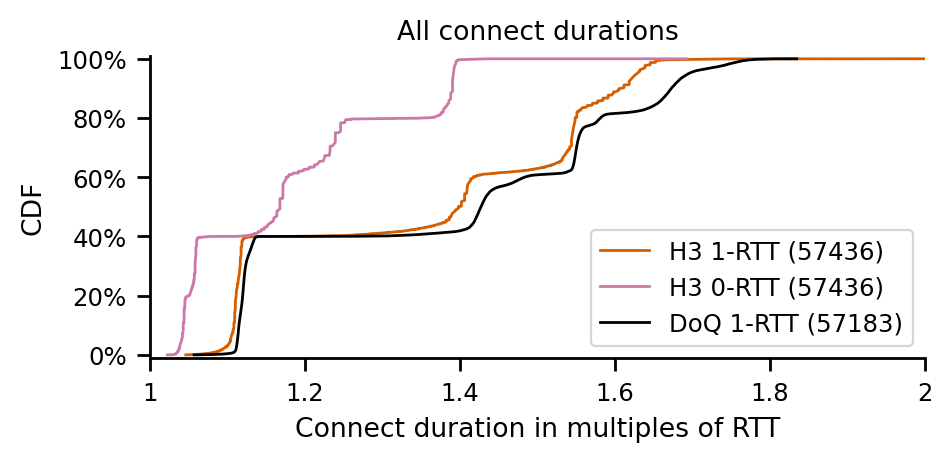

In [347]:

df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(5,2))
line_order = ['H3 1-RTT', 'H3 0-RTT', 'DoQ 1-RTT']
colors = dict(zip(line_order, ['C6','C7','C0']))
markers = dict(zip(line_order, ['h','d','o']))

lnwidth = 1
mrksize = 0
log=False
for experiment in line_order:
        if 'H3' in experiment:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['connect_in_rtt']) == 0:
                continue
            print(experiment)
            print(df_tmp['connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
        else:
            df_tmp = df_handshake_durations
            print(experiment)
            print(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
            dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(dfplt))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)


ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('All connect durations')

ax.set_xlabel('Connect duration in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.01,1.01)
ax.set_xlim(1,2)


ax.legend()

if log:
    fig.savefig('figures/cdf-quic-h3-doq-handshakes-in-rtt-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-quic-h3-doq-handshakes-in-rtt.pdf', format='pdf', bbox_inches='tight')
plt.show()

H3 1-RTT
count    57436.000000
mean        68.353475
std         36.243137
min         18.500000
10%         23.800000
20%         26.600000
25%         34.900000
30%         35.300000
40%         38.200000
50%         65.500000
60%         71.000000
70%        101.900000
75%        102.000000
80%        107.200000
90%        116.700000
100%       123.300000
max        123.300000
Name: connect_duration, dtype: float64
H3 0-RTT
count    57436.000000
mean        62.514113
std         36.051284
min         16.500000
10%         18.200000
20%         24.600000
25%         29.200000
30%         29.400000
40%         31.700000
50%         58.900000
60%         60.900000
70%         95.800000
75%         95.900000
80%         97.900000
90%        110.600000
100%       114.100000
max        114.100000
Name: connect_duration, dtype: float64
DoQ 1-RTT
count    57436.000000
mean        69.283444
std         36.154542
min         18.953818
10%         24.702073
20%         26.894748
25%         35

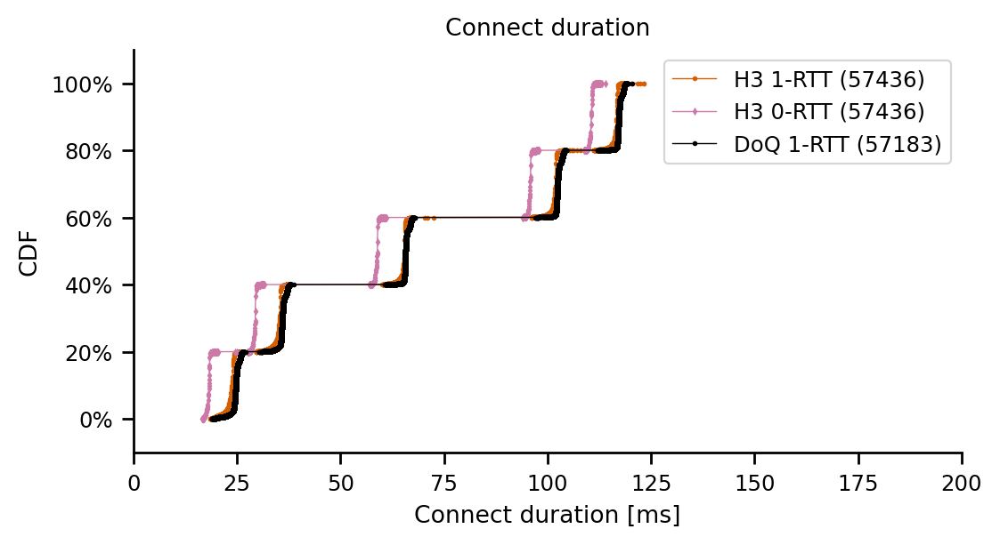

In [131]:

df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT', 'DoQ 1-RTT']
colors = dict(zip(line_order, ['C6','C7','C0']))
markers = dict(zip(line_order, ['h','d','o']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        if 'H3' in experiment:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['connect_duration']) == 0:
                continue
            print(experiment)
            print(df_tmp['connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['connect_duration'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)
        else:
            df_tmp = df_handshake_durations
            print(experiment)
            print(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
            dfplt = make_cdf(df_tmp[df_tmp.transport_protocol == 'DoQ']['duration'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(dfplt))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)


ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Connect duration')

ax.set_xlabel('Connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0,200)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

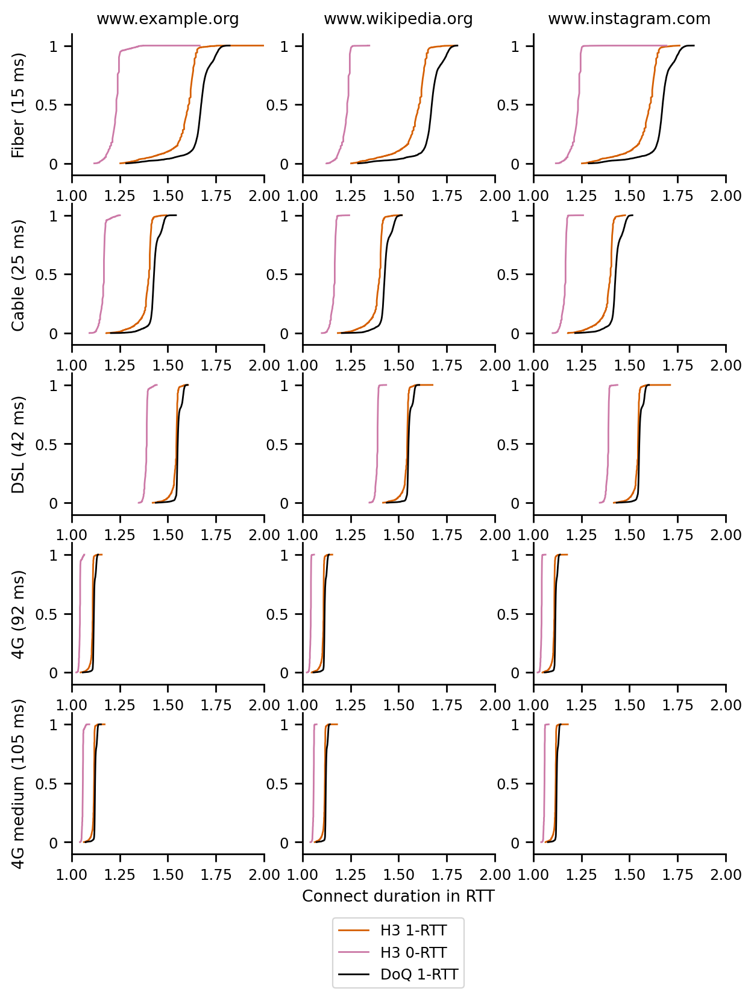

In [130]:
metrics_for_single_cdf = ['H3 1-RTT', 'H3 0-RTT', 'DoQ 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C6','C7','C0']))
markers = dict(zip(metrics_for_single_cdf, ['h','d','o']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            if 'H3' in metric:
                s_plot = make_cdf(df_h3_connect_times[(df_h3_connect_times['website'] == website) & (df_h3_connect_times['experiment_type'] == tech) & (df_h3_connect_times['h3_description'] == metric)]['connect_in_rtt'])
                s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)
            else:
                s_plot = make_cdf(df_handshake_durations[(df_handshake_durations['website'] == website) & (df_handshake_durations['experiment_type'] == tech) & (df_handshake_durations['transport_protocol'] == 'DoQ')]['duration_in_rtt'])
                s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        #ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        #ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        #ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        #ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Connect duration in RTT')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(1, 2)
#fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
#plt.savefig("figures/fcp-doq-baseline-grid.pdf", bbox_inches='tight')

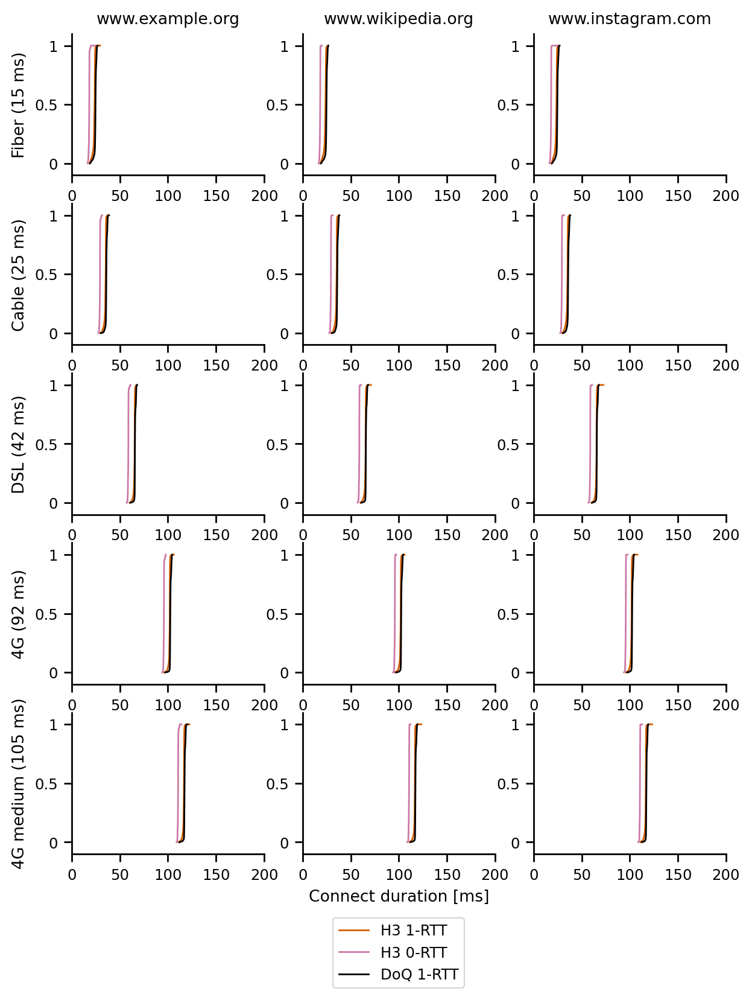

In [129]:
metrics_for_single_cdf = ['H3 1-RTT', 'H3 0-RTT', 'DoQ 1-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C6','C7','C0']))
markers = dict(zip(metrics_for_single_cdf, ['h','d','o']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9))#, sharex='all')#, sharey='all')
#fig.suptitle('DoX comparison with DoUDP + H3 1-RTT baseline')
for i, website in enumerate(website_columns):
    for j, tech in enumerate(access_tech_rows):
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            if 'H3' in metric:
                s_plot = make_cdf(df_h3_connect_times[(df_h3_connect_times['website'] == website) & (df_h3_connect_times['experiment_type'] == tech) & (df_h3_connect_times['h3_description'] == metric)]['connect_duration'])
                s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)
            else:
                s_plot = make_cdf(df_handshake_durations[(df_handshake_durations['website'] == website) & (df_handshake_durations['experiment_type'] == tech) & (df_handshake_durations['transport_protocol'] == 'DoQ')]['duration'])
                s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        #ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        #ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        #ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        #ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Connect duration [ms]')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        ax.set_xlim(0, 200)
#fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
#plt.savefig("figures/fcp-doq-baseline-grid.pdf", bbox_inches='tight')

count    7911.000000
mean       67.920743
std        36.229730
min        18.400000
10%        23.400000
20%        29.600000
25%        34.500000
30%        34.900000
40%        36.700000
50%        65.000000
60%        66.700000
70%       101.500000
75%       101.600000
80%       103.100000
90%       116.200000
100%      117.900000
max       117.900000
Name: secure_connect_duration, dtype: float64
count    7911.000000
mean       62.112476
std        36.040311
min        16.200000
10%        17.800000
20%        28.000000
25%        28.800000
30%        29.000000
40%        30.900000
50%        58.500000
60%        60.300000
70%        95.400000
75%        95.500000
80%        97.300000
90%       110.200000
100%      112.000000
max       112.000000
Name: secure_connect_duration, dtype: float64


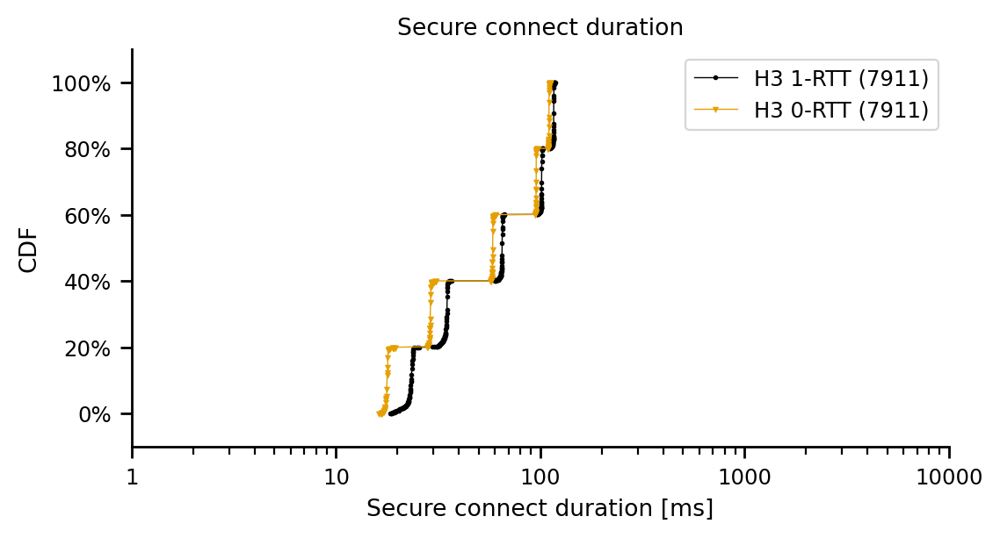

In [930]:
df_plt = df_dns_and_h3
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=True
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['secure_connect_duration']) == 0:
            continue
        print(df_tmp['secure_connect_duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['secure_connect_duration'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Secure connect duration')

ax.set_xlabel('Secure connect duration [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,10000)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    7911.000000
mean        1.335006
std         0.200489
min         1.048422
10%         1.103946
20%         1.106124
25%         1.110961
30%         1.111918
40%         1.175693
50%         1.382233
60%         1.398121
70%         1.532113
75%         1.534474
80%         1.537196
90%         1.584599
100%        1.720034
max         1.720034
Name: secure_connect_in_rtt, dtype: float64
count    7911.000000
mean        1.164716
std         0.123755
min         1.028826
10%         1.038624
20%         1.047805
25%         1.053547
30%         1.054504
40%         1.097030
50%         1.151861
60%         1.159805
70%         1.205378
75%         1.212150
80%         1.340894
90%         1.381027
100%        1.423520
max         1.423520
Name: secure_connect_in_rtt, dtype: float64


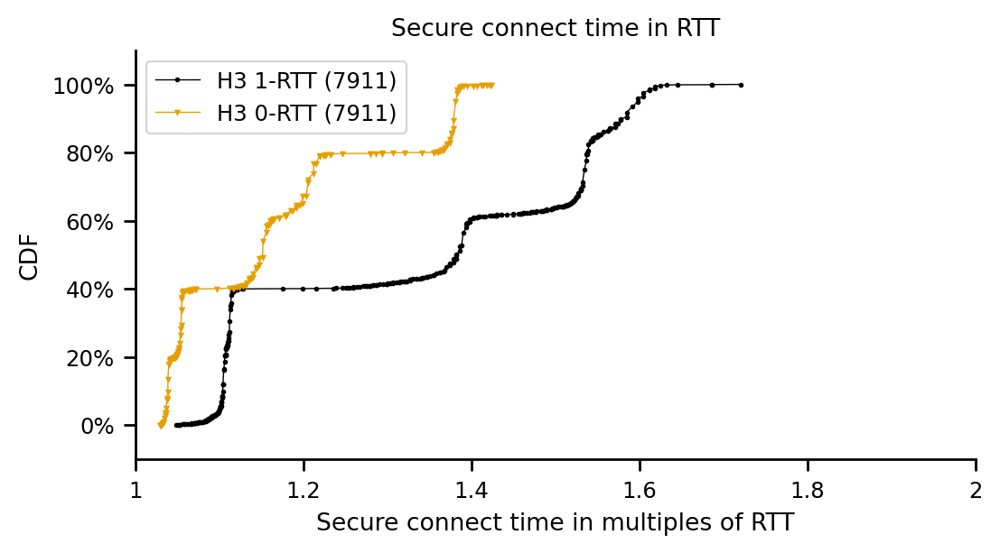

In [931]:
df_plt = df_h3_connect_times
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

lnwidth = 0.5
mrksize = 1
log=False
for experiment in line_order:
        df_tmp = df_plt[(df_plt.h3_description == experiment)]
        if len(df_tmp['secure_connect_in_rtt']) == 0:
            continue
        print(df_tmp['secure_connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['secure_connect_in_rtt'])
        dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Secure connect time in RTT')

ax.set_xlabel('Secure connect time in multiples of RTT')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(1,2)


ax.legend()

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

count    1584.000000
mean        1.530097
std         0.017697
min         1.416438
10%         1.515588
20%         1.527392
25%         1.529753
30%         1.532113
40%         1.534474
50%         1.534474
60%         1.536835
70%         1.536835
75%         1.536835
80%         1.539196
90%         1.540848
100%        1.574606
max         1.574606
Name: secure_connect_in_rtt, dtype: float64
count    1584.000000
mean        1.379104
std         0.007468
min         1.340894
10%         1.371584
20%         1.373944
25%         1.376305
30%         1.378666
40%         1.378666
50%         1.381027
60%         1.381027
70%         1.381027
75%         1.381027
80%         1.383387
90%         1.383387
100%        1.423520
max         1.423520
Name: secure_connect_in_rtt, dtype: float64


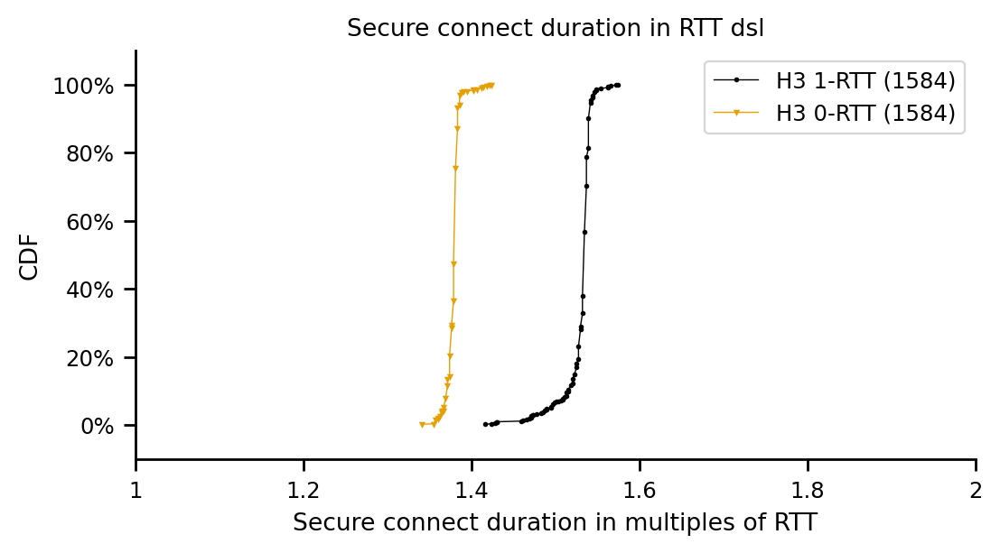

count    1584.000000
mean        1.373748
std         0.034318
min         1.175693
10%         1.326626
20%         1.362373
25%         1.370317
30%         1.374289
40%         1.382233
50%         1.386205
60%         1.390177
70%         1.390177
75%         1.390177
80%         1.394149
90%         1.398121
100%        1.457700
max         1.457700
Name: secure_connect_in_rtt, dtype: float64
count    1584.000000
mean        1.149258
std         0.012236
min         1.112142
10%         1.135973
20%         1.139945
25%         1.143917
30%         1.147889
40%         1.147889
50%         1.151861
60%         1.151861
70%         1.155833
75%         1.155833
80%         1.155833
90%         1.155833
100%        1.227328
max         1.227328
Name: secure_connect_in_rtt, dtype: float64


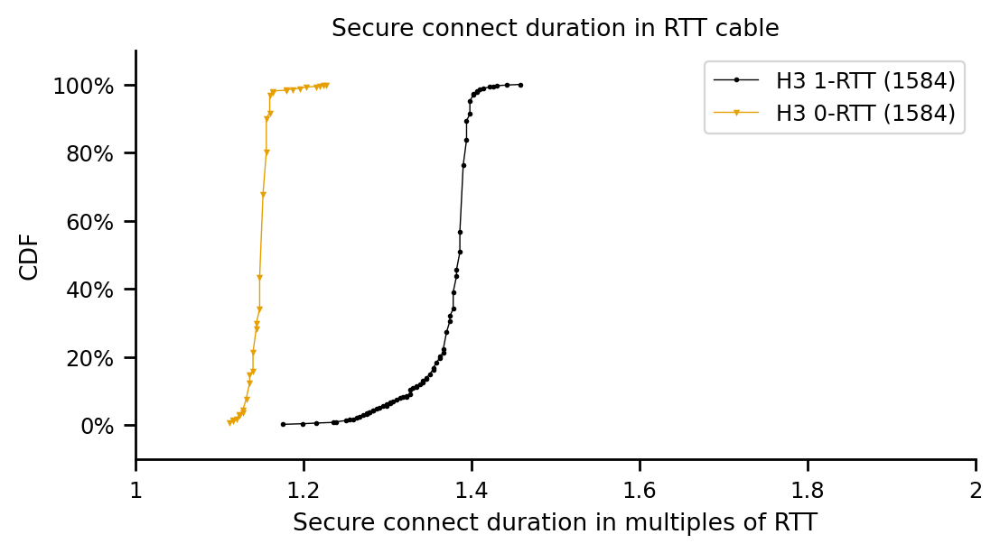

count    1581.000000
mean        1.558347
std         0.072323
min         1.246009
10%         1.476250
20%         1.537196
25%         1.550740
30%         1.557511
40%         1.571055
50%         1.584599
60%         1.591370
70%         1.598142
75%         1.598142
80%         1.604914
90%         1.611686
100%        1.720034
max         1.720034
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.202526
std         0.021061
min         1.097030
10%         1.178291
20%         1.191835
25%         1.198607
30%         1.198607
40%         1.205378
50%         1.205378
60%         1.205378
70%         1.212150
75%         1.212150
80%         1.212150
90%         1.218922
100%        1.320499
max         1.320499
Name: secure_connect_in_rtt, dtype: float64


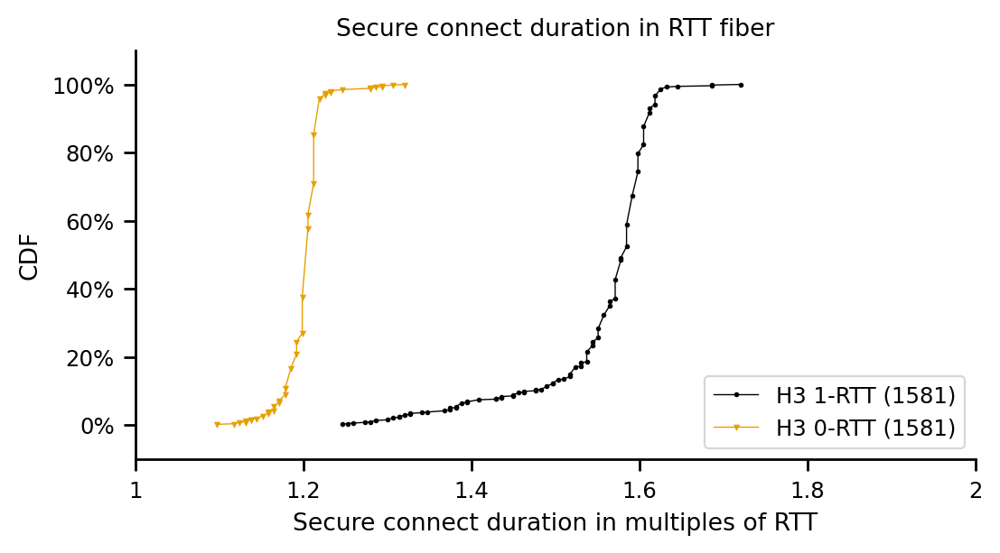

count    1581.000000
mean        1.102184
std         0.008547
min         1.048422
10%         1.096325
20%         1.101769
25%         1.102857
30%         1.102857
40%         1.103946
50%         1.105035
60%         1.105035
70%         1.106124
75%         1.106124
80%         1.106124
90%         1.107212
100%        1.122454
max         1.122454
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.038109
std         0.002746
min         1.028826
10%         1.034269
20%         1.036446
25%         1.036446
30%         1.037535
40%         1.038624
50%         1.038624
60%         1.038624
70%         1.039713
75%         1.039713
80%         1.039713
90%         1.040801
100%        1.059309
max         1.059309
Name: secure_connect_in_rtt, dtype: float64


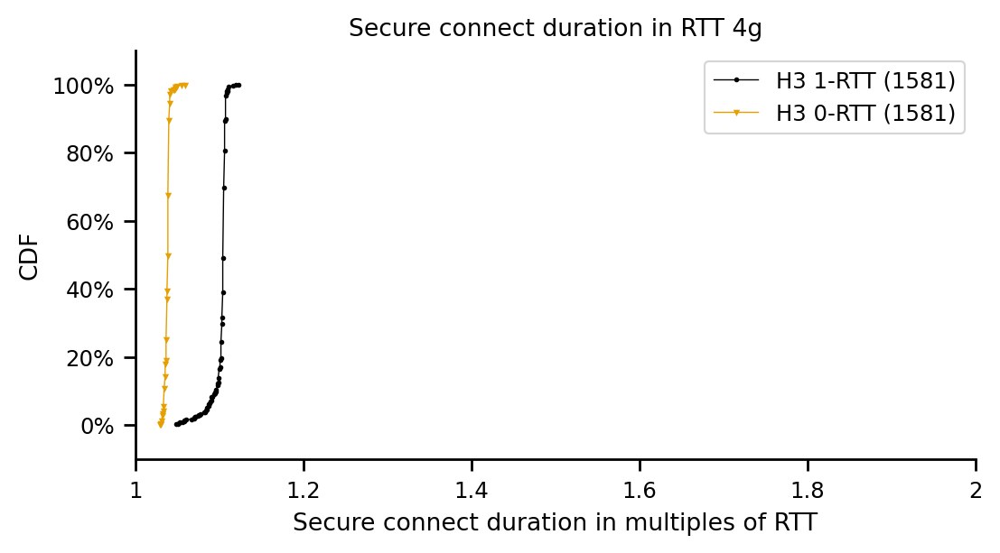

count    1581.000000
mean        1.110209
std         0.007443
min         1.062159
10%         1.103306
20%         1.110004
25%         1.110961
30%         1.110961
40%         1.111918
50%         1.111918
60%         1.112875
70%         1.112875
75%         1.112875
80%         1.113831
90%         1.113831
100%        1.128185
max         1.128185
Name: secure_connect_in_rtt, dtype: float64
count    1581.000000
mean        1.054204
std         0.002814
min         1.040150
10%         1.051633
20%         1.052590
25%         1.053547
30%         1.053547
40%         1.053547
50%         1.054504
60%         1.054504
70%         1.054504
75%         1.055461
80%         1.055461
90%         1.056417
100%        1.071728
max         1.071728
Name: secure_connect_in_rtt, dtype: float64


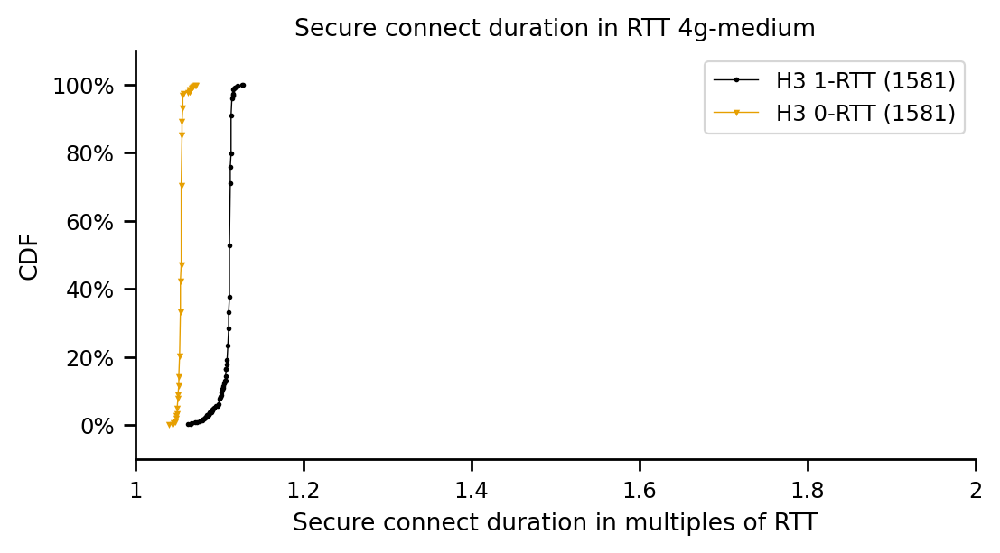

In [932]:
for experiment_type in df_h3_connect_times.experiment_type.unique():
    df_plt = df_h3_connect_times[df_h3_connect_times.experiment_type == experiment_type]
    fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
    line_order = ['H3 1-RTT', 'H3 0-RTT']
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))

    lnwidth = 0.5
    mrksize = 1
    log=False
    for experiment in line_order:
            df_tmp = df_plt[(df_plt.h3_description == experiment)]
            if len(df_tmp['secure_connect_in_rtt']) == 0:
                continue
            print(df_tmp['secure_connect_in_rtt'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

            dfplt = make_cdf(df_tmp['secure_connect_in_rtt'])
            dfplt.plot(ax=ax, label=experiment+" ("+str(len(df_tmp))+")", marker=markers[experiment], markersize=mrksize, drawstyle="default", color=colors[experiment], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Secure connect duration in RTT '+experiment_type)

    ax.set_xlabel('Secure connect duration in multiples of RTT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim(1,2)


    ax.legend()

    #if log:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
    #else:
    #    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [243]:
df_dns_and_h3.dtypes

msm_id                                object
connectEnd                           float64
connectStart                         float64
domComplete                          float64
domContentLoadedEventEnd             float64
domContentLoadedEventStart           float64
domInteractive                       float64
domainLookupEnd                      float64
domainLookupStart                    float64
duration                             float64
encodedBodySize                        int64
decodedBodySize                        int64
transferSize                           int64
fetchStart                           float64
loadEventEnd                         float64
loadEventStart                       float64
requestStart                         float64
responseEnd                          float64
responseStart                        float64
secureConnectionStart                float64
startTime                            float64
firstPaint                           float64
firstConte

In [244]:
df_h3_non_connect_times = df_dns_and_h3[['experiment_type', 'h3_description', 'loadEventStart', 'responseEnd', 'msm_id', 'website']].copy()
df_h3_non_connect_times = df_h3_non_connect_times.drop_duplicates()
df_h3_non_connect_times['rtt'] = 0
df_h3_non_connect_times['rtt'] = np.where(df_h3_non_connect_times['experiment_type'] == 'dsl', 42.35979, df_h3_non_connect_times['rtt'])
df_h3_non_connect_times['rtt'] = np.where(df_h3_non_connect_times['experiment_type'] == 'cable', 25.17665, df_h3_non_connect_times['rtt'])
df_h3_non_connect_times['rtt'] = np.where(df_h3_non_connect_times['experiment_type'] == 'fiber', 14.767147, df_h3_non_connect_times['rtt'])
df_h3_non_connect_times['rtt'] = np.where(df_h3_non_connect_times['experiment_type'] == '4g', 91.85231065904635, df_h3_non_connect_times['rtt'])
df_h3_non_connect_times['rtt'] = np.where(df_h3_non_connect_times['experiment_type'] == '4g-medium', 104.5041425140391, df_h3_non_connect_times['rtt'])
df_h3_non_connect_times['render_duration'] = df_h3_non_connect_times['loadEventStart'] - df_h3_non_connect_times['responseEnd']


In [245]:
df_h3_non_connect_times

,experiment_type,h3_description,loadEventStart,responseEnd,msm_id,website,rtt,render_duration
0,dsl,H3 1-RTT,192.6,165.9,4e1d3bd9-a631-401d-a64e-17db3cac488f,www.example.org,42.359790,26.7
3,dsl,H3 0-RTT,180.9,156.2,4e1d3bd9-a631-401d-a64e-17db3cac488f,www.example.org,42.359790,24.7
6,cable,H3 1-RTT,149.5,116.1,19658249-cecb-4294-b691-a3f261950170,www.example.org,25.176650,33.4
9,cable,H3 0-RTT,136.4,103.6,19658249-cecb-4294-b691-a3f261950170,www.example.org,25.176650,32.8
12,fiber,H3 1-RTT,124.9,95.1,e814707b-5c1e-425c-b47e-2ab3de1b0248,www.example.org,14.767147,29.8
...,...,...,...,...,...,...,...,...
344601,fiber,H3 0-RTT,557.1,89.5,cec63e72-4b16-47b3-ad0f-125082904382,www.wikipedia.org,14.767147,467.6
344604,4g,H3 1-RTT,790.3,269.4,9507819c-8e81-4b4a-8ad6-5e96e291ecc9,www.wikipedia.org,91.852311,520.9
344607,4g,H3 0-RTT,782.4,253.2,9507819c-8e81-4b4a-8ad6-5e96e291ecc9,www.wikipedia.org,91.852311,529.2
344610,4g-medium,H3 1-RTT,847.9,298.8,6a2d35e4-3fa4-43ba-8eb3-7f16608c5b4e,www.wikipedia.org,104.504143,549.1


www.example.org
fiber
cable
dsl
4g
4g-medium
www.wikipedia.org
fiber
cable
dsl
4g
4g-medium
www.instagram.com
fiber
cable
dsl
4g
4g-medium


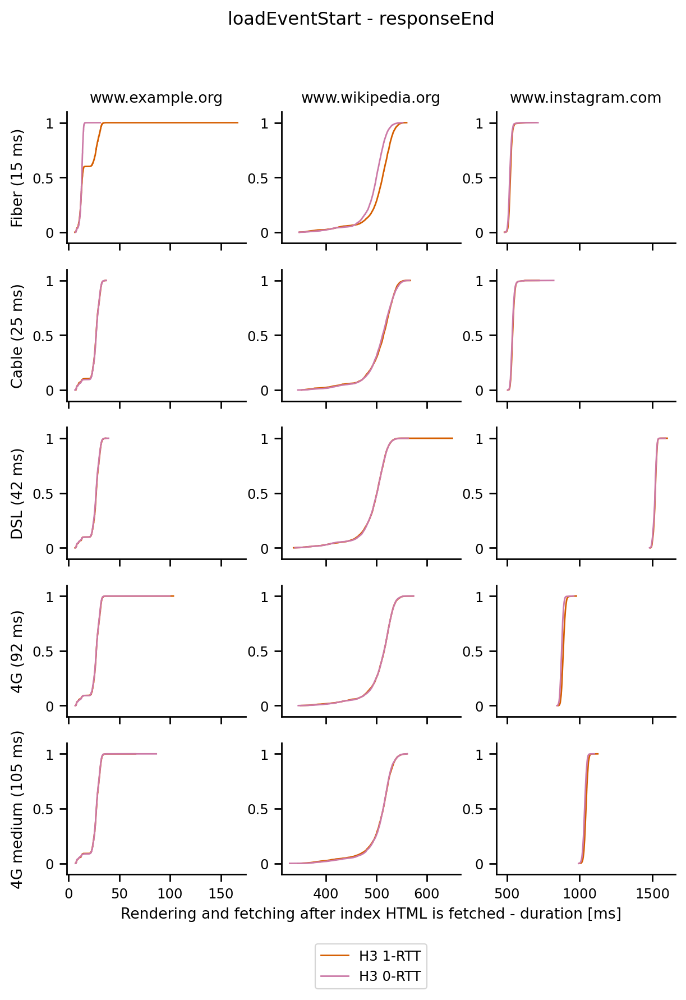

In [254]:
metrics_for_single_cdf = ['H3 1-RTT', 'H3 0-RTT']
colors = dict(zip(metrics_for_single_cdf, ['C6','C7','C0']))
markers = dict(zip(metrics_for_single_cdf, ['h','d','o']))
website_columns = ['www.example.org', 'www.wikipedia.org', 'www.instagram.com']
access_tech_rows = ['fiber', 'cable', 'dsl', '4g', '4g-medium']
lnwidth = 1
mrksize = 0
access_tech_rows_descr_mapping = {'4g-medium':'4G medium (105 ms)', '4g':'4G (92 ms)', 'dsl':'DSL (42 ms)', 'cable':'Cable (25 ms)', 'fiber':'Fiber (15 ms)'}
fig, axs = plt.subplots(len(access_tech_rows), len(website_columns), figsize=(7,9), sharex='col')#, sharey='all')
fig.suptitle('loadEventStart - responseEnd')
for i, website in enumerate(website_columns):
    print(website)
    for j, tech in enumerate(access_tech_rows):
        print(tech)
        ax = axs[j, i]
        for metric in metrics_for_single_cdf:
            s_plot = make_cdf(df_h3_non_connect_times[(df_h3_non_connect_times['website'] == website) & (df_h3_non_connect_times['experiment_type'] == tech) & (df_h3_non_connect_times['h3_description'] == metric)]['render_duration'])
            s_plot.plot(ax=ax, label=metric, marker=markers[metric], markersize=mrksize, drawstyle="default", color=colors[metric], linestyle='-', linewidth=lnwidth)

        #ax.axvline(x=0, color='gray', linestyle='--')

        ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.spines['bottom'].set_position(('axes', -0.0))
        ax.spines['left'].set_position(('axes', -0.0))
        #if log:
        #    ax.set_xscale('log')

        #ax.yaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())
        #ax.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator())

        ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
        ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
        #ax.xaxis.set_major_formatter(ticker.PercentFormatter())
        #ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

        #ax.tick_params(axis='x', which='major', labelsize=8)
        ax.xaxis.set_tick_params(labelbottom=True, which='both')

        if j == 0:
            ax.set_title(website)
        if j == len(access_tech_rows)-1:
            if i == math.floor(len(website_columns)/2):
                ax.set_xlabel('Rendering and fetching after index HTML is fetched - duration [ms]')
                ax.legend(loc='center', bbox_to_anchor=(0.5, -0.7))
        if i == 0:
            ax.set_ylabel(access_tech_rows_descr_mapping[tech])
        ax.set_ylim(-0.1,1.1)
        #ax.set_xlim(0)
#fig.suptitle('Relative increase over DoUDP + H3 1-RTT', y=0.93)
plt.show()
#plt.savefig("figures/fcp-doq-baseline-grid.pdf", bbox_inches='tight')

In [265]:
df_web_perf[df_web_perf.website == 'www.wikipedia.org'].encodedBodySize.value_counts()

18353    38294
Name: encodedBodySize, dtype: int64

In [268]:
df_web_perf[df_web_perf.website == 'www.wikipedia.org'].transferSize.value_counts()

18653    38294
Name: transferSize, dtype: int64

In [266]:
df_web_perf[df_web_perf.website == 'www.wikipedia.org'].decodedBodySize.value_counts()

77070    38294
Name: decodedBodySize, dtype: int64

In [269]:
df_web_perf[df_web_perf.website == 'www.example.org'].encodedBodySize.value_counts()

1256    38308
Name: encodedBodySize, dtype: int64

In [271]:
df_web_perf[df_web_perf.website == 'www.example.org'].transferSize.value_counts()

1556    38308
Name: transferSize, dtype: int64

In [272]:
df_web_perf[df_web_perf.website == 'www.example.org'].decodedBodySize.value_counts()

1256    38308
Name: decodedBodySize, dtype: int64

In [273]:
df_web_perf[df_web_perf.website == 'www.instagram.com'].encodedBodySize.value_counts()

39358    38270
Name: encodedBodySize, dtype: int64

In [274]:
df_web_perf[df_web_perf.website == 'www.instagram.com'].transferSize.value_counts()

39658    38270
Name: transferSize, dtype: int64

In [275]:
df_web_perf[df_web_perf.website == 'www.instagram.com'].decodedBodySize.value_counts()

103098    38270
Name: decodedBodySize, dtype: int64